In [157]:
# !conda init powershell 
# !conda activate tree-mes

In [158]:
# !pip install statsmodels

In [159]:
# !pip install xgboost

In [160]:
# !pip install optuna

In [161]:
# !pip install seaborn --upgrade

In [162]:
# !pip install -U scikit-learn
# !pip install wandb
# !pip install shap
# !pip install tifffile
# !pip install imagecodecs
# !pip install numba.core
# import shap
# !pip install opencv-python
from tqdm import tqdm
import seaborn as sns
import matplotlib.pyplot as plt
import joblib

In [163]:
import pickle
import wandb
import networkx as nx

In [164]:
from os import path,listdir,mkdir,rename,chdir
import time
from datetime import datetime
import json
from math import floor
import re


In [165]:
import pandas as pd
pd.options.mode.chained_assignment = None
pd.set_option('display.max_rows', 100)
import numpy as np
import statsmodels.api as sm
from sklearn.model_selection import train_test_split,GroupShuffleSplit,GroupKFold
from sklearn.preprocessing import (MinMaxScaler,StandardScaler,PowerTransformer,
                                   PolynomialFeatures,OneHotEncoder,RobustScaler,QuantileTransformer)
from sklearn.ensemble import GradientBoostingRegressor,RandomForestRegressor
from sklearn.linear_model import LinearRegression, LassoCV,ElasticNetCV, SGDRegressor
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn import model_selection
from sklearn.model_selection import cross_val_score
from sklearn.metrics import mean_squared_error,make_scorer,mean_squared_log_error
import time
from sklearn.model_selection import KFold, cross_validate, StratifiedKFold, GroupKFold
from sklearn.pipeline import Pipeline

from xgboost import XGBRegressor
import optuna

from sklearn.decomposition import PCA

In [166]:
# from tensorflow.keras.layers import Input,LeakyReLU
# from tensorflow.keras import Model,callbacks, optimizers,regularizers
# from tensorflow.keras.layers import Dense, Dropout,BatchNormalization,Activation
# from tensorflow.keras.optimizers import Adam,RMSprop,Adadelta,Adagrad,Adamax,Nadam,Ftrl,SGD
# from tensorflow.keras.backend import clear_session
# from tensorflow.keras.models import clone_model

In [167]:
from vision.feature_extractor.feature_extractor import *

In [168]:
scalers = {"Standard":StandardScaler(),
            "MinMax":MinMaxScaler(),
            "Power":PowerTransformer(),
          "Quantile":QuantileTransformer(),
          "Robust":RobustScaler()}

### read and clean F data frame

In [169]:
f_csv_path = "/media/fruitspec-lab/easystore/JAIZED_CaraCara_151122/Summer gold experiment tree count.csv"
f_df = pd.read_csv(f_csv_path)
f_df = pd.melt(f_df,id_vars = ["Row/tree"],
               value_vars = [str(i+1) for i in range(12)],value_name = "F",var_name = "Row")
row2_fixing_bool = (f_df["Row"] == '2') & (f_df["Row/tree"] > 27)
new_2_vals =  f_df[row2_fixing_bool]["Row/tree"].apply(lambda x: x+1).values
f_df.loc[row2_fixing_bool, "Row/tree"] += 1
f_df["tree_name"] = f_df.apply(lambda x: f'R{x["Row"]}_T{x["Row/tree"]}',axis = 1)
f_df_clean = f_df[f_df["F"].notna()].reset_index()[["tree_name","F"]]
f_df_clean.to_csv("/media/fruitspec-lab/easystore/F_dfs/df_f.csv")

### concatenate all dataframes in the folder (in case we want to add training samples)

In [170]:
f_fdfs_path = "/media/fruitspec-lab/easystore/F_dfs"
for df_path in os.listdir(f_fdfs_path):
    if not df_path in ["df_f.csv", "full_df_f.csv"]:
        f_df_clean = pd.concat([f_df_clean, pd.read_csv(os.path.join(f_fdfs_path, df_path))])

### initinating relevent columns

In [171]:
np.random.seed(2)
tree_images =  {"1": {"fsi":np.random.normal(size = (50,50,3)), "rgb":np.random.normal(size = (50,50,3)),"zed":np.random.normal(size = (50,50,3)),
                     "swir_975":np.random.normal(size = (50,50,3)),"nir":np.random.normal(size = (50,50,3))},
                            "2": {"fsi":np.random.normal(size = (50,50,3)), "rgb":np.random.normal(size = (50,50,3)),"zed":np.random.normal(size = (50,50,3)),
                                 "swir_975":np.random.normal(size = (50,50,3)),"nir":np.random.normal(size = (50,50,3))}} 
tracker_results ={"1": {str(i):(tuple(np.random.random_integers(0,10,size = 2)),
                                tuple(np.random.random_integers(0,10,size = 2))) for i in range(50)},
                  "2": {str(i):(tuple(np.random.random_integers(0,10,size = 2)),
                                tuple(np.random.random_integers(0,10,size = 2))) for i in range(50)}}
tree_name = ""

/tmp/ipykernel_26736/3530563474.py:6: DeprecationWarning: This function is deprecated. Please call randint(0, 10 + 1) instead
  tracker_results ={"1": {str(i):(tuple(np.random.random_integers(0,10,size = 2)),
/tmp/ipykernel_26736/3530563474.py:7: DeprecationWarning: This function is deprecated. Please call randint(0, 10 + 1) instead
  tuple(np.random.random_integers(0,10,size = 2))) for i in range(50)},
/tmp/ipykernel_26736/3530563474.py:8: DeprecationWarning: This function is deprecated. Please call randint(0, 10 + 1) instead
  "2": {str(i):(tuple(np.random.random_integers(0,10,size = 2)),
/tmp/ipykernel_26736/3530563474.py:9: DeprecationWarning: This function is deprecated. Please call randint(0, 10 + 1) instead
  tuple(np.random.random_integers(0,10,size = 2))) for i in range(50)}}


In [172]:
phisical_features_names = init_physical_parmas([]).keys()
location_features_names = ['mst_sums_arr','mst_mean_arr','mst_skew_arr','clusters_area_mean_arr',
                         'clusters_area_med_arr','clusters_ch_area_mean_arr','clusters_ch_area_med_arr',
                         'n_clust_arr_2','n_clust_arr_4','n_clust_arr_6','n_clust_mean_arr','n_clust_med_arr']
tree_features_names = init_fruit_params([]).keys()
v_i_features = transform_to_vi_features({**get_additional_vegetation_indexes(0, 0, 0, fill=[0])}).keys()
all_cols = list(phisical_features_names) + list(location_features_names) + list(tree_features_names) + list(v_i_features)
drop_cols_vi = ["tdvi","gci","msavi2","tgi","gndvi", "gosavi", "dvi","gndvi","gdvi","gemi","lai","msr","ndre","vari",
                "grvi", "rdvi", "savi", "arvi", "ipvi", "sr","mnli", "wdrvi", "evi", "gari", "pvi", "nli"]
drop_cols = ["q1","q3","total_time","n_clust_arr_4","n_clust_arr_6","n_clust_mean_arr","n_clust_med_arr","frame",
            "avg_intens_arr"]
final_cols = list(set(all_cols) - set(drop_cols) - set(drop_cols_vi) - {f"col_skew" for col in drop_cols_vi})
drop_final = list(set(drop_cols_vi + [f"{col}_skew" for col in drop_cols_vi] + drop_cols))
drop_sides = ["B"]
drop_trees = ["R4_T2", "R4_T4"]

### load and clean training data

In [173]:
full_names_to_drop = []
hidden_range = (-0.1,2)
cv_range = (0,np.inf)
F_range = (0,2500)
fruits_exclude = ["apple"]

In [174]:
real_tree_size_path = "/media/fruitspec-lab/easystore/JAIZED_CaraCara_301122/tree_sizes.csv"
real_size_df = pd.read_csv(real_tree_size_path)

In [175]:
csv_path = "/media/fruitspec-lab/easystore/JAIZED_CaraCara_301122/plot_features_new_computer.csv"
# csv_path = [f"/media/fruitspec-lab/easystore/JAIZED_CaraCara_301122/R{i}/trees/row_features.csv" for i in range(2,8)]
# csv_path = "/media/fruitspec-lab/easystore/JAIZED_CaraCara_301122/R6/trees/row_features_h2_xonly.csv"
# csv_path = "/media/fruitspec-lab/easystore/JAIZED_CaraCara_301122/R6/trees/row_features_center_only.csv"
# TODO add F

# clean unwanted trees    
clean_set = pd.DataFrame()
if isinstance(csv_path, type(list())):
    for row_csv_path in csv_path:
        clean_set = pd.concat([clean_set,pd.read_csv(row_csv_path)],ignore_index = True)
    clean_set.reset_index(drop = True, inplace = True)
else:
    clean_set = pd.read_csv(csv_path)
df_cols = clean_set.columns
if "% hidden" in df_cols:
    clean_set = clean_set[clean_set["% hidden"] > hidden_range[0]]
    clean_set = clean_set[clean_set["% hidden"] < hidden_range[1]]
clean_set = clean_set[clean_set["cv"] > cv_range[0]]
clean_set = clean_set[clean_set["cv"] < cv_range[1]]
if "F" in df_cols:
    clean_set = clean_set[clean_set["F"] > F_range[0]]
    clean_set = clean_set[clean_set["F"] < F_range[1]]
if "fruit_type" not in df_cols:
    clean_set["fruit_type"] = "orange"
clean_set = clean_set[clean_set["fruit_type"].map(lambda x: x not in fruits_exclude)]
if "full_name" in df_cols:
    clean_set = clean_set[clean_set["full_name"].map(lambda x: x not in full_names_to_drop)]
if "Unnamed: 0" in df_cols:
    clean_set.drop("Unnamed: 0",axis = 1,inplace = True)
ohe = OneHotEncoder()
ohe_res = ohe.fit_transform(clean_set["fruit_type"].values.reshape(-1, 1)).toarray()
clean_set[ohe.categories_[0].tolist()[0]] = ohe_res

clean_set["clusters_area_mean_arr"] = clean_set["clusters_area_mean_arr"].clip(0,clean_set["clusters_area_mean_arr"].quantile(0.9))
clean_set["clusters_area_med_arr"] = clean_set["clusters_area_med_arr"].clip(0,clean_set["clusters_area_med_arr"].quantile(0.9))

In [176]:
if "block_name" not in clean_set.columns:
    clean_set["block_name"] = "CaraCaraNir"
if "side" not in clean_set.columns:
    clean_set["side"] = "A"

In [177]:
clean_set["tree_number"] = clean_set["name"].apply(lambda x: int(x.split("_")[-1][1:]))
nircaracara_bool = clean_set["block_name"] == "CaraCaraNir"
B_side_bool = clean_set["tree_number"] > 48
clean_set["side"][(nircaracara_bool) & B_side_bool] = "B"
clean_set["name"][(nircaracara_bool) & B_side_bool] = clean_set["name"][(nircaracara_bool) & B_side_bool].apply(lambda x: f"{x.split('_')[0]}_T{100 - int(x.split('_')[-1][1:])+1}")
clean_set.drop([col for col in clean_set.columns if col.startswith("Unnamed")]+drop_final, axis = 1, inplace = True)

In [178]:
clean_set

,mst_sums_arr,mst_mean_arr,mst_skew_arr,clusters_area_mean_arr,clusters_area_med_arr,clusters_ch_area_mean_arr,clusters_ch_area_med_arr,n_clust_arr_2,q_1_precent_fruits,q_2_precent_fruits,...,foliage_fullness,center_width,center_perimeter,center_height,name,block_name,fruit_type,orange,side,tree_number
0,13.251942,0.281956,2.300433,678.284822,573.218824,0.025514,0.005033,8,0.104167,0.291667,...,0.872057,2.232510,4.879809,1.860179,R10_T1,CaraCaraNir,orange,1.0,A,1
1,12.597710,0.242264,0.704270,678.284822,127.680931,0.008118,0.004457,7,0.169811,0.358491,...,0.910516,1.393694,3.454919,2.726058,R10_T2,CaraCaraNir,orange,1.0,A,2
2,11.024789,0.268897,1.072223,254.760641,178.166982,0.008942,0.005495,6,0.047619,0.095238,...,0.821887,2.165856,4.104184,2.018024,R10_T3,CaraCaraNir,orange,1.0,A,3
3,15.640507,0.260675,0.844170,166.618756,103.927040,0.052700,0.010775,8,0.147541,0.213115,...,0.884302,1.360480,2.896509,2.390379,R10_T4,CaraCaraNir,orange,1.0,A,4
4,8.361265,0.440067,1.156072,74.299194,43.332467,0.005139,0.001724,3,0.150000,0.150000,...,0.831495,1.781449,3.429957,1.650424,R10_T5,CaraCaraNir,orange,1.0,A,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
474,8.972909,0.358916,1.334158,107.557093,193.193509,0.008764,0.004621,1,0.115385,0.230769,...,0.898379,1.890980,2.838969,1.981090,R9_T44,CaraCaraNir,orange,1.0,A,44
475,10.502447,0.300070,0.358270,172.371492,172.371492,0.004361,0.004361,6,0.055556,0.083333,...,0.885037,1.382626,1.984718,1.731061,R9_T45,CaraCaraNir,orange,1.0,A,45
476,17.147203,0.225621,2.371910,67.056542,215.545585,0.028429,0.010610,12,0.207792,0.155844,...,0.892751,1.802458,2.461342,2.011120,R9_T46,CaraCaraNir,orange,1.0,A,46
477,10.153645,0.290104,1.590102,153.820537,97.016766,0.051224,0.010779,1,0.055556,0.083333,...,0.903725,1.689222,2.224979,2.155995,R9_T47,CaraCaraNir,orange,1.0,A,47


In [179]:
clean_set["F"] = clean_set["name"].map(dict(zip(f_df["tree_name"],f_df["F"])))
clean_set = clean_set[np.isfinite(clean_set["F"])]
clean_set.replace("[0]",0, inplace = True)
change_cols = ['gli','gli_skew','ndri','ndri_skew','ndvi','ndvi_skew','sipi','sipi_skew']
clean_set[change_cols] = clean_set[change_cols].astype(float)
clean_set = clean_set[clean_set["side"].apply(lambda x: x not in drop_sides)]
clean_set = clean_set[clean_set["name"].apply(lambda x: x not in drop_trees)]
clean_set[["name","side","F","cv"]].sort_values("F")

,name,side,F,cv
69,R11_T23,A,4.0,8
105,R2_T14,A,20.0,14
79,R11_T33,A,21.0,27
51,R11_T5,A,22.0,24
316,R6_T30,A,33.0,25
...,...,...,...,...
259,R5_T21,A,298.0,101
164,R3_T23,A,311.0,109
224,R4_T34,A,324.0,134
170,R3_T29,A,329.0,143


In [180]:
clean_set["cv/F"] = clean_set["cv"]/clean_set["F"]
clean_set[["name","side","F","cv", "height","width","cv/F"]].sort_values("cv/F")[-20:]

,name,side,F,cv,height,width,cv/F
7,R10_T8,A,93.0,64,3.384175,2.179969,0.688172
23,R10_T24,A,96.0,67,2.434596,1.764741,0.697917
105,R2_T14,A,20.0,14,1.933109,1.336535,0.700000
126,R2_T35,A,162.0,114,2.832167,1.853919,0.703704
275,R5_T37,A,127.0,93,3.056997,1.517359,0.732283
471,R9_T41,A,94.0,69,2.696403,2.091553,0.734043
316,R6_T30,A,33.0,25,2.400793,1.853299,0.757576
263,R5_T25,A,91.0,70,2.614463,1.838711,0.769231
77,R11_T31,A,48.0,37,2.240100,1.724109,0.770833
146,R3_T5,A,66.0,51,3.060649,1.782543,0.772727


In [181]:
clean_set["cv"][clean_set["name"] == "R5_T11"]

249    113
Name: cv, dtype: int64

In [182]:
clean_set["cv/F"] = clean_set["cv"]/clean_set["F"]
clean_set[["name","side","F","cv", "height","width",
           "avg_volume","cv/F","total_foliage","surface_area"]].sort_values("width")[:20]

,name,side,F,cv,height,width,avg_volume,cv/F,total_foliage,surface_area
87,R11_T41,A,46.0,49,2.847469,1.190488,0.366203,1.065217,20.741980,3.852623
302,R6_T16,A,166.0,30,2.489591,1.205997,0.648973,0.180723,5.429086,3.716135
451,R9_T21,A,137.0,47,1.985937,1.222091,0.426276,0.343066,3.784488,5.670095
105,R2_T14,A,20.0,14,1.933109,1.336535,0.263030,0.700000,2.813459,2.824696
241,R5_T3,A,280.0,130,2.239374,1.336575,0.507071,0.464286,18.332705,3.214429
25,R10_T26,A,138.0,22,2.458733,1.356584,0.499677,0.159420,10.452062,3.791683
79,R11_T33,A,21.0,27,1.867276,1.366636,0.354699,1.285714,4.782673,2.733047
437,R9_T7,A,188.0,58,2.598066,1.378441,0.346842,0.308511,8.886754,2.659173
271,R5_T33,A,51.0,81,2.496532,1.383299,0.701116,1.588235,28.834624,4.682961
441,R9_T11,A,164.0,68,2.819322,1.448856,0.884836,0.414634,15.821962,3.401885


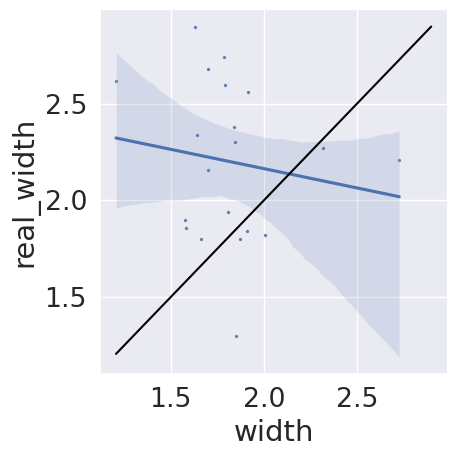

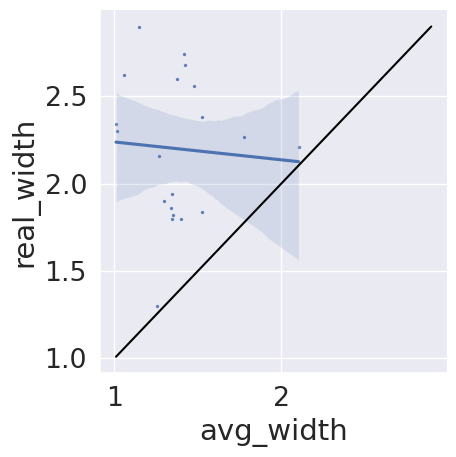

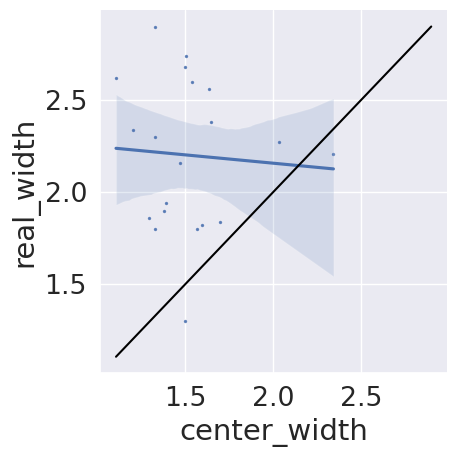

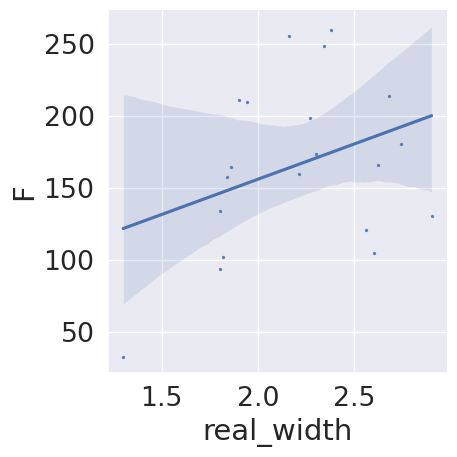

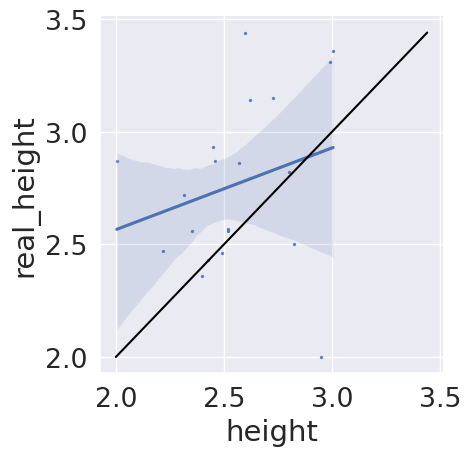

...

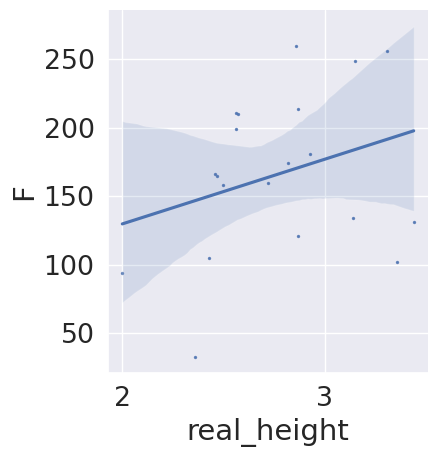

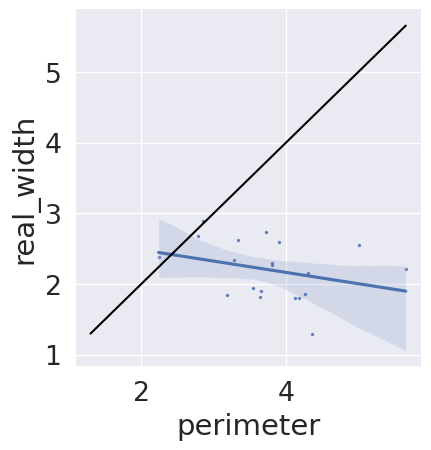

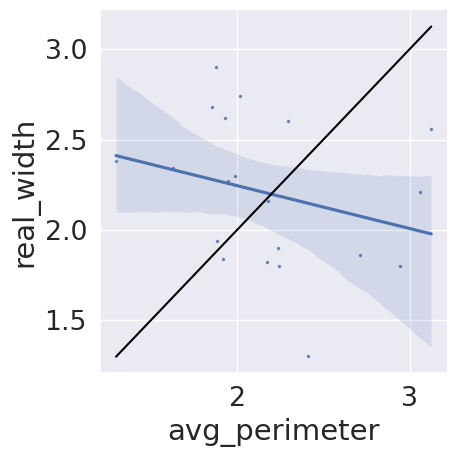

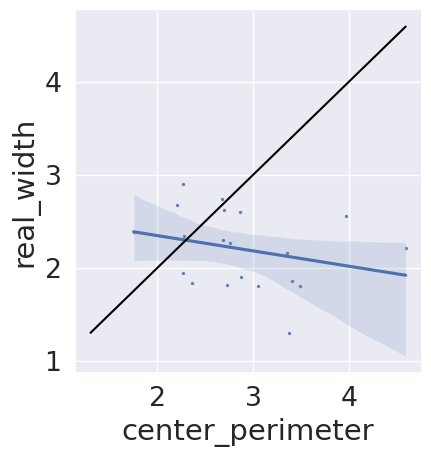

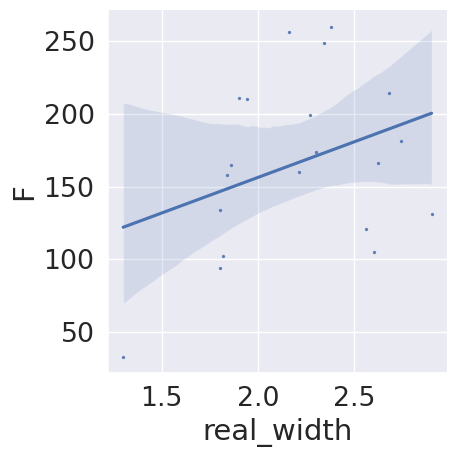

In [183]:
clean_set_w_real_seize = clean_set.merge(real_size_df, on = "name")
df_compare = clean_set_w_real_seize[clean_set_w_real_seize.notna()]
for col in ["width", "height"]:
    y = f"real_{col}"
    sns.lmplot(data = df_compare,x = col,y=y, scatter_kws={'s':2}, order = 1)
    sns.lineplot(x = [df_compare[[col,y]].min().min(),df_compare[[col,y]].max().max()],
                 y = [df_compare[[col,y]].min().min(),df_compare[[col,y]].max().max()],
                color = "black")
    plt.show()
    sns.lmplot(data = df_compare,x = f"avg_{col}",y=y, scatter_kws={'s':2}, order = 1)
    sns.lineplot(x = [df_compare[[f"avg_{col}",y]].min().min(),df_compare[[f"avg_{col}",y]].max().max()],
                 y = [df_compare[[f"avg_{col}",y]].min().min(),df_compare[[f"avg_{col}",y]].max().max()],
                color = "black")
    plt.show()
    sns.lmplot(data = df_compare,x = f"center_{col}",y=y, scatter_kws={'s':2}, order = 1)
    sns.lineplot(x = [df_compare[[f"center_{col}",y]].min().min(),df_compare[[f"center_{col}",y]].max().max()],
                 y = [df_compare[[f"center_{col}",y]].min().min(),df_compare[[f"center_{col}",y]].max().max()],
                color = "black")
    plt.show()
    
    sns.lmplot(data = df_compare,x = y,y="F", scatter_kws={'s':2}, order = 1)
    plt.show()
    

y = f"real_width"
col = "perimeter"
sns.lmplot(data = df_compare,x = col,y=y, scatter_kws={'s':2}, order = 1)
sns.lineplot(x = [df_compare[[col,y]].min().min(),df_compare[[col,y]].max().max()],
             y = [df_compare[[col,y]].min().min(),df_compare[[col,y]].max().max()],
            color = "black")
plt.show()
sns.lmplot(data = df_compare,x = f"avg_{col}",y=y, scatter_kws={'s':2}, order = 1)
sns.lineplot(x = [df_compare[[f"avg_{col}",y]].min().min(),df_compare[[f"avg_{col}",y]].max().max()],
             y = [df_compare[[f"avg_{col}",y]].min().min(),df_compare[[f"avg_{col}",y]].max().max()],
            color = "black")
plt.show()
sns.lmplot(data = df_compare,x = f"center_{col}",y=y, scatter_kws={'s':2}, order = 1)
sns.lineplot(x = [df_compare[[f"center_{col}",y]].min().min(),df_compare[[f"center_{col}",y]].max().max()],
             y = [df_compare[[f"center_{col}",y]].min().min(),df_compare[[f"center_{col}",y]].max().max()],
            color = "black")
plt.show()

sns.lmplot(data = df_compare,x = y,y="F", scatter_kws={'s':2}, order = 1)
plt.show()
# df_compare["cv*w"] = df_compare["cv"]*df_compare["real_width"]
# sns.lmplot(data = df_compare,x = "cv*w",y="F", scatter_kws={'s':2}, order = 1)
# plt.show()
# df_compare["cv*h"] = df_compare["cv"]*df_compare["real_height"]
# sns.lmplot(data = df_compare,x = "cv*h",y="F", scatter_kws={'s':2}, order = 1)
# plt.show()
# df_compare["h*w"] = df_compare["real_height"]*df_compare["real_width"]
# sns.lmplot(data = df_compare,x = "h*w",y="F", scatter_kws={'s':2}, order = 1)
# plt.show()

In [184]:
df_compare["width_err"] = df_compare["width"] - df_compare["real_width"]
df_compare[["name","width","real_width","height","real_height","width_err"]].sort_values("width_err")

,name,width,real_width,height,real_height,width_err
6,R6_T16,1.205997,2.62,2.489591,2.46,-1.414003
8,R6_T20,1.630205,2.90,2.597161,3.44,-1.269795
11,R6_T28,1.702706,2.68,2.457019,2.87,-0.977294
16,R6_T38,1.785692,2.74,2.448714,2.93,-0.954308
9,R6_T22,1.790352,2.60,2.428100,2.43,-0.809648
5,R6_T14,1.641945,2.34,2.725228,3.15,-0.698055
18,R7_T3,1.914089,2.56,2.004634,2.87,-0.645911
10,R6_T26,1.842270,2.38,2.567883,2.86,-0.537730
14,R6_T34,1.701396,2.16,2.989519,3.31,-0.458604
4,R6_T10,1.846965,2.30,2.800580,2.82,-0.453035


In [185]:
lr = LinearRegression()
lr.fit(df_compare["avg_height"].values.reshape(-1,1), df_compare["real_height"].values)
print("avg_height: ", np.mean(np.abs(lr.predict(df_compare["avg_height"].values.reshape(-1,1)) - df_compare["real_height"])/df_compare["real_height"]))
lr = LinearRegression()
lr.fit(df_compare["height"].values.reshape(-1,1), df_compare["real_height"].values)
print("height: ", np.mean(np.abs(lr.predict(df_compare["height"].values.reshape(-1,1)) - df_compare["real_height"])/df_compare["real_height"]))
lr = LinearRegression()
lr.fit(df_compare["center_height"].values.reshape(-1,1), df_compare["real_height"].values)
print("center_height: ", np.mean(np.abs(lr.predict(df_compare["center_height"].values.reshape(-1,1)) - df_compare["real_height"])/df_compare["real_height"]))

avg_height:  0.08513807715537919
height:  0.10917514310066093
center_height:  0.088070249211246


In [186]:
lr = LinearRegression()
lr.fit(df_compare["avg_width"].values.reshape(-1,1), df_compare["real_width"].values)
print("avg_width: ", np.mean(np.abs(lr.predict(df_compare["avg_width"].values.reshape(-1,1)) - df_compare["real_width"])/df_compare["real_width"]))
lr = LinearRegression()
lr.fit(df_compare["width"].values.reshape(-1,1), df_compare["real_width"].values)
print("width: ", np.mean(np.abs(lr.predict(df_compare["width"].values.reshape(-1,1)) - df_compare["real_width"])/df_compare["real_width"]))
lr = LinearRegression()
lr.fit(df_compare["center_width"].values.reshape(-1,1), df_compare["real_width"].values)
print("center_width: ", np.mean(np.abs(lr.predict(df_compare["center_width"].values.reshape(-1,1)) - df_compare["real_width"])/df_compare["real_width"]))

avg_width:  0.16751039782528282
width:  0.17048753892755777
center_width:  0.16829879555806965


In [187]:
clean_set.drop(["cv/F"],axis =1, inplace = True)

In [188]:
numer_cols = list(clean_set.select_dtypes(include=np.number).columns)
cat_cols = [col for col in clean_set.select_dtypes(exclude=np.number).columns if col != "full name"] 

In [189]:
clean_set[clean_set["clusters_area_med_arr"] >4007][["name","side","F","cv", "height","clusters_area_med_arr","clusters_area_mean_arr"]]

,name,side,F,cv,height,clusters_area_med_arr,clusters_area_mean_arr


In [190]:
# clean_set.drop([18,22], inplace = True)

### plots

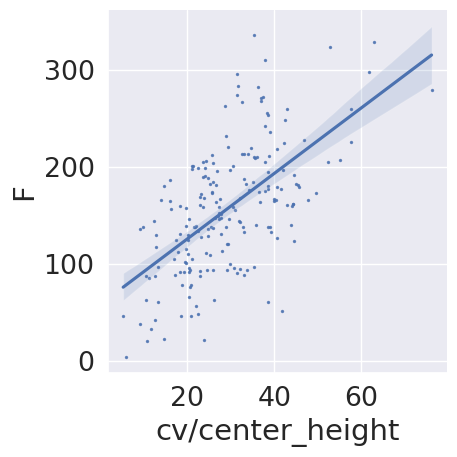

In [191]:
# inter action check
col1 = "cv"
col2 = "center_height"
new_col = f"{col1}/{col2}"
clean_set[new_col] = clean_set[col1]/clean_set[col2]
clean_set[new_col].replace(0, np.mean(clean_set[new_col]), inplace = True)
sns.lmplot(data = clean_set,x = new_col,y="F", scatter_kws={'s':2}, order = 1)
plt.show()
clean_set.drop(new_col, axis =1, inplace = True)

In [192]:
# coludy_rows = ["R8", "R9"]
# clean_set["cloudy"] = clean_set["name"].apply(lambda x:  np.any([row in x for row in coludy_rows]) )
# sns.set(font_scale=1)
# for col in numer_cols:
#     ax = sns.lmplot(data = clean_set,x = col,y="F",hue= "cloudy", scatter_kws={'s':2}, order = 1)
#     sns.regplot(data = clean_set,x = col,y="F", scatter_kws={'s':2}, order = 1,ci=0, ax=ax.axes[0,0],
#                x_ci = 0, color = "black", line_kws={"ls":"--"},scatter=False)
#     plt.show()

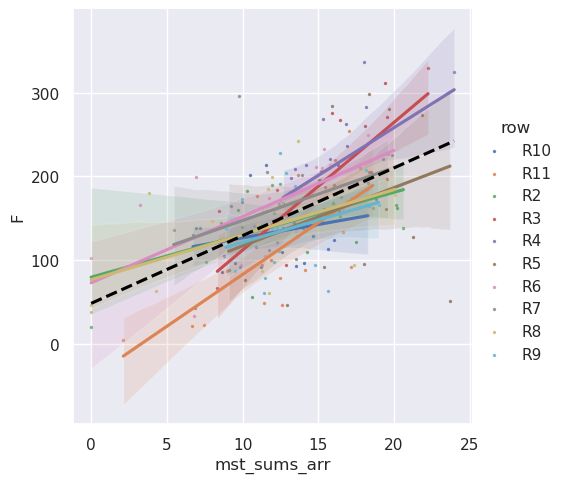

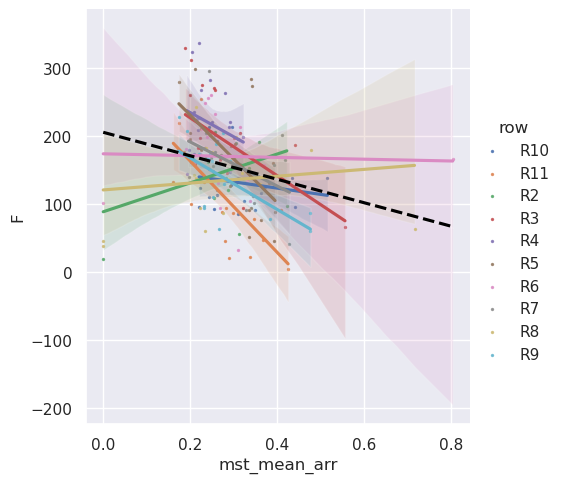

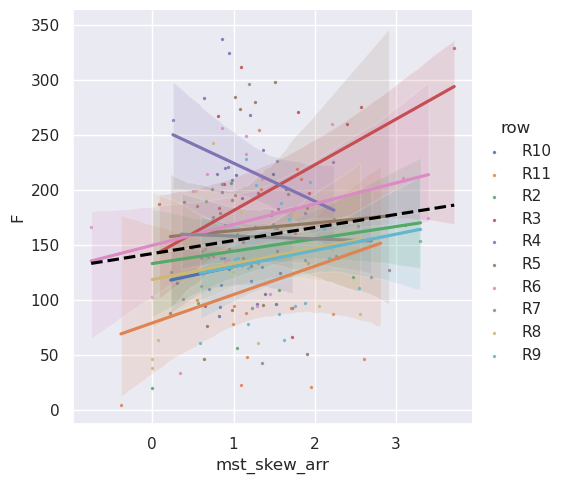

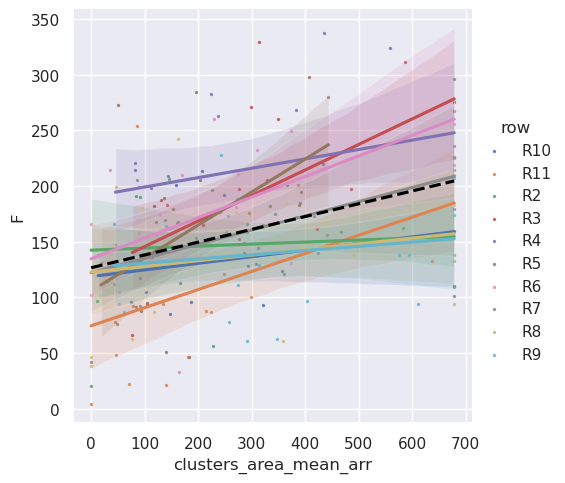

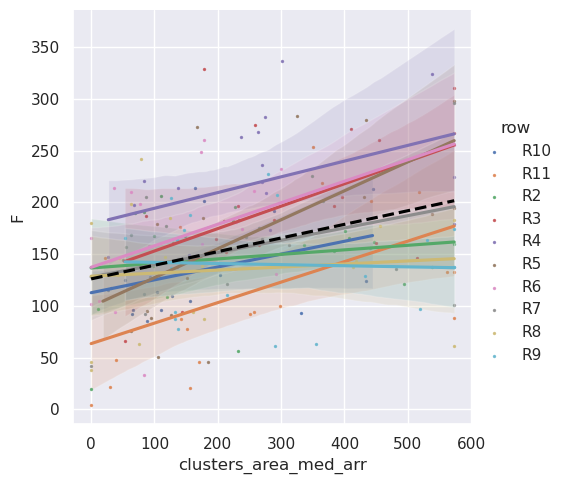

...

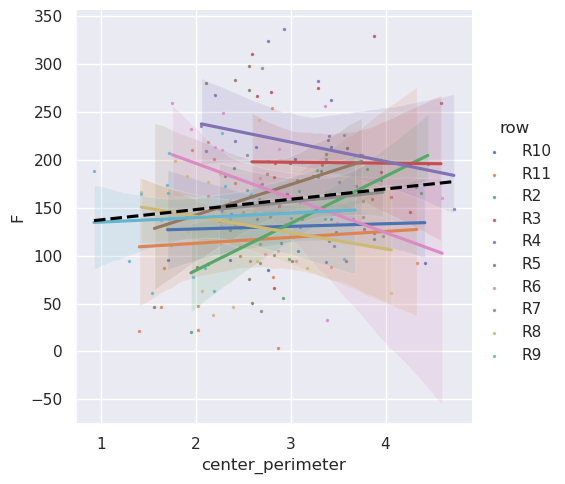

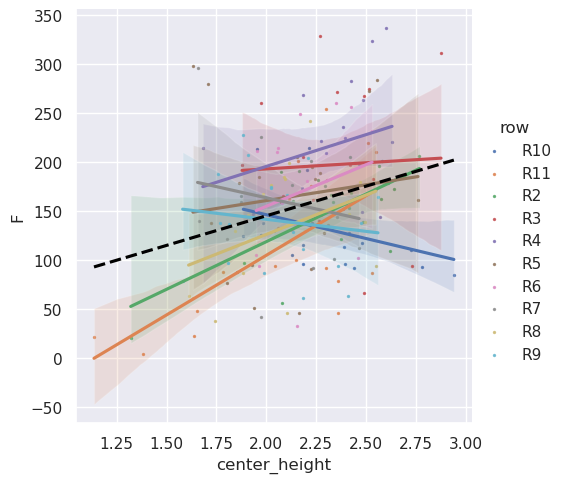

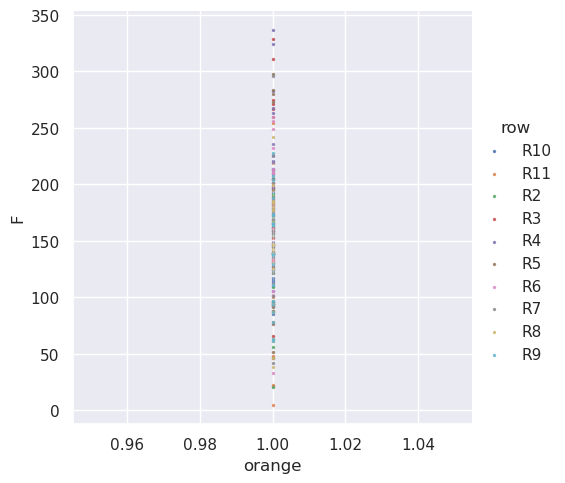

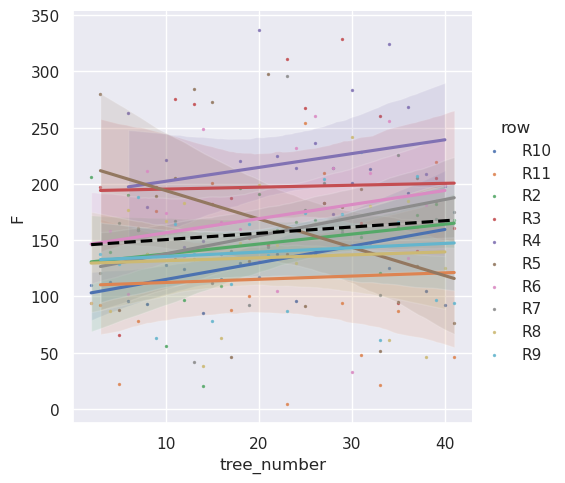

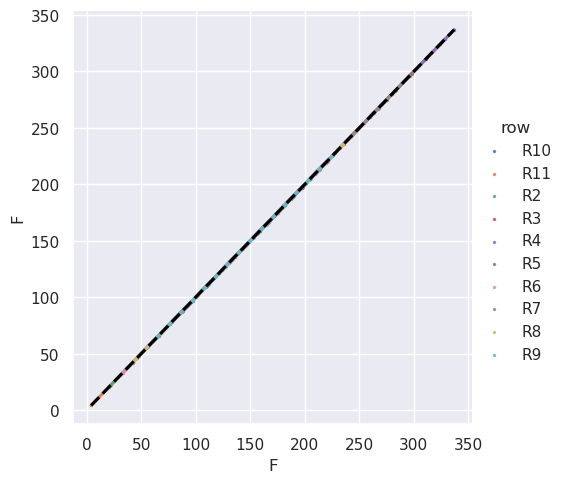

In [193]:
clean_set["row"] = clean_set["name"].apply(lambda x: x.split("_")[0])
sns.set(font_scale=1)
for col in numer_cols:
    ax = sns.lmplot(data = clean_set,x = col,y="F",hue= "row", scatter_kws={'s':2}, order = 1)
    sns.regplot(data = clean_set,x = col,y="F", scatter_kws={'s':2}, order = 1,ci=0, ax=ax.axes[0,0],
               x_ci = 0, color = "black", line_kws={"ls":"--"},scatter=False)
    plt.show()
clean_set.drop(["row"],axis =1, inplace = True)

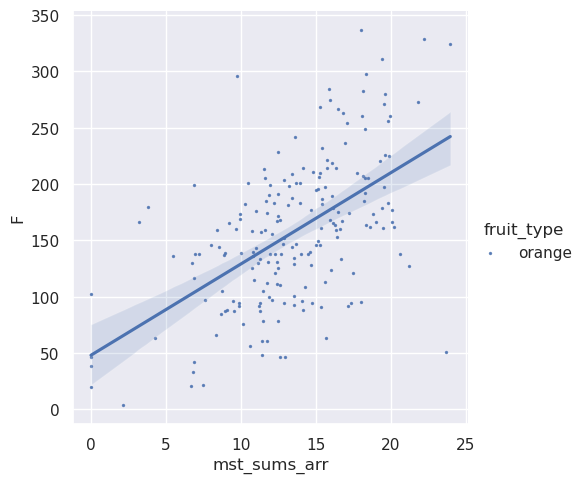

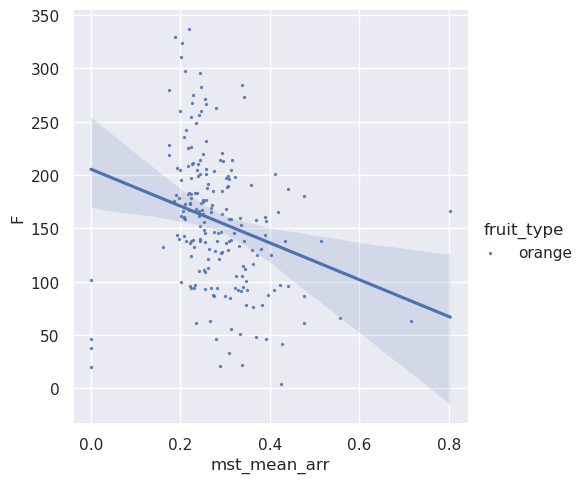

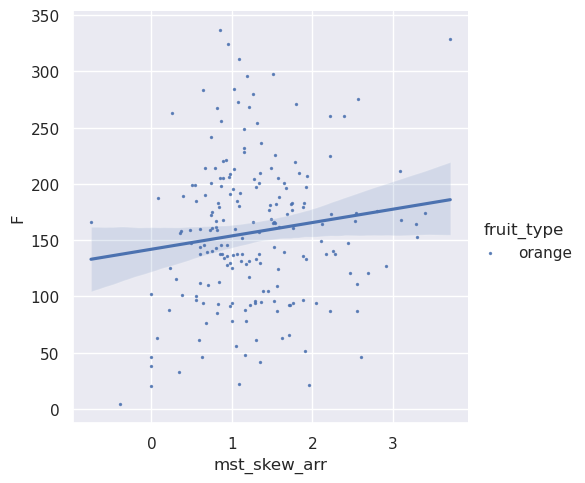

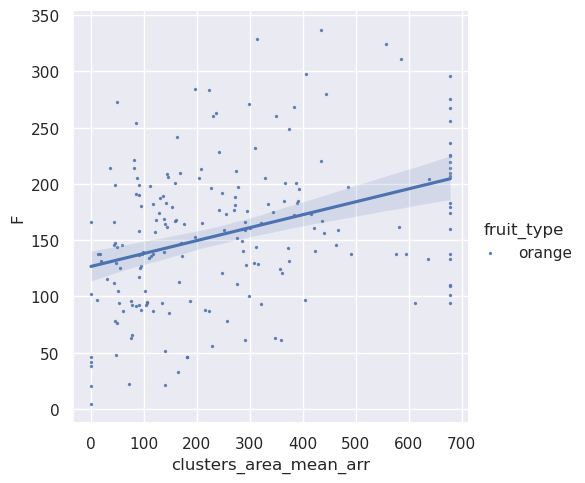

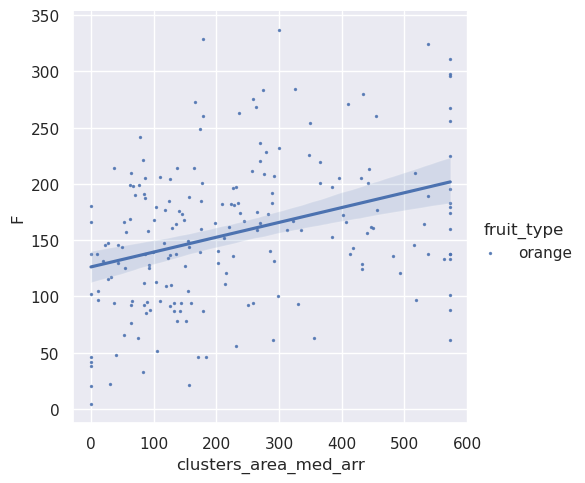

...

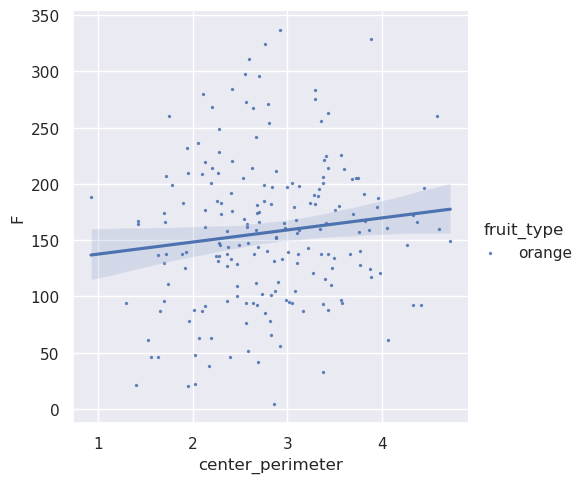

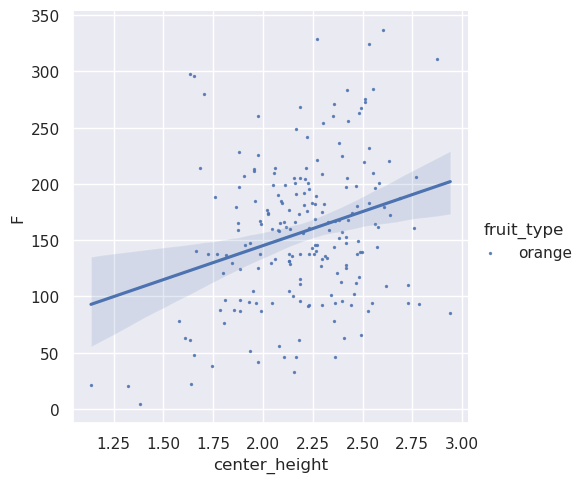

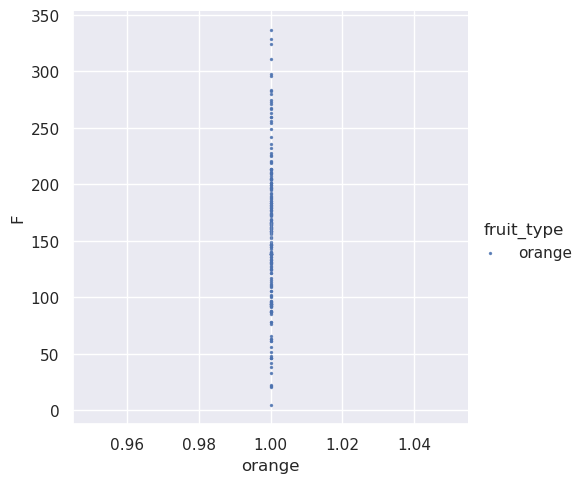

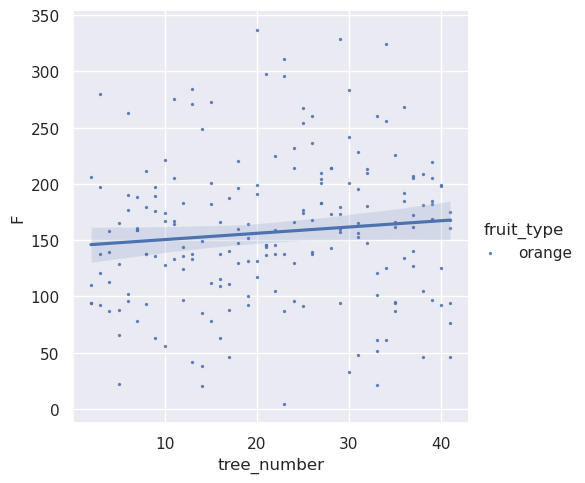

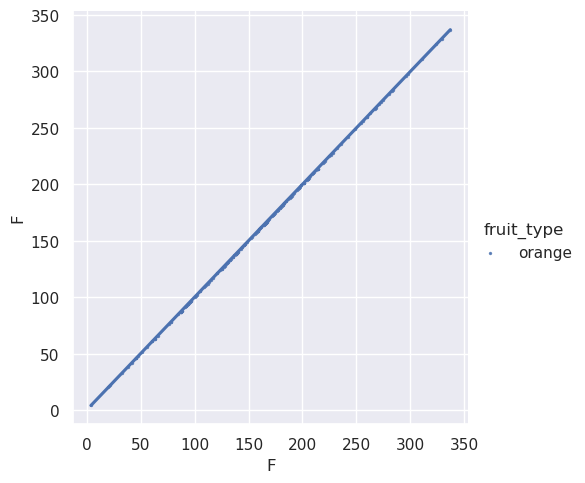

In [194]:
sns.set(font_scale=1)
for col in numer_cols:
    sns.lmplot(data = clean_set,x = col,y="F",hue= "fruit_type", scatter_kws={'s':2})
    plt.show()
clean_set.drop("fruit_type",axis = 1,inplace = True)

/home/fruitspec-lab/anaconda3/envs/FsCounter/lib/python3.8/site-packages/numpy/core/function_base.py:151: RuntimeWarning: invalid value encountered in multiply
  y *= step
/home/fruitspec-lab/anaconda3/envs/FsCounter/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1583: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/fruitspec-lab/anaconda3/envs/FsCounter/lib/python3.8/site-packages/numpy/lib/function_base.py:4527: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)


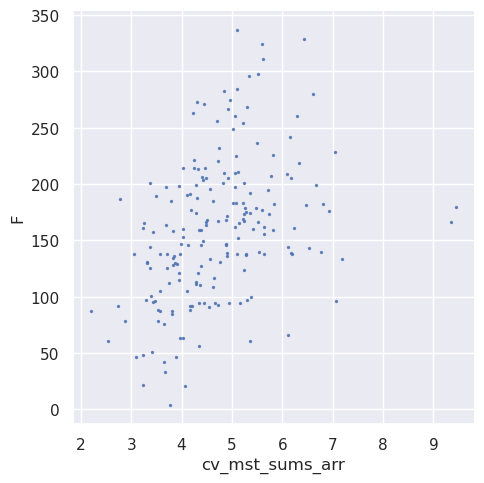

/home/fruitspec-lab/anaconda3/envs/FsCounter/lib/python3.8/site-packages/numpy/core/function_base.py:151: RuntimeWarning: invalid value encountered in multiply
  y *= step
/home/fruitspec-lab/anaconda3/envs/FsCounter/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1583: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/fruitspec-lab/anaconda3/envs/FsCounter/lib/python3.8/site-packages/numpy/lib/function_base.py:4527: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)


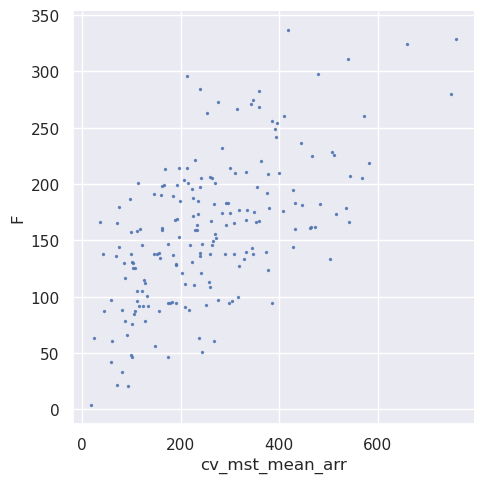

/home/fruitspec-lab/anaconda3/envs/FsCounter/lib/python3.8/site-packages/numpy/core/function_base.py:151: RuntimeWarning: invalid value encountered in multiply
  y *= step
/home/fruitspec-lab/anaconda3/envs/FsCounter/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1583: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/fruitspec-lab/anaconda3/envs/FsCounter/lib/python3.8/site-packages/numpy/lib/function_base.py:4527: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)


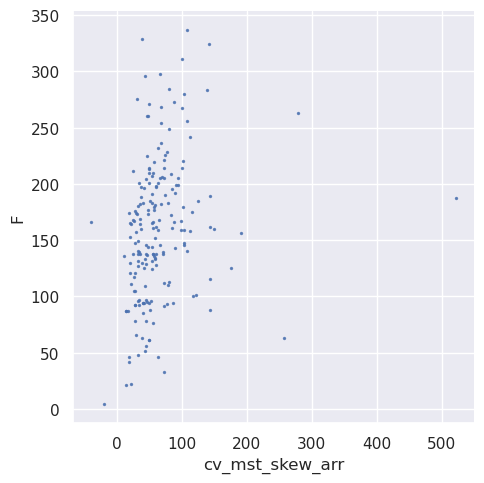

/home/fruitspec-lab/anaconda3/envs/FsCounter/lib/python3.8/site-packages/numpy/core/function_base.py:151: RuntimeWarning: invalid value encountered in multiply
  y *= step
/home/fruitspec-lab/anaconda3/envs/FsCounter/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1583: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,


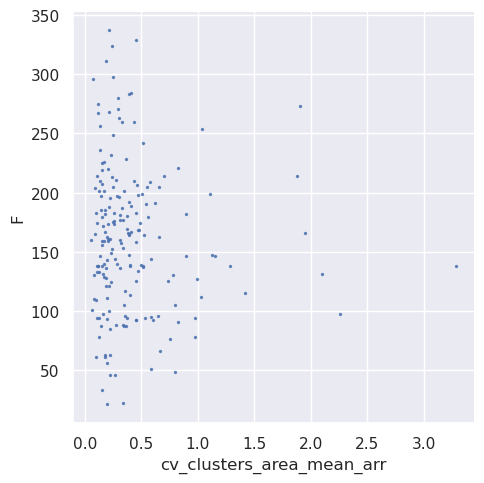

/home/fruitspec-lab/anaconda3/envs/FsCounter/lib/python3.8/site-packages/numpy/core/function_base.py:151: RuntimeWarning: invalid value encountered in multiply
  y *= step
/home/fruitspec-lab/anaconda3/envs/FsCounter/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1583: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,


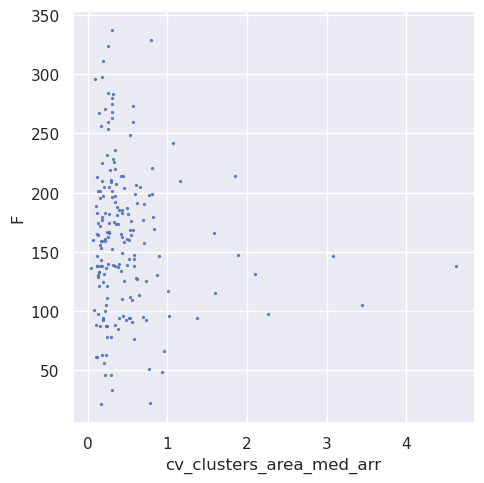

/home/fruitspec-lab/anaconda3/envs/FsCounter/lib/python3.8/site-packages/numpy/core/function_base.py:151: RuntimeWarning: invalid value encountered in multiply
  y *= step
/home/fruitspec-lab/anaconda3/envs/FsCounter/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1583: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/fruitspec-lab/anaconda3/envs/FsCounter/lib/python3.8/site-packages/numpy/lib/function_base.py:4527: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)


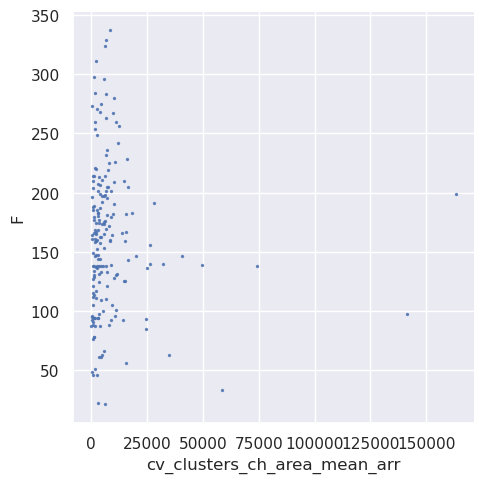

/home/fruitspec-lab/anaconda3/envs/FsCounter/lib/python3.8/site-packages/numpy/core/function_base.py:151: RuntimeWarning: invalid value encountered in multiply
  y *= step
/home/fruitspec-lab/anaconda3/envs/FsCounter/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1583: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,


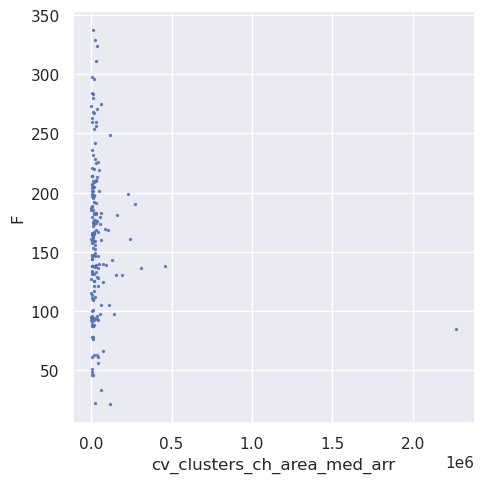

/home/fruitspec-lab/anaconda3/envs/FsCounter/lib/python3.8/site-packages/numpy/core/function_base.py:151: RuntimeWarning: invalid value encountered in multiply
  y *= step
/home/fruitspec-lab/anaconda3/envs/FsCounter/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1583: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,


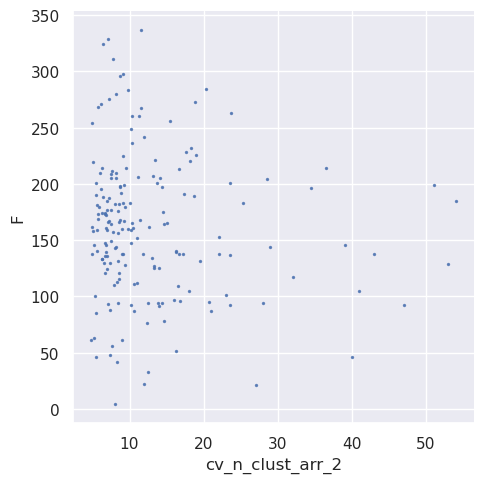

/home/fruitspec-lab/anaconda3/envs/FsCounter/lib/python3.8/site-packages/numpy/core/function_base.py:151: RuntimeWarning: invalid value encountered in multiply
  y *= step
/home/fruitspec-lab/anaconda3/envs/FsCounter/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1583: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,


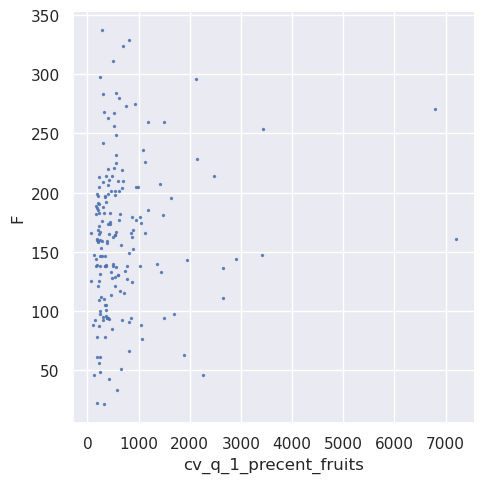

/home/fruitspec-lab/anaconda3/envs/FsCounter/lib/python3.8/site-packages/numpy/core/function_base.py:151: RuntimeWarning: invalid value encountered in multiply
  y *= step
/home/fruitspec-lab/anaconda3/envs/FsCounter/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1583: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/fruitspec-lab/anaconda3/envs/FsCounter/lib/python3.8/site-packages/numpy/lib/function_base.py:4527: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)


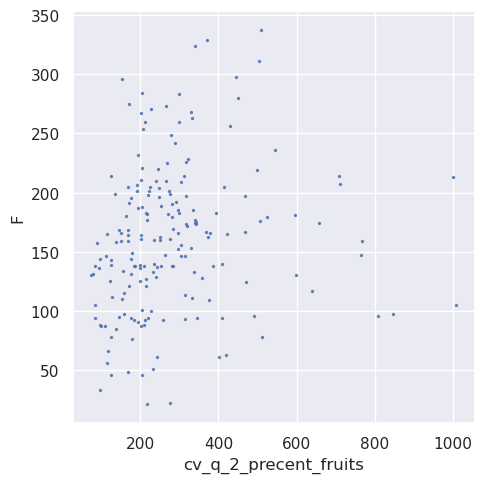

/home/fruitspec-lab/anaconda3/envs/FsCounter/lib/python3.8/site-packages/numpy/core/function_base.py:151: RuntimeWarning: invalid value encountered in multiply
  y *= step
/home/fruitspec-lab/anaconda3/envs/FsCounter/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1583: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/fruitspec-lab/anaconda3/envs/FsCounter/lib/python3.8/site-packages/numpy/lib/function_base.py:4527: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)


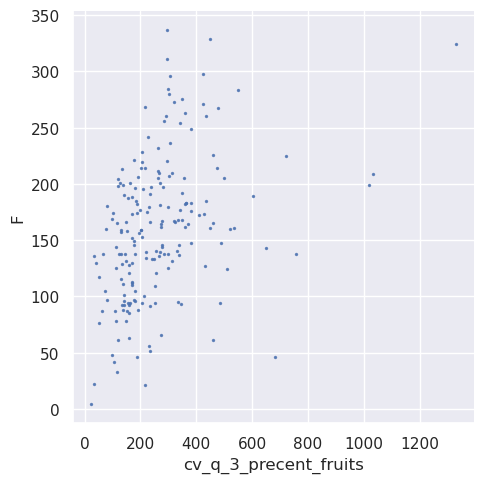

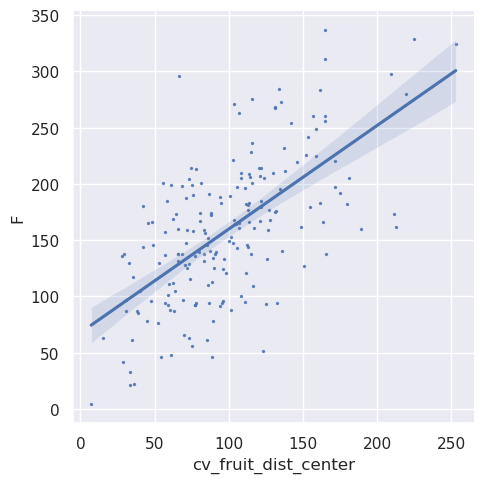

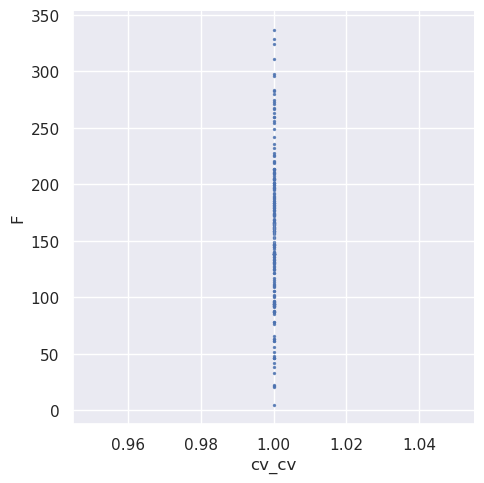

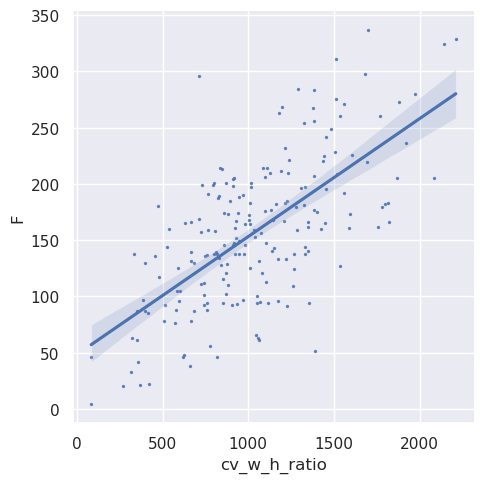

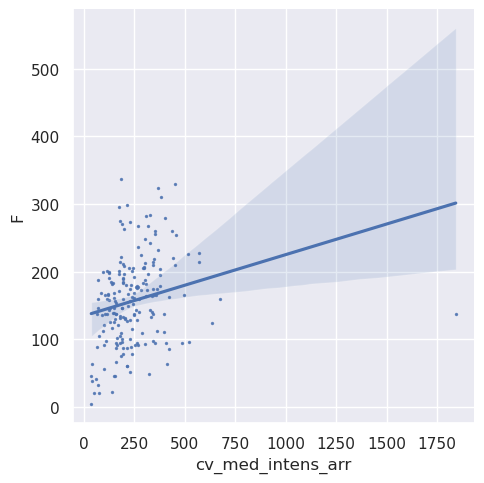

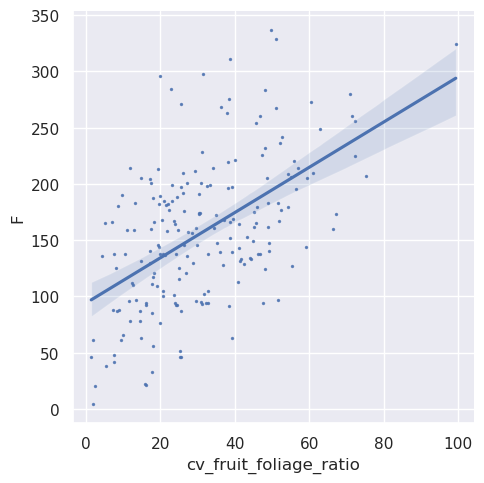

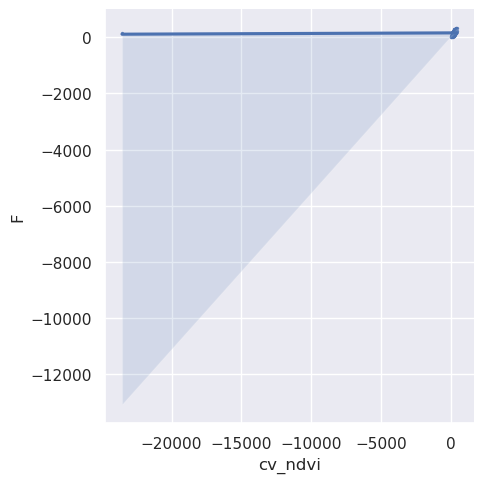

/home/fruitspec-lab/anaconda3/envs/FsCounter/lib/python3.8/site-packages/numpy/core/function_base.py:151: RuntimeWarning: invalid value encountered in multiply
  y *= step
/home/fruitspec-lab/anaconda3/envs/FsCounter/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1583: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,


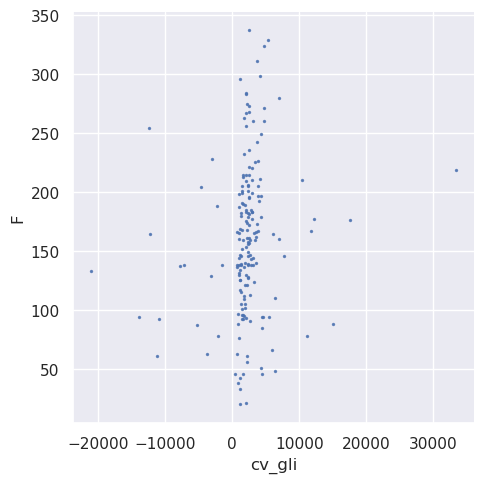

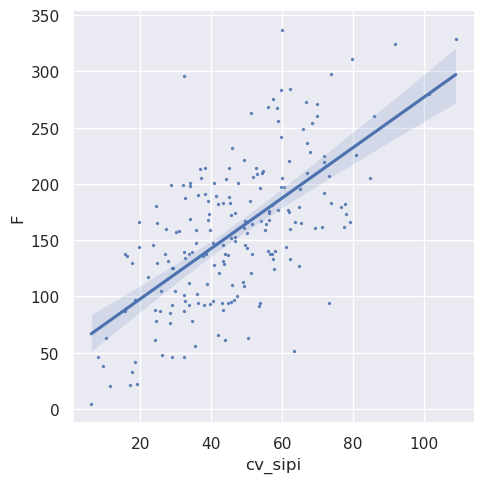

/home/fruitspec-lab/anaconda3/envs/FsCounter/lib/python3.8/site-packages/numpy/core/function_base.py:151: RuntimeWarning: invalid value encountered in multiply
  y *= step
/home/fruitspec-lab/anaconda3/envs/FsCounter/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1583: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,


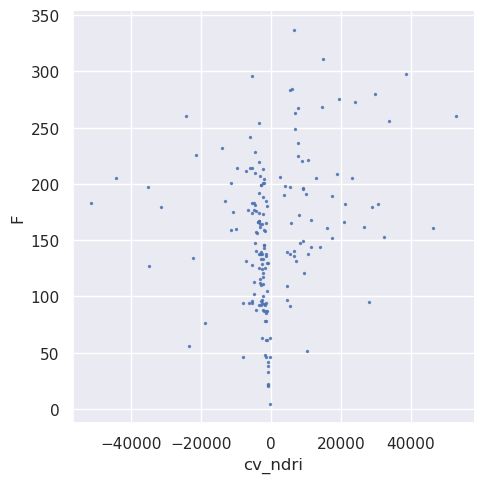

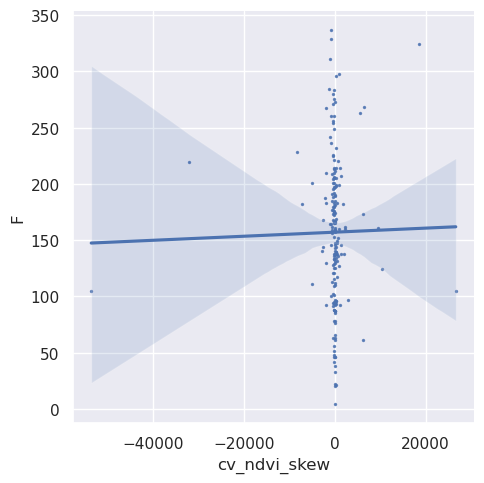

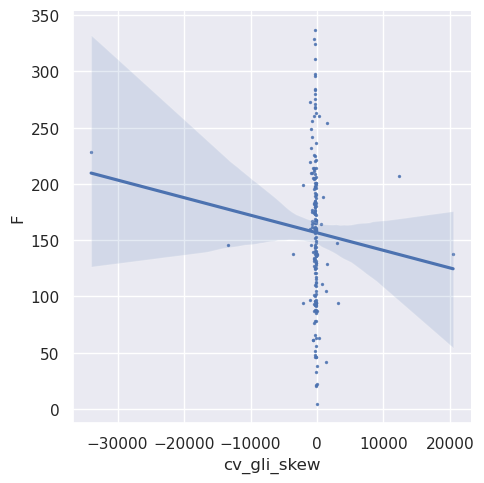

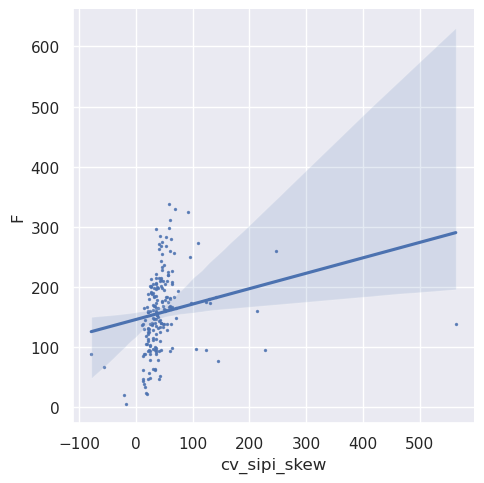

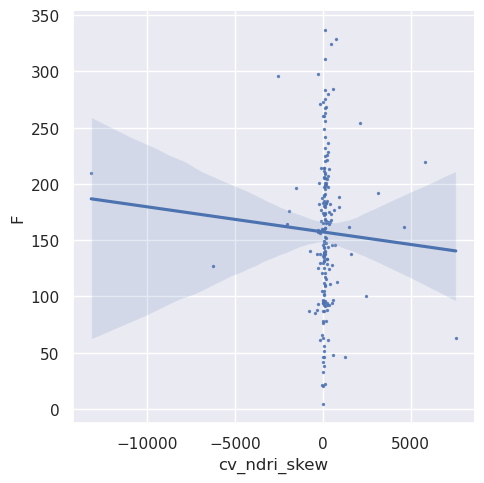

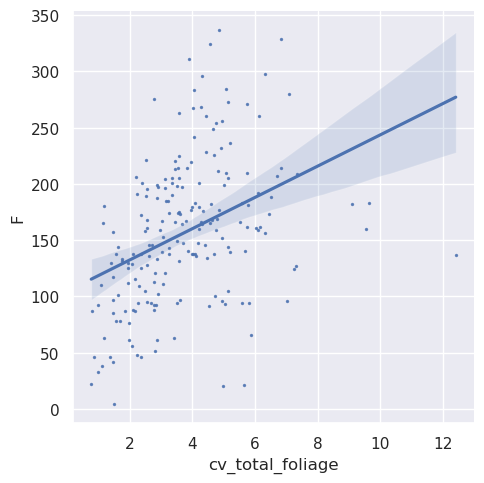

/home/fruitspec-lab/anaconda3/envs/FsCounter/lib/python3.8/site-packages/numpy/core/function_base.py:151: RuntimeWarning: invalid value encountered in multiply
  y *= step
/home/fruitspec-lab/anaconda3/envs/FsCounter/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1583: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/fruitspec-lab/anaconda3/envs/FsCounter/lib/python3.8/site-packages/numpy/lib/function_base.py:4527: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)


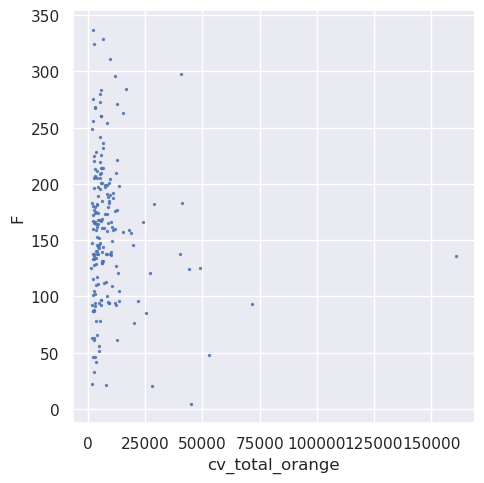

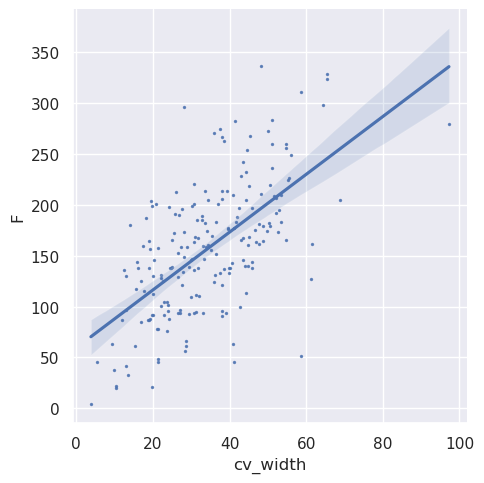

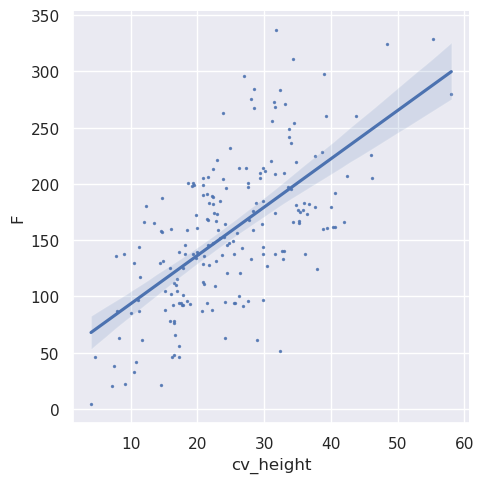

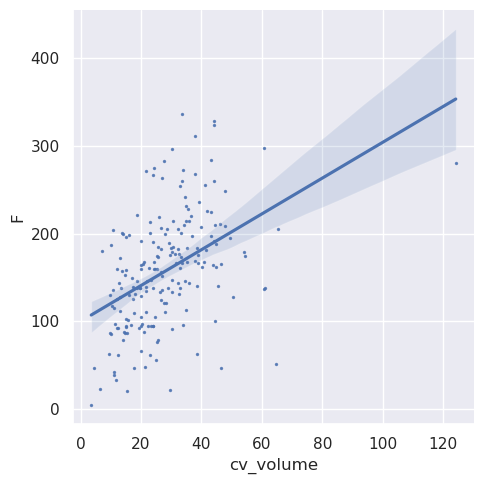

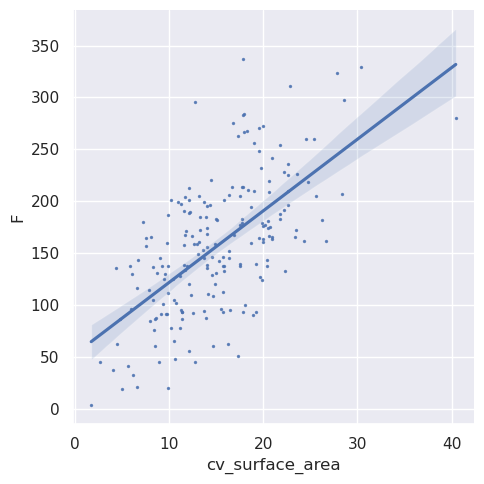

...

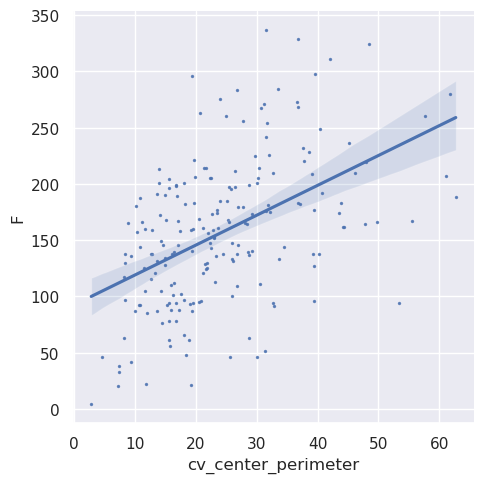

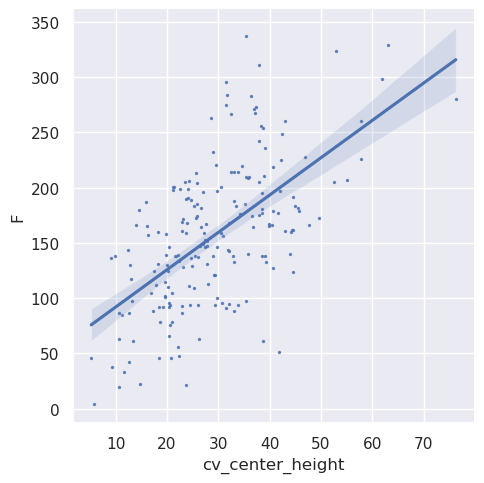

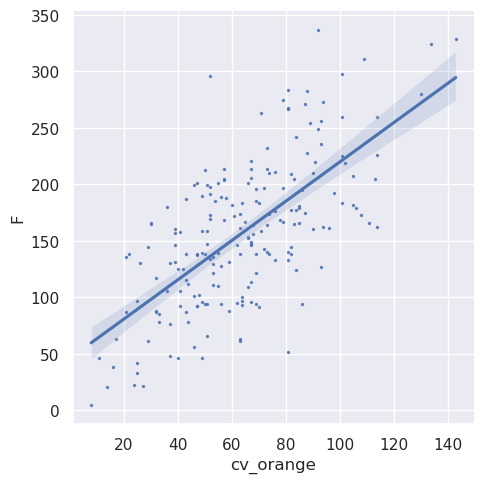

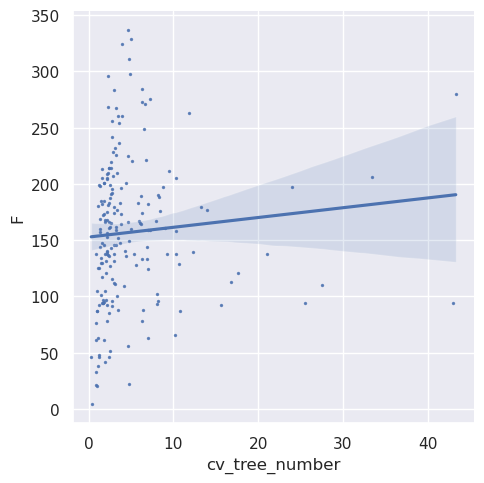

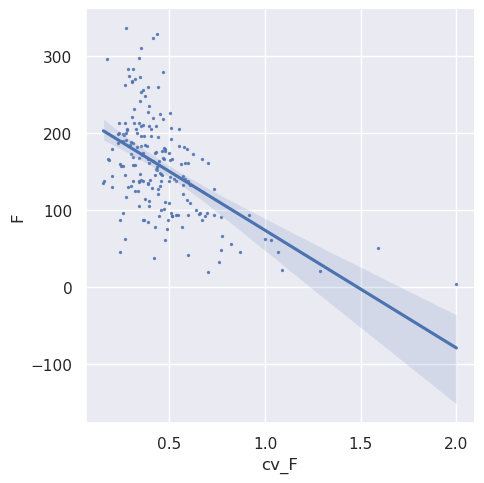

In [218]:
# sns.set(font_scale=1)
# for col in numer_cols:
#     tmp_col = f"cv_{col}"
#     clean_set[tmp_col] = clean_set["cv"]*clean_set[col]
#     sns.lmplot(data = clean_set,x = tmp_col,y="F", scatter_kws={'s':2})
#     plt.show()
#     clean_set.drop(tmp_col, axis = 1,inplace = True)

In [195]:
clean_set["fruit_dist_center"].isna().sum()

4

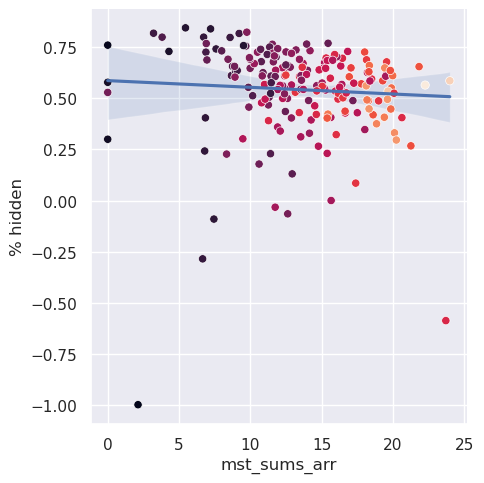

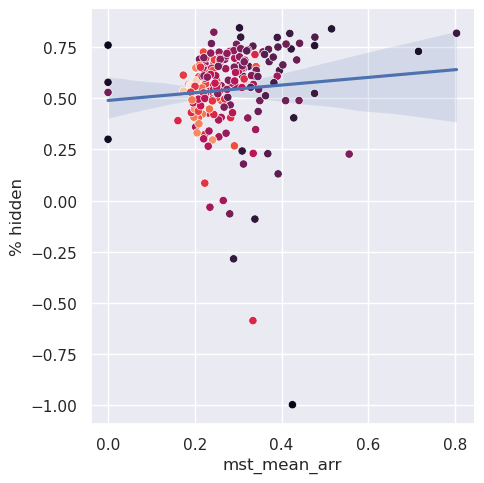

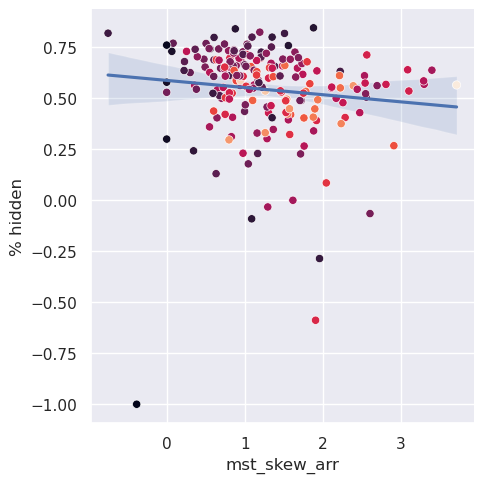

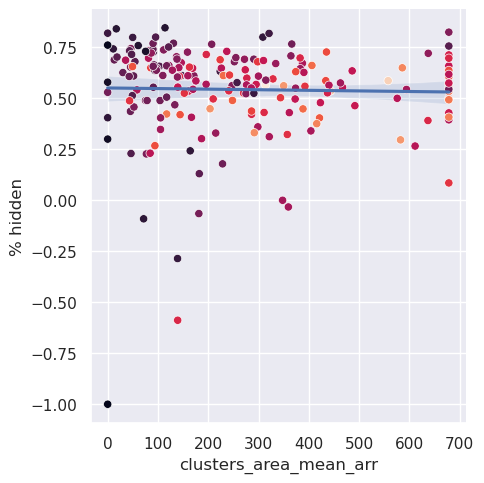

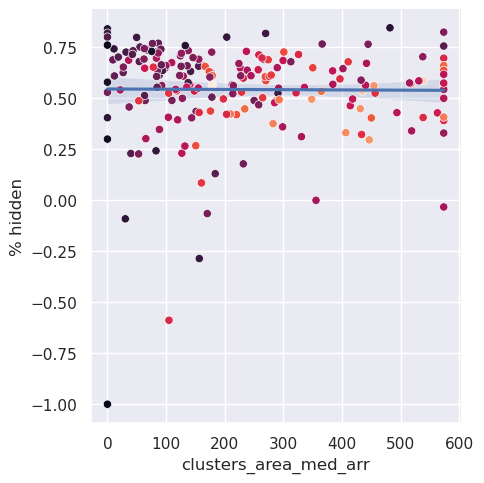

...

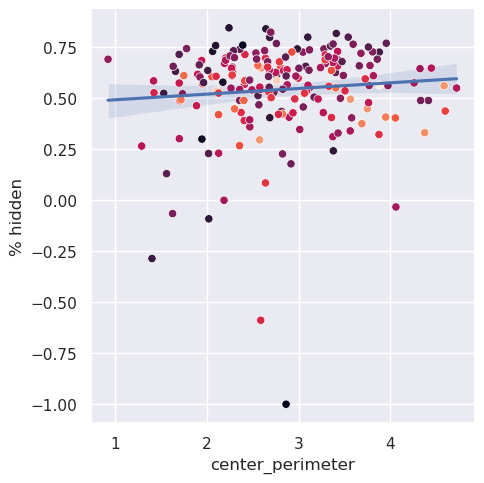

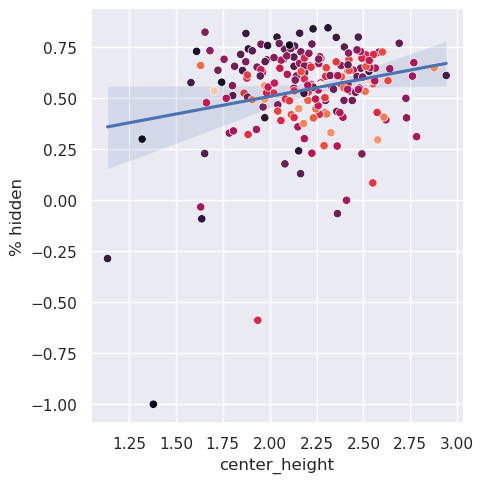

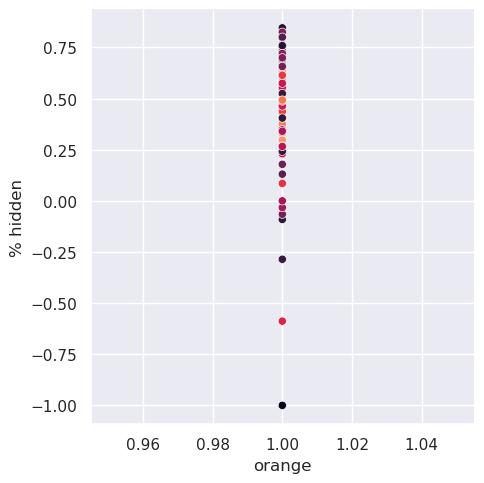

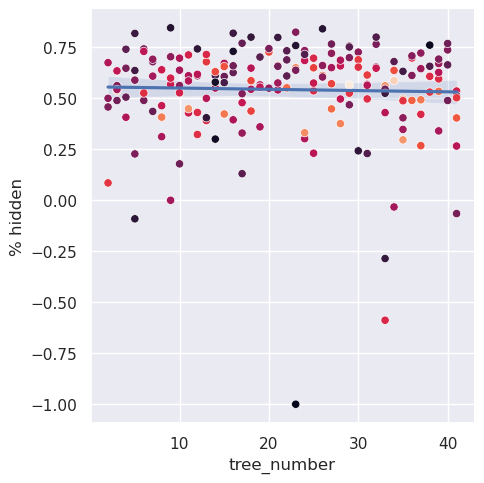

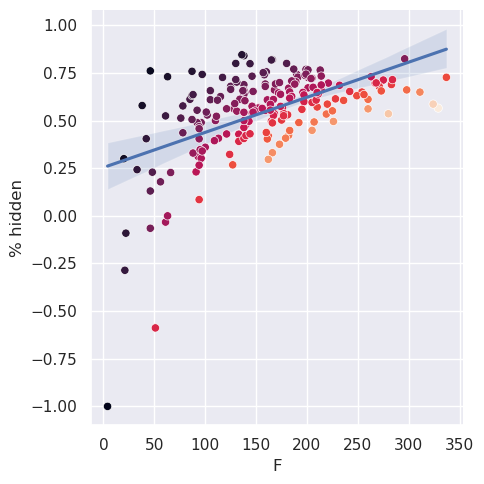

In [196]:
sns.set(font_scale=1)
clean_set["% hidden"]  = (clean_set["F"] - clean_set["cv"])/clean_set["F"]
for col in numer_cols:
    ax = sns.lmplot(data = clean_set,x = col,y="% hidden", scatter_kws={'s':2})
    sns.scatterplot(data = clean_set,x = col,y="% hidden",c=clean_set["cv"][np.isfinite(clean_set[col])], ax=ax.axes[0,0])
    plt.show()
clean_set.drop("% hidden",axis = 1,inplace = True)

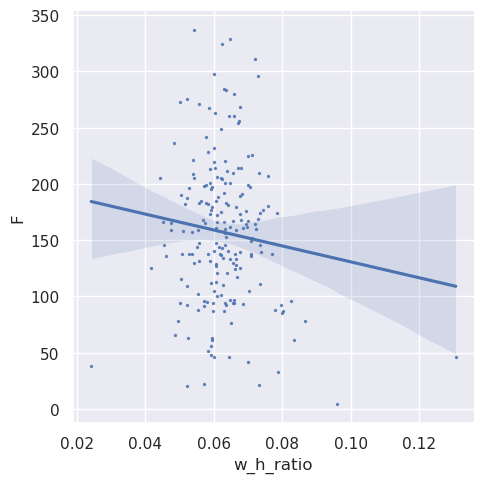

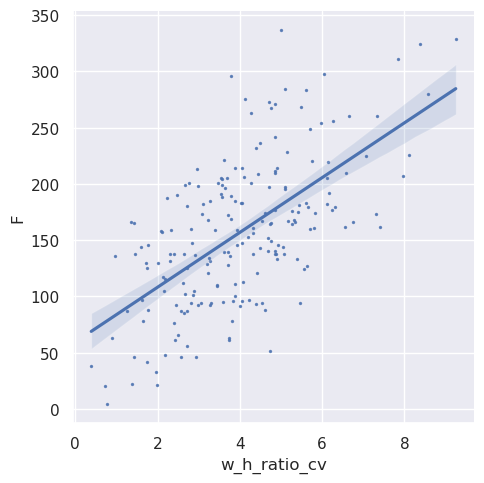

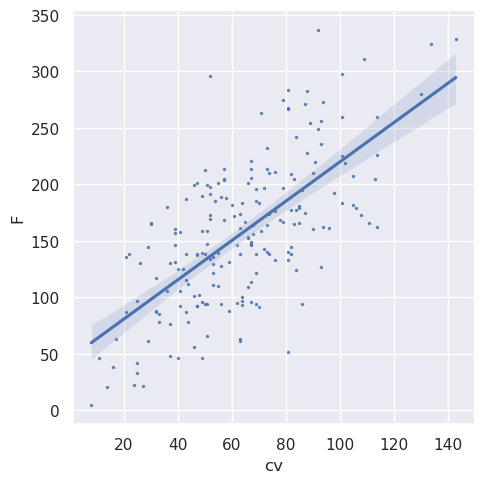

In [197]:
col = "w_h_ratio"
clean_df_temp = clean_set.copy(True)
clean_df_temp = clean_df_temp[clean_df_temp[col]<4000]
clean_df_temp[f"{col}_cv"] = clean_df_temp["cv"]*clean_df_temp[col]
sns.lmplot(data = clean_df_temp,x = col,y="F", scatter_kws={'s':2})
plt.show()
sns.lmplot(data = clean_df_temp,x = f"{col}_cv",y="F", scatter_kws={'s':2})
sns.lmplot(data = clean_df_temp,x = f"cv",y="F", scatter_kws={'s':2})
plt.show()

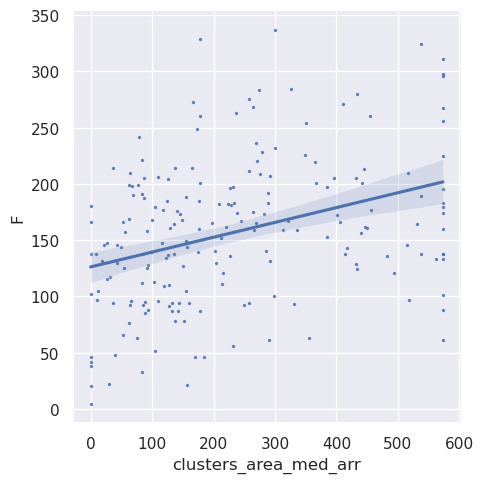

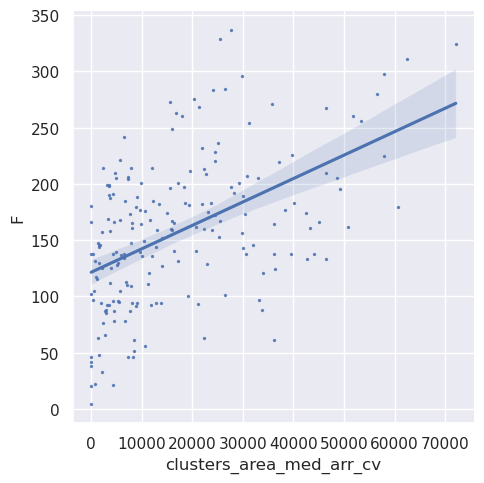

In [198]:
col = "clusters_area_med_arr"
clean_df_temp = clean_set.copy(True)
clean_df_temp = clean_df_temp[clean_df_temp[col]<4000]
clean_df_temp[f"{col}_cv"] = clean_df_temp[col]*clean_df_temp["cv"]
sns.lmplot(data = clean_df_temp,x = col,y="F", scatter_kws={'s':2})
plt.show()
sns.lmplot(data = clean_df_temp,x = f"{col}_cv",y="F", scatter_kws={'s':2})
plt.show()

<AxesSubplot: >

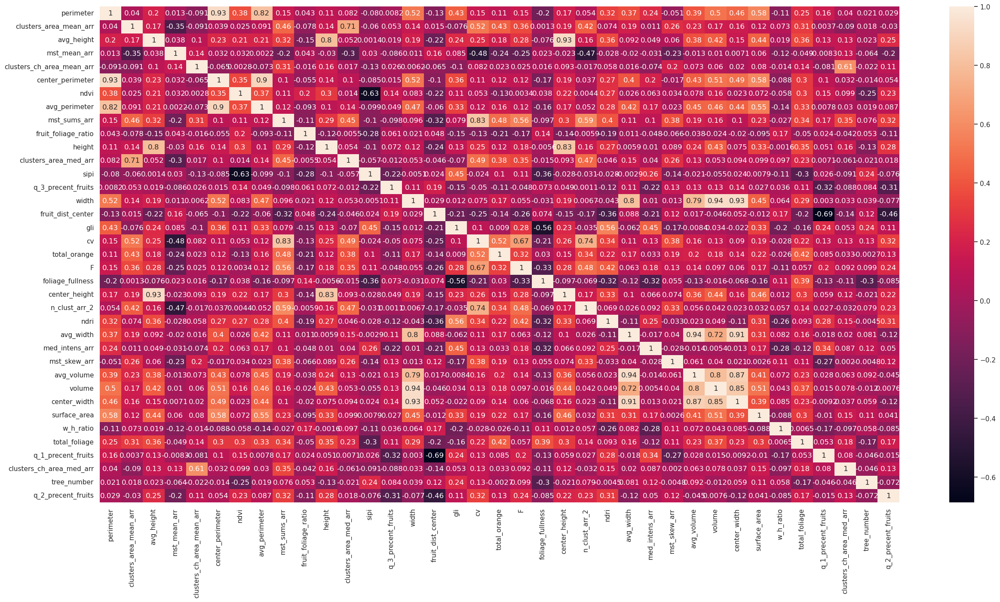

In [199]:
for_corr_plot = set([col for col in numer_cols if not col.endswith("skew")]) - {"apple",
                                                                                "mandarin","lemon","orange"}
corr_frame = clean_set[for_corr_plot].corr()
plt.figure(figsize=(30,15))
sns.heatmap(corr_frame, 
        xticklabels=corr_frame.columns,
        yticklabels=corr_frame.columns,annot = True, annot_kws={"fontsize": 12})


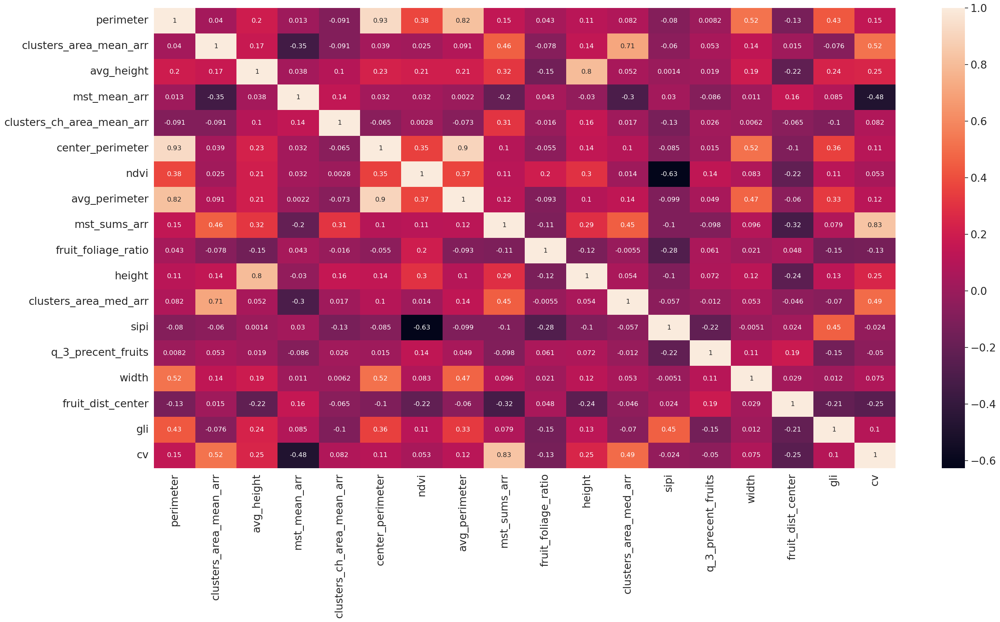

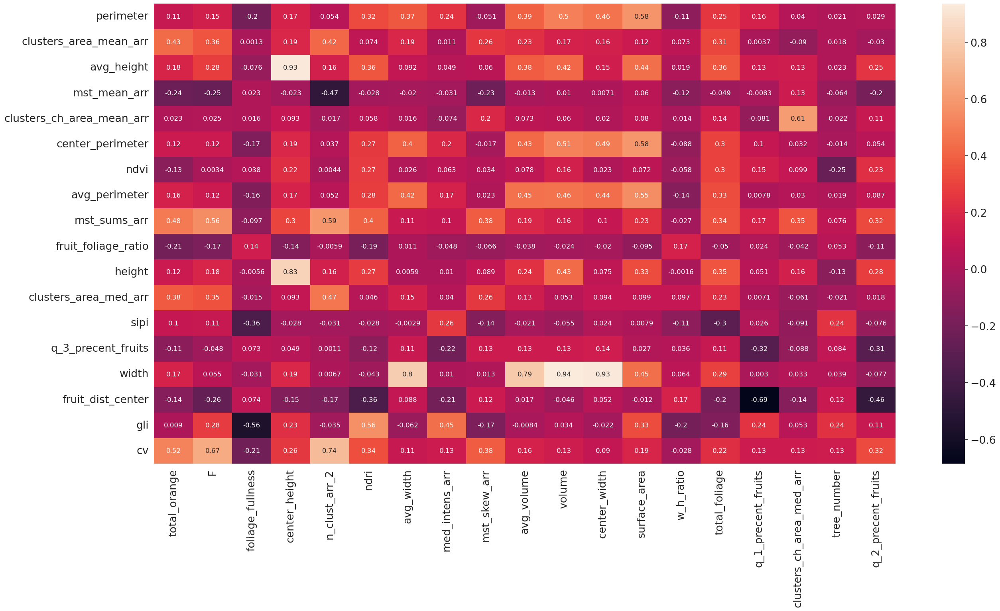

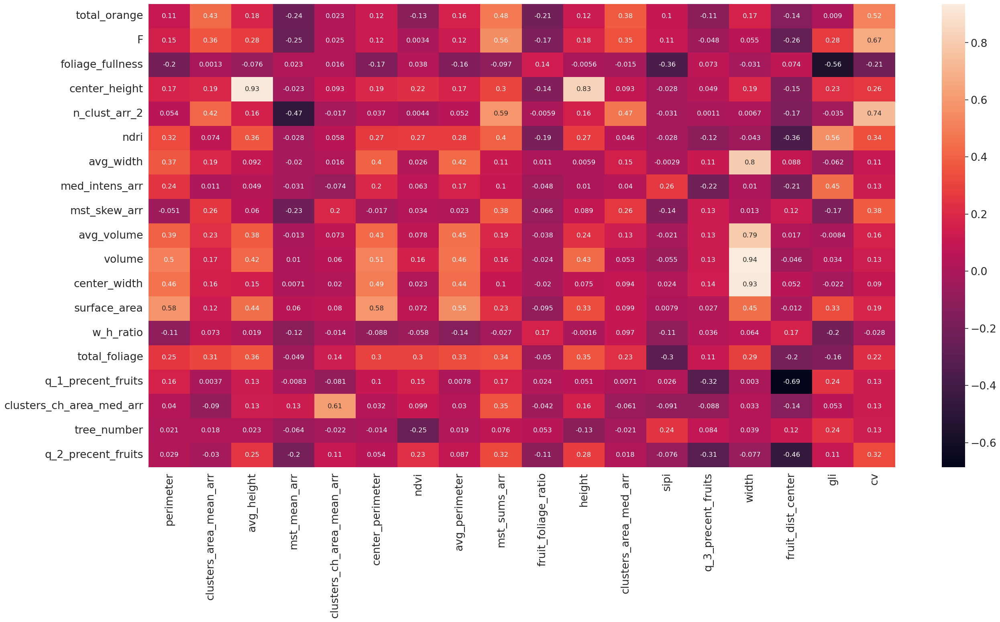

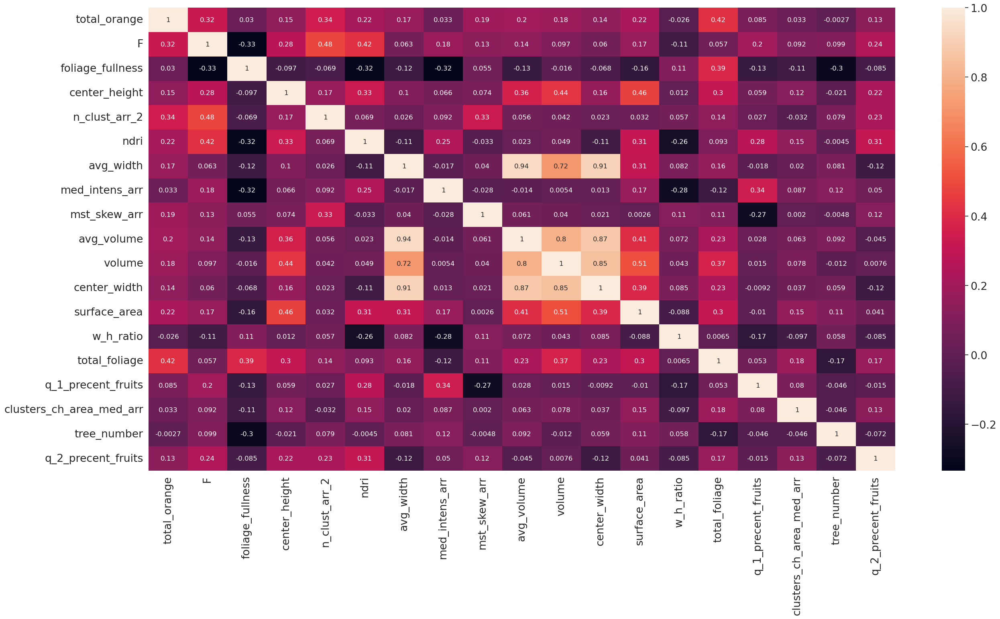

In [200]:
sns.set(font_scale=1.75)
n_cols = corr_frame.shape[0]
half_cols = int(n_cols/2)
plt.figure(figsize=(30,15))
sns.heatmap(corr_frame.iloc[:half_cols,:half_cols], 
        xticklabels=corr_frame.columns[:half_cols],
        yticklabels=corr_frame.columns[:half_cols],annot = True, annot_kws={"fontsize": 12})
plt.show()
plt.figure(figsize=(30,15))
sns.heatmap(corr_frame.iloc[:half_cols,half_cols:], 
        xticklabels=corr_frame.columns[half_cols:],
        yticklabels=corr_frame.columns[:half_cols],annot = True, annot_kws={"fontsize": 12})
plt.show()
plt.figure(figsize=(30,15))
sns.heatmap(corr_frame.iloc[half_cols:,:half_cols], 
        xticklabels=corr_frame.columns[:half_cols],
        yticklabels=corr_frame.columns[half_cols:],annot = True, annot_kws={"fontsize": 12})
plt.show()
plt.figure(figsize=(30,15))
sns.heatmap(corr_frame.iloc[half_cols:,half_cols:], 
        xticklabels=corr_frame.columns[half_cols:],
        yticklabels=corr_frame.columns[half_cols:],annot = True, annot_kws={"fontsize": 12})
plt.show()

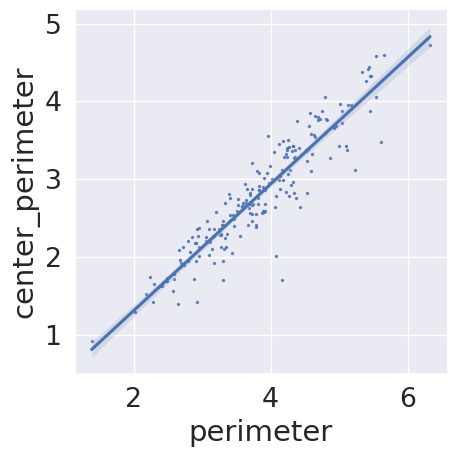

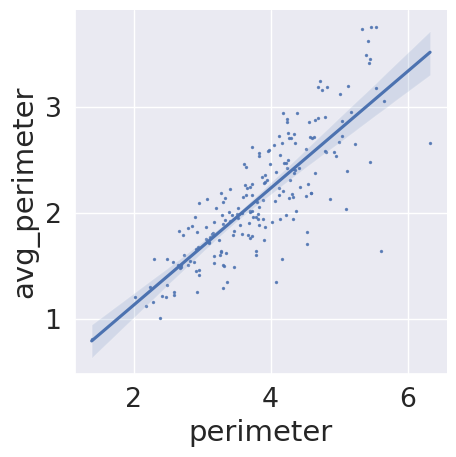

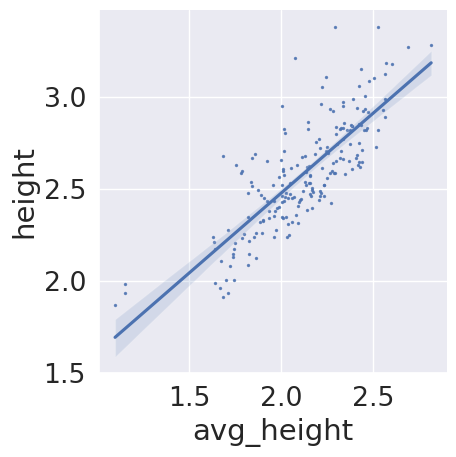

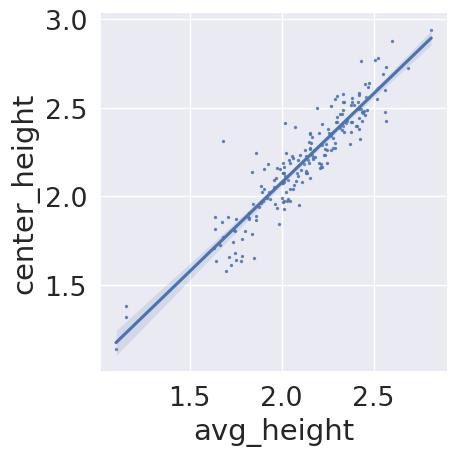

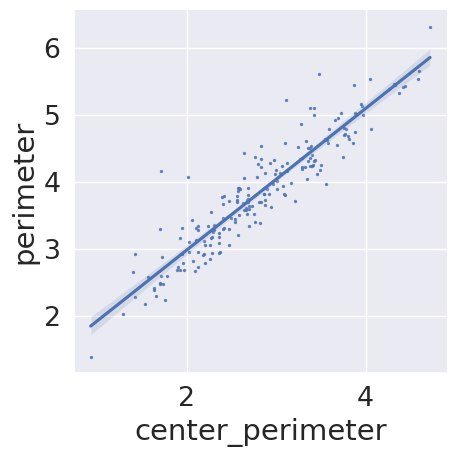

...

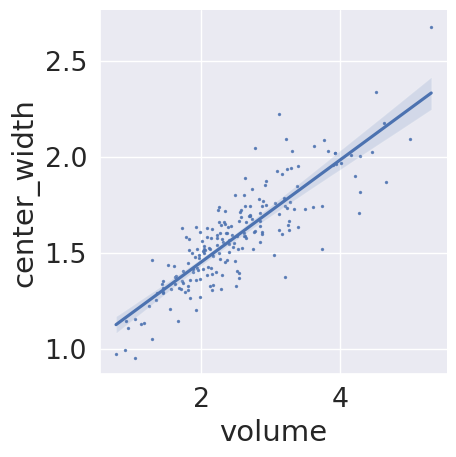

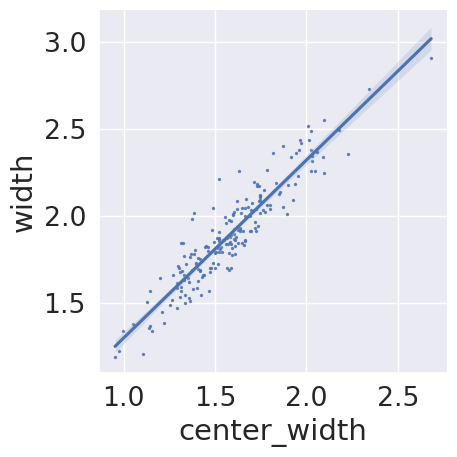

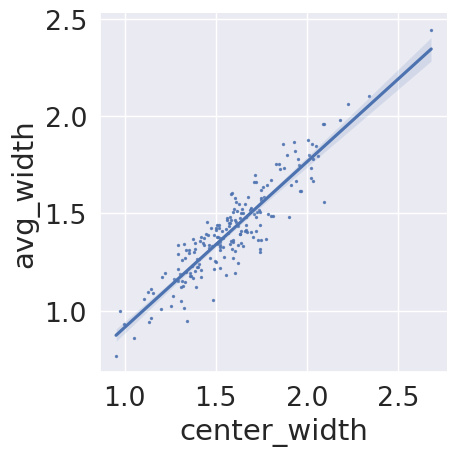

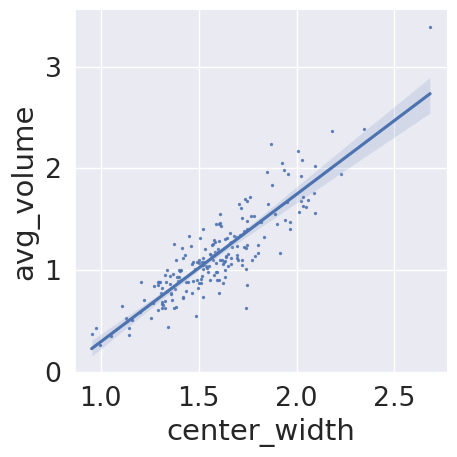

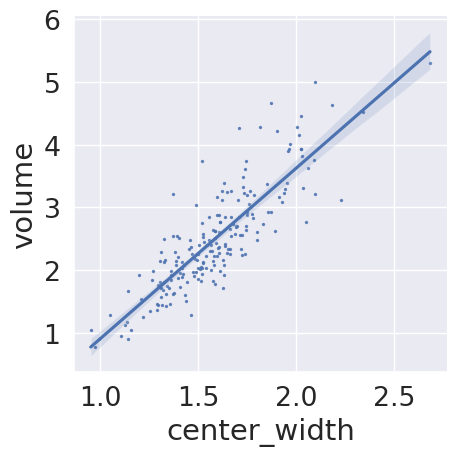

In [201]:
corr_frame_stacked = corr_frame.stack().to_frame()
bool_vec = np.all([np.abs(corr_frame_stacked[0].values) > 0.8 , np.abs(corr_frame_stacked[0].values) < 1],axis = 0)
for i, row in corr_frame_stacked[bool_vec].iterrows():
    var1, var2 = row.name
    sns.lmplot(data = clean_set,x = var1,y=var2, scatter_kws={'s':2})
    plt.show()

### PCA

In [202]:
def preprocess(df):
    df["fruit_foliage_ratio"] = df["fruit_foliage_ratio"].replace(np.inf,100)
    df_cols = df.columns
    for col in ["F","block_name","side","tree_number", "name"]:
        if col in df_cols:
            df.drop(col,axis = 1,inplace = True)
    df['cv^2'] = df["cv"]**2
    df['cv/center_height'] = df["cv"]/df["center_height"]
    df['cv/center_width'] = df["cv"]/df["center_width"]
    df['cv/surface_area'] = df["cv"]/df["surface_area"]
    df['cv/total_foliage'] = df["cv"]/df["total_foliage"]
    df['cv*fruit_foliage_ratio'] = df["cv"]*df["fruit_foliage_ratio"]
    df['mst_sums_arr^2'] = df["mst_sums_arr"]**2
    df["cv_foliage_fullness"] = df["cv"]*df["foliage_fullness"]
    return df

In [267]:
rows = clean_set["name"].apply(lambda x: x.split("_")[0])
X_tr_lr = clean_set.copy()
y = X_tr_lr['F']
X_tr_lr = preprocess(X_tr_lr)
# from sklearn.feature_selection import VarianceThreshold
# selector = VarianceThreshold()
# X_tr_lr_selected = selector.fit_transform(X_tr_lr)
# X_tr_lr = pd.DataFrame(X_tr_lr_selected,columns = X_tr_lr.columns[selector.get_support()])

In [204]:
rows.reset_index(inplace = True, drop = True)
X_tr_lr.reset_index(inplace = True, drop = True)
y.reset_index(inplace = True, drop = True)
X_tr_lr.fillna(0, inplace = True)

In [205]:
n_comp = None
pca = PCA(n_comp)
X_tr_lr_sc = StandardScaler().fit_transform(X_tr_lr)
x_pcaed = pca.fit_transform(X_tr_lr_sc, y)
x_pcaed = pd.DataFrame(x_pcaed,columns = [f"PC_{i+1}" for i in range(n_comp if n_comp != None else X_tr_lr.shape[1])])

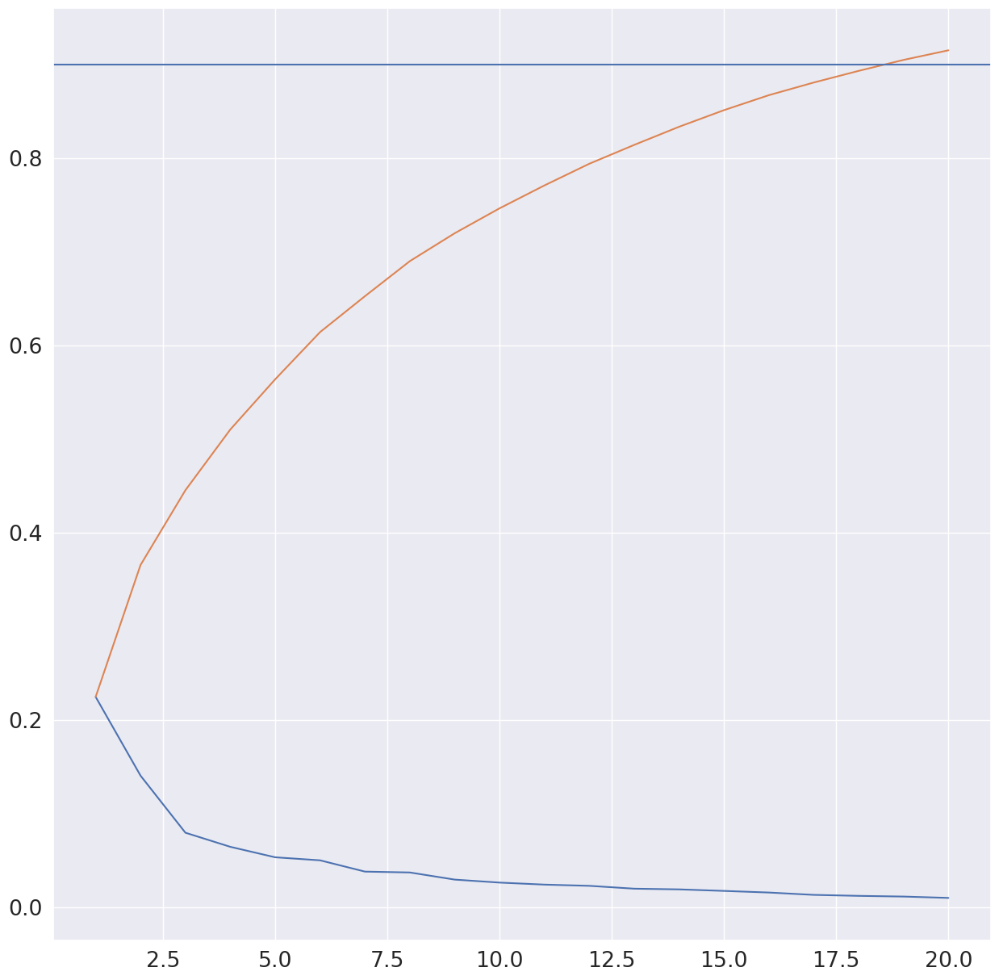

,0,1,2,3,4,5,6,7,8,9,...,37,38,39,40,41,42,43,44,45,46
cv,0.294345,0.085100,0.011667,0.049719,0.025173,0.009504,0.007313,0.014586,0.009736,0.044356,...,0.006295,0.034762,0.047043,0.176370,0.140135,0.425711,0.148394,0.028909,0.019494,0.763305
cv_foliage_fullness,0.293268,0.088109,0.033552,0.024612,0.006538,0.007391,0.007283,0.007784,0.024906,0.036106,...,0.021843,0.090074,0.048383,0.161956,0.192983,0.597547,0.064575,0.020677,0.040888,0.631544
cv^2,0.280360,0.091331,0.015247,0.069052,0.012886,0.030026,0.001139,0.014749,0.035697,0.063601,...,0.154400,0.642525,0.004613,0.045447,0.016866,0.326992,0.189565,0.011206,0.077546,0.088543
mst_sums_arr,0.269924,0.040030,0.005358,0.080465,0.097299,0.062683,0.033876,0.120495,0.121467,0.127024,...,0.116569,0.176218,0.013166,0.177946,0.220465,0.278712,0.513319,0.059584,0.105121,0.048340
mst_sums_arr^2,0.266828,0.051112,0.021806,0.064731,0.097819,0.078330,0.028183,0.149026,0.041258,0.084937,...,0.019332,0.187163,0.081066,0.182494,0.221867,0.191539,0.540165,0.032722,0.086507,0.041160
cv/surface_area,0.264472,0.159398,0.056594,0.042502,0.002772,0.004776,0.049809,0.022257,0.066941,0.065554,...,0.020848,0.294577,0.140184,0.048517,0.047856,0.225241,0.229083,0.735837,0.100903,0.002594
cv/center_height,0.263570,0.135243,0.060366,0.128635,0.040967,0.079116,0.052062,0.056140,0.056400,0.058891,...,0.261051,0.198055,0.140129,0.007036,0.322504,0.357539,0.353950,0.526416,0.058666,0.007259
cv/center_width,0.255493,0.192277,0.057276,0.024437,0.001347,0.017136,0.040021,0.052453,0.014514,0.016963,...,0.073213,0.246991,0.214227,0.284095,0.592902,0.021534,0.282427,0.197847,0.142078,0.027536
n_clust_arr_2,0.221065,0.100547,0.081905,0.035344,0.043511,0.007048,0.055610,0.110578,0.066221,0.029152,...,0.022106,0.061439,0.028866,0.011399,0.019703,0.005508,0.014418,0.017802,0.005762,0.001343
clusters_area_mean_arr,0.178489,0.012706,0.153429,0.012864,0.060077,0.133370,0.115310,0.115646,0.142120,0.283324,...,0.039489,0.034904,0.018558,0.013580,0.035793,0.023633,0.014285,0.006075,0.016056,0.000170


In [206]:
max_comp = 20
plt.figure(figsize=(15,15))
plt.plot(range(1,max_comp+1),pca.explained_variance_ratio_[:max_comp])
plt.plot(range(1,max_comp+1),np.cumsum(pca.explained_variance_ratio_[:max_comp]))
plt.axhline(0.9)
plt.show()
pd.DataFrame(np.abs(pca.components_.T), index = X_tr_lr.columns).sort_values(0,ascending = False)

In [207]:
# X_tr_lr[x_pcaed.columns] = x_pcaed

### modeling

In [208]:
def mape(y_true,y_pred,trees):
    df = pd.DataFrame({"F":y_true,"prediction_F":y_pred,"trees":trees})
    agg_table = pd.pivot_table(df,index = "trees",values = ["prediction_F","F"],aggfunc = np.mean)
    return np.mean(np.abs(agg_table["F"]- agg_table["prediction_F"]) / agg_table["F"])

def mape_scoring(y_true, y_pred):
    return np.mean(np.abs(y_true - y_pred)/y_true)

def naive_prediction(data,frames = True):
    df = data.copy(True)
    if frames:
        df = df[df["frame"] == 1] 
    fruit_avg = {col: df["F"][df[col] == 1].mean()
                 for col in ["orange","lemon","mandarin","apple"] if col in df.columns}
    print(fruit_avg)
    predictions = data[fruit_avg.keys()] * fruit_avg
    return predictions.max(axis =1)

def naive_score(data,frames = True):
    predictions = naive_prediction(data,frames)
    return mape_scoring(data["F"],predictions)
print(naive_score(clean_set,frames = False))

{'orange': 156.96464646464648}
0.7033487133337216


In [209]:
# TODO add cols
sc = scalers["Power"]

def cross_validate_with_mean(model = None, X = None,y = None,cv = 16, groups = None, ret_preds = False,
                            use_log1p = False):
    results = []
    tree_res = []
    X = X.to_numpy()
    all_preds = np.zeros(len(y))
    if not isinstance(y, type(np.array([]))):
        y = y.to_numpy()
    if not isinstance(groups,type(None)):
        cv = groups.nunique()
        kf = GroupKFold(n_splits=cv)
        iterable_kf = kf.split(X,y,groups)
    else:
        kf = KFold(n_splits=cv, random_state=43, shuffle=True)
        iterable_kf = kf.split(X)
    for train_index, test_index in iterable_kf:
        x_train, x_test, y_train, y_test = X[train_index] , X[test_index], y[train_index] , y[test_index]
        #x_train, x_test, y_train, y_test = X[test_index] , X[train_index], y[test_index] , y[train_index]
        if isinstance(model,type(None)):
            y_pred = np.array([np.mean(y_train)]*len(y_test))
        elif use_log1p:
            model.fit(x_train,np.log1p(y_train))
            y_pred = np.expm1(model.predict(x_test))
        else:
            model.fit(x_train,y_train)
            y_pred = model.predict(x_test)          
        y_true_sum = y_test.sum()
        results.append(abs(y_pred.sum() - y_true_sum)/(y_true_sum))
        tree_res.append(np.mean(abs(y_pred-y_test)/(y_test)))
        test_group = ""
        if not isinstance(groups,type(None)):
            test_group = f"({groups[test_index[0]]})"
        y_pred_sum = y_pred.sum()
        acc = np.abs(y_true_sum-y_pred_sum)/y_true_sum
        all_preds[test_index] = y_pred
        print(F"true: {y_true_sum},    pred: {y_pred_sum}. ({acc*100 :.2f} %) {test_group}" )
    print(np.mean(tree_res), np.std(tree_res))
    if ret_preds:
        return all_preds
    return np.mean(results), np.std(results)

print(cross_validate_with_mean(None,X_tr_lr,y))

print(cross_validate_with_mean(None,X_tr_lr,y,groups = rows))

true: 1778.0,    pred: 2058.9891891891884. (15.80 %) 
true: 2124.0,    pred: 2034.6756756756758. (4.21 %) 
true: 1832.0,    pred: 2055.1945945945945. (12.18 %) 
true: 2075.0,    pred: 2038.1189189189192. (1.78 %) 
true: 2209.0,    pred: 2028.7027027027034. (8.16 %) 
true: 1671.0,    pred: 2066.5081081081084. (23.67 %) 
true: 2403.0,    pred: 1850.0645161290327. (23.01 %) 
true: 1947.0,    pred: 1879.4838709677415. (3.47 %) 
true: 1560.0,    pred: 1904.451612903226. (22.08 %) 
true: 2242.0,    pred: 1860.4516129032256. (17.02 %) 
true: 2018.0,    pred: 1874.9032258064517. (7.09 %) 
true: 2017.0,    pred: 1874.967741935484. (7.04 %) 
true: 1645.0,    pred: 1898.967741935484. (15.44 %) 
true: 2048.0,    pred: 1872.9677419354837. (8.55 %) 
true: 1670.0,    pred: 1897.354838709677. (13.61 %) 
true: 1840.0,    pred: 1886.3870967741937. (2.52 %) 
0.7020199937916799 0.7272804939675145
(0.11601878187054455, 0.07131904765910173)
true: 2801.0,    pred: 3177.303370786518. (13.43 %) (R9)
true: 2690

In [210]:
class model_hybrid_selector(BaseEstimator):
    
    def __init__(self, base_estimator=LinearRegression(), params = {},
                 scoring="neg_mean_absolute_percentage_error", statisticly = False, cols = []):
        print(params)
        if len(params)>0:
            self.model = base_estimator(**params)
        else:
            self.model = base_estimator
        self.cols = cols
        self.scoring= scoring
        self.stratify = None
        self.statisticly = statisticly

    def get_score(self,X_tr,y_tr,cols,cv=16, n_jobs=-1,random_state = None):
        if len(cols) == 0:
            return np.inf, np.inf
        if isinstance(cols, set):
            cols = list(cols)
        if not isinstance(self.stratify, type(None)):
            cv = StratifiedKFold(cv, shuffle= True,random_state=random_state)
        score = cross_validate(self.model, X_tr[cols] , y=y_tr,cv=cv, n_jobs=n_jobs, 
                                                        scoring=self.scoring)
        test_scores = score["test_score"]
        return np.mean(test_scores * (-1)), np.std(test_scores)

    def get_candidate(self,results_dict, results_stds, cur_score):
        sort_by = "z_score" if self.statisticly else "new_result"
        new_results = list(results_dict.values())
        z_score = (np.array(new_results) - cur_score) / np.array(results_stds)
        df = pd.DataFrame({"feature": list(results_dict.keys()),
                           "new_result": list(results_dict.values()),
                           "z_score": z_score}).sort_values(sort_by)
        return df.iloc[0] if self.statisticly else df.iloc[0]

    def print_results(self,canidate,cur_score,cols,added = True):
        change = 0
        status = "added" if added else "removed"
        new_score = canidate["new_result"]
        if np.isnan(new_score):
            return cur_score,change,cols
        if new_score < cur_score:
            feature = canidate["feature"]
            if added:
                cols.append(feature)
            elif feature in cols:
                cols.remove(feature)
            change = 1
            print(f"{status} {feature}, new_score: {new_score}")
        else:
            print(f"no feature could be {status}, new_score: {new_score}")
        return new_score,change,cols   
    
    def step(self,X_tr,y_tr,use_alwyas,cols,cur_score, forward = True):
        results_dict, results_stds, change = {}, [], 0
        canidate_cols = set(X_tr.columns) - set(use_alwyas) - set(cols) if forward else set(cols) - set(use_alwyas)
        if len(canidate_cols) == 0:
            return cols,change,cur_score 
        random_state = np.random.randint(0,1000,1)[0]
        assured_cols = cols + use_alwyas
        for col in tqdm(canidate_cols):
            train_cols =  assured_cols + [col] if forward else set(assured_cols) - {col}
            results_dict[col], cur_std = self.get_score(X_tr, y_tr, train_cols, random_state=random_state)
            results_stds.append(cur_std)
        candidate = self.get_candidate(results_dict, results_stds, cur_score)
        new_score,change,cols = self.print_results(candidate,cur_score,cols,added = forward)
        return cols,change, min(new_score,cur_score)

    def hybrid_stepwise_selection(self,X_tr,y_tr,num_stuck = 3,cols = [], use_alwyas = []):
        no_change, cur_score = 0, np.inf
        print(cur_score)
        while no_change < num_stuck:
            cols,added_result,cur_score = self.step(X_tr,y_tr,use_alwyas,cols,cur_score)
            cols,removed_result,cur_score = self.step(X_tr,y_tr,use_alwyas,cols,cur_score, forward = False)
            if added_result or removed_result:
                no_change = 0
            else:
                no_change += 1
            print(f"score: {cur_score},cols: {cols}")
        return cols + use_alwyas,cur_score
    
    def fit(self,X_tr,y_tr,num_stuck = 3,cols = [], use_alwyas = [], stratify = None, prod = False):
        self.stratify = stratify
        if not prod:
            self.cols,cur_score = self.hybrid_stepwise_selection(X_tr,y_tr,num_stuck,cols,use_alwyas)
        self.model.fit(X_tr[self.cols],y_tr)
        if not prod:
            return cur_score

    def fitplusplus(self,X_tr,y_tr,num_stuck = 3, stratify = None,n_iter = 15):
        self.stratify = stratify
        all_cols_list = list(X_tr.columns)
        n_cols = len(all_cols_list)
        cols_arr = {}
        for i in range(1,n_iter+1):
            if i == 1:
                cols = []
            elif i == 2:
                cols = all_cols_list.copy()
            else:
                size = np.random.randint(1,n_cols-1)
                cols = np.random.choice(all_cols_list.copy(),size = size,replace = False).tolist()
            self.fit(X_tr,y_tr,num_stuck = num_stuck,cols = cols,stratify = stratify)
            cols_arr[i] = {"cols": self.cols, "score": self.get_score(X_tr,y_tr,self.cols, n_jobs=-1)}
            print(self.cols)
            print(i)
        cols_arr_sorted = {k: v for k, v in sorted(cols_arr.items(), key=lambda item: item[1]["score"])}
        best_iteration = cols_arr[list(cols_arr_sorted.keys())[0]]
        self.cols = best_iteration["cols"]
        return best_iteration["score"]
        
    def predict(self,X_pred):
        return self.model.predict(X_pred[self.cols])
    
    def fit_predict(self,X_tr,y_tr,num_stuck = 3,cols = [], use_alwyas = [], stratify = None):
        self.fit(X_tr,y_tr,num_stuck,cols,use_alwyas,stratify)
        return self.predict(X_tr)
    
    def iterative_fitting(self,X_tr,y_tr,num_stuck = 3,cols = [], use_alwyas = [], stratify = None,n_iter = 15,
                         sampling = 0.8):
        self.stratify = stratify
        cols_arr = {}
        for i in range(1,n_iter+1):
            self.fit(X_tr,y_tr,num_stuck = num_stuck,cols = cols,stratify = stratify)
            cols = self.cols
            if i > 1:
                cols_arr_sorted = {k: v for k, v in sorted(cols_arr.items(), key=lambda item: item[1]["score"])}
                best_iteration = cols_arr[list(cols_arr_sorted.keys())[0]]
                cols = best_iteration["cols"]
            cols = np.random.choice(np.array(cols),replace = False,size=int(sampling*len(cols))).tolist()
            cols_arr[i] = {"cols": self.cols, "score": self.get_score(X_tr,y_tr,self.cols, n_jobs=-1)}
            print(self.cols)
            print(i)
        cols_arr_sorted = {k: v for k, v in sorted(cols_arr.items(), key=lambda item: item[1]["score"])}
        best_iteration = cols_arr[list(cols_arr_sorted.keys())[0]]
        self.cols = best_iteration["cols"]
        return best_iteration["score"]


### baseline

### fit linear

In [211]:
mhs = model_hybrid_selector()
mhs.iterative_fitting(X_tr_lr,y,num_stuck = 3,cols = ["cv"],use_alwyas = [])
# mhs.fit(X_tr_lr,y,num_stuck = 3,cols = [],use_alwyas = [])


{}
inf


100%|███████████████████████████████████████████| 46/46 [01:12<00:00,  1.57s/it]


added gli, new_score: 0.38559472415149376


100%|█████████████████████████████████████████████| 2/2 [00:00<00:00, 64.00it/s]


no feature could be removed, new_score: 0.4243064721577304
score: 0.38559472415149376,cols: ['cv', 'gli']


100%|███████████████████████████████████████████| 45/45 [00:00<00:00, 67.32it/s]


added avg_height, new_score: 0.3689041245163774


100%|█████████████████████████████████████████████| 3/3 [00:00<00:00, 72.09it/s]


no feature could be removed, new_score: 0.38559472415149354
score: 0.3689041245163774,cols: ['cv', 'gli', 'avg_height']


100%|███████████████████████████████████████████| 44/44 [00:00<00:00, 68.58it/s]


added cv/surface_area, new_score: 0.3451615525204801


100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 50.76it/s]


removed cv, new_score: 0.3345891783605204
score: 0.3345891783605204,cols: ['gli', 'avg_height', 'cv/surface_area']


100%|███████████████████████████████████████████| 44/44 [00:00<00:00, 59.84it/s]


added height, new_score: 0.31864213281868886


100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 42.99it/s]


no feature could be removed, new_score: 0.3345891783605204
score: 0.31864213281868886,cols: ['gli', 'avg_height', 'cv/surface_area', 'height']


100%|███████████████████████████████████████████| 43/43 [00:00<00:00, 51.19it/s]


added center_height, new_score: 0.31521260504221915


100%|█████████████████████████████████████████████| 5/5 [00:00<00:00, 74.14it/s]


no feature could be removed, new_score: 0.31864213281868825
score: 0.31521260504221915,cols: ['gli', 'avg_height', 'cv/surface_area', 'height', 'center_height']


100%|███████████████████████████████████████████| 42/42 [00:01<00:00, 37.14it/s]


added q_1_precent_fruits, new_score: 0.31433617515176016


100%|█████████████████████████████████████████████| 6/6 [00:00<00:00, 69.38it/s]


no feature could be removed, new_score: 0.31521260504221993
score: 0.31433617515176016,cols: ['gli', 'avg_height', 'cv/surface_area', 'height', 'center_height', 'q_1_precent_fruits']


100%|███████████████████████████████████████████| 41/41 [00:00<00:00, 56.66it/s]


added q_3_precent_fruits, new_score: 0.3112214444312634


100%|█████████████████████████████████████████████| 7/7 [00:00<00:00, 51.07it/s]


no feature could be removed, new_score: 0.3143361751517599
score: 0.3112214444312634,cols: ['gli', 'avg_height', 'cv/surface_area', 'height', 'center_height', 'q_1_precent_fruits', 'q_3_precent_fruits']


100%|███████████████████████████████████████████| 40/40 [00:00<00:00, 48.19it/s]


added fruit_foliage_ratio, new_score: 0.31060726763916446


100%|█████████████████████████████████████████████| 8/8 [00:00<00:00, 55.33it/s]


no feature could be removed, new_score: 0.31122144443126404
score: 0.31060726763916446,cols: ['gli', 'avg_height', 'cv/surface_area', 'height', 'center_height', 'q_1_precent_fruits', 'q_3_precent_fruits', 'fruit_foliage_ratio']


100%|███████████████████████████████████████████| 39/39 [00:00<00:00, 48.19it/s]


no feature could be added, new_score: 0.3116888609588188


100%|█████████████████████████████████████████████| 8/8 [00:00<00:00, 38.53it/s]


no feature could be removed, new_score: 0.31122144443126404
score: 0.31060726763916446,cols: ['gli', 'avg_height', 'cv/surface_area', 'height', 'center_height', 'q_1_precent_fruits', 'q_3_precent_fruits', 'fruit_foliage_ratio']


100%|███████████████████████████████████████████| 39/39 [00:00<00:00, 49.26it/s]


no feature could be added, new_score: 0.3116888609588188


100%|█████████████████████████████████████████████| 8/8 [00:00<00:00, 36.23it/s]


no feature could be removed, new_score: 0.31122144443126404
score: 0.31060726763916446,cols: ['gli', 'avg_height', 'cv/surface_area', 'height', 'center_height', 'q_1_precent_fruits', 'q_3_precent_fruits', 'fruit_foliage_ratio']


100%|███████████████████████████████████████████| 39/39 [00:00<00:00, 52.28it/s]


no feature could be added, new_score: 0.3116888609588188


100%|█████████████████████████████████████████████| 8/8 [00:00<00:00, 46.88it/s]


no feature could be removed, new_score: 0.31122144443126404
score: 0.31060726763916446,cols: ['gli', 'avg_height', 'cv/surface_area', 'height', 'center_height', 'q_1_precent_fruits', 'q_3_precent_fruits', 'fruit_foliage_ratio']
['gli', 'avg_height', 'cv/surface_area', 'height', 'center_height', 'q_1_precent_fruits', 'q_3_precent_fruits', 'fruit_foliage_ratio']
1
inf


100%|███████████████████████████████████████████| 41/41 [00:00<00:00, 48.70it/s]


added gli, new_score: 0.3312309289183871


100%|█████████████████████████████████████████████| 7/7 [00:00<00:00, 58.82it/s]


removed center_height, new_score: 0.3302172674984152
score: 0.3302172674984152,cols: ['cv/surface_area', 'fruit_foliage_ratio', 'avg_height', 'q_1_precent_fruits', 'q_3_precent_fruits', 'gli']


100%|███████████████████████████████████████████| 41/41 [00:00<00:00, 45.10it/s]


added height, new_score: 0.3159146461071591


100%|█████████████████████████████████████████████| 7/7 [00:00<00:00, 53.88it/s]


removed fruit_foliage_ratio, new_score: 0.3156205821663235
score: 0.3156205821663235,cols: ['cv/surface_area', 'avg_height', 'q_1_precent_fruits', 'q_3_precent_fruits', 'gli', 'height']


100%|███████████████████████████████████████████| 41/41 [00:00<00:00, 47.26it/s]


added center_height, new_score: 0.31122144443126337


100%|█████████████████████████████████████████████| 7/7 [00:00<00:00, 53.94it/s]


no feature could be removed, new_score: 0.3143361751517599
score: 0.31122144443126337,cols: ['cv/surface_area', 'avg_height', 'q_1_precent_fruits', 'q_3_precent_fruits', 'gli', 'height', 'center_height']


100%|███████████████████████████████████████████| 40/40 [00:00<00:00, 50.19it/s]


added fruit_foliage_ratio, new_score: 0.3106072676391643


100%|█████████████████████████████████████████████| 8/8 [00:00<00:00, 61.35it/s]


no feature could be removed, new_score: 0.31122144443126404
score: 0.3106072676391643,cols: ['cv/surface_area', 'avg_height', 'q_1_precent_fruits', 'q_3_precent_fruits', 'gli', 'height', 'center_height', 'fruit_foliage_ratio']


100%|███████████████████████████████████████████| 39/39 [00:00<00:00, 55.67it/s]


no feature could be added, new_score: 0.3116888609588189


100%|█████████████████████████████████████████████| 8/8 [00:00<00:00, 49.89it/s]


no feature could be removed, new_score: 0.31122144443126404
score: 0.3106072676391643,cols: ['cv/surface_area', 'avg_height', 'q_1_precent_fruits', 'q_3_precent_fruits', 'gli', 'height', 'center_height', 'fruit_foliage_ratio']


100%|███████████████████████████████████████████| 39/39 [00:00<00:00, 52.51it/s]


no feature could be added, new_score: 0.3116888609588189


100%|█████████████████████████████████████████████| 8/8 [00:00<00:00, 52.87it/s]


no feature could be removed, new_score: 0.31122144443126404
score: 0.3106072676391643,cols: ['cv/surface_area', 'avg_height', 'q_1_precent_fruits', 'q_3_precent_fruits', 'gli', 'height', 'center_height', 'fruit_foliage_ratio']


100%|███████████████████████████████████████████| 39/39 [00:00<00:00, 48.82it/s]


no feature could be added, new_score: 0.3116888609588189


100%|█████████████████████████████████████████████| 8/8 [00:00<00:00, 46.28it/s]


no feature could be removed, new_score: 0.31122144443126404
score: 0.3106072676391643,cols: ['cv/surface_area', 'avg_height', 'q_1_precent_fruits', 'q_3_precent_fruits', 'gli', 'height', 'center_height', 'fruit_foliage_ratio']
['cv/surface_area', 'avg_height', 'q_1_precent_fruits', 'q_3_precent_fruits', 'gli', 'height', 'center_height', 'fruit_foliage_ratio']
2
inf


100%|███████████████████████████████████████████| 41/41 [00:00<00:00, 42.51it/s]


added cv/surface_area, new_score: 0.31485207448217656


100%|█████████████████████████████████████████████| 7/7 [00:00<00:00, 43.08it/s]


removed fruit_foliage_ratio, new_score: 0.3143361751517599
score: 0.3143361751517599,cols: ['center_height', 'q_1_precent_fruits', 'avg_height', 'height', 'gli', 'cv/surface_area']


100%|███████████████████████████████████████████| 41/41 [00:00<00:00, 50.58it/s]


added q_3_precent_fruits, new_score: 0.3112214444312636


100%|█████████████████████████████████████████████| 7/7 [00:00<00:00, 44.82it/s]


no feature could be removed, new_score: 0.3143361751517599
score: 0.3112214444312636,cols: ['center_height', 'q_1_precent_fruits', 'avg_height', 'height', 'gli', 'cv/surface_area', 'q_3_precent_fruits']


100%|███████████████████████████████████████████| 40/40 [00:00<00:00, 46.11it/s]


added fruit_foliage_ratio, new_score: 0.31060726763916424


100%|█████████████████████████████████████████████| 8/8 [00:00<00:00, 46.92it/s]


no feature could be removed, new_score: 0.31122144443126404
score: 0.31060726763916424,cols: ['center_height', 'q_1_precent_fruits', 'avg_height', 'height', 'gli', 'cv/surface_area', 'q_3_precent_fruits', 'fruit_foliage_ratio']


100%|███████████████████████████████████████████| 39/39 [00:00<00:00, 50.37it/s]


no feature could be added, new_score: 0.3116888609588187


100%|█████████████████████████████████████████████| 8/8 [00:00<00:00, 65.49it/s]


no feature could be removed, new_score: 0.31122144443126404
score: 0.31060726763916424,cols: ['center_height', 'q_1_precent_fruits', 'avg_height', 'height', 'gli', 'cv/surface_area', 'q_3_precent_fruits', 'fruit_foliage_ratio']


100%|███████████████████████████████████████████| 39/39 [00:00<00:00, 46.73it/s]


no feature could be added, new_score: 0.3116888609588187


100%|█████████████████████████████████████████████| 8/8 [00:00<00:00, 51.15it/s]


no feature could be removed, new_score: 0.31122144443126404
score: 0.31060726763916424,cols: ['center_height', 'q_1_precent_fruits', 'avg_height', 'height', 'gli', 'cv/surface_area', 'q_3_precent_fruits', 'fruit_foliage_ratio']


100%|███████████████████████████████████████████| 39/39 [00:00<00:00, 47.81it/s]


no feature could be added, new_score: 0.3116888609588187


100%|█████████████████████████████████████████████| 8/8 [00:00<00:00, 44.38it/s]


no feature could be removed, new_score: 0.31122144443126404
score: 0.31060726763916424,cols: ['center_height', 'q_1_precent_fruits', 'avg_height', 'height', 'gli', 'cv/surface_area', 'q_3_precent_fruits', 'fruit_foliage_ratio']
['center_height', 'q_1_precent_fruits', 'avg_height', 'height', 'gli', 'cv/surface_area', 'q_3_precent_fruits', 'fruit_foliage_ratio']
3
inf


100%|███████████████████████████████████████████| 41/41 [00:00<00:00, 58.22it/s]


added height, new_score: 0.3157440498459908


100%|█████████████████████████████████████████████| 7/7 [00:00<00:00, 42.31it/s]


removed fruit_foliage_ratio, new_score: 0.31527400761749086
score: 0.31527400761749086,cols: ['q_3_precent_fruits', 'gli', 'cv/surface_area', 'avg_height', 'center_height', 'height']


100%|███████████████████████████████████████████| 41/41 [00:00<00:00, 53.69it/s]


added q_1_precent_fruits, new_score: 0.3112214444312694


100%|█████████████████████████████████████████████| 7/7 [00:00<00:00, 55.14it/s]


no feature could be removed, new_score: 0.3143361751517599
score: 0.3112214444312694,cols: ['q_3_precent_fruits', 'gli', 'cv/surface_area', 'avg_height', 'center_height', 'height', 'q_1_precent_fruits']


100%|███████████████████████████████████████████| 40/40 [00:00<00:00, 49.15it/s]


added fruit_foliage_ratio, new_score: 0.31060726763916435


100%|█████████████████████████████████████████████| 8/8 [00:00<00:00, 54.94it/s]


no feature could be removed, new_score: 0.31122144443126404
score: 0.31060726763916435,cols: ['q_3_precent_fruits', 'gli', 'cv/surface_area', 'avg_height', 'center_height', 'height', 'q_1_precent_fruits', 'fruit_foliage_ratio']


100%|███████████████████████████████████████████| 39/39 [00:00<00:00, 49.26it/s]


no feature could be added, new_score: 0.3116888609588182


100%|█████████████████████████████████████████████| 8/8 [00:00<00:00, 38.18it/s]


no feature could be removed, new_score: 0.31122144443126404
score: 0.31060726763916435,cols: ['q_3_precent_fruits', 'gli', 'cv/surface_area', 'avg_height', 'center_height', 'height', 'q_1_precent_fruits', 'fruit_foliage_ratio']


100%|███████████████████████████████████████████| 39/39 [00:00<00:00, 41.78it/s]


no feature could be added, new_score: 0.3116888609588182


100%|█████████████████████████████████████████████| 8/8 [00:00<00:00, 62.22it/s]


no feature could be removed, new_score: 0.31122144443126404
score: 0.31060726763916435,cols: ['q_3_precent_fruits', 'gli', 'cv/surface_area', 'avg_height', 'center_height', 'height', 'q_1_precent_fruits', 'fruit_foliage_ratio']


100%|███████████████████████████████████████████| 39/39 [00:00<00:00, 51.28it/s]


no feature could be added, new_score: 0.3116888609588182


100%|█████████████████████████████████████████████| 8/8 [00:00<00:00, 43.48it/s]


no feature could be removed, new_score: 0.31122144443126404
score: 0.31060726763916435,cols: ['q_3_precent_fruits', 'gli', 'cv/surface_area', 'avg_height', 'center_height', 'height', 'q_1_precent_fruits', 'fruit_foliage_ratio']
['q_3_precent_fruits', 'gli', 'cv/surface_area', 'avg_height', 'center_height', 'height', 'q_1_precent_fruits', 'fruit_foliage_ratio']
4
inf


100%|███████████████████████████████████████████| 41/41 [00:00<00:00, 44.46it/s]


added height, new_score: 0.31122144443126354


100%|█████████████████████████████████████████████| 7/7 [00:00<00:00, 61.80it/s]


no feature could be removed, new_score: 0.3143361751517599
score: 0.31122144443126354,cols: ['gli', 'center_height', 'q_1_precent_fruits', 'q_3_precent_fruits', 'cv/surface_area', 'avg_height', 'height']


100%|███████████████████████████████████████████| 40/40 [00:00<00:00, 47.74it/s]


added fruit_foliage_ratio, new_score: 0.3106072676391639


100%|█████████████████████████████████████████████| 8/8 [00:00<00:00, 46.18it/s]


no feature could be removed, new_score: 0.31122144443126404
score: 0.3106072676391639,cols: ['gli', 'center_height', 'q_1_precent_fruits', 'q_3_precent_fruits', 'cv/surface_area', 'avg_height', 'height', 'fruit_foliage_ratio']


100%|███████████████████████████████████████████| 39/39 [00:00<00:00, 43.43it/s]


no feature could be added, new_score: 0.3116888609588191


100%|█████████████████████████████████████████████| 8/8 [00:00<00:00, 56.50it/s]


no feature could be removed, new_score: 0.31122144443126404
score: 0.3106072676391639,cols: ['gli', 'center_height', 'q_1_precent_fruits', 'q_3_precent_fruits', 'cv/surface_area', 'avg_height', 'height', 'fruit_foliage_ratio']


100%|███████████████████████████████████████████| 39/39 [00:00<00:00, 42.12it/s]


no feature could be added, new_score: 0.3116888609588191


100%|█████████████████████████████████████████████| 8/8 [00:00<00:00, 55.36it/s]


no feature could be removed, new_score: 0.31122144443126404
score: 0.3106072676391639,cols: ['gli', 'center_height', 'q_1_precent_fruits', 'q_3_precent_fruits', 'cv/surface_area', 'avg_height', 'height', 'fruit_foliage_ratio']


100%|███████████████████████████████████████████| 39/39 [00:00<00:00, 46.92it/s]


no feature could be added, new_score: 0.3116888609588191


100%|█████████████████████████████████████████████| 8/8 [00:00<00:00, 50.19it/s]


no feature could be removed, new_score: 0.31122144443126404
score: 0.3106072676391639,cols: ['gli', 'center_height', 'q_1_precent_fruits', 'q_3_precent_fruits', 'cv/surface_area', 'avg_height', 'height', 'fruit_foliage_ratio']
['gli', 'center_height', 'q_1_precent_fruits', 'q_3_precent_fruits', 'cv/surface_area', 'avg_height', 'height', 'fruit_foliage_ratio']
5
inf


100%|███████████████████████████████████████████| 41/41 [00:00<00:00, 52.19it/s]


added gli, new_score: 0.31485207448217684


100%|█████████████████████████████████████████████| 7/7 [00:00<00:00, 54.65it/s]


removed fruit_foliage_ratio, new_score: 0.3143361751517599
score: 0.3143361751517599,cols: ['center_height', 'cv/surface_area', 'q_1_precent_fruits', 'height', 'avg_height', 'gli']


100%|███████████████████████████████████████████| 41/41 [00:00<00:00, 50.81it/s]


added q_3_precent_fruits, new_score: 0.31122144443126387


100%|█████████████████████████████████████████████| 7/7 [00:00<00:00, 42.19it/s]


no feature could be removed, new_score: 0.3143361751517599
score: 0.31122144443126387,cols: ['center_height', 'cv/surface_area', 'q_1_precent_fruits', 'height', 'avg_height', 'gli', 'q_3_precent_fruits']


100%|███████████████████████████████████████████| 40/40 [00:00<00:00, 41.83it/s]


added fruit_foliage_ratio, new_score: 0.31060726763916413


100%|█████████████████████████████████████████████| 8/8 [00:00<00:00, 50.57it/s]


no feature could be removed, new_score: 0.31122144443126404
score: 0.31060726763916413,cols: ['center_height', 'cv/surface_area', 'q_1_precent_fruits', 'height', 'avg_height', 'gli', 'q_3_precent_fruits', 'fruit_foliage_ratio']


100%|███████████████████████████████████████████| 39/39 [00:00<00:00, 41.90it/s]


no feature could be added, new_score: 0.3116888609588192


100%|█████████████████████████████████████████████| 8/8 [00:00<00:00, 60.25it/s]


no feature could be removed, new_score: 0.31122144443126404
score: 0.31060726763916413,cols: ['center_height', 'cv/surface_area', 'q_1_precent_fruits', 'height', 'avg_height', 'gli', 'q_3_precent_fruits', 'fruit_foliage_ratio']


100%|███████████████████████████████████████████| 39/39 [00:00<00:00, 46.50it/s]


no feature could be added, new_score: 0.3116888609588192


100%|█████████████████████████████████████████████| 8/8 [00:00<00:00, 66.17it/s]


no feature could be removed, new_score: 0.31122144443126404
score: 0.31060726763916413,cols: ['center_height', 'cv/surface_area', 'q_1_precent_fruits', 'height', 'avg_height', 'gli', 'q_3_precent_fruits', 'fruit_foliage_ratio']


100%|███████████████████████████████████████████| 39/39 [00:00<00:00, 43.88it/s]


no feature could be added, new_score: 0.3116888609588192


100%|█████████████████████████████████████████████| 8/8 [00:00<00:00, 61.29it/s]


no feature could be removed, new_score: 0.31122144443126404
score: 0.31060726763916413,cols: ['center_height', 'cv/surface_area', 'q_1_precent_fruits', 'height', 'avg_height', 'gli', 'q_3_precent_fruits', 'fruit_foliage_ratio']
['center_height', 'cv/surface_area', 'q_1_precent_fruits', 'height', 'avg_height', 'gli', 'q_3_precent_fruits', 'fruit_foliage_ratio']
6
inf


100%|███████████████████████████████████████████| 41/41 [00:00<00:00, 43.84it/s]


added height, new_score: 0.3159146461071599


100%|█████████████████████████████████████████████| 7/7 [00:00<00:00, 54.65it/s]


removed fruit_foliage_ratio, new_score: 0.3156205821663235
score: 0.3156205821663235,cols: ['gli', 'avg_height', 'q_3_precent_fruits', 'cv/surface_area', 'q_1_precent_fruits', 'height']


100%|███████████████████████████████████████████| 41/41 [00:00<00:00, 51.88it/s]


added center_height, new_score: 0.3112214444312636


100%|█████████████████████████████████████████████| 7/7 [00:00<00:00, 61.74it/s]


no feature could be removed, new_score: 0.3143361751517599
score: 0.3112214444312636,cols: ['gli', 'avg_height', 'q_3_precent_fruits', 'cv/surface_area', 'q_1_precent_fruits', 'height', 'center_height']


100%|███████████████████████████████████████████| 40/40 [00:00<00:00, 48.89it/s]


added fruit_foliage_ratio, new_score: 0.3106072676391643


100%|█████████████████████████████████████████████| 8/8 [00:00<00:00, 52.64it/s]


no feature could be removed, new_score: 0.31122144443126404
score: 0.3106072676391643,cols: ['gli', 'avg_height', 'q_3_precent_fruits', 'cv/surface_area', 'q_1_precent_fruits', 'height', 'center_height', 'fruit_foliage_ratio']


100%|███████████████████████████████████████████| 39/39 [00:00<00:00, 42.25it/s]


no feature could be added, new_score: 0.31168886095881876


100%|█████████████████████████████████████████████| 8/8 [00:00<00:00, 46.25it/s]


no feature could be removed, new_score: 0.31122144443126404
score: 0.3106072676391643,cols: ['gli', 'avg_height', 'q_3_precent_fruits', 'cv/surface_area', 'q_1_precent_fruits', 'height', 'center_height', 'fruit_foliage_ratio']


100%|███████████████████████████████████████████| 39/39 [00:00<00:00, 52.43it/s]


no feature could be added, new_score: 0.31168886095881876


100%|█████████████████████████████████████████████| 8/8 [00:00<00:00, 58.83it/s]


no feature could be removed, new_score: 0.31122144443126404
score: 0.3106072676391643,cols: ['gli', 'avg_height', 'q_3_precent_fruits', 'cv/surface_area', 'q_1_precent_fruits', 'height', 'center_height', 'fruit_foliage_ratio']


100%|███████████████████████████████████████████| 39/39 [00:00<00:00, 54.05it/s]


no feature could be added, new_score: 0.31168886095881876


100%|█████████████████████████████████████████████| 8/8 [00:00<00:00, 46.17it/s]


no feature could be removed, new_score: 0.31122144443126404
score: 0.3106072676391643,cols: ['gli', 'avg_height', 'q_3_precent_fruits', 'cv/surface_area', 'q_1_precent_fruits', 'height', 'center_height', 'fruit_foliage_ratio']
['gli', 'avg_height', 'q_3_precent_fruits', 'cv/surface_area', 'q_1_precent_fruits', 'height', 'center_height', 'fruit_foliage_ratio']
7
inf


100%|███████████████████████████████████████████| 41/41 [00:00<00:00, 50.36it/s]


added cv/surface_area, new_score: 0.3148520744821768


100%|█████████████████████████████████████████████| 7/7 [00:00<00:00, 62.33it/s]


removed fruit_foliage_ratio, new_score: 0.3143361751517599
score: 0.3143361751517599,cols: ['q_1_precent_fruits', 'gli', 'center_height', 'avg_height', 'height', 'cv/surface_area']


100%|███████████████████████████████████████████| 41/41 [00:00<00:00, 47.31it/s]


added q_3_precent_fruits, new_score: 0.3112214444312644


100%|█████████████████████████████████████████████| 7/7 [00:00<00:00, 54.16it/s]


no feature could be removed, new_score: 0.3143361751517599
score: 0.3112214444312644,cols: ['q_1_precent_fruits', 'gli', 'center_height', 'avg_height', 'height', 'cv/surface_area', 'q_3_precent_fruits']


100%|███████████████████████████████████████████| 40/40 [00:00<00:00, 47.24it/s]


added fruit_foliage_ratio, new_score: 0.3106072676391643


100%|█████████████████████████████████████████████| 8/8 [00:00<00:00, 47.49it/s]


no feature could be removed, new_score: 0.31122144443126404
score: 0.3106072676391643,cols: ['q_1_precent_fruits', 'gli', 'center_height', 'avg_height', 'height', 'cv/surface_area', 'q_3_precent_fruits', 'fruit_foliage_ratio']


100%|███████████████████████████████████████████| 39/39 [00:00<00:00, 48.00it/s]


no feature could be added, new_score: 0.3116888609588171


100%|█████████████████████████████████████████████| 8/8 [00:00<00:00, 53.63it/s]


no feature could be removed, new_score: 0.31122144443126404
score: 0.3106072676391643,cols: ['q_1_precent_fruits', 'gli', 'center_height', 'avg_height', 'height', 'cv/surface_area', 'q_3_precent_fruits', 'fruit_foliage_ratio']


100%|███████████████████████████████████████████| 39/39 [00:00<00:00, 50.30it/s]


no feature could be added, new_score: 0.3116888609588171


100%|█████████████████████████████████████████████| 8/8 [00:00<00:00, 51.91it/s]


no feature could be removed, new_score: 0.31122144443126404
score: 0.3106072676391643,cols: ['q_1_precent_fruits', 'gli', 'center_height', 'avg_height', 'height', 'cv/surface_area', 'q_3_precent_fruits', 'fruit_foliage_ratio']


100%|███████████████████████████████████████████| 39/39 [00:00<00:00, 43.12it/s]


no feature could be added, new_score: 0.3116888609588171


100%|█████████████████████████████████████████████| 8/8 [00:00<00:00, 50.02it/s]


no feature could be removed, new_score: 0.31122144443126404
score: 0.3106072676391643,cols: ['q_1_precent_fruits', 'gli', 'center_height', 'avg_height', 'height', 'cv/surface_area', 'q_3_precent_fruits', 'fruit_foliage_ratio']
['q_1_precent_fruits', 'gli', 'center_height', 'avg_height', 'height', 'cv/surface_area', 'q_3_precent_fruits', 'fruit_foliage_ratio']
8
inf


100%|███████████████████████████████████████████| 41/41 [00:00<00:00, 51.69it/s]


added gli, new_score: 0.3112214444312634


100%|█████████████████████████████████████████████| 7/7 [00:00<00:00, 53.82it/s]


no feature could be removed, new_score: 0.3143361751517599
score: 0.3112214444312634,cols: ['cv/surface_area', 'avg_height', 'height', 'center_height', 'q_3_precent_fruits', 'q_1_precent_fruits', 'gli']


100%|███████████████████████████████████████████| 40/40 [00:00<00:00, 54.07it/s]


added fruit_foliage_ratio, new_score: 0.3106072676391642


100%|█████████████████████████████████████████████| 8/8 [00:00<00:00, 44.96it/s]


no feature could be removed, new_score: 0.31122144443126404
score: 0.3106072676391642,cols: ['cv/surface_area', 'avg_height', 'height', 'center_height', 'q_3_precent_fruits', 'q_1_precent_fruits', 'gli', 'fruit_foliage_ratio']


100%|███████████████████████████████████████████| 39/39 [00:00<00:00, 47.76it/s]


no feature could be added, new_score: 0.31168886095881865


100%|█████████████████████████████████████████████| 8/8 [00:00<00:00, 70.05it/s]


no feature could be removed, new_score: 0.31122144443126404
score: 0.3106072676391642,cols: ['cv/surface_area', 'avg_height', 'height', 'center_height', 'q_3_precent_fruits', 'q_1_precent_fruits', 'gli', 'fruit_foliage_ratio']


100%|███████████████████████████████████████████| 39/39 [00:00<00:00, 47.49it/s]


no feature could be added, new_score: 0.31168886095881865


100%|█████████████████████████████████████████████| 8/8 [00:00<00:00, 50.11it/s]


no feature could be removed, new_score: 0.31122144443126404
score: 0.3106072676391642,cols: ['cv/surface_area', 'avg_height', 'height', 'center_height', 'q_3_precent_fruits', 'q_1_precent_fruits', 'gli', 'fruit_foliage_ratio']


100%|███████████████████████████████████████████| 39/39 [00:00<00:00, 42.74it/s]


no feature could be added, new_score: 0.31168886095881865


100%|█████████████████████████████████████████████| 8/8 [00:00<00:00, 66.59it/s]


no feature could be removed, new_score: 0.31122144443126404
score: 0.3106072676391642,cols: ['cv/surface_area', 'avg_height', 'height', 'center_height', 'q_3_precent_fruits', 'q_1_precent_fruits', 'gli', 'fruit_foliage_ratio']
['cv/surface_area', 'avg_height', 'height', 'center_height', 'q_3_precent_fruits', 'q_1_precent_fruits', 'gli', 'fruit_foliage_ratio']
9
inf


100%|███████████████████████████████████████████| 41/41 [00:00<00:00, 43.25it/s]


added center_height, new_score: 0.31122144443126387


100%|█████████████████████████████████████████████| 7/7 [00:00<00:00, 64.05it/s]


no feature could be removed, new_score: 0.3143361751517599
score: 0.31122144443126387,cols: ['avg_height', 'q_1_precent_fruits', 'q_3_precent_fruits', 'height', 'gli', 'cv/surface_area', 'center_height']


100%|███████████████████████████████████████████| 40/40 [00:00<00:00, 50.76it/s]


added fruit_foliage_ratio, new_score: 0.31060726763916424


100%|█████████████████████████████████████████████| 8/8 [00:00<00:00, 50.00it/s]


no feature could be removed, new_score: 0.31122144443126404
score: 0.31060726763916424,cols: ['avg_height', 'q_1_precent_fruits', 'q_3_precent_fruits', 'height', 'gli', 'cv/surface_area', 'center_height', 'fruit_foliage_ratio']


100%|███████████████████████████████████████████| 39/39 [00:00<00:00, 46.42it/s]


no feature could be added, new_score: 0.3116888609588188


100%|█████████████████████████████████████████████| 8/8 [00:00<00:00, 52.01it/s]


no feature could be removed, new_score: 0.31122144443126404
score: 0.31060726763916424,cols: ['avg_height', 'q_1_precent_fruits', 'q_3_precent_fruits', 'height', 'gli', 'cv/surface_area', 'center_height', 'fruit_foliage_ratio']


100%|███████████████████████████████████████████| 39/39 [00:00<00:00, 47.37it/s]


no feature could be added, new_score: 0.3116888609588188


100%|█████████████████████████████████████████████| 8/8 [00:00<00:00, 53.01it/s]


no feature could be removed, new_score: 0.31122144443126404
score: 0.31060726763916424,cols: ['avg_height', 'q_1_precent_fruits', 'q_3_precent_fruits', 'height', 'gli', 'cv/surface_area', 'center_height', 'fruit_foliage_ratio']


100%|███████████████████████████████████████████| 39/39 [00:00<00:00, 47.58it/s]


no feature could be added, new_score: 0.3116888609588188


100%|█████████████████████████████████████████████| 8/8 [00:00<00:00, 37.29it/s]


no feature could be removed, new_score: 0.31122144443126404
score: 0.31060726763916424,cols: ['avg_height', 'q_1_precent_fruits', 'q_3_precent_fruits', 'height', 'gli', 'cv/surface_area', 'center_height', 'fruit_foliage_ratio']
['avg_height', 'q_1_precent_fruits', 'q_3_precent_fruits', 'height', 'gli', 'cv/surface_area', 'center_height', 'fruit_foliage_ratio']
10
inf


100%|███████████████████████████████████████████| 41/41 [00:00<00:00, 42.81it/s]


added cv/surface_area, new_score: 0.31574404984598387


100%|█████████████████████████████████████████████| 7/7 [00:00<00:00, 45.40it/s]


removed fruit_foliage_ratio, new_score: 0.31527400761749086
score: 0.31527400761749086,cols: ['gli', 'q_3_precent_fruits', 'center_height', 'height', 'avg_height', 'cv/surface_area']


100%|███████████████████████████████████████████| 41/41 [00:00<00:00, 43.64it/s]


added q_1_precent_fruits, new_score: 0.3112214444312638


100%|█████████████████████████████████████████████| 7/7 [00:00<00:00, 58.44it/s]


no feature could be removed, new_score: 0.3143361751517599
score: 0.3112214444312638,cols: ['gli', 'q_3_precent_fruits', 'center_height', 'height', 'avg_height', 'cv/surface_area', 'q_1_precent_fruits']


100%|███████████████████████████████████████████| 40/40 [00:00<00:00, 40.46it/s]


added fruit_foliage_ratio, new_score: 0.31060726763916424


100%|█████████████████████████████████████████████| 8/8 [00:00<00:00, 40.46it/s]


no feature could be removed, new_score: 0.31122144443126404
score: 0.31060726763916424,cols: ['gli', 'q_3_precent_fruits', 'center_height', 'height', 'avg_height', 'cv/surface_area', 'q_1_precent_fruits', 'fruit_foliage_ratio']


100%|███████████████████████████████████████████| 39/39 [00:00<00:00, 48.88it/s]


no feature could be added, new_score: 0.3116888609588192


100%|█████████████████████████████████████████████| 8/8 [00:00<00:00, 46.20it/s]


no feature could be removed, new_score: 0.31122144443126404
score: 0.31060726763916424,cols: ['gli', 'q_3_precent_fruits', 'center_height', 'height', 'avg_height', 'cv/surface_area', 'q_1_precent_fruits', 'fruit_foliage_ratio']


100%|███████████████████████████████████████████| 39/39 [00:00<00:00, 46.64it/s]


no feature could be added, new_score: 0.3116888609588192


100%|█████████████████████████████████████████████| 8/8 [00:00<00:00, 47.71it/s]


no feature could be removed, new_score: 0.31122144443126404
score: 0.31060726763916424,cols: ['gli', 'q_3_precent_fruits', 'center_height', 'height', 'avg_height', 'cv/surface_area', 'q_1_precent_fruits', 'fruit_foliage_ratio']


100%|███████████████████████████████████████████| 39/39 [00:00<00:00, 47.55it/s]


no feature could be added, new_score: 0.3116888609588192


100%|█████████████████████████████████████████████| 8/8 [00:00<00:00, 65.56it/s]


no feature could be removed, new_score: 0.31122144443126404
score: 0.31060726763916424,cols: ['gli', 'q_3_precent_fruits', 'center_height', 'height', 'avg_height', 'cv/surface_area', 'q_1_precent_fruits', 'fruit_foliage_ratio']
['gli', 'q_3_precent_fruits', 'center_height', 'height', 'avg_height', 'cv/surface_area', 'q_1_precent_fruits', 'fruit_foliage_ratio']
11
inf


100%|███████████████████████████████████████████| 41/41 [00:00<00:00, 45.39it/s]


added w_h_ratio, new_score: 0.3089825675574067


100%|█████████████████████████████████████████████| 7/7 [00:00<00:00, 61.82it/s]


no feature could be removed, new_score: 0.31144810714798404
score: 0.3089825675574067,cols: ['cv/surface_area', 'q_3_precent_fruits', 'height', 'gli', 'center_height', 'q_1_precent_fruits', 'w_h_ratio']


100%|███████████████████████████████████████████| 40/40 [00:00<00:00, 44.97it/s]


no feature could be added, new_score: 0.30978657431915757


100%|█████████████████████████████████████████████| 7/7 [00:00<00:00, 59.23it/s]


no feature could be removed, new_score: 0.31144810714798404
score: 0.3089825675574067,cols: ['cv/surface_area', 'q_3_precent_fruits', 'height', 'gli', 'center_height', 'q_1_precent_fruits', 'w_h_ratio']


100%|███████████████████████████████████████████| 40/40 [00:00<00:00, 45.89it/s]


no feature could be added, new_score: 0.30978657431915757


100%|█████████████████████████████████████████████| 7/7 [00:00<00:00, 66.69it/s]


no feature could be removed, new_score: 0.31144810714798404
score: 0.3089825675574067,cols: ['cv/surface_area', 'q_3_precent_fruits', 'height', 'gli', 'center_height', 'q_1_precent_fruits', 'w_h_ratio']


100%|███████████████████████████████████████████| 40/40 [00:00<00:00, 52.89it/s]


no feature could be added, new_score: 0.30978657431915757


100%|█████████████████████████████████████████████| 7/7 [00:00<00:00, 52.29it/s]


no feature could be removed, new_score: 0.31144810714798404
score: 0.3089825675574067,cols: ['cv/surface_area', 'q_3_precent_fruits', 'height', 'gli', 'center_height', 'q_1_precent_fruits', 'w_h_ratio']
['cv/surface_area', 'q_3_precent_fruits', 'height', 'gli', 'center_height', 'q_1_precent_fruits', 'w_h_ratio']
12
inf


100%|███████████████████████████████████████████| 41/41 [00:00<00:00, 53.32it/s]


added height, new_score: 0.3112214444312642


100%|█████████████████████████████████████████████| 7/7 [00:00<00:00, 54.48it/s]


no feature could be removed, new_score: 0.3143361751517599
score: 0.3112214444312642,cols: ['avg_height', 'center_height', 'q_3_precent_fruits', 'q_1_precent_fruits', 'gli', 'cv/surface_area', 'height']


100%|███████████████████████████████████████████| 40/40 [00:00<00:00, 45.16it/s]


added fruit_foliage_ratio, new_score: 0.31060726763916435


100%|█████████████████████████████████████████████| 8/8 [00:00<00:00, 53.37it/s]


no feature could be removed, new_score: 0.31122144443126404
score: 0.31060726763916435,cols: ['avg_height', 'center_height', 'q_3_precent_fruits', 'q_1_precent_fruits', 'gli', 'cv/surface_area', 'height', 'fruit_foliage_ratio']


100%|███████████████████████████████████████████| 39/39 [00:00<00:00, 45.94it/s]


no feature could be added, new_score: 0.31168886095881876


100%|█████████████████████████████████████████████| 8/8 [00:00<00:00, 49.70it/s]


no feature could be removed, new_score: 0.31122144443126404
score: 0.31060726763916435,cols: ['avg_height', 'center_height', 'q_3_precent_fruits', 'q_1_precent_fruits', 'gli', 'cv/surface_area', 'height', 'fruit_foliage_ratio']


100%|███████████████████████████████████████████| 39/39 [00:00<00:00, 48.48it/s]


no feature could be added, new_score: 0.31168886095881876


100%|█████████████████████████████████████████████| 8/8 [00:00<00:00, 53.71it/s]


no feature could be removed, new_score: 0.31122144443126404
score: 0.31060726763916435,cols: ['avg_height', 'center_height', 'q_3_precent_fruits', 'q_1_precent_fruits', 'gli', 'cv/surface_area', 'height', 'fruit_foliage_ratio']


100%|███████████████████████████████████████████| 39/39 [00:00<00:00, 48.66it/s]


no feature could be added, new_score: 0.31168886095881876


100%|█████████████████████████████████████████████| 8/8 [00:00<00:00, 49.41it/s]


no feature could be removed, new_score: 0.31122144443126404
score: 0.31060726763916435,cols: ['avg_height', 'center_height', 'q_3_precent_fruits', 'q_1_precent_fruits', 'gli', 'cv/surface_area', 'height', 'fruit_foliage_ratio']
['avg_height', 'center_height', 'q_3_precent_fruits', 'q_1_precent_fruits', 'gli', 'cv/surface_area', 'height', 'fruit_foliage_ratio']
13
inf


100%|███████████████████████████████████████████| 42/42 [00:00<00:00, 47.11it/s]


added cv/surface_area, new_score: 0.3624952734787639


100%|█████████████████████████████████████████████| 6/6 [00:00<00:00, 50.22it/s]


no feature could be removed, new_score: 0.36259756959295136
score: 0.3624952734787639,cols: ['q_3_precent_fruits', 'gli', 'height', 'q_1_precent_fruits', 'w_h_ratio', 'cv/surface_area']


100%|███████████████████████████████████████████| 41/41 [00:00<00:00, 43.92it/s]


added center_height, new_score: 0.30898256755740594


100%|█████████████████████████████████████████████| 7/7 [00:00<00:00, 50.08it/s]


no feature could be removed, new_score: 0.31144810714798404
score: 0.30898256755740594,cols: ['q_3_precent_fruits', 'gli', 'height', 'q_1_precent_fruits', 'w_h_ratio', 'cv/surface_area', 'center_height']


100%|███████████████████████████████████████████| 40/40 [00:00<00:00, 48.42it/s]


no feature could be added, new_score: 0.30978657431915857


100%|█████████████████████████████████████████████| 7/7 [00:00<00:00, 54.67it/s]


no feature could be removed, new_score: 0.31144810714798404
score: 0.30898256755740594,cols: ['q_3_precent_fruits', 'gli', 'height', 'q_1_precent_fruits', 'w_h_ratio', 'cv/surface_area', 'center_height']


100%|███████████████████████████████████████████| 40/40 [00:00<00:00, 43.19it/s]


no feature could be added, new_score: 0.30978657431915857


100%|█████████████████████████████████████████████| 7/7 [00:00<00:00, 49.66it/s]


no feature could be removed, new_score: 0.31144810714798404
score: 0.30898256755740594,cols: ['q_3_precent_fruits', 'gli', 'height', 'q_1_precent_fruits', 'w_h_ratio', 'cv/surface_area', 'center_height']


100%|███████████████████████████████████████████| 40/40 [00:00<00:00, 43.30it/s]


no feature could be added, new_score: 0.30978657431915857


100%|█████████████████████████████████████████████| 7/7 [00:00<00:00, 57.10it/s]


no feature could be removed, new_score: 0.31144810714798404
score: 0.30898256755740594,cols: ['q_3_precent_fruits', 'gli', 'height', 'q_1_precent_fruits', 'w_h_ratio', 'cv/surface_area', 'center_height']
['q_3_precent_fruits', 'gli', 'height', 'q_1_precent_fruits', 'w_h_ratio', 'cv/surface_area', 'center_height']
14
inf


100%|███████████████████████████████████████████| 42/42 [00:00<00:00, 42.88it/s]


added cv/surface_area, new_score: 0.311448107147984


100%|█████████████████████████████████████████████| 6/6 [00:00<00:00, 61.83it/s]


no feature could be removed, new_score: 0.31152166688772165
score: 0.311448107147984,cols: ['w_h_ratio', 'height', 'gli', 'center_height', 'q_1_precent_fruits', 'cv/surface_area']


100%|███████████████████████████████████████████| 41/41 [00:00<00:00, 50.58it/s]


added center_perimeter, new_score: 0.3087922676303684


100%|█████████████████████████████████████████████| 7/7 [00:00<00:00, 37.32it/s]


no feature could be removed, new_score: 0.31144810714798404
score: 0.3087922676303684,cols: ['w_h_ratio', 'height', 'gli', 'center_height', 'q_1_precent_fruits', 'cv/surface_area', 'center_perimeter']


100%|███████████████████████████████████████████| 40/40 [00:00<00:00, 45.54it/s]


added perimeter, new_score: 0.30828894766610226


100%|█████████████████████████████████████████████| 8/8 [00:00<00:00, 43.72it/s]


no feature could be removed, new_score: 0.3087922676303687
score: 0.30828894766610226,cols: ['w_h_ratio', 'height', 'gli', 'center_height', 'q_1_precent_fruits', 'cv/surface_area', 'center_perimeter', 'perimeter']


100%|███████████████████████████████████████████| 39/39 [00:00<00:00, 52.65it/s]


no feature could be added, new_score: 0.30909779707491897


100%|█████████████████████████████████████████████| 8/8 [00:00<00:00, 53.44it/s]


no feature could be removed, new_score: 0.3087922676303687
score: 0.30828894766610226,cols: ['w_h_ratio', 'height', 'gli', 'center_height', 'q_1_precent_fruits', 'cv/surface_area', 'center_perimeter', 'perimeter']


100%|███████████████████████████████████████████| 39/39 [00:00<00:00, 51.94it/s]


no feature could be added, new_score: 0.30909779707491897


100%|█████████████████████████████████████████████| 8/8 [00:00<00:00, 46.32it/s]


no feature could be removed, new_score: 0.3087922676303687
score: 0.30828894766610226,cols: ['w_h_ratio', 'height', 'gli', 'center_height', 'q_1_precent_fruits', 'cv/surface_area', 'center_perimeter', 'perimeter']


100%|███████████████████████████████████████████| 39/39 [00:00<00:00, 52.42it/s]


no feature could be added, new_score: 0.30909779707491897


100%|█████████████████████████████████████████████| 8/8 [00:00<00:00, 43.57it/s]


no feature could be removed, new_score: 0.3087922676303687
score: 0.30828894766610226,cols: ['w_h_ratio', 'height', 'gli', 'center_height', 'q_1_precent_fruits', 'cv/surface_area', 'center_perimeter', 'perimeter']
['w_h_ratio', 'height', 'gli', 'center_height', 'q_1_precent_fruits', 'cv/surface_area', 'center_perimeter', 'perimeter']
15


(0.30828894766610226, 0.09121890750318463)

In [212]:
mhs.cols

['w_h_ratio',
 'height',
 'gli',
 'center_height',
 'q_1_precent_fruits',
 'cv/surface_area',
 'center_perimeter',
 'perimeter']

In [213]:
print(cross_validate_with_mean(LinearRegression(),X_tr_lr[mhs.cols],y))

print(cross_validate_with_mean(LinearRegression(),X_tr_lr[mhs.cols],y,groups = rows))

print(cross_validate_with_mean(LinearRegression(),X_tr_lr[mhs.cols],y,groups = rows, use_log1p = True))

true: 1778.0,    pred: 2154.9832278878953. (21.20 %) 
true: 2124.0,    pred: 2194.4939568885648. (3.32 %) 
true: 1832.0,    pred: 2011.2708339239898. (9.79 %) 
true: 2075.0,    pred: 1943.3549105759996. (6.34 %) 
true: 2209.0,    pred: 2270.165123775663. (2.77 %) 
true: 1671.0,    pred: 1798.0438322371517. (7.60 %) 
true: 2403.0,    pred: 2252.551877402434. (6.26 %) 
true: 1947.0,    pred: 1671.5894261126164. (14.15 %) 
true: 1560.0,    pred: 1658.1159500047984. (6.29 %) 
true: 2242.0,    pred: 1898.6947139307485. (15.31 %) 
true: 2018.0,    pred: 1877.600924636104. (6.96 %) 
true: 2017.0,    pred: 1839.5967658446984. (8.80 %) 
true: 1645.0,    pred: 1898.6732139895103. (15.42 %) 
true: 2048.0,    pred: 1999.3800377181767. (2.37 %) 
true: 1670.0,    pred: 1663.8776757583596. (0.37 %) 
true: 1840.0,    pred: 1987.5476464595113. (8.02 %) 
0.3303901390130203 0.11780508468112627
(0.08435281787783591, 0.054229859874667635)
true: 2801.0,    pred: 2341.020058361648. (16.42 %) (R9)
true: 2690.

In [214]:
import pickle
mhs.fit(X_tr_lr,y,prod = True)
# Save the model to a file
with open('model_mhs.pkl', 'wb') as f:
    pickle.dump(mhs, f)


In [219]:
mhsfpp = model_hybrid_selector()
mhsfpp.fitplusplus(X_tr_lr,y,num_stuck = 3,n_iter = 15)

{}
inf


100%|███████████████████████████████████████████| 47/47 [00:01<00:00, 24.72it/s]


added cv, new_score: 0.4243064721577304


100%|██████████████████████████████████████████| 1/1 [00:00<00:00, 38836.15it/s]
/tmp/ipykernel_26736/2961300250.py:30: RuntimeWarning: invalid value encountered in divide
  z_score = (np.array(new_results) - cur_score) / np.array(results_stds)


no feature could be removed, new_score: inf
score: 0.4243064721577304,cols: ['cv']


100%|███████████████████████████████████████████| 46/46 [00:00<00:00, 53.34it/s]


added gli, new_score: 0.38559472415149376


100%|█████████████████████████████████████████████| 2/2 [00:00<00:00, 62.11it/s]


no feature could be removed, new_score: 0.4243064721577304
score: 0.38559472415149376,cols: ['cv', 'gli']


100%|███████████████████████████████████████████| 45/45 [00:00<00:00, 55.20it/s]


added avg_height, new_score: 0.3689041245163774


100%|█████████████████████████████████████████████| 3/3 [00:00<00:00, 46.69it/s]


no feature could be removed, new_score: 0.38559472415149354
score: 0.3689041245163774,cols: ['cv', 'gli', 'avg_height']


100%|███████████████████████████████████████████| 44/44 [00:00<00:00, 52.20it/s]


added cv/surface_area, new_score: 0.3451615525204801


100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 50.51it/s]


removed cv, new_score: 0.3345891783605204
score: 0.3345891783605204,cols: ['gli', 'avg_height', 'cv/surface_area']


100%|███████████████████████████████████████████| 44/44 [00:00<00:00, 49.77it/s]


added height, new_score: 0.31864213281868886


100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 47.58it/s]


no feature could be removed, new_score: 0.3345891783605204
score: 0.31864213281868886,cols: ['gli', 'avg_height', 'cv/surface_area', 'height']


100%|███████████████████████████████████████████| 43/43 [00:00<00:00, 48.58it/s]


added center_height, new_score: 0.31521260504221915


100%|█████████████████████████████████████████████| 5/5 [00:00<00:00, 61.23it/s]


no feature could be removed, new_score: 0.31864213281868825
score: 0.31521260504221915,cols: ['gli', 'avg_height', 'cv/surface_area', 'height', 'center_height']


100%|███████████████████████████████████████████| 42/42 [00:00<00:00, 52.19it/s]


added q_1_precent_fruits, new_score: 0.31433617515176016


100%|█████████████████████████████████████████████| 6/6 [00:00<00:00, 48.03it/s]


no feature could be removed, new_score: 0.31521260504221993
score: 0.31433617515176016,cols: ['gli', 'avg_height', 'cv/surface_area', 'height', 'center_height', 'q_1_precent_fruits']


100%|███████████████████████████████████████████| 41/41 [00:00<00:00, 47.46it/s]


added q_3_precent_fruits, new_score: 0.3112214444312634


100%|█████████████████████████████████████████████| 7/7 [00:00<00:00, 40.57it/s]


no feature could be removed, new_score: 0.3143361751517599
score: 0.3112214444312634,cols: ['gli', 'avg_height', 'cv/surface_area', 'height', 'center_height', 'q_1_precent_fruits', 'q_3_precent_fruits']


100%|███████████████████████████████████████████| 40/40 [00:00<00:00, 47.32it/s]


added fruit_foliage_ratio, new_score: 0.31060726763916446


100%|█████████████████████████████████████████████| 8/8 [00:00<00:00, 50.38it/s]


no feature could be removed, new_score: 0.31122144443126404
score: 0.31060726763916446,cols: ['gli', 'avg_height', 'cv/surface_area', 'height', 'center_height', 'q_1_precent_fruits', 'q_3_precent_fruits', 'fruit_foliage_ratio']


100%|███████████████████████████████████████████| 39/39 [00:00<00:00, 62.40it/s]


no feature could be added, new_score: 0.3116888609588188


100%|█████████████████████████████████████████████| 8/8 [00:00<00:00, 45.68it/s]


no feature could be removed, new_score: 0.31122144443126404
score: 0.31060726763916446,cols: ['gli', 'avg_height', 'cv/surface_area', 'height', 'center_height', 'q_1_precent_fruits', 'q_3_precent_fruits', 'fruit_foliage_ratio']


100%|███████████████████████████████████████████| 39/39 [00:00<00:00, 50.10it/s]


no feature could be added, new_score: 0.3116888609588188


100%|█████████████████████████████████████████████| 8/8 [00:00<00:00, 56.39it/s]


no feature could be removed, new_score: 0.31122144443126404
score: 0.31060726763916446,cols: ['gli', 'avg_height', 'cv/surface_area', 'height', 'center_height', 'q_1_precent_fruits', 'q_3_precent_fruits', 'fruit_foliage_ratio']


100%|███████████████████████████████████████████| 39/39 [00:00<00:00, 53.49it/s]


no feature could be added, new_score: 0.3116888609588188


100%|█████████████████████████████████████████████| 8/8 [00:00<00:00, 46.67it/s]


no feature could be removed, new_score: 0.31122144443126404
score: 0.31060726763916446,cols: ['gli', 'avg_height', 'cv/surface_area', 'height', 'center_height', 'q_1_precent_fruits', 'q_3_precent_fruits', 'fruit_foliage_ratio']
['gli', 'avg_height', 'cv/surface_area', 'height', 'center_height', 'q_1_precent_fruits', 'q_3_precent_fruits', 'fruit_foliage_ratio']
1
inf


100%|███████████████████████████████████████████| 47/47 [00:01<00:00, 46.77it/s]


removed q_1_precent_fruits, new_score: 0.42017145051101606
score: 0.42017145051101606,cols: ['mst_sums_arr', 'mst_mean_arr', 'mst_skew_arr', 'clusters_area_mean_arr', 'clusters_area_med_arr', 'clusters_ch_area_mean_arr', 'clusters_ch_area_med_arr', 'n_clust_arr_2', 'q_2_precent_fruits', 'q_3_precent_fruits', 'fruit_dist_center', 'cv', 'w_h_ratio', 'med_intens_arr', 'fruit_foliage_ratio', 'ndvi', 'gli', 'sipi', 'ndri', 'ndvi_skew', 'gli_skew', 'sipi_skew', 'ndri_skew', 'total_foliage', 'total_orange', 'width', 'height', 'volume', 'surface_area', 'perimeter', 'avg_width', 'avg_height', 'avg_volume', 'avg_perimeter', 'foliage_fullness', 'center_width', 'center_perimeter', 'center_height', 'cv^2', 'cv/center_height', 'cv/center_width', 'cv/surface_area', 'cv/total_foliage', 'cv*fruit_foliage_ratio', 'mst_sums_arr^2', 'cv_foliage_fullness']


100%|█████████████████████████████████████████████| 1/1 [00:00<00:00, 50.72it/s]


no feature could be added, new_score: 0.4775216303007108


100%|███████████████████████████████████████████| 46/46 [00:01<00:00, 40.14it/s]


removed total_foliage, new_score: 0.3884878258233962
score: 0.3884878258233962,cols: ['mst_sums_arr', 'mst_mean_arr', 'mst_skew_arr', 'clusters_area_mean_arr', 'clusters_area_med_arr', 'clusters_ch_area_mean_arr', 'clusters_ch_area_med_arr', 'n_clust_arr_2', 'q_2_precent_fruits', 'q_3_precent_fruits', 'fruit_dist_center', 'cv', 'w_h_ratio', 'med_intens_arr', 'fruit_foliage_ratio', 'ndvi', 'gli', 'sipi', 'ndri', 'ndvi_skew', 'gli_skew', 'sipi_skew', 'ndri_skew', 'total_orange', 'width', 'height', 'volume', 'surface_area', 'perimeter', 'avg_width', 'avg_height', 'avg_volume', 'avg_perimeter', 'foliage_fullness', 'center_width', 'center_perimeter', 'center_height', 'cv^2', 'cv/center_height', 'cv/center_width', 'cv/surface_area', 'cv/total_foliage', 'cv*fruit_foliage_ratio', 'mst_sums_arr^2', 'cv_foliage_fullness']


100%|█████████████████████████████████████████████| 2/2 [00:00<00:00, 36.46it/s]


no feature could be added, new_score: 0.42017145051097493


100%|███████████████████████████████████████████| 45/45 [00:01<00:00, 40.56it/s]


removed fruit_foliage_ratio, new_score: 0.37754231925129217
score: 0.37754231925129217,cols: ['mst_sums_arr', 'mst_mean_arr', 'mst_skew_arr', 'clusters_area_mean_arr', 'clusters_area_med_arr', 'clusters_ch_area_mean_arr', 'clusters_ch_area_med_arr', 'n_clust_arr_2', 'q_2_precent_fruits', 'q_3_precent_fruits', 'fruit_dist_center', 'cv', 'w_h_ratio', 'med_intens_arr', 'ndvi', 'gli', 'sipi', 'ndri', 'ndvi_skew', 'gli_skew', 'sipi_skew', 'ndri_skew', 'total_orange', 'width', 'height', 'volume', 'surface_area', 'perimeter', 'avg_width', 'avg_height', 'avg_volume', 'avg_perimeter', 'foliage_fullness', 'center_width', 'center_perimeter', 'center_height', 'cv^2', 'cv/center_height', 'cv/center_width', 'cv/surface_area', 'cv/total_foliage', 'cv*fruit_foliage_ratio', 'mst_sums_arr^2', 'cv_foliage_fullness']


100%|█████████████████████████████████████████████| 3/3 [00:00<00:00, 50.90it/s]


no feature could be added, new_score: 0.3884878258233786


100%|███████████████████████████████████████████| 44/44 [00:01<00:00, 39.81it/s]


removed surface_area, new_score: 0.36892437169180514
score: 0.36892437169180514,cols: ['mst_sums_arr', 'mst_mean_arr', 'mst_skew_arr', 'clusters_area_mean_arr', 'clusters_area_med_arr', 'clusters_ch_area_mean_arr', 'clusters_ch_area_med_arr', 'n_clust_arr_2', 'q_2_precent_fruits', 'q_3_precent_fruits', 'fruit_dist_center', 'cv', 'w_h_ratio', 'med_intens_arr', 'ndvi', 'gli', 'sipi', 'ndri', 'ndvi_skew', 'gli_skew', 'sipi_skew', 'ndri_skew', 'total_orange', 'width', 'height', 'volume', 'perimeter', 'avg_width', 'avg_height', 'avg_volume', 'avg_perimeter', 'foliage_fullness', 'center_width', 'center_perimeter', 'center_height', 'cv^2', 'cv/center_height', 'cv/center_width', 'cv/surface_area', 'cv/total_foliage', 'cv*fruit_foliage_ratio', 'mst_sums_arr^2', 'cv_foliage_fullness']


100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 50.47it/s]


no feature could be added, new_score: 0.37754231925139337


100%|███████████████████████████████████████████| 43/43 [00:00<00:00, 46.14it/s]


removed med_intens_arr, new_score: 0.3629470950724988
score: 0.3629470950724988,cols: ['mst_sums_arr', 'mst_mean_arr', 'mst_skew_arr', 'clusters_area_mean_arr', 'clusters_area_med_arr', 'clusters_ch_area_mean_arr', 'clusters_ch_area_med_arr', 'n_clust_arr_2', 'q_2_precent_fruits', 'q_3_precent_fruits', 'fruit_dist_center', 'cv', 'w_h_ratio', 'ndvi', 'gli', 'sipi', 'ndri', 'ndvi_skew', 'gli_skew', 'sipi_skew', 'ndri_skew', 'total_orange', 'width', 'height', 'volume', 'perimeter', 'avg_width', 'avg_height', 'avg_volume', 'avg_perimeter', 'foliage_fullness', 'center_width', 'center_perimeter', 'center_height', 'cv^2', 'cv/center_height', 'cv/center_width', 'cv/surface_area', 'cv/total_foliage', 'cv*fruit_foliage_ratio', 'mst_sums_arr^2', 'cv_foliage_fullness']


100%|█████████████████████████████████████████████| 5/5 [00:00<00:00, 46.14it/s]


no feature could be added, new_score: 0.36892437169190107


100%|███████████████████████████████████████████| 42/42 [00:00<00:00, 47.46it/s]


removed cv^2, new_score: 0.3576072771635427
score: 0.3576072771635427,cols: ['mst_sums_arr', 'mst_mean_arr', 'mst_skew_arr', 'clusters_area_mean_arr', 'clusters_area_med_arr', 'clusters_ch_area_mean_arr', 'clusters_ch_area_med_arr', 'n_clust_arr_2', 'q_2_precent_fruits', 'q_3_precent_fruits', 'fruit_dist_center', 'cv', 'w_h_ratio', 'ndvi', 'gli', 'sipi', 'ndri', 'ndvi_skew', 'gli_skew', 'sipi_skew', 'ndri_skew', 'total_orange', 'width', 'height', 'volume', 'perimeter', 'avg_width', 'avg_height', 'avg_volume', 'avg_perimeter', 'foliage_fullness', 'center_width', 'center_perimeter', 'center_height', 'cv/center_height', 'cv/center_width', 'cv/surface_area', 'cv/total_foliage', 'cv*fruit_foliage_ratio', 'mst_sums_arr^2', 'cv_foliage_fullness']


100%|█████████████████████████████████████████████| 6/6 [00:00<00:00, 45.47it/s]


no feature could be added, new_score: 0.3629470950724196


100%|███████████████████████████████████████████| 41/41 [00:00<00:00, 46.49it/s]


removed clusters_ch_area_mean_arr, new_score: 0.3524937287002625
score: 0.3524937287002625,cols: ['mst_sums_arr', 'mst_mean_arr', 'mst_skew_arr', 'clusters_area_mean_arr', 'clusters_area_med_arr', 'clusters_ch_area_med_arr', 'n_clust_arr_2', 'q_2_precent_fruits', 'q_3_precent_fruits', 'fruit_dist_center', 'cv', 'w_h_ratio', 'ndvi', 'gli', 'sipi', 'ndri', 'ndvi_skew', 'gli_skew', 'sipi_skew', 'ndri_skew', 'total_orange', 'width', 'height', 'volume', 'perimeter', 'avg_width', 'avg_height', 'avg_volume', 'avg_perimeter', 'foliage_fullness', 'center_width', 'center_perimeter', 'center_height', 'cv/center_height', 'cv/center_width', 'cv/surface_area', 'cv/total_foliage', 'cv*fruit_foliage_ratio', 'mst_sums_arr^2', 'cv_foliage_fullness']


100%|█████████████████████████████████████████████| 7/7 [00:00<00:00, 56.68it/s]


no feature could be added, new_score: 0.3576072771635157


100%|███████████████████████████████████████████| 40/40 [00:00<00:00, 45.28it/s]


removed sipi, new_score: 0.34831083739995805
score: 0.34831083739995805,cols: ['mst_sums_arr', 'mst_mean_arr', 'mst_skew_arr', 'clusters_area_mean_arr', 'clusters_area_med_arr', 'clusters_ch_area_med_arr', 'n_clust_arr_2', 'q_2_precent_fruits', 'q_3_precent_fruits', 'fruit_dist_center', 'cv', 'w_h_ratio', 'ndvi', 'gli', 'ndri', 'ndvi_skew', 'gli_skew', 'sipi_skew', 'ndri_skew', 'total_orange', 'width', 'height', 'volume', 'perimeter', 'avg_width', 'avg_height', 'avg_volume', 'avg_perimeter', 'foliage_fullness', 'center_width', 'center_perimeter', 'center_height', 'cv/center_height', 'cv/center_width', 'cv/surface_area', 'cv/total_foliage', 'cv*fruit_foliage_ratio', 'mst_sums_arr^2', 'cv_foliage_fullness']


100%|█████████████████████████████████████████████| 8/8 [00:00<00:00, 48.20it/s]


no feature could be added, new_score: 0.3524937287002611


100%|███████████████████████████████████████████| 39/39 [00:00<00:00, 45.98it/s]


removed clusters_ch_area_med_arr, new_score: 0.34562894944120315
score: 0.34562894944120315,cols: ['mst_sums_arr', 'mst_mean_arr', 'mst_skew_arr', 'clusters_area_mean_arr', 'clusters_area_med_arr', 'n_clust_arr_2', 'q_2_precent_fruits', 'q_3_precent_fruits', 'fruit_dist_center', 'cv', 'w_h_ratio', 'ndvi', 'gli', 'ndri', 'ndvi_skew', 'gli_skew', 'sipi_skew', 'ndri_skew', 'total_orange', 'width', 'height', 'volume', 'perimeter', 'avg_width', 'avg_height', 'avg_volume', 'avg_perimeter', 'foliage_fullness', 'center_width', 'center_perimeter', 'center_height', 'cv/center_height', 'cv/center_width', 'cv/surface_area', 'cv/total_foliage', 'cv*fruit_foliage_ratio', 'mst_sums_arr^2', 'cv_foliage_fullness']


100%|█████████████████████████████████████████████| 9/9 [00:00<00:00, 47.70it/s]


no feature could be added, new_score: 0.34831083739998997


100%|███████████████████████████████████████████| 38/38 [00:00<00:00, 43.70it/s]


removed q_2_precent_fruits, new_score: 0.34261519618146963
score: 0.34261519618146963,cols: ['mst_sums_arr', 'mst_mean_arr', 'mst_skew_arr', 'clusters_area_mean_arr', 'clusters_area_med_arr', 'n_clust_arr_2', 'q_3_precent_fruits', 'fruit_dist_center', 'cv', 'w_h_ratio', 'ndvi', 'gli', 'ndri', 'ndvi_skew', 'gli_skew', 'sipi_skew', 'ndri_skew', 'total_orange', 'width', 'height', 'volume', 'perimeter', 'avg_width', 'avg_height', 'avg_volume', 'avg_perimeter', 'foliage_fullness', 'center_width', 'center_perimeter', 'center_height', 'cv/center_height', 'cv/center_width', 'cv/surface_area', 'cv/total_foliage', 'cv*fruit_foliage_ratio', 'mst_sums_arr^2', 'cv_foliage_fullness']


100%|███████████████████████████████████████████| 10/10 [00:00<00:00, 42.89it/s]


no feature could be added, new_score: 0.34562894944119915


100%|███████████████████████████████████████████| 37/37 [00:00<00:00, 44.70it/s]


removed w_h_ratio, new_score: 0.3404596583940653
score: 0.3404596583940653,cols: ['mst_sums_arr', 'mst_mean_arr', 'mst_skew_arr', 'clusters_area_mean_arr', 'clusters_area_med_arr', 'n_clust_arr_2', 'q_3_precent_fruits', 'fruit_dist_center', 'cv', 'ndvi', 'gli', 'ndri', 'ndvi_skew', 'gli_skew', 'sipi_skew', 'ndri_skew', 'total_orange', 'width', 'height', 'volume', 'perimeter', 'avg_width', 'avg_height', 'avg_volume', 'avg_perimeter', 'foliage_fullness', 'center_width', 'center_perimeter', 'center_height', 'cv/center_height', 'cv/center_width', 'cv/surface_area', 'cv/total_foliage', 'cv*fruit_foliage_ratio', 'mst_sums_arr^2', 'cv_foliage_fullness']


100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 44.20it/s]


no feature could be added, new_score: 0.3426151961814997


100%|███████████████████████████████████████████| 36/36 [00:00<00:00, 50.34it/s]


removed n_clust_arr_2, new_score: 0.335679229383424
score: 0.335679229383424,cols: ['mst_sums_arr', 'mst_mean_arr', 'mst_skew_arr', 'clusters_area_mean_arr', 'clusters_area_med_arr', 'q_3_precent_fruits', 'fruit_dist_center', 'cv', 'ndvi', 'gli', 'ndri', 'ndvi_skew', 'gli_skew', 'sipi_skew', 'ndri_skew', 'total_orange', 'width', 'height', 'volume', 'perimeter', 'avg_width', 'avg_height', 'avg_volume', 'avg_perimeter', 'foliage_fullness', 'center_width', 'center_perimeter', 'center_height', 'cv/center_height', 'cv/center_width', 'cv/surface_area', 'cv/total_foliage', 'cv*fruit_foliage_ratio', 'mst_sums_arr^2', 'cv_foliage_fullness']


100%|███████████████████████████████████████████| 12/12 [00:00<00:00, 49.02it/s]


no feature could be added, new_score: 0.33851687784487783


100%|███████████████████████████████████████████| 35/35 [00:00<00:00, 47.86it/s]


removed avg_perimeter, new_score: 0.3330620656816877
score: 0.3330620656816877,cols: ['mst_sums_arr', 'mst_mean_arr', 'mst_skew_arr', 'clusters_area_mean_arr', 'clusters_area_med_arr', 'q_3_precent_fruits', 'fruit_dist_center', 'cv', 'ndvi', 'gli', 'ndri', 'ndvi_skew', 'gli_skew', 'sipi_skew', 'ndri_skew', 'total_orange', 'width', 'height', 'volume', 'perimeter', 'avg_width', 'avg_height', 'avg_volume', 'foliage_fullness', 'center_width', 'center_perimeter', 'center_height', 'cv/center_height', 'cv/center_width', 'cv/surface_area', 'cv/total_foliage', 'cv*fruit_foliage_ratio', 'mst_sums_arr^2', 'cv_foliage_fullness']


100%|███████████████████████████████████████████| 13/13 [00:00<00:00, 54.27it/s]


no feature could be added, new_score: 0.3356792293834355


100%|███████████████████████████████████████████| 34/34 [00:00<00:00, 48.87it/s]


removed cv/total_foliage, new_score: 0.3304986772108371
score: 0.3304986772108371,cols: ['mst_sums_arr', 'mst_mean_arr', 'mst_skew_arr', 'clusters_area_mean_arr', 'clusters_area_med_arr', 'q_3_precent_fruits', 'fruit_dist_center', 'cv', 'ndvi', 'gli', 'ndri', 'ndvi_skew', 'gli_skew', 'sipi_skew', 'ndri_skew', 'total_orange', 'width', 'height', 'volume', 'perimeter', 'avg_width', 'avg_height', 'avg_volume', 'foliage_fullness', 'center_width', 'center_perimeter', 'center_height', 'cv/center_height', 'cv/center_width', 'cv/surface_area', 'cv*fruit_foliage_ratio', 'mst_sums_arr^2', 'cv_foliage_fullness']


100%|███████████████████████████████████████████| 14/14 [00:00<00:00, 42.38it/s]


no feature could be added, new_score: 0.33306206568175206


100%|███████████████████████████████████████████| 33/33 [00:00<00:00, 48.16it/s]


removed cv*fruit_foliage_ratio, new_score: 0.3286169594554246
score: 0.3286169594554246,cols: ['mst_sums_arr', 'mst_mean_arr', 'mst_skew_arr', 'clusters_area_mean_arr', 'clusters_area_med_arr', 'q_3_precent_fruits', 'fruit_dist_center', 'cv', 'ndvi', 'gli', 'ndri', 'ndvi_skew', 'gli_skew', 'sipi_skew', 'ndri_skew', 'total_orange', 'width', 'height', 'volume', 'perimeter', 'avg_width', 'avg_height', 'avg_volume', 'foliage_fullness', 'center_width', 'center_perimeter', 'center_height', 'cv/center_height', 'cv/center_width', 'cv/surface_area', 'mst_sums_arr^2', 'cv_foliage_fullness']


100%|███████████████████████████████████████████| 15/15 [00:00<00:00, 40.43it/s]


no feature could be added, new_score: 0.3304986772108399


100%|███████████████████████████████████████████| 32/32 [00:00<00:00, 47.18it/s]


removed gli_skew, new_score: 0.32725588353989365
score: 0.32725588353989365,cols: ['mst_sums_arr', 'mst_mean_arr', 'mst_skew_arr', 'clusters_area_mean_arr', 'clusters_area_med_arr', 'q_3_precent_fruits', 'fruit_dist_center', 'cv', 'ndvi', 'gli', 'ndri', 'ndvi_skew', 'sipi_skew', 'ndri_skew', 'total_orange', 'width', 'height', 'volume', 'perimeter', 'avg_width', 'avg_height', 'avg_volume', 'foliage_fullness', 'center_width', 'center_perimeter', 'center_height', 'cv/center_height', 'cv/center_width', 'cv/surface_area', 'mst_sums_arr^2', 'cv_foliage_fullness']


100%|███████████████████████████████████████████| 16/16 [00:00<00:00, 56.27it/s]


no feature could be added, new_score: 0.328616959455421


100%|███████████████████████████████████████████| 31/31 [00:00<00:00, 47.57it/s]


removed ndri_skew, new_score: 0.32636208897482183
score: 0.32636208897482183,cols: ['mst_sums_arr', 'mst_mean_arr', 'mst_skew_arr', 'clusters_area_mean_arr', 'clusters_area_med_arr', 'q_3_precent_fruits', 'fruit_dist_center', 'cv', 'ndvi', 'gli', 'ndri', 'ndvi_skew', 'sipi_skew', 'total_orange', 'width', 'height', 'volume', 'perimeter', 'avg_width', 'avg_height', 'avg_volume', 'foliage_fullness', 'center_width', 'center_perimeter', 'center_height', 'cv/center_height', 'cv/center_width', 'cv/surface_area', 'mst_sums_arr^2', 'cv_foliage_fullness']


100%|███████████████████████████████████████████| 17/17 [00:00<00:00, 45.89it/s]


no feature could be added, new_score: 0.32725588353989904


100%|███████████████████████████████████████████| 30/30 [00:00<00:00, 51.09it/s]


removed perimeter, new_score: 0.32400010604719875
score: 0.32400010604719875,cols: ['mst_sums_arr', 'mst_mean_arr', 'mst_skew_arr', 'clusters_area_mean_arr', 'clusters_area_med_arr', 'q_3_precent_fruits', 'fruit_dist_center', 'cv', 'ndvi', 'gli', 'ndri', 'ndvi_skew', 'sipi_skew', 'total_orange', 'width', 'height', 'volume', 'avg_width', 'avg_height', 'avg_volume', 'foliage_fullness', 'center_width', 'center_perimeter', 'center_height', 'cv/center_height', 'cv/center_width', 'cv/surface_area', 'mst_sums_arr^2', 'cv_foliage_fullness']


100%|███████████████████████████████████████████| 18/18 [00:00<00:00, 43.11it/s]


no feature could be added, new_score: 0.32541552355438785


100%|███████████████████████████████████████████| 29/29 [00:00<00:00, 49.05it/s]


removed cv_foliage_fullness, new_score: 0.32317787548936633
score: 0.32317787548936633,cols: ['mst_sums_arr', 'mst_mean_arr', 'mst_skew_arr', 'clusters_area_mean_arr', 'clusters_area_med_arr', 'q_3_precent_fruits', 'fruit_dist_center', 'cv', 'ndvi', 'gli', 'ndri', 'ndvi_skew', 'sipi_skew', 'total_orange', 'width', 'height', 'volume', 'avg_width', 'avg_height', 'avg_volume', 'foliage_fullness', 'center_width', 'center_perimeter', 'center_height', 'cv/center_height', 'cv/center_width', 'cv/surface_area', 'mst_sums_arr^2']


100%|███████████████████████████████████████████| 19/19 [00:00<00:00, 48.12it/s]


no feature could be added, new_score: 0.32400010604719665


100%|███████████████████████████████████████████| 28/28 [00:00<00:00, 51.37it/s]


removed gli, new_score: 0.3228038435002226
score: 0.3228038435002226,cols: ['mst_sums_arr', 'mst_mean_arr', 'mst_skew_arr', 'clusters_area_mean_arr', 'clusters_area_med_arr', 'q_3_precent_fruits', 'fruit_dist_center', 'cv', 'ndvi', 'ndri', 'ndvi_skew', 'sipi_skew', 'total_orange', 'width', 'height', 'volume', 'avg_width', 'avg_height', 'avg_volume', 'foliage_fullness', 'center_width', 'center_perimeter', 'center_height', 'cv/center_height', 'cv/center_width', 'cv/surface_area', 'mst_sums_arr^2']


100%|███████████████████████████████████████████| 20/20 [00:00<00:00, 49.44it/s]


no feature could be added, new_score: 0.32317787548936616


100%|███████████████████████████████████████████| 27/27 [00:00<00:00, 51.23it/s]


removed total_orange, new_score: 0.3194154968504192
score: 0.3194154968504192,cols: ['mst_sums_arr', 'mst_mean_arr', 'mst_skew_arr', 'clusters_area_mean_arr', 'clusters_area_med_arr', 'q_3_precent_fruits', 'fruit_dist_center', 'cv', 'ndvi', 'ndri', 'ndvi_skew', 'sipi_skew', 'width', 'height', 'volume', 'avg_width', 'avg_height', 'avg_volume', 'foliage_fullness', 'center_width', 'center_perimeter', 'center_height', 'cv/center_height', 'cv/center_width', 'cv/surface_area', 'mst_sums_arr^2']


100%|███████████████████████████████████████████| 21/21 [00:00<00:00, 50.85it/s]


no feature could be added, new_score: 0.3204514806071047


100%|███████████████████████████████████████████| 26/26 [00:00<00:00, 41.92it/s]


removed clusters_area_mean_arr, new_score: 0.3188675787447597
score: 0.3188675787447597,cols: ['mst_sums_arr', 'mst_mean_arr', 'mst_skew_arr', 'clusters_area_med_arr', 'q_3_precent_fruits', 'fruit_dist_center', 'cv', 'ndvi', 'ndri', 'ndvi_skew', 'sipi_skew', 'width', 'height', 'volume', 'avg_width', 'avg_height', 'avg_volume', 'foliage_fullness', 'center_width', 'center_perimeter', 'center_height', 'cv/center_height', 'cv/center_width', 'cv/surface_area', 'mst_sums_arr^2']


100%|███████████████████████████████████████████| 22/22 [00:00<00:00, 45.77it/s]


no feature could be added, new_score: 0.3194154968504339


100%|███████████████████████████████████████████| 25/25 [00:00<00:00, 45.83it/s]


no feature could be removed, new_score: 0.31912925950732834
score: 0.3188675787447597,cols: ['mst_sums_arr', 'mst_mean_arr', 'mst_skew_arr', 'clusters_area_med_arr', 'q_3_precent_fruits', 'fruit_dist_center', 'cv', 'ndvi', 'ndri', 'ndvi_skew', 'sipi_skew', 'width', 'height', 'volume', 'avg_width', 'avg_height', 'avg_volume', 'foliage_fullness', 'center_width', 'center_perimeter', 'center_height', 'cv/center_height', 'cv/center_width', 'cv/surface_area', 'mst_sums_arr^2']


100%|███████████████████████████████████████████| 22/22 [00:00<00:00, 49.36it/s]


no feature could be added, new_score: 0.3194154968504339


100%|███████████████████████████████████████████| 25/25 [00:00<00:00, 44.49it/s]


no feature could be removed, new_score: 0.31912925950732834
score: 0.3188675787447597,cols: ['mst_sums_arr', 'mst_mean_arr', 'mst_skew_arr', 'clusters_area_med_arr', 'q_3_precent_fruits', 'fruit_dist_center', 'cv', 'ndvi', 'ndri', 'ndvi_skew', 'sipi_skew', 'width', 'height', 'volume', 'avg_width', 'avg_height', 'avg_volume', 'foliage_fullness', 'center_width', 'center_perimeter', 'center_height', 'cv/center_height', 'cv/center_width', 'cv/surface_area', 'mst_sums_arr^2']


100%|███████████████████████████████████████████| 22/22 [00:00<00:00, 50.49it/s]


no feature could be added, new_score: 0.3194154968504339


100%|███████████████████████████████████████████| 25/25 [00:00<00:00, 51.05it/s]


no feature could be removed, new_score: 0.31912925950732834
score: 0.3188675787447597,cols: ['mst_sums_arr', 'mst_mean_arr', 'mst_skew_arr', 'clusters_area_med_arr', 'q_3_precent_fruits', 'fruit_dist_center', 'cv', 'ndvi', 'ndri', 'ndvi_skew', 'sipi_skew', 'width', 'height', 'volume', 'avg_width', 'avg_height', 'avg_volume', 'foliage_fullness', 'center_width', 'center_perimeter', 'center_height', 'cv/center_height', 'cv/center_width', 'cv/surface_area', 'mst_sums_arr^2']
['mst_sums_arr', 'mst_mean_arr', 'mst_skew_arr', 'clusters_area_med_arr', 'q_3_precent_fruits', 'fruit_dist_center', 'cv', 'ndvi', 'ndri', 'ndvi_skew', 'sipi_skew', 'width', 'height', 'volume', 'avg_width', 'avg_height', 'avg_volume', 'foliage_fullness', 'center_width', 'center_perimeter', 'center_height', 'cv/center_height', 'cv/center_width', 'cv/surface_area', 'mst_sums_arr^2']
2
inf


100%|█████████████████████████████████████████████| 5/5 [00:00<00:00, 45.03it/s]


added gli, new_score: 0.43960791476603506


100%|███████████████████████████████████████████| 43/43 [00:01<00:00, 39.99it/s]


removed total_foliage, new_score: 0.39917004085072627
score: 0.39917004085072627,cols: ['mst_mean_arr', 'foliage_fullness', 'ndri_skew', 'avg_height', 'avg_width', 'avg_volume', 'ndvi', 'clusters_area_med_arr', 'avg_perimeter', 'mst_sums_arr^2', 'perimeter', 'cv/center_width', 'cv/center_height', 'total_orange', 'cv', 'ndri', 'cv/total_foliage', 'surface_area', 'clusters_area_mean_arr', 'q_2_precent_fruits', 'ndvi_skew', 'center_height', 'sipi_skew', 'mst_sums_arr', 'clusters_ch_area_mean_arr', 'mst_skew_arr', 'cv^2', 'med_intens_arr', 'cv*fruit_foliage_ratio', 'cv/surface_area', 'fruit_foliage_ratio', 'sipi', 'q_3_precent_fruits', 'height', 'q_1_precent_fruits', 'volume', 'cv_foliage_fullness', 'width', 'center_width', 'n_clust_arr_2', 'clusters_ch_area_med_arr', 'gli']


100%|█████████████████████████████████████████████| 5/5 [00:00<00:00, 47.31it/s]


added w_h_ratio, new_score: 0.39537845500878366


100%|███████████████████████████████████████████| 43/43 [00:01<00:00, 39.30it/s]


removed cv/surface_area, new_score: 0.38026082934639627
score: 0.38026082934639627,cols: ['mst_mean_arr', 'foliage_fullness', 'ndri_skew', 'avg_height', 'avg_width', 'avg_volume', 'ndvi', 'clusters_area_med_arr', 'avg_perimeter', 'mst_sums_arr^2', 'perimeter', 'cv/center_width', 'cv/center_height', 'total_orange', 'cv', 'ndri', 'cv/total_foliage', 'surface_area', 'clusters_area_mean_arr', 'q_2_precent_fruits', 'ndvi_skew', 'center_height', 'sipi_skew', 'mst_sums_arr', 'clusters_ch_area_mean_arr', 'mst_skew_arr', 'cv^2', 'med_intens_arr', 'cv*fruit_foliage_ratio', 'fruit_foliage_ratio', 'sipi', 'q_3_precent_fruits', 'height', 'q_1_precent_fruits', 'volume', 'cv_foliage_fullness', 'width', 'center_width', 'n_clust_arr_2', 'clusters_ch_area_med_arr', 'gli', 'w_h_ratio']


100%|█████████████████████████████████████████████| 5/5 [00:00<00:00, 35.98it/s]


no feature could be added, new_score: 0.3815518594294587


100%|███████████████████████████████████████████| 42/42 [00:01<00:00, 40.83it/s]


removed fruit_foliage_ratio, new_score: 0.371356258186773
score: 0.371356258186773,cols: ['mst_mean_arr', 'foliage_fullness', 'ndri_skew', 'avg_height', 'avg_width', 'avg_volume', 'ndvi', 'clusters_area_med_arr', 'avg_perimeter', 'mst_sums_arr^2', 'perimeter', 'cv/center_width', 'cv/center_height', 'total_orange', 'cv', 'ndri', 'cv/total_foliage', 'surface_area', 'clusters_area_mean_arr', 'q_2_precent_fruits', 'ndvi_skew', 'center_height', 'sipi_skew', 'mst_sums_arr', 'clusters_ch_area_mean_arr', 'mst_skew_arr', 'cv^2', 'med_intens_arr', 'cv*fruit_foliage_ratio', 'sipi', 'q_3_precent_fruits', 'height', 'q_1_precent_fruits', 'volume', 'cv_foliage_fullness', 'width', 'center_width', 'n_clust_arr_2', 'clusters_ch_area_med_arr', 'gli', 'w_h_ratio']


100%|█████████████████████████████████████████████| 6/6 [00:00<00:00, 37.32it/s]


no feature could be added, new_score: 0.37172121035836203


100%|███████████████████████████████████████████| 41/41 [00:01<00:00, 37.98it/s]


removed mst_sums_arr^2, new_score: 0.36481487369520627
score: 0.36481487369520627,cols: ['mst_mean_arr', 'foliage_fullness', 'ndri_skew', 'avg_height', 'avg_width', 'avg_volume', 'ndvi', 'clusters_area_med_arr', 'avg_perimeter', 'perimeter', 'cv/center_width', 'cv/center_height', 'total_orange', 'cv', 'ndri', 'cv/total_foliage', 'surface_area', 'clusters_area_mean_arr', 'q_2_precent_fruits', 'ndvi_skew', 'center_height', 'sipi_skew', 'mst_sums_arr', 'clusters_ch_area_mean_arr', 'mst_skew_arr', 'cv^2', 'med_intens_arr', 'cv*fruit_foliage_ratio', 'sipi', 'q_3_precent_fruits', 'height', 'q_1_precent_fruits', 'volume', 'cv_foliage_fullness', 'width', 'center_width', 'n_clust_arr_2', 'clusters_ch_area_med_arr', 'gli', 'w_h_ratio']


100%|█████████████████████████████████████████████| 7/7 [00:00<00:00, 40.07it/s]


no feature could be added, new_score: 0.36532310723555816


100%|███████████████████████████████████████████| 40/40 [00:00<00:00, 42.88it/s]


removed med_intens_arr, new_score: 0.3587207123866849
score: 0.3587207123866849,cols: ['mst_mean_arr', 'foliage_fullness', 'ndri_skew', 'avg_height', 'avg_width', 'avg_volume', 'ndvi', 'clusters_area_med_arr', 'avg_perimeter', 'perimeter', 'cv/center_width', 'cv/center_height', 'total_orange', 'cv', 'ndri', 'cv/total_foliage', 'surface_area', 'clusters_area_mean_arr', 'q_2_precent_fruits', 'ndvi_skew', 'center_height', 'sipi_skew', 'mst_sums_arr', 'clusters_ch_area_mean_arr', 'mst_skew_arr', 'cv^2', 'cv*fruit_foliage_ratio', 'sipi', 'q_3_precent_fruits', 'height', 'q_1_precent_fruits', 'volume', 'cv_foliage_fullness', 'width', 'center_width', 'n_clust_arr_2', 'clusters_ch_area_med_arr', 'gli', 'w_h_ratio']


100%|█████████████████████████████████████████████| 8/8 [00:00<00:00, 46.35it/s]


no feature could be added, new_score: 0.35945205894320215


100%|███████████████████████████████████████████| 39/39 [00:00<00:00, 42.19it/s]


removed sipi, new_score: 0.3554193736553266
score: 0.3554193736553266,cols: ['mst_mean_arr', 'foliage_fullness', 'ndri_skew', 'avg_height', 'avg_width', 'avg_volume', 'ndvi', 'clusters_area_med_arr', 'avg_perimeter', 'perimeter', 'cv/center_width', 'cv/center_height', 'total_orange', 'cv', 'ndri', 'cv/total_foliage', 'surface_area', 'clusters_area_mean_arr', 'q_2_precent_fruits', 'ndvi_skew', 'center_height', 'sipi_skew', 'mst_sums_arr', 'clusters_ch_area_mean_arr', 'mst_skew_arr', 'cv^2', 'cv*fruit_foliage_ratio', 'q_3_precent_fruits', 'height', 'q_1_precent_fruits', 'volume', 'cv_foliage_fullness', 'width', 'center_width', 'n_clust_arr_2', 'clusters_ch_area_med_arr', 'gli', 'w_h_ratio']


100%|█████████████████████████████████████████████| 9/9 [00:00<00:00, 42.82it/s]


no feature could be added, new_score: 0.35623126109256037


100%|███████████████████████████████████████████| 38/38 [00:00<00:00, 45.27it/s]


removed clusters_ch_area_mean_arr, new_score: 0.3517677536945619
score: 0.3517677536945619,cols: ['mst_mean_arr', 'foliage_fullness', 'ndri_skew', 'avg_height', 'avg_width', 'avg_volume', 'ndvi', 'clusters_area_med_arr', 'avg_perimeter', 'perimeter', 'cv/center_width', 'cv/center_height', 'total_orange', 'cv', 'ndri', 'cv/total_foliage', 'surface_area', 'clusters_area_mean_arr', 'q_2_precent_fruits', 'ndvi_skew', 'center_height', 'sipi_skew', 'mst_sums_arr', 'mst_skew_arr', 'cv^2', 'cv*fruit_foliage_ratio', 'q_3_precent_fruits', 'height', 'q_1_precent_fruits', 'volume', 'cv_foliage_fullness', 'width', 'center_width', 'n_clust_arr_2', 'clusters_ch_area_med_arr', 'gli', 'w_h_ratio']


100%|███████████████████████████████████████████| 10/10 [00:00<00:00, 39.42it/s]


no feature could be added, new_score: 0.3528800056446025


100%|███████████████████████████████████████████| 37/37 [00:00<00:00, 37.43it/s]


removed perimeter, new_score: 0.3491321853802873
score: 0.3491321853802873,cols: ['mst_mean_arr', 'foliage_fullness', 'ndri_skew', 'avg_height', 'avg_width', 'avg_volume', 'ndvi', 'clusters_area_med_arr', 'avg_perimeter', 'cv/center_width', 'cv/center_height', 'total_orange', 'cv', 'ndri', 'cv/total_foliage', 'surface_area', 'clusters_area_mean_arr', 'q_2_precent_fruits', 'ndvi_skew', 'center_height', 'sipi_skew', 'mst_sums_arr', 'mst_skew_arr', 'cv^2', 'cv*fruit_foliage_ratio', 'q_3_precent_fruits', 'height', 'q_1_precent_fruits', 'volume', 'cv_foliage_fullness', 'width', 'center_width', 'n_clust_arr_2', 'clusters_ch_area_med_arr', 'gli', 'w_h_ratio']


100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 41.65it/s]


no feature could be added, new_score: 0.3502434989777847


100%|███████████████████████████████████████████| 36/36 [00:00<00:00, 41.72it/s]


removed cv/center_width, new_score: 0.3458560024095466
score: 0.3458560024095466,cols: ['mst_mean_arr', 'foliage_fullness', 'ndri_skew', 'avg_height', 'avg_width', 'avg_volume', 'ndvi', 'clusters_area_med_arr', 'avg_perimeter', 'cv/center_height', 'total_orange', 'cv', 'ndri', 'cv/total_foliage', 'surface_area', 'clusters_area_mean_arr', 'q_2_precent_fruits', 'ndvi_skew', 'center_height', 'sipi_skew', 'mst_sums_arr', 'mst_skew_arr', 'cv^2', 'cv*fruit_foliage_ratio', 'q_3_precent_fruits', 'height', 'q_1_precent_fruits', 'volume', 'cv_foliage_fullness', 'width', 'center_width', 'n_clust_arr_2', 'clusters_ch_area_med_arr', 'gli', 'w_h_ratio']


100%|███████████████████████████████████████████| 12/12 [00:00<00:00, 52.99it/s]


no feature could be added, new_score: 0.34695713721411303


100%|███████████████████████████████████████████| 35/35 [00:00<00:00, 47.66it/s]


removed clusters_ch_area_med_arr, new_score: 0.3437375233217085
score: 0.3437375233217085,cols: ['mst_mean_arr', 'foliage_fullness', 'ndri_skew', 'avg_height', 'avg_width', 'avg_volume', 'ndvi', 'clusters_area_med_arr', 'avg_perimeter', 'cv/center_height', 'total_orange', 'cv', 'ndri', 'cv/total_foliage', 'surface_area', 'clusters_area_mean_arr', 'q_2_precent_fruits', 'ndvi_skew', 'center_height', 'sipi_skew', 'mst_sums_arr', 'mst_skew_arr', 'cv^2', 'cv*fruit_foliage_ratio', 'q_3_precent_fruits', 'height', 'q_1_precent_fruits', 'volume', 'cv_foliage_fullness', 'width', 'center_width', 'n_clust_arr_2', 'gli', 'w_h_ratio']


100%|███████████████████████████████████████████| 13/13 [00:00<00:00, 42.98it/s]


no feature could be added, new_score: 0.34494266617417785


100%|███████████████████████████████████████████| 34/34 [00:00<00:00, 48.24it/s]


removed cv^2, new_score: 0.3414339986201844
score: 0.3414339986201844,cols: ['mst_mean_arr', 'foliage_fullness', 'ndri_skew', 'avg_height', 'avg_width', 'avg_volume', 'ndvi', 'clusters_area_med_arr', 'avg_perimeter', 'cv/center_height', 'total_orange', 'cv', 'ndri', 'cv/total_foliage', 'surface_area', 'clusters_area_mean_arr', 'q_2_precent_fruits', 'ndvi_skew', 'center_height', 'sipi_skew', 'mst_sums_arr', 'mst_skew_arr', 'cv*fruit_foliage_ratio', 'q_3_precent_fruits', 'height', 'q_1_precent_fruits', 'volume', 'cv_foliage_fullness', 'width', 'center_width', 'n_clust_arr_2', 'gli', 'w_h_ratio']


100%|███████████████████████████████████████████| 14/14 [00:00<00:00, 46.81it/s]


no feature could be added, new_score: 0.341487454563446


100%|███████████████████████████████████████████| 33/33 [00:00<00:00, 46.30it/s]


removed volume, new_score: 0.338403910063399
score: 0.338403910063399,cols: ['mst_mean_arr', 'foliage_fullness', 'ndri_skew', 'avg_height', 'avg_width', 'avg_volume', 'ndvi', 'clusters_area_med_arr', 'avg_perimeter', 'cv/center_height', 'total_orange', 'cv', 'ndri', 'cv/total_foliage', 'surface_area', 'clusters_area_mean_arr', 'q_2_precent_fruits', 'ndvi_skew', 'center_height', 'sipi_skew', 'mst_sums_arr', 'mst_skew_arr', 'cv*fruit_foliage_ratio', 'q_3_precent_fruits', 'height', 'q_1_precent_fruits', 'cv_foliage_fullness', 'width', 'center_width', 'n_clust_arr_2', 'gli', 'w_h_ratio']


100%|███████████████████████████████████████████| 15/15 [00:00<00:00, 50.50it/s]


no feature could be added, new_score: 0.3388431254404415


100%|███████████████████████████████████████████| 32/32 [00:00<00:00, 48.16it/s]


removed cv*fruit_foliage_ratio, new_score: 0.3362206876963252
score: 0.3362206876963252,cols: ['mst_mean_arr', 'foliage_fullness', 'ndri_skew', 'avg_height', 'avg_width', 'avg_volume', 'ndvi', 'clusters_area_med_arr', 'avg_perimeter', 'cv/center_height', 'total_orange', 'cv', 'ndri', 'cv/total_foliage', 'surface_area', 'clusters_area_mean_arr', 'q_2_precent_fruits', 'ndvi_skew', 'center_height', 'sipi_skew', 'mst_sums_arr', 'mst_skew_arr', 'q_3_precent_fruits', 'height', 'q_1_precent_fruits', 'cv_foliage_fullness', 'width', 'center_width', 'n_clust_arr_2', 'gli', 'w_h_ratio']


100%|███████████████████████████████████████████| 16/16 [00:00<00:00, 45.01it/s]


no feature could be added, new_score: 0.33676365697467114


100%|███████████████████████████████████████████| 31/31 [00:00<00:00, 48.54it/s]


removed avg_perimeter, new_score: 0.3355212896040929
score: 0.3355212896040929,cols: ['mst_mean_arr', 'foliage_fullness', 'ndri_skew', 'avg_height', 'avg_width', 'avg_volume', 'ndvi', 'clusters_area_med_arr', 'cv/center_height', 'total_orange', 'cv', 'ndri', 'cv/total_foliage', 'surface_area', 'clusters_area_mean_arr', 'q_2_precent_fruits', 'ndvi_skew', 'center_height', 'sipi_skew', 'mst_sums_arr', 'mst_skew_arr', 'q_3_precent_fruits', 'height', 'q_1_precent_fruits', 'cv_foliage_fullness', 'width', 'center_width', 'n_clust_arr_2', 'gli', 'w_h_ratio']


100%|███████████████████████████████████████████| 17/17 [00:00<00:00, 54.08it/s]


no feature could be added, new_score: 0.3357821217897152


100%|███████████████████████████████████████████| 30/30 [00:00<00:00, 46.48it/s]


removed ndri_skew, new_score: 0.3308301120225168
score: 0.3308301120225168,cols: ['mst_mean_arr', 'foliage_fullness', 'avg_height', 'avg_width', 'avg_volume', 'ndvi', 'clusters_area_med_arr', 'cv/center_height', 'total_orange', 'cv', 'ndri', 'cv/total_foliage', 'surface_area', 'clusters_area_mean_arr', 'q_2_precent_fruits', 'ndvi_skew', 'center_height', 'sipi_skew', 'mst_sums_arr', 'mst_skew_arr', 'q_3_precent_fruits', 'height', 'q_1_precent_fruits', 'cv_foliage_fullness', 'width', 'center_width', 'n_clust_arr_2', 'gli', 'w_h_ratio']


100%|███████████████████████████████████████████| 18/18 [00:00<00:00, 43.59it/s]


no feature could be added, new_score: 0.33127241127278517


100%|███████████████████████████████████████████| 29/29 [00:00<00:00, 40.90it/s]


removed center_width, new_score: 0.3302376148657175
score: 0.3302376148657175,cols: ['mst_mean_arr', 'foliage_fullness', 'avg_height', 'avg_width', 'avg_volume', 'ndvi', 'clusters_area_med_arr', 'cv/center_height', 'total_orange', 'cv', 'ndri', 'cv/total_foliage', 'surface_area', 'clusters_area_mean_arr', 'q_2_precent_fruits', 'ndvi_skew', 'center_height', 'sipi_skew', 'mst_sums_arr', 'mst_skew_arr', 'q_3_precent_fruits', 'height', 'q_1_precent_fruits', 'cv_foliage_fullness', 'width', 'n_clust_arr_2', 'gli', 'w_h_ratio']


100%|███████████████████████████████████████████| 19/19 [00:00<00:00, 46.39it/s]


no feature could be added, new_score: 0.330830112022566


100%|███████████████████████████████████████████| 28/28 [00:00<00:00, 41.43it/s]


removed width, new_score: 0.329294659622724
score: 0.329294659622724,cols: ['mst_mean_arr', 'foliage_fullness', 'avg_height', 'avg_width', 'avg_volume', 'ndvi', 'clusters_area_med_arr', 'cv/center_height', 'total_orange', 'cv', 'ndri', 'cv/total_foliage', 'surface_area', 'clusters_area_mean_arr', 'q_2_precent_fruits', 'ndvi_skew', 'center_height', 'sipi_skew', 'mst_sums_arr', 'mst_skew_arr', 'q_3_precent_fruits', 'height', 'q_1_precent_fruits', 'cv_foliage_fullness', 'n_clust_arr_2', 'gli', 'w_h_ratio']


100%|███████████████████████████████████████████| 20/20 [00:00<00:00, 48.26it/s]


no feature could be added, new_score: 0.3302376148656871


100%|███████████████████████████████████████████| 27/27 [00:00<00:00, 44.95it/s]


removed gli, new_score: 0.3273141684468184
score: 0.3273141684468184,cols: ['mst_mean_arr', 'foliage_fullness', 'avg_height', 'avg_width', 'avg_volume', 'ndvi', 'clusters_area_med_arr', 'cv/center_height', 'total_orange', 'cv', 'ndri', 'cv/total_foliage', 'surface_area', 'clusters_area_mean_arr', 'q_2_precent_fruits', 'ndvi_skew', 'center_height', 'sipi_skew', 'mst_sums_arr', 'mst_skew_arr', 'q_3_precent_fruits', 'height', 'q_1_precent_fruits', 'cv_foliage_fullness', 'n_clust_arr_2', 'w_h_ratio']


100%|███████████████████████████████████████████| 21/21 [00:00<00:00, 53.69it/s]


no feature could be added, new_score: 0.3280801028024324


100%|███████████████████████████████████████████| 26/26 [00:00<00:00, 45.05it/s]


removed n_clust_arr_2, new_score: 0.32519665585069557
score: 0.32519665585069557,cols: ['mst_mean_arr', 'foliage_fullness', 'avg_height', 'avg_width', 'avg_volume', 'ndvi', 'clusters_area_med_arr', 'cv/center_height', 'total_orange', 'cv', 'ndri', 'cv/total_foliage', 'surface_area', 'clusters_area_mean_arr', 'q_2_precent_fruits', 'ndvi_skew', 'center_height', 'sipi_skew', 'mst_sums_arr', 'mst_skew_arr', 'q_3_precent_fruits', 'height', 'q_1_precent_fruits', 'cv_foliage_fullness', 'w_h_ratio']


100%|███████████████████████████████████████████| 22/22 [00:00<00:00, 56.35it/s]


no feature could be added, new_score: 0.32612769582993173


100%|███████████████████████████████████████████| 25/25 [00:00<00:00, 52.23it/s]


removed cv_foliage_fullness, new_score: 0.3241845976056765
score: 0.3241845976056765,cols: ['mst_mean_arr', 'foliage_fullness', 'avg_height', 'avg_width', 'avg_volume', 'ndvi', 'clusters_area_med_arr', 'cv/center_height', 'total_orange', 'cv', 'ndri', 'cv/total_foliage', 'surface_area', 'clusters_area_mean_arr', 'q_2_precent_fruits', 'ndvi_skew', 'center_height', 'sipi_skew', 'mst_sums_arr', 'mst_skew_arr', 'q_3_precent_fruits', 'height', 'q_1_precent_fruits', 'w_h_ratio']


100%|███████████████████████████████████████████| 23/23 [00:00<00:00, 46.25it/s]


no feature could be added, new_score: 0.3245644677331385


100%|███████████████████████████████████████████| 24/24 [00:00<00:00, 51.11it/s]


removed clusters_area_mean_arr, new_score: 0.3238605402984378
score: 0.3238605402984378,cols: ['mst_mean_arr', 'foliage_fullness', 'avg_height', 'avg_width', 'avg_volume', 'ndvi', 'clusters_area_med_arr', 'cv/center_height', 'total_orange', 'cv', 'ndri', 'cv/total_foliage', 'surface_area', 'q_2_precent_fruits', 'ndvi_skew', 'center_height', 'sipi_skew', 'mst_sums_arr', 'mst_skew_arr', 'q_3_precent_fruits', 'height', 'q_1_precent_fruits', 'w_h_ratio']


100%|███████████████████████████████████████████| 24/24 [00:00<00:00, 42.96it/s]


no feature could be added, new_score: 0.3241845976056942


100%|███████████████████████████████████████████| 23/23 [00:00<00:00, 38.62it/s]


removed w_h_ratio, new_score: 0.32289410163645366
score: 0.32289410163645366,cols: ['mst_mean_arr', 'foliage_fullness', 'avg_height', 'avg_width', 'avg_volume', 'ndvi', 'clusters_area_med_arr', 'cv/center_height', 'total_orange', 'cv', 'ndri', 'cv/total_foliage', 'surface_area', 'q_2_precent_fruits', 'ndvi_skew', 'center_height', 'sipi_skew', 'mst_sums_arr', 'mst_skew_arr', 'q_3_precent_fruits', 'height', 'q_1_precent_fruits']


100%|███████████████████████████████████████████| 25/25 [00:00<00:00, 50.86it/s]


added gli, new_score: 0.322031790594142


100%|███████████████████████████████████████████| 23/23 [00:00<00:00, 44.48it/s]


removed mst_mean_arr, new_score: 0.32101747866635094
score: 0.32101747866635094,cols: ['foliage_fullness', 'avg_height', 'avg_width', 'avg_volume', 'ndvi', 'clusters_area_med_arr', 'cv/center_height', 'total_orange', 'cv', 'ndri', 'cv/total_foliage', 'surface_area', 'q_2_precent_fruits', 'ndvi_skew', 'center_height', 'sipi_skew', 'mst_sums_arr', 'mst_skew_arr', 'q_3_precent_fruits', 'height', 'q_1_precent_fruits', 'gli']


100%|███████████████████████████████████████████| 25/25 [00:00<00:00, 37.76it/s]


added clusters_area_mean_arr, new_score: 0.3209336039718233


100%|███████████████████████████████████████████| 23/23 [00:00<00:00, 59.53it/s]


removed gli, new_score: 0.31962942406236894
score: 0.31962942406236894,cols: ['foliage_fullness', 'avg_height', 'avg_width', 'avg_volume', 'ndvi', 'clusters_area_med_arr', 'cv/center_height', 'total_orange', 'cv', 'ndri', 'cv/total_foliage', 'surface_area', 'q_2_precent_fruits', 'ndvi_skew', 'center_height', 'sipi_skew', 'mst_sums_arr', 'mst_skew_arr', 'q_3_precent_fruits', 'height', 'q_1_precent_fruits', 'clusters_area_mean_arr']


100%|███████████████████████████████████████████| 25/25 [00:00<00:00, 44.95it/s]


no feature could be added, new_score: 0.32011947713068517


100%|███████████████████████████████████████████| 22/22 [00:00<00:00, 40.71it/s]


removed cv/total_foliage, new_score: 0.31822120772695384
score: 0.31822120772695384,cols: ['foliage_fullness', 'avg_height', 'avg_width', 'avg_volume', 'ndvi', 'clusters_area_med_arr', 'cv/center_height', 'total_orange', 'cv', 'ndri', 'surface_area', 'q_2_precent_fruits', 'ndvi_skew', 'center_height', 'sipi_skew', 'mst_sums_arr', 'mst_skew_arr', 'q_3_precent_fruits', 'height', 'q_1_precent_fruits', 'clusters_area_mean_arr']


100%|███████████████████████████████████████████| 26/26 [00:00<00:00, 46.17it/s]


added total_foliage, new_score: 0.31738838720621454


100%|███████████████████████████████████████████| 22/22 [00:00<00:00, 48.82it/s]


removed clusters_area_mean_arr, new_score: 0.3165725575026421
score: 0.3165725575026421,cols: ['foliage_fullness', 'avg_height', 'avg_width', 'avg_volume', 'ndvi', 'clusters_area_med_arr', 'cv/center_height', 'total_orange', 'cv', 'ndri', 'surface_area', 'q_2_precent_fruits', 'ndvi_skew', 'center_height', 'sipi_skew', 'mst_sums_arr', 'mst_skew_arr', 'q_3_precent_fruits', 'height', 'q_1_precent_fruits', 'total_foliage']


100%|███████████████████████████████████████████| 26/26 [00:00<00:00, 53.25it/s]


no feature could be added, new_score: 0.31673760115376426


100%|███████████████████████████████████████████| 21/21 [00:00<00:00, 43.06it/s]


removed total_orange, new_score: 0.3156425229408502
score: 0.3156425229408502,cols: ['foliage_fullness', 'avg_height', 'avg_width', 'avg_volume', 'ndvi', 'clusters_area_med_arr', 'cv/center_height', 'cv', 'ndri', 'surface_area', 'q_2_precent_fruits', 'ndvi_skew', 'center_height', 'sipi_skew', 'mst_sums_arr', 'mst_skew_arr', 'q_3_precent_fruits', 'height', 'q_1_precent_fruits', 'total_foliage']


100%|███████████████████████████████████████████| 27/27 [00:00<00:00, 50.86it/s]


no feature could be added, new_score: 0.3158718410111988


100%|███████████████████████████████████████████| 20/20 [00:00<00:00, 51.40it/s]


no feature could be removed, new_score: 0.3177739271033649
score: 0.3156425229408502,cols: ['foliage_fullness', 'avg_height', 'avg_width', 'avg_volume', 'ndvi', 'clusters_area_med_arr', 'cv/center_height', 'cv', 'ndri', 'surface_area', 'q_2_precent_fruits', 'ndvi_skew', 'center_height', 'sipi_skew', 'mst_sums_arr', 'mst_skew_arr', 'q_3_precent_fruits', 'height', 'q_1_precent_fruits', 'total_foliage']


100%|███████████████████████████████████████████| 27/27 [00:00<00:00, 47.36it/s]


no feature could be added, new_score: 0.3158718410111988


100%|███████████████████████████████████████████| 20/20 [00:00<00:00, 53.91it/s]


no feature could be removed, new_score: 0.3177739271033649
score: 0.3156425229408502,cols: ['foliage_fullness', 'avg_height', 'avg_width', 'avg_volume', 'ndvi', 'clusters_area_med_arr', 'cv/center_height', 'cv', 'ndri', 'surface_area', 'q_2_precent_fruits', 'ndvi_skew', 'center_height', 'sipi_skew', 'mst_sums_arr', 'mst_skew_arr', 'q_3_precent_fruits', 'height', 'q_1_precent_fruits', 'total_foliage']


100%|███████████████████████████████████████████| 27/27 [00:00<00:00, 41.79it/s]


no feature could be added, new_score: 0.3158718410111988


100%|███████████████████████████████████████████| 20/20 [00:00<00:00, 49.03it/s]


no feature could be removed, new_score: 0.3177739271033649
score: 0.3156425229408502,cols: ['foliage_fullness', 'avg_height', 'avg_width', 'avg_volume', 'ndvi', 'clusters_area_med_arr', 'cv/center_height', 'cv', 'ndri', 'surface_area', 'q_2_precent_fruits', 'ndvi_skew', 'center_height', 'sipi_skew', 'mst_sums_arr', 'mst_skew_arr', 'q_3_precent_fruits', 'height', 'q_1_precent_fruits', 'total_foliage']
['foliage_fullness', 'avg_height', 'avg_width', 'avg_volume', 'ndvi', 'clusters_area_med_arr', 'cv/center_height', 'cv', 'ndri', 'surface_area', 'q_2_precent_fruits', 'ndvi_skew', 'center_height', 'sipi_skew', 'mst_sums_arr', 'mst_skew_arr', 'q_3_precent_fruits', 'height', 'q_1_precent_fruits', 'total_foliage']
3
inf


100%|███████████████████████████████████████████| 34/34 [00:00<00:00, 43.15it/s]


added height, new_score: 0.3704535981169067


100%|███████████████████████████████████████████| 14/14 [00:00<00:00, 53.57it/s]


removed cv_foliage_fullness, new_score: 0.35874933847172163
score: 0.35874933847172163,cols: ['perimeter', 'ndvi_skew', 'fruit_dist_center', 'avg_height', 'avg_width', 'ndri', 'cv', 'q_1_precent_fruits', 'clusters_ch_area_mean_arr', 'gli_skew', 'gli', 'n_clust_arr_2', 'height']


100%|███████████████████████████████████████████| 34/34 [00:00<00:00, 45.24it/s]


added cv/surface_area, new_score: 0.34164928729207444


100%|███████████████████████████████████████████| 14/14 [00:00<00:00, 52.91it/s]


removed fruit_dist_center, new_score: 0.3347956379843082
score: 0.3347956379843082,cols: ['perimeter', 'ndvi_skew', 'avg_height', 'avg_width', 'ndri', 'cv', 'q_1_precent_fruits', 'clusters_ch_area_mean_arr', 'gli_skew', 'gli', 'n_clust_arr_2', 'height', 'cv/surface_area']


100%|███████████████████████████████████████████| 34/34 [00:00<00:00, 44.28it/s]


added clusters_area_med_arr, new_score: 0.3293483251992929


100%|███████████████████████████████████████████| 14/14 [00:00<00:00, 50.79it/s]


removed cv, new_score: 0.32525977947369394
score: 0.32525977947369394,cols: ['perimeter', 'ndvi_skew', 'avg_height', 'avg_width', 'ndri', 'q_1_precent_fruits', 'clusters_ch_area_mean_arr', 'gli_skew', 'gli', 'n_clust_arr_2', 'height', 'cv/surface_area', 'clusters_area_med_arr']


100%|███████████████████████████████████████████| 34/34 [00:00<00:00, 45.42it/s]


added center_perimeter, new_score: 0.3233610321299059


100%|███████████████████████████████████████████| 14/14 [00:00<00:00, 37.05it/s]


removed avg_width, new_score: 0.32127265573958386
score: 0.32127265573958386,cols: ['perimeter', 'ndvi_skew', 'avg_height', 'ndri', 'q_1_precent_fruits', 'clusters_ch_area_mean_arr', 'gli_skew', 'gli', 'n_clust_arr_2', 'height', 'cv/surface_area', 'clusters_area_med_arr', 'center_perimeter']


100%|███████████████████████████████████████████| 34/34 [00:00<00:00, 41.80it/s]


added center_height, new_score: 0.3169468119715999


100%|███████████████████████████████████████████| 14/14 [00:00<00:00, 57.02it/s]


removed clusters_ch_area_mean_arr, new_score: 0.313654821842271
score: 0.313654821842271,cols: ['perimeter', 'ndvi_skew', 'avg_height', 'ndri', 'q_1_precent_fruits', 'gli_skew', 'gli', 'n_clust_arr_2', 'height', 'cv/surface_area', 'clusters_area_med_arr', 'center_perimeter', 'center_height']


100%|███████████████████████████████████████████| 34/34 [00:00<00:00, 49.54it/s]


added mst_mean_arr, new_score: 0.3133881043356429


100%|███████████████████████████████████████████| 14/14 [00:00<00:00, 60.82it/s]


removed n_clust_arr_2, new_score: 0.31083194463435954
score: 0.31083194463435954,cols: ['perimeter', 'ndvi_skew', 'avg_height', 'ndri', 'q_1_precent_fruits', 'gli_skew', 'gli', 'height', 'cv/surface_area', 'clusters_area_med_arr', 'center_perimeter', 'center_height', 'mst_mean_arr']


100%|███████████████████████████████████████████| 34/34 [00:00<00:00, 44.40it/s]


no feature could be added, new_score: 0.31209991405777715


100%|███████████████████████████████████████████| 13/13 [00:00<00:00, 37.22it/s]


removed gli_skew, new_score: 0.3099955066296097
score: 0.3099955066296097,cols: ['perimeter', 'ndvi_skew', 'avg_height', 'ndri', 'q_1_precent_fruits', 'gli', 'height', 'cv/surface_area', 'clusters_area_med_arr', 'center_perimeter', 'center_height', 'mst_mean_arr']


100%|███████████████████████████████████████████| 35/35 [00:00<00:00, 45.08it/s]


no feature could be added, new_score: 0.31053084245990764


100%|███████████████████████████████████████████| 12/12 [00:00<00:00, 41.89it/s]


no feature could be removed, new_score: 0.31142186629104246
score: 0.3099955066296097,cols: ['perimeter', 'ndvi_skew', 'avg_height', 'ndri', 'q_1_precent_fruits', 'gli', 'height', 'cv/surface_area', 'clusters_area_med_arr', 'center_perimeter', 'center_height', 'mst_mean_arr']


100%|███████████████████████████████████████████| 35/35 [00:00<00:00, 43.56it/s]


no feature could be added, new_score: 0.31053084245990764


100%|███████████████████████████████████████████| 12/12 [00:00<00:00, 48.94it/s]


no feature could be removed, new_score: 0.31142186629104246
score: 0.3099955066296097,cols: ['perimeter', 'ndvi_skew', 'avg_height', 'ndri', 'q_1_precent_fruits', 'gli', 'height', 'cv/surface_area', 'clusters_area_med_arr', 'center_perimeter', 'center_height', 'mst_mean_arr']


100%|███████████████████████████████████████████| 35/35 [00:00<00:00, 47.50it/s]


no feature could be added, new_score: 0.31053084245990764


100%|███████████████████████████████████████████| 12/12 [00:00<00:00, 43.10it/s]


no feature could be removed, new_score: 0.31142186629104246
score: 0.3099955066296097,cols: ['perimeter', 'ndvi_skew', 'avg_height', 'ndri', 'q_1_precent_fruits', 'gli', 'height', 'cv/surface_area', 'clusters_area_med_arr', 'center_perimeter', 'center_height', 'mst_mean_arr']
['perimeter', 'ndvi_skew', 'avg_height', 'ndri', 'q_1_precent_fruits', 'gli', 'height', 'cv/surface_area', 'clusters_area_med_arr', 'center_perimeter', 'center_height', 'mst_mean_arr']
4
inf


100%|███████████████████████████████████████████| 33/33 [00:00<00:00, 43.37it/s]


added gli, new_score: 0.37611299161232264


100%|███████████████████████████████████████████| 15/15 [00:00<00:00, 41.82it/s]


removed cv^2, new_score: 0.3565005468529362
score: 0.3565005468529362,cols: ['volume', 'center_perimeter', 'ndvi', 'avg_perimeter', 'total_foliage', 'cv_foliage_fullness', 'q_1_precent_fruits', 'cv/center_height', 'surface_area', 'mst_skew_arr', 'fruit_foliage_ratio', 'avg_height', 'mst_sums_arr^2', 'gli']


100%|███████████████████████████████████████████| 33/33 [00:00<00:00, 45.76it/s]


added w_h_ratio, new_score: 0.34446241845923276


100%|███████████████████████████████████████████| 15/15 [00:00<00:00, 52.12it/s]


removed mst_skew_arr, new_score: 0.33073281483974404
score: 0.33073281483974404,cols: ['volume', 'center_perimeter', 'ndvi', 'avg_perimeter', 'total_foliage', 'cv_foliage_fullness', 'q_1_precent_fruits', 'cv/center_height', 'surface_area', 'fruit_foliage_ratio', 'avg_height', 'mst_sums_arr^2', 'gli', 'w_h_ratio']


100%|███████████████████████████████████████████| 33/33 [00:00<00:00, 35.99it/s]


added sipi, new_score: 0.32869659368587867


100%|███████████████████████████████████████████| 15/15 [00:00<00:00, 46.08it/s]


removed center_perimeter, new_score: 0.32497769473522836
score: 0.32497769473522836,cols: ['volume', 'ndvi', 'avg_perimeter', 'total_foliage', 'cv_foliage_fullness', 'q_1_precent_fruits', 'cv/center_height', 'surface_area', 'fruit_foliage_ratio', 'avg_height', 'mst_sums_arr^2', 'gli', 'w_h_ratio', 'sipi']


100%|███████████████████████████████████████████| 33/33 [00:00<00:00, 46.38it/s]


no feature could be added, new_score: 0.32636552793046364


100%|███████████████████████████████████████████| 14/14 [00:00<00:00, 44.00it/s]


removed volume, new_score: 0.32119134591750204
score: 0.32119134591750204,cols: ['ndvi', 'avg_perimeter', 'total_foliage', 'cv_foliage_fullness', 'q_1_precent_fruits', 'cv/center_height', 'surface_area', 'fruit_foliage_ratio', 'avg_height', 'mst_sums_arr^2', 'gli', 'w_h_ratio', 'sipi']


100%|███████████████████████████████████████████| 34/34 [00:00<00:00, 44.40it/s]


no feature could be added, new_score: 0.32274142492435093


100%|███████████████████████████████████████████| 13/13 [00:00<00:00, 46.98it/s]


removed mst_sums_arr^2, new_score: 0.31902227171285663
score: 0.31902227171285663,cols: ['ndvi', 'avg_perimeter', 'total_foliage', 'cv_foliage_fullness', 'q_1_precent_fruits', 'cv/center_height', 'surface_area', 'fruit_foliage_ratio', 'avg_height', 'gli', 'w_h_ratio', 'sipi']


100%|███████████████████████████████████████████| 35/35 [00:00<00:00, 46.86it/s]


no feature could be added, new_score: 0.32030959658432673


100%|███████████████████████████████████████████| 12/12 [00:00<00:00, 46.39it/s]


removed fruit_foliage_ratio, new_score: 0.3189101687794087
score: 0.3189101687794087,cols: ['ndvi', 'avg_perimeter', 'total_foliage', 'cv_foliage_fullness', 'q_1_precent_fruits', 'cv/center_height', 'surface_area', 'avg_height', 'gli', 'w_h_ratio', 'sipi']


100%|███████████████████████████████████████████| 36/36 [00:00<00:00, 45.12it/s]


added cv*fruit_foliage_ratio, new_score: 0.31843951144954974


100%|███████████████████████████████████████████| 12/12 [00:00<00:00, 48.46it/s]


no feature could be removed, new_score: 0.3189101687794087
score: 0.31843951144954974,cols: ['ndvi', 'avg_perimeter', 'total_foliage', 'cv_foliage_fullness', 'q_1_precent_fruits', 'cv/center_height', 'surface_area', 'avg_height', 'gli', 'w_h_ratio', 'sipi', 'cv*fruit_foliage_ratio']


100%|███████████████████████████████████████████| 35/35 [00:00<00:00, 45.43it/s]


no feature could be added, new_score: 0.31903847687677134


100%|███████████████████████████████████████████| 12/12 [00:00<00:00, 59.91it/s]


no feature could be removed, new_score: 0.3189101687794087
score: 0.31843951144954974,cols: ['ndvi', 'avg_perimeter', 'total_foliage', 'cv_foliage_fullness', 'q_1_precent_fruits', 'cv/center_height', 'surface_area', 'avg_height', 'gli', 'w_h_ratio', 'sipi', 'cv*fruit_foliage_ratio']


100%|███████████████████████████████████████████| 35/35 [00:00<00:00, 44.94it/s]


no feature could be added, new_score: 0.31903847687677134


100%|███████████████████████████████████████████| 12/12 [00:00<00:00, 34.26it/s]


no feature could be removed, new_score: 0.3189101687794087
score: 0.31843951144954974,cols: ['ndvi', 'avg_perimeter', 'total_foliage', 'cv_foliage_fullness', 'q_1_precent_fruits', 'cv/center_height', 'surface_area', 'avg_height', 'gli', 'w_h_ratio', 'sipi', 'cv*fruit_foliage_ratio']


100%|███████████████████████████████████████████| 35/35 [00:00<00:00, 42.37it/s]


no feature could be added, new_score: 0.31903847687677134


100%|███████████████████████████████████████████| 12/12 [00:00<00:00, 44.10it/s]


no feature could be removed, new_score: 0.3189101687794087
score: 0.31843951144954974,cols: ['ndvi', 'avg_perimeter', 'total_foliage', 'cv_foliage_fullness', 'q_1_precent_fruits', 'cv/center_height', 'surface_area', 'avg_height', 'gli', 'w_h_ratio', 'sipi', 'cv*fruit_foliage_ratio']
['ndvi', 'avg_perimeter', 'total_foliage', 'cv_foliage_fullness', 'q_1_precent_fruits', 'cv/center_height', 'surface_area', 'avg_height', 'gli', 'w_h_ratio', 'sipi', 'cv*fruit_foliage_ratio']
5
inf


100%|███████████████████████████████████████████| 40/40 [00:00<00:00, 44.21it/s]


added cv/surface_area, new_score: 0.3857956328929902


100%|█████████████████████████████████████████████| 8/8 [00:00<00:00, 61.35it/s]


removed foliage_fullness, new_score: 0.37369349857472195
score: 0.37369349857472195,cols: ['total_orange', 'mst_mean_arr', 'gli', 'avg_perimeter', 'w_h_ratio', 'surface_area', 'cv/surface_area']


100%|███████████████████████████████████████████| 40/40 [00:00<00:00, 42.52it/s]


added avg_height, new_score: 0.3391478498022783


100%|█████████████████████████████████████████████| 8/8 [00:00<00:00, 36.25it/s]


removed surface_area, new_score: 0.32705906747724045
score: 0.32705906747724045,cols: ['total_orange', 'mst_mean_arr', 'gli', 'avg_perimeter', 'w_h_ratio', 'cv/surface_area', 'avg_height']


100%|███████████████████████████████████████████| 40/40 [00:01<00:00, 38.16it/s]


added clusters_area_med_arr, new_score: 0.32415921199418246


100%|█████████████████████████████████████████████| 8/8 [00:00<00:00, 47.80it/s]


removed total_orange, new_score: 0.3221537125966806
score: 0.3221537125966806,cols: ['mst_mean_arr', 'gli', 'avg_perimeter', 'w_h_ratio', 'cv/surface_area', 'avg_height', 'clusters_area_med_arr']


100%|███████████████████████████████████████████| 40/40 [00:00<00:00, 43.01it/s]


added width, new_score: 0.321654113247843


100%|█████████████████████████████████████████████| 8/8 [00:00<00:00, 51.85it/s]


removed avg_perimeter, new_score: 0.32058520452192585
score: 0.32058520452192585,cols: ['mst_mean_arr', 'gli', 'w_h_ratio', 'cv/surface_area', 'avg_height', 'clusters_area_med_arr', 'width']


100%|███████████████████████████████████████████| 40/40 [00:00<00:00, 41.37it/s]


no feature could be added, new_score: 0.32100628261666375


100%|█████████████████████████████████████████████| 7/7 [00:00<00:00, 32.93it/s]


no feature could be removed, new_score: 0.32273927171349803
score: 0.32058520452192585,cols: ['mst_mean_arr', 'gli', 'w_h_ratio', 'cv/surface_area', 'avg_height', 'clusters_area_med_arr', 'width']


100%|███████████████████████████████████████████| 40/40 [00:01<00:00, 39.78it/s]


no feature could be added, new_score: 0.32100628261666375


100%|█████████████████████████████████████████████| 7/7 [00:00<00:00, 51.50it/s]


no feature could be removed, new_score: 0.32273927171349803
score: 0.32058520452192585,cols: ['mst_mean_arr', 'gli', 'w_h_ratio', 'cv/surface_area', 'avg_height', 'clusters_area_med_arr', 'width']


100%|███████████████████████████████████████████| 40/40 [00:00<00:00, 52.47it/s]


no feature could be added, new_score: 0.32100628261666375


100%|█████████████████████████████████████████████| 7/7 [00:00<00:00, 60.34it/s]


no feature could be removed, new_score: 0.32273927171349803
score: 0.32058520452192585,cols: ['mst_mean_arr', 'gli', 'w_h_ratio', 'cv/surface_area', 'avg_height', 'clusters_area_med_arr', 'width']
['mst_mean_arr', 'gli', 'w_h_ratio', 'cv/surface_area', 'avg_height', 'clusters_area_med_arr', 'width']
6
inf


100%|███████████████████████████████████████████| 36/36 [00:00<00:00, 52.85it/s]


added avg_height, new_score: 0.38805310650102937


100%|███████████████████████████████████████████| 12/12 [00:00<00:00, 53.72it/s]


removed fruit_dist_center, new_score: 0.37715144384773647
score: 0.37715144384773647,cols: ['center_width', 'surface_area', 'q_1_precent_fruits', 'cv/center_width', 'foliage_fullness', 'width', 'gli', 'clusters_area_med_arr', 'cv^2', 'sipi_skew', 'avg_height']


100%|███████████████████████████████████████████| 36/36 [00:01<00:00, 29.29it/s]


added cv/surface_area, new_score: 0.35710366294193424


100%|███████████████████████████████████████████| 12/12 [00:00<00:00, 44.31it/s]


removed cv^2, new_score: 0.3516659322378963
score: 0.3516659322378963,cols: ['center_width', 'surface_area', 'q_1_precent_fruits', 'cv/center_width', 'foliage_fullness', 'width', 'gli', 'clusters_area_med_arr', 'sipi_skew', 'avg_height', 'cv/surface_area']


100%|███████████████████████████████████████████| 36/36 [00:00<00:00, 51.62it/s]


added height, new_score: 0.33222013935706995


100%|███████████████████████████████████████████| 12/12 [00:00<00:00, 48.11it/s]


removed foliage_fullness, new_score: 0.3286817313132073
score: 0.3286817313132073,cols: ['center_width', 'surface_area', 'q_1_precent_fruits', 'cv/center_width', 'width', 'gli', 'clusters_area_med_arr', 'sipi_skew', 'avg_height', 'cv/surface_area', 'height']


100%|███████████████████████████████████████████| 36/36 [00:00<00:00, 48.60it/s]


added cv/total_foliage, new_score: 0.32325535755459567


100%|███████████████████████████████████████████| 12/12 [00:00<00:00, 39.66it/s]


removed sipi_skew, new_score: 0.32144955201433567
score: 0.32144955201433567,cols: ['center_width', 'surface_area', 'q_1_precent_fruits', 'cv/center_width', 'width', 'gli', 'clusters_area_med_arr', 'avg_height', 'cv/surface_area', 'height', 'cv/total_foliage']


100%|███████████████████████████████████████████| 36/36 [00:00<00:00, 49.21it/s]


added volume, new_score: 0.31872305335863577


100%|███████████████████████████████████████████| 12/12 [00:00<00:00, 51.74it/s]


no feature could be removed, new_score: 0.31960792622499223
score: 0.31872305335863577,cols: ['center_width', 'surface_area', 'q_1_precent_fruits', 'cv/center_width', 'width', 'gli', 'clusters_area_med_arr', 'avg_height', 'cv/surface_area', 'height', 'cv/total_foliage', 'volume']


100%|███████████████████████████████████████████| 35/35 [00:00<00:00, 47.35it/s]


added ndri_skew, new_score: 0.3173623202551161


100%|███████████████████████████████████████████| 13/13 [00:00<00:00, 40.99it/s]


no feature could be removed, new_score: 0.31827675880907447
score: 0.3173623202551161,cols: ['center_width', 'surface_area', 'q_1_precent_fruits', 'cv/center_width', 'width', 'gli', 'clusters_area_med_arr', 'avg_height', 'cv/surface_area', 'height', 'cv/total_foliage', 'volume', 'ndri_skew']


100%|███████████████████████████████████████████| 34/34 [00:00<00:00, 48.28it/s]


added q_3_precent_fruits, new_score: 0.3160583234261394


100%|███████████████████████████████████████████| 14/14 [00:00<00:00, 40.12it/s]


no feature could be removed, new_score: 0.31649611692221574
score: 0.3160583234261394,cols: ['center_width', 'surface_area', 'q_1_precent_fruits', 'cv/center_width', 'width', 'gli', 'clusters_area_med_arr', 'avg_height', 'cv/surface_area', 'height', 'cv/total_foliage', 'volume', 'ndri_skew', 'q_3_precent_fruits']


100%|███████████████████████████████████████████| 33/33 [00:00<00:00, 45.46it/s]


added avg_volume, new_score: 0.315859554520735


100%|███████████████████████████████████████████| 15/15 [00:00<00:00, 54.20it/s]


removed width, new_score: 0.3155733275993803
score: 0.3155733275993803,cols: ['center_width', 'surface_area', 'q_1_precent_fruits', 'cv/center_width', 'gli', 'clusters_area_med_arr', 'avg_height', 'cv/surface_area', 'height', 'cv/total_foliage', 'volume', 'ndri_skew', 'q_3_precent_fruits', 'avg_volume']


100%|███████████████████████████████████████████| 33/33 [00:00<00:00, 52.96it/s]


added fruit_foliage_ratio, new_score: 0.3149568870023291


100%|███████████████████████████████████████████| 15/15 [00:00<00:00, 47.03it/s]


no feature could be removed, new_score: 0.3155733275993803
score: 0.3149568870023291,cols: ['center_width', 'surface_area', 'q_1_precent_fruits', 'cv/center_width', 'gli', 'clusters_area_med_arr', 'avg_height', 'cv/surface_area', 'height', 'cv/total_foliage', 'volume', 'ndri_skew', 'q_3_precent_fruits', 'avg_volume', 'fruit_foliage_ratio']


100%|███████████████████████████████████████████| 32/32 [00:00<00:00, 43.39it/s]


no feature could be added, new_score: 0.3156329090276817


100%|███████████████████████████████████████████| 15/15 [00:00<00:00, 38.70it/s]


no feature could be removed, new_score: 0.3155733275993803
score: 0.3149568870023291,cols: ['center_width', 'surface_area', 'q_1_precent_fruits', 'cv/center_width', 'gli', 'clusters_area_med_arr', 'avg_height', 'cv/surface_area', 'height', 'cv/total_foliage', 'volume', 'ndri_skew', 'q_3_precent_fruits', 'avg_volume', 'fruit_foliage_ratio']


100%|███████████████████████████████████████████| 32/32 [00:00<00:00, 47.61it/s]


no feature could be added, new_score: 0.3156329090276817


100%|███████████████████████████████████████████| 15/15 [00:00<00:00, 39.54it/s]


no feature could be removed, new_score: 0.3155733275993803
score: 0.3149568870023291,cols: ['center_width', 'surface_area', 'q_1_precent_fruits', 'cv/center_width', 'gli', 'clusters_area_med_arr', 'avg_height', 'cv/surface_area', 'height', 'cv/total_foliage', 'volume', 'ndri_skew', 'q_3_precent_fruits', 'avg_volume', 'fruit_foliage_ratio']


100%|███████████████████████████████████████████| 32/32 [00:00<00:00, 51.46it/s]


no feature could be added, new_score: 0.3156329090276817


100%|███████████████████████████████████████████| 15/15 [00:00<00:00, 47.82it/s]


no feature could be removed, new_score: 0.3155733275993803
score: 0.3149568870023291,cols: ['center_width', 'surface_area', 'q_1_precent_fruits', 'cv/center_width', 'gli', 'clusters_area_med_arr', 'avg_height', 'cv/surface_area', 'height', 'cv/total_foliage', 'volume', 'ndri_skew', 'q_3_precent_fruits', 'avg_volume', 'fruit_foliage_ratio']
['center_width', 'surface_area', 'q_1_precent_fruits', 'cv/center_width', 'gli', 'clusters_area_med_arr', 'avg_height', 'cv/surface_area', 'height', 'cv/total_foliage', 'volume', 'ndri_skew', 'q_3_precent_fruits', 'avg_volume', 'fruit_foliage_ratio']
7
inf


100%|███████████████████████████████████████████| 40/40 [00:00<00:00, 45.08it/s]


added cv/surface_area, new_score: 0.3777780257950934


100%|█████████████████████████████████████████████| 8/8 [00:00<00:00, 52.43it/s]


removed height, new_score: 0.37090265836874287
score: 0.37090265836874287,cols: ['ndri', 'volume', 'gli', 'gli_skew', 'clusters_ch_area_mean_arr', 'avg_width', 'cv/surface_area']


100%|███████████████████████████████████████████| 40/40 [00:00<00:00, 58.75it/s]


added avg_volume, new_score: 0.3417059338951591


100%|█████████████████████████████████████████████| 8/8 [00:00<00:00, 45.93it/s]


removed clusters_ch_area_mean_arr, new_score: 0.33831056158201495
score: 0.33831056158201495,cols: ['ndri', 'volume', 'gli', 'gli_skew', 'avg_width', 'cv/surface_area', 'avg_volume']


100%|███████████████████████████████████████████| 40/40 [00:00<00:00, 47.68it/s]


added w_h_ratio, new_score: 0.33039833481160086


100%|█████████████████████████████████████████████| 8/8 [00:00<00:00, 41.05it/s]


removed gli_skew, new_score: 0.3263875344567844
score: 0.3263875344567844,cols: ['ndri', 'volume', 'gli', 'avg_width', 'cv/surface_area', 'avg_volume', 'w_h_ratio']


100%|███████████████████████████████████████████| 40/40 [00:00<00:00, 53.24it/s]


added width, new_score: 0.32634703604668447


100%|█████████████████████████████████████████████| 8/8 [00:00<00:00, 50.66it/s]


no feature could be removed, new_score: 0.3263875344567844
score: 0.32634703604668447,cols: ['ndri', 'volume', 'gli', 'avg_width', 'cv/surface_area', 'avg_volume', 'w_h_ratio', 'width']


100%|███████████████████████████████████████████| 39/39 [00:00<00:00, 46.68it/s]


added center_height, new_score: 0.32110318296709917


100%|█████████████████████████████████████████████| 9/9 [00:00<00:00, 36.79it/s]


no feature could be removed, new_score: 0.3263470360466843
score: 0.32110318296709917,cols: ['ndri', 'volume', 'gli', 'avg_width', 'cv/surface_area', 'avg_volume', 'w_h_ratio', 'width', 'center_height']


100%|███████████████████████████████████████████| 38/38 [00:00<00:00, 45.31it/s]


added cv/center_width, new_score: 0.3188132376725221


100%|███████████████████████████████████████████| 10/10 [00:00<00:00, 38.01it/s]


no feature could be removed, new_score: 0.3211031829670968
score: 0.3188132376725221,cols: ['ndri', 'volume', 'gli', 'avg_width', 'cv/surface_area', 'avg_volume', 'w_h_ratio', 'width', 'center_height', 'cv/center_width']


100%|███████████████████████████████████████████| 37/37 [00:00<00:00, 47.57it/s]


no feature could be added, new_score: 0.3195682087335451


100%|███████████████████████████████████████████| 10/10 [00:00<00:00, 47.73it/s]


no feature could be removed, new_score: 0.3211031829670968
score: 0.3188132376725221,cols: ['ndri', 'volume', 'gli', 'avg_width', 'cv/surface_area', 'avg_volume', 'w_h_ratio', 'width', 'center_height', 'cv/center_width']


100%|███████████████████████████████████████████| 37/37 [00:00<00:00, 46.93it/s]


no feature could be added, new_score: 0.3195682087335451


100%|███████████████████████████████████████████| 10/10 [00:00<00:00, 55.52it/s]


no feature could be removed, new_score: 0.3211031829670968
score: 0.3188132376725221,cols: ['ndri', 'volume', 'gli', 'avg_width', 'cv/surface_area', 'avg_volume', 'w_h_ratio', 'width', 'center_height', 'cv/center_width']


100%|███████████████████████████████████████████| 37/37 [00:00<00:00, 52.01it/s]


no feature could be added, new_score: 0.3195682087335451


100%|███████████████████████████████████████████| 10/10 [00:00<00:00, 56.35it/s]


no feature could be removed, new_score: 0.3211031829670968
score: 0.3188132376725221,cols: ['ndri', 'volume', 'gli', 'avg_width', 'cv/surface_area', 'avg_volume', 'w_h_ratio', 'width', 'center_height', 'cv/center_width']
['ndri', 'volume', 'gli', 'avg_width', 'cv/surface_area', 'avg_volume', 'w_h_ratio', 'width', 'center_height', 'cv/center_width']
8
inf


100%|█████████████████████████████████████████████| 5/5 [00:00<00:00, 44.47it/s]


added avg_width, new_score: 0.4265618056534418


100%|███████████████████████████████████████████| 43/43 [00:01<00:00, 40.28it/s]


removed total_foliage, new_score: 0.39852036614652087
score: 0.39852036614652087,cols: ['clusters_ch_area_med_arr', 'surface_area', 'med_intens_arr', 'avg_volume', 'cv_foliage_fullness', 'cv/center_height', 'cv/center_width', 'fruit_foliage_ratio', 'gli', 'cv/surface_area', 'height', 'mst_mean_arr', 'clusters_ch_area_mean_arr', 'q_3_precent_fruits', 'clusters_area_med_arr', 'cv/total_foliage', 'cv^2', 'ndri_skew', 'avg_height', 'fruit_dist_center', 'gli_skew', 'foliage_fullness', 'center_perimeter', 'n_clust_arr_2', 'avg_perimeter', 'sipi_skew', 'cv', 'width', 'q_2_precent_fruits', 'clusters_area_mean_arr', 'center_height', 'ndvi', 'volume', 'ndri', 'ndvi_skew', 'mst_skew_arr', 'cv*fruit_foliage_ratio', 'mst_sums_arr^2', 'total_orange', 'perimeter', 'sipi', 'avg_width']


100%|█████████████████████████████████████████████| 5/5 [00:00<00:00, 30.08it/s]


added center_width, new_score: 0.39422963910622577


100%|███████████████████████████████████████████| 43/43 [00:01<00:00, 37.13it/s]


removed cv/surface_area, new_score: 0.3713633365818473
score: 0.3713633365818473,cols: ['clusters_ch_area_med_arr', 'surface_area', 'med_intens_arr', 'avg_volume', 'cv_foliage_fullness', 'cv/center_height', 'cv/center_width', 'fruit_foliage_ratio', 'gli', 'height', 'mst_mean_arr', 'clusters_ch_area_mean_arr', 'q_3_precent_fruits', 'clusters_area_med_arr', 'cv/total_foliage', 'cv^2', 'ndri_skew', 'avg_height', 'fruit_dist_center', 'gli_skew', 'foliage_fullness', 'center_perimeter', 'n_clust_arr_2', 'avg_perimeter', 'sipi_skew', 'cv', 'width', 'q_2_precent_fruits', 'clusters_area_mean_arr', 'center_height', 'ndvi', 'volume', 'ndri', 'ndvi_skew', 'mst_skew_arr', 'cv*fruit_foliage_ratio', 'mst_sums_arr^2', 'total_orange', 'perimeter', 'sipi', 'avg_width', 'center_width']


100%|█████████████████████████████████████████████| 5/5 [00:00<00:00, 38.47it/s]


no feature could be added, new_score: 0.38036065907751593


100%|███████████████████████████████████████████| 42/42 [00:00<00:00, 43.66it/s]


removed fruit_foliage_ratio, new_score: 0.36286929751571734
score: 0.36286929751571734,cols: ['clusters_ch_area_med_arr', 'surface_area', 'med_intens_arr', 'avg_volume', 'cv_foliage_fullness', 'cv/center_height', 'cv/center_width', 'gli', 'height', 'mst_mean_arr', 'clusters_ch_area_mean_arr', 'q_3_precent_fruits', 'clusters_area_med_arr', 'cv/total_foliage', 'cv^2', 'ndri_skew', 'avg_height', 'fruit_dist_center', 'gli_skew', 'foliage_fullness', 'center_perimeter', 'n_clust_arr_2', 'avg_perimeter', 'sipi_skew', 'cv', 'width', 'q_2_precent_fruits', 'clusters_area_mean_arr', 'center_height', 'ndvi', 'volume', 'ndri', 'ndvi_skew', 'mst_skew_arr', 'cv*fruit_foliage_ratio', 'mst_sums_arr^2', 'total_orange', 'perimeter', 'sipi', 'avg_width', 'center_width']


100%|█████████████████████████████████████████████| 6/6 [00:00<00:00, 50.09it/s]


no feature could be added, new_score: 0.37136333658190923


100%|███████████████████████████████████████████| 41/41 [00:00<00:00, 53.29it/s]


removed med_intens_arr, new_score: 0.3575711093331786
score: 0.3575711093331786,cols: ['clusters_ch_area_med_arr', 'surface_area', 'avg_volume', 'cv_foliage_fullness', 'cv/center_height', 'cv/center_width', 'gli', 'height', 'mst_mean_arr', 'clusters_ch_area_mean_arr', 'q_3_precent_fruits', 'clusters_area_med_arr', 'cv/total_foliage', 'cv^2', 'ndri_skew', 'avg_height', 'fruit_dist_center', 'gli_skew', 'foliage_fullness', 'center_perimeter', 'n_clust_arr_2', 'avg_perimeter', 'sipi_skew', 'cv', 'width', 'q_2_precent_fruits', 'clusters_area_mean_arr', 'center_height', 'ndvi', 'volume', 'ndri', 'ndvi_skew', 'mst_skew_arr', 'cv*fruit_foliage_ratio', 'mst_sums_arr^2', 'total_orange', 'perimeter', 'sipi', 'avg_width', 'center_width']


100%|█████████████████████████████████████████████| 7/7 [00:00<00:00, 60.54it/s]


no feature could be added, new_score: 0.36286929751584107


100%|███████████████████████████████████████████| 40/40 [00:00<00:00, 59.72it/s]


removed cv/center_width, new_score: 0.3530653147783073
score: 0.3530653147783073,cols: ['clusters_ch_area_med_arr', 'surface_area', 'avg_volume', 'cv_foliage_fullness', 'cv/center_height', 'gli', 'height', 'mst_mean_arr', 'clusters_ch_area_mean_arr', 'q_3_precent_fruits', 'clusters_area_med_arr', 'cv/total_foliage', 'cv^2', 'ndri_skew', 'avg_height', 'fruit_dist_center', 'gli_skew', 'foliage_fullness', 'center_perimeter', 'n_clust_arr_2', 'avg_perimeter', 'sipi_skew', 'cv', 'width', 'q_2_precent_fruits', 'clusters_area_mean_arr', 'center_height', 'ndvi', 'volume', 'ndri', 'ndvi_skew', 'mst_skew_arr', 'cv*fruit_foliage_ratio', 'mst_sums_arr^2', 'total_orange', 'perimeter', 'sipi', 'avg_width', 'center_width']


100%|█████████████████████████████████████████████| 8/8 [00:00<00:00, 58.32it/s]


no feature could be added, new_score: 0.35757110933330916


100%|███████████████████████████████████████████| 39/39 [00:00<00:00, 58.80it/s]


removed clusters_ch_area_mean_arr, new_score: 0.34941156359692893
score: 0.34941156359692893,cols: ['clusters_ch_area_med_arr', 'surface_area', 'avg_volume', 'cv_foliage_fullness', 'cv/center_height', 'gli', 'height', 'mst_mean_arr', 'q_3_precent_fruits', 'clusters_area_med_arr', 'cv/total_foliage', 'cv^2', 'ndri_skew', 'avg_height', 'fruit_dist_center', 'gli_skew', 'foliage_fullness', 'center_perimeter', 'n_clust_arr_2', 'avg_perimeter', 'sipi_skew', 'cv', 'width', 'q_2_precent_fruits', 'clusters_area_mean_arr', 'center_height', 'ndvi', 'volume', 'ndri', 'ndvi_skew', 'mst_skew_arr', 'cv*fruit_foliage_ratio', 'mst_sums_arr^2', 'total_orange', 'perimeter', 'sipi', 'avg_width', 'center_width']


100%|█████████████████████████████████████████████| 9/9 [00:00<00:00, 57.51it/s]


no feature could be added, new_score: 0.35306531477846526


100%|███████████████████████████████████████████| 38/38 [00:00<00:00, 56.16it/s]


removed sipi, new_score: 0.3461224737495695
score: 0.3461224737495695,cols: ['clusters_ch_area_med_arr', 'surface_area', 'avg_volume', 'cv_foliage_fullness', 'cv/center_height', 'gli', 'height', 'mst_mean_arr', 'q_3_precent_fruits', 'clusters_area_med_arr', 'cv/total_foliage', 'cv^2', 'ndri_skew', 'avg_height', 'fruit_dist_center', 'gli_skew', 'foliage_fullness', 'center_perimeter', 'n_clust_arr_2', 'avg_perimeter', 'sipi_skew', 'cv', 'width', 'q_2_precent_fruits', 'clusters_area_mean_arr', 'center_height', 'ndvi', 'volume', 'ndri', 'ndvi_skew', 'mst_skew_arr', 'cv*fruit_foliage_ratio', 'mst_sums_arr^2', 'total_orange', 'perimeter', 'avg_width', 'center_width']


100%|███████████████████████████████████████████| 10/10 [00:00<00:00, 57.53it/s]


no feature could be added, new_score: 0.34941156359688086


100%|███████████████████████████████████████████| 37/37 [00:00<00:00, 54.04it/s]


removed q_2_precent_fruits, new_score: 0.34362943639296584
score: 0.34362943639296584,cols: ['clusters_ch_area_med_arr', 'surface_area', 'avg_volume', 'cv_foliage_fullness', 'cv/center_height', 'gli', 'height', 'mst_mean_arr', 'q_3_precent_fruits', 'clusters_area_med_arr', 'cv/total_foliage', 'cv^2', 'ndri_skew', 'avg_height', 'fruit_dist_center', 'gli_skew', 'foliage_fullness', 'center_perimeter', 'n_clust_arr_2', 'avg_perimeter', 'sipi_skew', 'cv', 'width', 'clusters_area_mean_arr', 'center_height', 'ndvi', 'volume', 'ndri', 'ndvi_skew', 'mst_skew_arr', 'cv*fruit_foliage_ratio', 'mst_sums_arr^2', 'total_orange', 'perimeter', 'avg_width', 'center_width']


100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 57.17it/s]


no feature could be added, new_score: 0.3461224737494325


100%|███████████████████████████████████████████| 36/36 [00:00<00:00, 58.17it/s]


removed clusters_ch_area_med_arr, new_score: 0.3410621426035625
score: 0.3410621426035625,cols: ['surface_area', 'avg_volume', 'cv_foliage_fullness', 'cv/center_height', 'gli', 'height', 'mst_mean_arr', 'q_3_precent_fruits', 'clusters_area_med_arr', 'cv/total_foliage', 'cv^2', 'ndri_skew', 'avg_height', 'fruit_dist_center', 'gli_skew', 'foliage_fullness', 'center_perimeter', 'n_clust_arr_2', 'avg_perimeter', 'sipi_skew', 'cv', 'width', 'clusters_area_mean_arr', 'center_height', 'ndvi', 'volume', 'ndri', 'ndvi_skew', 'mst_skew_arr', 'cv*fruit_foliage_ratio', 'mst_sums_arr^2', 'total_orange', 'perimeter', 'avg_width', 'center_width']


100%|███████████████████████████████████████████| 12/12 [00:00<00:00, 61.39it/s]


no feature could be added, new_score: 0.3436294363929243


100%|███████████████████████████████████████████| 35/35 [00:00<00:00, 61.20it/s]


removed gli, new_score: 0.3382989466626714
score: 0.3382989466626714,cols: ['surface_area', 'avg_volume', 'cv_foliage_fullness', 'cv/center_height', 'height', 'mst_mean_arr', 'q_3_precent_fruits', 'clusters_area_med_arr', 'cv/total_foliage', 'cv^2', 'ndri_skew', 'avg_height', 'fruit_dist_center', 'gli_skew', 'foliage_fullness', 'center_perimeter', 'n_clust_arr_2', 'avg_perimeter', 'sipi_skew', 'cv', 'width', 'clusters_area_mean_arr', 'center_height', 'ndvi', 'volume', 'ndri', 'ndvi_skew', 'mst_skew_arr', 'cv*fruit_foliage_ratio', 'mst_sums_arr^2', 'total_orange', 'perimeter', 'avg_width', 'center_width']


100%|███████████████████████████████████████████| 13/13 [00:00<00:00, 65.49it/s]


no feature could be added, new_score: 0.33969297350660027


100%|███████████████████████████████████████████| 34/34 [00:00<00:00, 60.17it/s]


removed avg_perimeter, new_score: 0.33581096288976386
score: 0.33581096288976386,cols: ['surface_area', 'avg_volume', 'cv_foliage_fullness', 'cv/center_height', 'height', 'mst_mean_arr', 'q_3_precent_fruits', 'clusters_area_med_arr', 'cv/total_foliage', 'cv^2', 'ndri_skew', 'avg_height', 'fruit_dist_center', 'gli_skew', 'foliage_fullness', 'center_perimeter', 'n_clust_arr_2', 'sipi_skew', 'cv', 'width', 'clusters_area_mean_arr', 'center_height', 'ndvi', 'volume', 'ndri', 'ndvi_skew', 'mst_skew_arr', 'cv*fruit_foliage_ratio', 'mst_sums_arr^2', 'total_orange', 'perimeter', 'avg_width', 'center_width']


100%|███████████████████████████████████████████| 14/14 [00:00<00:00, 65.07it/s]


no feature could be added, new_score: 0.3368603004632794


100%|███████████████████████████████████████████| 33/33 [00:00<00:00, 61.32it/s]


removed cv_foliage_fullness, new_score: 0.3336428134121265
score: 0.3336428134121265,cols: ['surface_area', 'avg_volume', 'cv/center_height', 'height', 'mst_mean_arr', 'q_3_precent_fruits', 'clusters_area_med_arr', 'cv/total_foliage', 'cv^2', 'ndri_skew', 'avg_height', 'fruit_dist_center', 'gli_skew', 'foliage_fullness', 'center_perimeter', 'n_clust_arr_2', 'sipi_skew', 'cv', 'width', 'clusters_area_mean_arr', 'center_height', 'ndvi', 'volume', 'ndri', 'ndvi_skew', 'mst_skew_arr', 'cv*fruit_foliage_ratio', 'mst_sums_arr^2', 'total_orange', 'perimeter', 'avg_width', 'center_width']


100%|███████████████████████████████████████████| 15/15 [00:00<00:00, 60.03it/s]


no feature could be added, new_score: 0.33581096288973533


100%|███████████████████████████████████████████| 32/32 [00:00<00:00, 62.67it/s]


removed cv/total_foliage, new_score: 0.33177813501256637
score: 0.33177813501256637,cols: ['surface_area', 'avg_volume', 'cv/center_height', 'height', 'mst_mean_arr', 'q_3_precent_fruits', 'clusters_area_med_arr', 'cv^2', 'ndri_skew', 'avg_height', 'fruit_dist_center', 'gli_skew', 'foliage_fullness', 'center_perimeter', 'n_clust_arr_2', 'sipi_skew', 'cv', 'width', 'clusters_area_mean_arr', 'center_height', 'ndvi', 'volume', 'ndri', 'ndvi_skew', 'mst_skew_arr', 'cv*fruit_foliage_ratio', 'mst_sums_arr^2', 'total_orange', 'perimeter', 'avg_width', 'center_width']


100%|███████████████████████████████████████████| 16/16 [00:00<00:00, 61.38it/s]


no feature could be added, new_score: 0.3336428134123115


100%|███████████████████████████████████████████| 31/31 [00:00<00:00, 62.29it/s]


removed cv*fruit_foliage_ratio, new_score: 0.33006513852230795
score: 0.33006513852230795,cols: ['surface_area', 'avg_volume', 'cv/center_height', 'height', 'mst_mean_arr', 'q_3_precent_fruits', 'clusters_area_med_arr', 'cv^2', 'ndri_skew', 'avg_height', 'fruit_dist_center', 'gli_skew', 'foliage_fullness', 'center_perimeter', 'n_clust_arr_2', 'sipi_skew', 'cv', 'width', 'clusters_area_mean_arr', 'center_height', 'ndvi', 'volume', 'ndri', 'ndvi_skew', 'mst_skew_arr', 'mst_sums_arr^2', 'total_orange', 'perimeter', 'avg_width', 'center_width']


100%|███████████████████████████████████████████| 17/17 [00:00<00:00, 61.20it/s]


no feature could be added, new_score: 0.3317781350125197


100%|███████████████████████████████████████████| 30/30 [00:00<00:00, 60.42it/s]


removed ndri_skew, new_score: 0.3285570727983931
score: 0.3285570727983931,cols: ['surface_area', 'avg_volume', 'cv/center_height', 'height', 'mst_mean_arr', 'q_3_precent_fruits', 'clusters_area_med_arr', 'cv^2', 'avg_height', 'fruit_dist_center', 'gli_skew', 'foliage_fullness', 'center_perimeter', 'n_clust_arr_2', 'sipi_skew', 'cv', 'width', 'clusters_area_mean_arr', 'center_height', 'ndvi', 'volume', 'ndri', 'ndvi_skew', 'mst_skew_arr', 'mst_sums_arr^2', 'total_orange', 'perimeter', 'avg_width', 'center_width']


100%|███████████████████████████████████████████| 18/18 [00:00<00:00, 62.18it/s]


no feature could be added, new_score: 0.3300651385223313


100%|███████████████████████████████████████████| 29/29 [00:00<00:00, 62.30it/s]


removed perimeter, new_score: 0.32637937581408716
score: 0.32637937581408716,cols: ['surface_area', 'avg_volume', 'cv/center_height', 'height', 'mst_mean_arr', 'q_3_precent_fruits', 'clusters_area_med_arr', 'cv^2', 'avg_height', 'fruit_dist_center', 'gli_skew', 'foliage_fullness', 'center_perimeter', 'n_clust_arr_2', 'sipi_skew', 'cv', 'width', 'clusters_area_mean_arr', 'center_height', 'ndvi', 'volume', 'ndri', 'ndvi_skew', 'mst_skew_arr', 'mst_sums_arr^2', 'total_orange', 'avg_width', 'center_width']


100%|███████████████████████████████████████████| 19/19 [00:00<00:00, 61.74it/s]


no feature could be added, new_score: 0.32807963080284475


100%|███████████████████████████████████████████| 28/28 [00:00<00:00, 64.83it/s]


removed center_perimeter, new_score: 0.32318131328491007
score: 0.32318131328491007,cols: ['surface_area', 'avg_volume', 'cv/center_height', 'height', 'mst_mean_arr', 'q_3_precent_fruits', 'clusters_area_med_arr', 'cv^2', 'avg_height', 'fruit_dist_center', 'gli_skew', 'foliage_fullness', 'n_clust_arr_2', 'sipi_skew', 'cv', 'width', 'clusters_area_mean_arr', 'center_height', 'ndvi', 'volume', 'ndri', 'ndvi_skew', 'mst_skew_arr', 'mst_sums_arr^2', 'total_orange', 'avg_width', 'center_width']


100%|███████████████████████████████████████████| 20/20 [00:00<00:00, 63.25it/s]


no feature could be added, new_score: 0.3244992277483355


100%|███████████████████████████████████████████| 27/27 [00:00<00:00, 64.29it/s]


removed clusters_area_mean_arr, new_score: 0.32272735421708504
score: 0.32272735421708504,cols: ['surface_area', 'avg_volume', 'cv/center_height', 'height', 'mst_mean_arr', 'q_3_precent_fruits', 'clusters_area_med_arr', 'cv^2', 'avg_height', 'fruit_dist_center', 'gli_skew', 'foliage_fullness', 'n_clust_arr_2', 'sipi_skew', 'cv', 'width', 'center_height', 'ndvi', 'volume', 'ndri', 'ndvi_skew', 'mst_skew_arr', 'mst_sums_arr^2', 'total_orange', 'avg_width', 'center_width']


100%|███████████████████████████████████████████| 21/21 [00:00<00:00, 62.73it/s]


no feature could be added, new_score: 0.3231813132848499


100%|███████████████████████████████████████████| 26/26 [00:00<00:00, 62.31it/s]


removed gli_skew, new_score: 0.3220616498437902
score: 0.3220616498437902,cols: ['surface_area', 'avg_volume', 'cv/center_height', 'height', 'mst_mean_arr', 'q_3_precent_fruits', 'clusters_area_med_arr', 'cv^2', 'avg_height', 'fruit_dist_center', 'foliage_fullness', 'n_clust_arr_2', 'sipi_skew', 'cv', 'width', 'center_height', 'ndvi', 'volume', 'ndri', 'ndvi_skew', 'mst_skew_arr', 'mst_sums_arr^2', 'total_orange', 'avg_width', 'center_width']


100%|███████████████████████████████████████████| 22/22 [00:00<00:00, 62.78it/s]


no feature could be added, new_score: 0.3227273542173146


100%|███████████████████████████████████████████| 25/25 [00:00<00:00, 61.98it/s]


no feature could be removed, new_score: 0.3220620891484267
score: 0.3220616498437902,cols: ['surface_area', 'avg_volume', 'cv/center_height', 'height', 'mst_mean_arr', 'q_3_precent_fruits', 'clusters_area_med_arr', 'cv^2', 'avg_height', 'fruit_dist_center', 'foliage_fullness', 'n_clust_arr_2', 'sipi_skew', 'cv', 'width', 'center_height', 'ndvi', 'volume', 'ndri', 'ndvi_skew', 'mst_skew_arr', 'mst_sums_arr^2', 'total_orange', 'avg_width', 'center_width']


100%|███████████████████████████████████████████| 22/22 [00:00<00:00, 64.61it/s]


no feature could be added, new_score: 0.3227273542173146


100%|███████████████████████████████████████████| 25/25 [00:00<00:00, 63.13it/s]


no feature could be removed, new_score: 0.3220620891484267
score: 0.3220616498437902,cols: ['surface_area', 'avg_volume', 'cv/center_height', 'height', 'mst_mean_arr', 'q_3_precent_fruits', 'clusters_area_med_arr', 'cv^2', 'avg_height', 'fruit_dist_center', 'foliage_fullness', 'n_clust_arr_2', 'sipi_skew', 'cv', 'width', 'center_height', 'ndvi', 'volume', 'ndri', 'ndvi_skew', 'mst_skew_arr', 'mst_sums_arr^2', 'total_orange', 'avg_width', 'center_width']


100%|███████████████████████████████████████████| 22/22 [00:00<00:00, 59.34it/s]


no feature could be added, new_score: 0.3227273542173146


100%|███████████████████████████████████████████| 25/25 [00:00<00:00, 62.49it/s]


no feature could be removed, new_score: 0.3220620891484267
score: 0.3220616498437902,cols: ['surface_area', 'avg_volume', 'cv/center_height', 'height', 'mst_mean_arr', 'q_3_precent_fruits', 'clusters_area_med_arr', 'cv^2', 'avg_height', 'fruit_dist_center', 'foliage_fullness', 'n_clust_arr_2', 'sipi_skew', 'cv', 'width', 'center_height', 'ndvi', 'volume', 'ndri', 'ndvi_skew', 'mst_skew_arr', 'mst_sums_arr^2', 'total_orange', 'avg_width', 'center_width']
['surface_area', 'avg_volume', 'cv/center_height', 'height', 'mst_mean_arr', 'q_3_precent_fruits', 'clusters_area_med_arr', 'cv^2', 'avg_height', 'fruit_dist_center', 'foliage_fullness', 'n_clust_arr_2', 'sipi_skew', 'cv', 'width', 'center_height', 'ndvi', 'volume', 'ndri', 'ndvi_skew', 'mst_skew_arr', 'mst_sums_arr^2', 'total_orange', 'avg_width', 'center_width']
9
inf


100%|███████████████████████████████████████████| 45/45 [00:00<00:00, 66.55it/s]


added cv, new_score: 0.4175762101796837


100%|█████████████████████████████████████████████| 3/3 [00:00<00:00, 66.64it/s]


no feature could be removed, new_score: 0.4180111849188122
score: 0.4175762101796837,cols: ['mst_mean_arr', 'center_perimeter', 'cv']


100%|███████████████████████████████████████████| 44/44 [00:00<00:00, 66.58it/s]


added gli, new_score: 0.3855602478175589


100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 72.90it/s]


removed center_perimeter, new_score: 0.3843670984580648
score: 0.3843670984580648,cols: ['mst_mean_arr', 'cv', 'gli']


100%|███████████████████████████████████████████| 44/44 [00:00<00:00, 64.95it/s]


added avg_height, new_score: 0.37107688072759704


100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 60.51it/s]


removed mst_mean_arr, new_score: 0.36890412451639526
score: 0.36890412451639526,cols: ['cv', 'gli', 'avg_height']


100%|███████████████████████████████████████████| 44/44 [00:00<00:00, 65.77it/s]


added cv/surface_area, new_score: 0.3451615525204801


100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 67.30it/s]


removed cv, new_score: 0.3345891783605204
score: 0.3345891783605204,cols: ['gli', 'avg_height', 'cv/surface_area']


100%|███████████████████████████████████████████| 44/44 [00:00<00:00, 66.89it/s]


added height, new_score: 0.31864213281868886


100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 74.47it/s]


no feature could be removed, new_score: 0.3345891783605204
score: 0.31864213281868886,cols: ['gli', 'avg_height', 'cv/surface_area', 'height']


100%|███████████████████████████████████████████| 43/43 [00:00<00:00, 66.90it/s]


added center_height, new_score: 0.31521260504221915


100%|█████████████████████████████████████████████| 5/5 [00:00<00:00, 68.12it/s]


no feature could be removed, new_score: 0.31864213281868825
score: 0.31521260504221915,cols: ['gli', 'avg_height', 'cv/surface_area', 'height', 'center_height']


100%|███████████████████████████████████████████| 42/42 [00:00<00:00, 64.17it/s]


added q_1_precent_fruits, new_score: 0.31433617515176016


100%|█████████████████████████████████████████████| 6/6 [00:00<00:00, 69.27it/s]


no feature could be removed, new_score: 0.31521260504221993
score: 0.31433617515176016,cols: ['gli', 'avg_height', 'cv/surface_area', 'height', 'center_height', 'q_1_precent_fruits']


100%|███████████████████████████████████████████| 41/41 [00:00<00:00, 65.94it/s]


added q_3_precent_fruits, new_score: 0.3112214444312634


100%|█████████████████████████████████████████████| 7/7 [00:00<00:00, 65.11it/s]


no feature could be removed, new_score: 0.3143361751517599
score: 0.3112214444312634,cols: ['gli', 'avg_height', 'cv/surface_area', 'height', 'center_height', 'q_1_precent_fruits', 'q_3_precent_fruits']


100%|███████████████████████████████████████████| 40/40 [00:00<00:00, 64.83it/s]


added fruit_foliage_ratio, new_score: 0.31060726763916446


100%|█████████████████████████████████████████████| 8/8 [00:00<00:00, 62.16it/s]


no feature could be removed, new_score: 0.31122144443126404
score: 0.31060726763916446,cols: ['gli', 'avg_height', 'cv/surface_area', 'height', 'center_height', 'q_1_precent_fruits', 'q_3_precent_fruits', 'fruit_foliage_ratio']


100%|███████████████████████████████████████████| 39/39 [00:00<00:00, 64.21it/s]


no feature could be added, new_score: 0.3116888609588188


100%|█████████████████████████████████████████████| 8/8 [00:00<00:00, 64.25it/s]


no feature could be removed, new_score: 0.31122144443126404
score: 0.31060726763916446,cols: ['gli', 'avg_height', 'cv/surface_area', 'height', 'center_height', 'q_1_precent_fruits', 'q_3_precent_fruits', 'fruit_foliage_ratio']


100%|███████████████████████████████████████████| 39/39 [00:00<00:00, 62.93it/s]


no feature could be added, new_score: 0.3116888609588188


100%|█████████████████████████████████████████████| 8/8 [00:00<00:00, 72.95it/s]


no feature could be removed, new_score: 0.31122144443126404
score: 0.31060726763916446,cols: ['gli', 'avg_height', 'cv/surface_area', 'height', 'center_height', 'q_1_precent_fruits', 'q_3_precent_fruits', 'fruit_foliage_ratio']


100%|███████████████████████████████████████████| 39/39 [00:00<00:00, 65.38it/s]


no feature could be added, new_score: 0.3116888609588188


100%|█████████████████████████████████████████████| 8/8 [00:00<00:00, 68.08it/s]


no feature could be removed, new_score: 0.31122144443126404
score: 0.31060726763916446,cols: ['gli', 'avg_height', 'cv/surface_area', 'height', 'center_height', 'q_1_precent_fruits', 'q_3_precent_fruits', 'fruit_foliage_ratio']
['gli', 'avg_height', 'cv/surface_area', 'height', 'center_height', 'q_1_precent_fruits', 'q_3_precent_fruits', 'fruit_foliage_ratio']
10
inf


100%|███████████████████████████████████████████| 44/44 [00:00<00:00, 67.15it/s]


added cv_foliage_fullness, new_score: 0.41375817167983403


100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 66.01it/s]


removed total_foliage, new_score: 0.4086901925253899
score: 0.4086901925253899,cols: ['cv*fruit_foliage_ratio', 'foliage_fullness', 'cv_foliage_fullness']


100%|███████████████████████████████████████████| 44/44 [00:00<00:00, 58.14it/s]


added avg_height, new_score: 0.38021938930359833


100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 68.10it/s]


removed cv*fruit_foliage_ratio, new_score: 0.37951662423924637
score: 0.37951662423924637,cols: ['foliage_fullness', 'cv_foliage_fullness', 'avg_height']


100%|███████████████████████████████████████████| 44/44 [00:00<00:00, 66.79it/s]


added height, new_score: 0.35732981012869713


100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 66.32it/s]


no feature could be removed, new_score: 0.36926266101085814
score: 0.35732981012869713,cols: ['foliage_fullness', 'cv_foliage_fullness', 'avg_height', 'height']


100%|███████████████████████████████████████████| 43/43 [00:00<00:00, 65.75it/s]


added w_h_ratio, new_score: 0.33658756894586317


100%|█████████████████████████████████████████████| 5/5 [00:00<00:00, 65.97it/s]


no feature could be removed, new_score: 0.33907368528749143
score: 0.33658756894586317,cols: ['foliage_fullness', 'cv_foliage_fullness', 'avg_height', 'height', 'w_h_ratio']


100%|███████████████████████████████████████████| 42/42 [00:00<00:00, 65.19it/s]


added cv/surface_area, new_score: 0.31890599579895046


100%|█████████████████████████████████████████████| 6/6 [00:00<00:00, 60.45it/s]


no feature could be removed, new_score: 0.33280116107558755
score: 0.31890599579895046,cols: ['foliage_fullness', 'cv_foliage_fullness', 'avg_height', 'height', 'w_h_ratio', 'cv/surface_area']


100%|███████████████████████████████████████████| 41/41 [00:00<00:00, 51.39it/s]


added total_foliage, new_score: 0.3159285751145936


100%|█████████████████████████████████████████████| 7/7 [00:00<00:00, 58.13it/s]


no feature could be removed, new_score: 0.3189059957989504
score: 0.3159285751145936,cols: ['foliage_fullness', 'cv_foliage_fullness', 'avg_height', 'height', 'w_h_ratio', 'cv/surface_area', 'total_foliage']


100%|███████████████████████████████████████████| 40/40 [00:00<00:00, 65.39it/s]


no feature could be added, new_score: 0.3159762090690972


100%|█████████████████████████████████████████████| 7/7 [00:00<00:00, 64.74it/s]


no feature could be removed, new_score: 0.3189059957989504
score: 0.3159285751145936,cols: ['foliage_fullness', 'cv_foliage_fullness', 'avg_height', 'height', 'w_h_ratio', 'cv/surface_area', 'total_foliage']


100%|███████████████████████████████████████████| 40/40 [00:00<00:00, 65.73it/s]


no feature could be added, new_score: 0.3159762090690972


100%|█████████████████████████████████████████████| 7/7 [00:00<00:00, 68.40it/s]


no feature could be removed, new_score: 0.3189059957989504
score: 0.3159285751145936,cols: ['foliage_fullness', 'cv_foliage_fullness', 'avg_height', 'height', 'w_h_ratio', 'cv/surface_area', 'total_foliage']


100%|███████████████████████████████████████████| 40/40 [00:00<00:00, 63.52it/s]


no feature could be added, new_score: 0.3159762090690972


100%|█████████████████████████████████████████████| 7/7 [00:00<00:00, 57.79it/s]


no feature could be removed, new_score: 0.3189059957989504
score: 0.3159285751145936,cols: ['foliage_fullness', 'cv_foliage_fullness', 'avg_height', 'height', 'w_h_ratio', 'cv/surface_area', 'total_foliage']
['foliage_fullness', 'cv_foliage_fullness', 'avg_height', 'height', 'w_h_ratio', 'cv/surface_area', 'total_foliage']
11
inf


100%|███████████████████████████████████████████| 40/40 [00:00<00:00, 63.08it/s]


added cv_foliage_fullness, new_score: 0.42090754938082287


100%|█████████████████████████████████████████████| 8/8 [00:00<00:00, 62.72it/s]


removed ndvi, new_score: 0.41240709425332833
score: 0.41240709425332833,cols: ['cv*fruit_foliage_ratio', 'foliage_fullness', 'clusters_ch_area_mean_arr', 'w_h_ratio', 'center_width', 'mst_mean_arr', 'cv_foliage_fullness']


100%|███████████████████████████████████████████| 40/40 [00:00<00:00, 65.26it/s]


added avg_height, new_score: 0.37671672371751885


100%|█████████████████████████████████████████████| 8/8 [00:00<00:00, 65.41it/s]


removed mst_mean_arr, new_score: 0.3666984146349876
score: 0.3666984146349876,cols: ['cv*fruit_foliage_ratio', 'foliage_fullness', 'clusters_ch_area_mean_arr', 'w_h_ratio', 'center_width', 'cv_foliage_fullness', 'avg_height']


100%|███████████████████████████████████████████| 40/40 [00:00<00:00, 65.33it/s]


added height, new_score: 0.340121999357845


100%|█████████████████████████████████████████████| 8/8 [00:00<00:00, 63.54it/s]


removed clusters_ch_area_mean_arr, new_score: 0.3369016769359069
score: 0.3369016769359069,cols: ['cv*fruit_foliage_ratio', 'foliage_fullness', 'w_h_ratio', 'center_width', 'cv_foliage_fullness', 'avg_height', 'height']


100%|███████████████████████████████████████████| 40/40 [00:00<00:00, 63.84it/s]


added cv/surface_area, new_score: 0.3234821975617692


100%|█████████████████████████████████████████████| 8/8 [00:00<00:00, 66.52it/s]


removed center_width, new_score: 0.31890203560926833
score: 0.31890203560926833,cols: ['cv*fruit_foliage_ratio', 'foliage_fullness', 'w_h_ratio', 'cv_foliage_fullness', 'avg_height', 'height', 'cv/surface_area']


100%|███████████████████████████████████████████| 40/40 [00:00<00:00, 65.71it/s]


added q_1_precent_fruits, new_score: 0.3166078449325171


100%|█████████████████████████████████████████████| 8/8 [00:00<00:00, 60.55it/s]


no feature could be removed, new_score: 0.3175769758211261
score: 0.3166078449325171,cols: ['cv*fruit_foliage_ratio', 'foliage_fullness', 'w_h_ratio', 'cv_foliage_fullness', 'avg_height', 'height', 'cv/surface_area', 'q_1_precent_fruits']


100%|███████████████████████████████████████████| 39/39 [00:00<00:00, 66.02it/s]


added center_height, new_score: 0.3150031525461841


100%|█████████████████████████████████████████████| 9/9 [00:00<00:00, 67.88it/s]


no feature could be removed, new_score: 0.31566332444576767
score: 0.3150031525461841,cols: ['cv*fruit_foliage_ratio', 'foliage_fullness', 'w_h_ratio', 'cv_foliage_fullness', 'avg_height', 'height', 'cv/surface_area', 'q_1_precent_fruits', 'center_height']


100%|███████████████████████████████████████████| 38/38 [00:00<00:00, 62.73it/s]


no feature could be added, new_score: 0.3162046369572772


100%|█████████████████████████████████████████████| 9/9 [00:00<00:00, 68.47it/s]


no feature could be removed, new_score: 0.31566332444576767
score: 0.3150031525461841,cols: ['cv*fruit_foliage_ratio', 'foliage_fullness', 'w_h_ratio', 'cv_foliage_fullness', 'avg_height', 'height', 'cv/surface_area', 'q_1_precent_fruits', 'center_height']


100%|███████████████████████████████████████████| 38/38 [00:00<00:00, 65.66it/s]


no feature could be added, new_score: 0.3162046369572772


100%|█████████████████████████████████████████████| 9/9 [00:00<00:00, 66.19it/s]


no feature could be removed, new_score: 0.31566332444576767
score: 0.3150031525461841,cols: ['cv*fruit_foliage_ratio', 'foliage_fullness', 'w_h_ratio', 'cv_foliage_fullness', 'avg_height', 'height', 'cv/surface_area', 'q_1_precent_fruits', 'center_height']


100%|███████████████████████████████████████████| 38/38 [00:00<00:00, 62.38it/s]


no feature could be added, new_score: 0.3162046369572772


100%|█████████████████████████████████████████████| 9/9 [00:00<00:00, 60.78it/s]


no feature could be removed, new_score: 0.31566332444576767
score: 0.3150031525461841,cols: ['cv*fruit_foliage_ratio', 'foliage_fullness', 'w_h_ratio', 'cv_foliage_fullness', 'avg_height', 'height', 'cv/surface_area', 'q_1_precent_fruits', 'center_height']
['cv*fruit_foliage_ratio', 'foliage_fullness', 'w_h_ratio', 'cv_foliage_fullness', 'avg_height', 'height', 'cv/surface_area', 'q_1_precent_fruits', 'center_height']
12
inf


100%|███████████████████████████████████████████| 12/12 [00:00<00:00, 56.83it/s]


added ndvi_skew, new_score: 0.427590368316196


100%|███████████████████████████████████████████| 36/36 [00:00<00:00, 58.04it/s]


removed cv/surface_area, new_score: 0.3956402754492493
score: 0.3956402754492493,cols: ['fruit_dist_center', 'mst_sums_arr', 'clusters_area_mean_arr', 'avg_height', 'total_orange', 'sipi', 'cv*fruit_foliage_ratio', 'cv^2', 'gli', 'mst_skew_arr', 'height', 'volume', 'w_h_ratio', 'clusters_area_med_arr', 'ndri', 'foliage_fullness', 'cv/center_width', 'surface_area', 'mst_mean_arr', 'q_2_precent_fruits', 'total_foliage', 'center_perimeter', 'fruit_foliage_ratio', 'gli_skew', 'mst_sums_arr^2', 'clusters_ch_area_med_arr', 'clusters_ch_area_mean_arr', 'n_clust_arr_2', 'ndvi', 'q_1_precent_fruits', 'cv/center_height', 'center_height', 'perimeter', 'med_intens_arr', 'ndvi_skew']


100%|███████████████████████████████████████████| 12/12 [00:00<00:00, 60.05it/s]


added sipi_skew, new_score: 0.38675355783162385


100%|███████████████████████████████████████████| 36/36 [00:00<00:00, 61.96it/s]


removed q_1_precent_fruits, new_score: 0.36457662106611693
score: 0.36457662106611693,cols: ['fruit_dist_center', 'mst_sums_arr', 'clusters_area_mean_arr', 'avg_height', 'total_orange', 'sipi', 'cv*fruit_foliage_ratio', 'cv^2', 'gli', 'mst_skew_arr', 'height', 'volume', 'w_h_ratio', 'clusters_area_med_arr', 'ndri', 'foliage_fullness', 'cv/center_width', 'surface_area', 'mst_mean_arr', 'q_2_precent_fruits', 'total_foliage', 'center_perimeter', 'fruit_foliage_ratio', 'gli_skew', 'mst_sums_arr^2', 'clusters_ch_area_med_arr', 'clusters_ch_area_mean_arr', 'n_clust_arr_2', 'ndvi', 'cv/center_height', 'center_height', 'perimeter', 'med_intens_arr', 'ndvi_skew', 'sipi_skew']


100%|███████████████████████████████████████████| 12/12 [00:00<00:00, 59.71it/s]


no feature could be added, new_score: 0.3658282055678391


100%|███████████████████████████████████████████| 35/35 [00:00<00:00, 59.72it/s]


removed fruit_foliage_ratio, new_score: 0.3572196335088757
score: 0.3572196335088757,cols: ['fruit_dist_center', 'mst_sums_arr', 'clusters_area_mean_arr', 'avg_height', 'total_orange', 'sipi', 'cv*fruit_foliage_ratio', 'cv^2', 'gli', 'mst_skew_arr', 'height', 'volume', 'w_h_ratio', 'clusters_area_med_arr', 'ndri', 'foliage_fullness', 'cv/center_width', 'surface_area', 'mst_mean_arr', 'q_2_precent_fruits', 'total_foliage', 'center_perimeter', 'gli_skew', 'mst_sums_arr^2', 'clusters_ch_area_med_arr', 'clusters_ch_area_mean_arr', 'n_clust_arr_2', 'ndvi', 'cv/center_height', 'center_height', 'perimeter', 'med_intens_arr', 'ndvi_skew', 'sipi_skew']


100%|███████████████████████████████████████████| 13/13 [00:00<00:00, 62.96it/s]


no feature could be added, new_score: 0.3588233235434243


100%|███████████████████████████████████████████| 34/34 [00:00<00:00, 59.51it/s]


removed med_intens_arr, new_score: 0.3521659807425479
score: 0.3521659807425479,cols: ['fruit_dist_center', 'mst_sums_arr', 'clusters_area_mean_arr', 'avg_height', 'total_orange', 'sipi', 'cv*fruit_foliage_ratio', 'cv^2', 'gli', 'mst_skew_arr', 'height', 'volume', 'w_h_ratio', 'clusters_area_med_arr', 'ndri', 'foliage_fullness', 'cv/center_width', 'surface_area', 'mst_mean_arr', 'q_2_precent_fruits', 'total_foliage', 'center_perimeter', 'gli_skew', 'mst_sums_arr^2', 'clusters_ch_area_med_arr', 'clusters_ch_area_mean_arr', 'n_clust_arr_2', 'ndvi', 'cv/center_height', 'center_height', 'perimeter', 'ndvi_skew', 'sipi_skew']


100%|███████████████████████████████████████████| 14/14 [00:00<00:00, 63.42it/s]


no feature could be added, new_score: 0.35361915697309054


100%|███████████████████████████████████████████| 33/33 [00:00<00:00, 61.60it/s]


removed clusters_ch_area_med_arr, new_score: 0.3486060800888061
score: 0.3486060800888061,cols: ['fruit_dist_center', 'mst_sums_arr', 'clusters_area_mean_arr', 'avg_height', 'total_orange', 'sipi', 'cv*fruit_foliage_ratio', 'cv^2', 'gli', 'mst_skew_arr', 'height', 'volume', 'w_h_ratio', 'clusters_area_med_arr', 'ndri', 'foliage_fullness', 'cv/center_width', 'surface_area', 'mst_mean_arr', 'q_2_precent_fruits', 'total_foliage', 'center_perimeter', 'gli_skew', 'mst_sums_arr^2', 'clusters_ch_area_mean_arr', 'n_clust_arr_2', 'ndvi', 'cv/center_height', 'center_height', 'perimeter', 'ndvi_skew', 'sipi_skew']


100%|███████████████████████████████████████████| 15/15 [00:00<00:00, 63.16it/s]


no feature could be added, new_score: 0.3499788280975777


100%|███████████████████████████████████████████| 32/32 [00:00<00:00, 62.47it/s]


removed clusters_ch_area_mean_arr, new_score: 0.3449679490615126
score: 0.3449679490615126,cols: ['fruit_dist_center', 'mst_sums_arr', 'clusters_area_mean_arr', 'avg_height', 'total_orange', 'sipi', 'cv*fruit_foliage_ratio', 'cv^2', 'gli', 'mst_skew_arr', 'height', 'volume', 'w_h_ratio', 'clusters_area_med_arr', 'ndri', 'foliage_fullness', 'cv/center_width', 'surface_area', 'mst_mean_arr', 'q_2_precent_fruits', 'total_foliage', 'center_perimeter', 'gli_skew', 'mst_sums_arr^2', 'n_clust_arr_2', 'ndvi', 'cv/center_height', 'center_height', 'perimeter', 'ndvi_skew', 'sipi_skew']


100%|███████████████████████████████████████████| 16/16 [00:00<00:00, 64.29it/s]


no feature could be added, new_score: 0.34612586054185634


100%|███████████████████████████████████████████| 31/31 [00:00<00:00, 62.75it/s]


removed perimeter, new_score: 0.34241294403258643
score: 0.34241294403258643,cols: ['fruit_dist_center', 'mst_sums_arr', 'clusters_area_mean_arr', 'avg_height', 'total_orange', 'sipi', 'cv*fruit_foliage_ratio', 'cv^2', 'gli', 'mst_skew_arr', 'height', 'volume', 'w_h_ratio', 'clusters_area_med_arr', 'ndri', 'foliage_fullness', 'cv/center_width', 'surface_area', 'mst_mean_arr', 'q_2_precent_fruits', 'total_foliage', 'center_perimeter', 'gli_skew', 'mst_sums_arr^2', 'n_clust_arr_2', 'ndvi', 'cv/center_height', 'center_height', 'ndvi_skew', 'sipi_skew']


100%|███████████████████████████████████████████| 17/17 [00:00<00:00, 61.73it/s]


no feature could be added, new_score: 0.3435284995489982


100%|███████████████████████████████████████████| 30/30 [00:00<00:00, 61.25it/s]


removed center_perimeter, new_score: 0.3394842292279271
score: 0.3394842292279271,cols: ['fruit_dist_center', 'mst_sums_arr', 'clusters_area_mean_arr', 'avg_height', 'total_orange', 'sipi', 'cv*fruit_foliage_ratio', 'cv^2', 'gli', 'mst_skew_arr', 'height', 'volume', 'w_h_ratio', 'clusters_area_med_arr', 'ndri', 'foliage_fullness', 'cv/center_width', 'surface_area', 'mst_mean_arr', 'q_2_precent_fruits', 'total_foliage', 'gli_skew', 'mst_sums_arr^2', 'n_clust_arr_2', 'ndvi', 'cv/center_height', 'center_height', 'ndvi_skew', 'sipi_skew']


100%|███████████████████████████████████████████| 18/18 [00:00<00:00, 60.25it/s]


added q_3_precent_fruits, new_score: 0.33940523502830855


100%|███████████████████████████████████████████| 30/30 [00:00<00:00, 60.60it/s]


removed sipi, new_score: 0.3366939561298359
score: 0.3366939561298359,cols: ['fruit_dist_center', 'mst_sums_arr', 'clusters_area_mean_arr', 'avg_height', 'total_orange', 'cv*fruit_foliage_ratio', 'cv^2', 'gli', 'mst_skew_arr', 'height', 'volume', 'w_h_ratio', 'clusters_area_med_arr', 'ndri', 'foliage_fullness', 'cv/center_width', 'surface_area', 'mst_mean_arr', 'q_2_precent_fruits', 'total_foliage', 'gli_skew', 'mst_sums_arr^2', 'n_clust_arr_2', 'ndvi', 'cv/center_height', 'center_height', 'ndvi_skew', 'sipi_skew', 'q_3_precent_fruits']


100%|███████████████████████████████████████████| 18/18 [00:00<00:00, 63.30it/s]


no feature could be added, new_score: 0.33817064893090754


100%|███████████████████████████████████████████| 29/29 [00:00<00:00, 59.50it/s]


removed cv*fruit_foliage_ratio, new_score: 0.3346413811769138
score: 0.3346413811769138,cols: ['fruit_dist_center', 'mst_sums_arr', 'clusters_area_mean_arr', 'avg_height', 'total_orange', 'cv^2', 'gli', 'mst_skew_arr', 'height', 'volume', 'w_h_ratio', 'clusters_area_med_arr', 'ndri', 'foliage_fullness', 'cv/center_width', 'surface_area', 'mst_mean_arr', 'q_2_precent_fruits', 'total_foliage', 'gli_skew', 'mst_sums_arr^2', 'n_clust_arr_2', 'ndvi', 'cv/center_height', 'center_height', 'ndvi_skew', 'sipi_skew', 'q_3_precent_fruits']


100%|███████████████████████████████████████████| 19/19 [00:00<00:00, 58.21it/s]


no feature could be added, new_score: 0.33605652177664636


100%|███████████████████████████████████████████| 28/28 [00:00<00:00, 60.25it/s]


removed gli_skew, new_score: 0.3327178224372037
score: 0.3327178224372037,cols: ['fruit_dist_center', 'mst_sums_arr', 'clusters_area_mean_arr', 'avg_height', 'total_orange', 'cv^2', 'gli', 'mst_skew_arr', 'height', 'volume', 'w_h_ratio', 'clusters_area_med_arr', 'ndri', 'foliage_fullness', 'cv/center_width', 'surface_area', 'mst_mean_arr', 'q_2_precent_fruits', 'total_foliage', 'mst_sums_arr^2', 'n_clust_arr_2', 'ndvi', 'cv/center_height', 'center_height', 'ndvi_skew', 'sipi_skew', 'q_3_precent_fruits']


100%|███████████████████████████████████████████| 20/20 [00:00<00:00, 63.00it/s]


no feature could be added, new_score: 0.33394992870257056


100%|███████████████████████████████████████████| 27/27 [00:00<00:00, 59.91it/s]


removed clusters_area_mean_arr, new_score: 0.3313827389682007
score: 0.3313827389682007,cols: ['fruit_dist_center', 'mst_sums_arr', 'avg_height', 'total_orange', 'cv^2', 'gli', 'mst_skew_arr', 'height', 'volume', 'w_h_ratio', 'clusters_area_med_arr', 'ndri', 'foliage_fullness', 'cv/center_width', 'surface_area', 'mst_mean_arr', 'q_2_precent_fruits', 'total_foliage', 'mst_sums_arr^2', 'n_clust_arr_2', 'ndvi', 'cv/center_height', 'center_height', 'ndvi_skew', 'sipi_skew', 'q_3_precent_fruits']


100%|███████████████████████████████████████████| 21/21 [00:00<00:00, 61.90it/s]


no feature could be added, new_score: 0.3327178224371534


100%|███████████████████████████████████████████| 26/26 [00:00<00:00, 63.57it/s]


removed total_orange, new_score: 0.3308449623751434
score: 0.3308449623751434,cols: ['fruit_dist_center', 'mst_sums_arr', 'avg_height', 'cv^2', 'gli', 'mst_skew_arr', 'height', 'volume', 'w_h_ratio', 'clusters_area_med_arr', 'ndri', 'foliage_fullness', 'cv/center_width', 'surface_area', 'mst_mean_arr', 'q_2_precent_fruits', 'total_foliage', 'mst_sums_arr^2', 'n_clust_arr_2', 'ndvi', 'cv/center_height', 'center_height', 'ndvi_skew', 'sipi_skew', 'q_3_precent_fruits']


100%|███████████████████████████████████████████| 22/22 [00:00<00:00, 60.07it/s]


no feature could be added, new_score: 0.3313827389682442


100%|███████████████████████████████████████████| 25/25 [00:00<00:00, 64.08it/s]


removed gli, new_score: 0.3304219411150931
score: 0.3304219411150931,cols: ['fruit_dist_center', 'mst_sums_arr', 'avg_height', 'cv^2', 'mst_skew_arr', 'height', 'volume', 'w_h_ratio', 'clusters_area_med_arr', 'ndri', 'foliage_fullness', 'cv/center_width', 'surface_area', 'mst_mean_arr', 'q_2_precent_fruits', 'total_foliage', 'mst_sums_arr^2', 'n_clust_arr_2', 'ndvi', 'cv/center_height', 'center_height', 'ndvi_skew', 'sipi_skew', 'q_3_precent_fruits']


100%|███████████████████████████████████████████| 23/23 [00:00<00:00, 61.58it/s]


added avg_volume, new_score: 0.3297889513044524


100%|███████████████████████████████████████████| 25/25 [00:00<00:00, 61.86it/s]


removed n_clust_arr_2, new_score: 0.32853145744961515
score: 0.32853145744961515,cols: ['fruit_dist_center', 'mst_sums_arr', 'avg_height', 'cv^2', 'mst_skew_arr', 'height', 'volume', 'w_h_ratio', 'clusters_area_med_arr', 'ndri', 'foliage_fullness', 'cv/center_width', 'surface_area', 'mst_mean_arr', 'q_2_precent_fruits', 'total_foliage', 'mst_sums_arr^2', 'ndvi', 'cv/center_height', 'center_height', 'ndvi_skew', 'sipi_skew', 'q_3_precent_fruits', 'avg_volume']


100%|███████████████████████████████████████████| 23/23 [00:00<00:00, 61.89it/s]


no feature could be added, new_score: 0.3294990969680489


100%|███████████████████████████████████████████| 24/24 [00:00<00:00, 62.35it/s]


no feature could be removed, new_score: 0.3286320287362092
score: 0.32853145744961515,cols: ['fruit_dist_center', 'mst_sums_arr', 'avg_height', 'cv^2', 'mst_skew_arr', 'height', 'volume', 'w_h_ratio', 'clusters_area_med_arr', 'ndri', 'foliage_fullness', 'cv/center_width', 'surface_area', 'mst_mean_arr', 'q_2_precent_fruits', 'total_foliage', 'mst_sums_arr^2', 'ndvi', 'cv/center_height', 'center_height', 'ndvi_skew', 'sipi_skew', 'q_3_precent_fruits', 'avg_volume']


100%|███████████████████████████████████████████| 23/23 [00:00<00:00, 66.23it/s]


no feature could be added, new_score: 0.3294990969680489


100%|███████████████████████████████████████████| 24/24 [00:00<00:00, 63.37it/s]


no feature could be removed, new_score: 0.3286320287362092
score: 0.32853145744961515,cols: ['fruit_dist_center', 'mst_sums_arr', 'avg_height', 'cv^2', 'mst_skew_arr', 'height', 'volume', 'w_h_ratio', 'clusters_area_med_arr', 'ndri', 'foliage_fullness', 'cv/center_width', 'surface_area', 'mst_mean_arr', 'q_2_precent_fruits', 'total_foliage', 'mst_sums_arr^2', 'ndvi', 'cv/center_height', 'center_height', 'ndvi_skew', 'sipi_skew', 'q_3_precent_fruits', 'avg_volume']


100%|███████████████████████████████████████████| 23/23 [00:00<00:00, 57.00it/s]


no feature could be added, new_score: 0.3294990969680489


100%|███████████████████████████████████████████| 24/24 [00:00<00:00, 62.01it/s]


no feature could be removed, new_score: 0.3286320287362092
score: 0.32853145744961515,cols: ['fruit_dist_center', 'mst_sums_arr', 'avg_height', 'cv^2', 'mst_skew_arr', 'height', 'volume', 'w_h_ratio', 'clusters_area_med_arr', 'ndri', 'foliage_fullness', 'cv/center_width', 'surface_area', 'mst_mean_arr', 'q_2_precent_fruits', 'total_foliage', 'mst_sums_arr^2', 'ndvi', 'cv/center_height', 'center_height', 'ndvi_skew', 'sipi_skew', 'q_3_precent_fruits', 'avg_volume']
['fruit_dist_center', 'mst_sums_arr', 'avg_height', 'cv^2', 'mst_skew_arr', 'height', 'volume', 'w_h_ratio', 'clusters_area_med_arr', 'ndri', 'foliage_fullness', 'cv/center_width', 'surface_area', 'mst_mean_arr', 'q_2_precent_fruits', 'total_foliage', 'mst_sums_arr^2', 'ndvi', 'cv/center_height', 'center_height', 'ndvi_skew', 'sipi_skew', 'q_3_precent_fruits', 'avg_volume']
13
inf


100%|███████████████████████████████████████████| 28/28 [00:00<00:00, 60.34it/s]


added cv/center_height, new_score: 0.3283957348395212


100%|███████████████████████████████████████████| 20/20 [00:00<00:00, 62.01it/s]


removed clusters_ch_area_mean_arr, new_score: 0.32437611375314435
score: 0.32437611375314435,cols: ['foliage_fullness', 'q_3_precent_fruits', 'ndri', 'gli', 'cv/center_width', 'cv*fruit_foliage_ratio', 'sipi_skew', 'ndri_skew', 'center_width', 'height', 'surface_area', 'width', 'ndvi', 'total_orange', 'clusters_area_med_arr', 'cv', 'ndvi_skew', 'avg_height', 'cv/center_height']


100%|███████████████████████████████████████████| 28/28 [00:00<00:00, 62.33it/s]


no feature could be added, new_score: 0.32475113186844035


100%|███████████████████████████████████████████| 19/19 [00:00<00:00, 58.65it/s]


removed ndri_skew, new_score: 0.32293206045403344
score: 0.32293206045403344,cols: ['foliage_fullness', 'q_3_precent_fruits', 'ndri', 'gli', 'cv/center_width', 'cv*fruit_foliage_ratio', 'sipi_skew', 'center_width', 'height', 'surface_area', 'width', 'ndvi', 'total_orange', 'clusters_area_med_arr', 'cv', 'ndvi_skew', 'avg_height', 'cv/center_height']


100%|███████████████████████████████████████████| 29/29 [00:00<00:00, 63.99it/s]


no feature could be added, new_score: 0.3236734056976013


100%|███████████████████████████████████████████| 18/18 [00:00<00:00, 64.46it/s]


removed cv*fruit_foliage_ratio, new_score: 0.3218984240039665
score: 0.3218984240039665,cols: ['foliage_fullness', 'q_3_precent_fruits', 'ndri', 'gli', 'cv/center_width', 'sipi_skew', 'center_width', 'height', 'surface_area', 'width', 'ndvi', 'total_orange', 'clusters_area_med_arr', 'cv', 'ndvi_skew', 'avg_height', 'cv/center_height']


100%|███████████████████████████████████████████| 30/30 [00:00<00:00, 64.90it/s]


no feature could be added, new_score: 0.32234933199536514


100%|███████████████████████████████████████████| 17/17 [00:00<00:00, 63.22it/s]


removed width, new_score: 0.3209369861603219
score: 0.3209369861603219,cols: ['foliage_fullness', 'q_3_precent_fruits', 'ndri', 'gli', 'cv/center_width', 'sipi_skew', 'center_width', 'height', 'surface_area', 'ndvi', 'total_orange', 'clusters_area_med_arr', 'cv', 'ndvi_skew', 'avg_height', 'cv/center_height']


100%|███████████████████████████████████████████| 31/31 [00:00<00:00, 64.09it/s]


no feature could be added, new_score: 0.3217750455431069


100%|███████████████████████████████████████████| 16/16 [00:00<00:00, 67.06it/s]


removed center_width, new_score: 0.3206300619829139
score: 0.3206300619829139,cols: ['foliage_fullness', 'q_3_precent_fruits', 'ndri', 'gli', 'cv/center_width', 'sipi_skew', 'height', 'surface_area', 'ndvi', 'total_orange', 'clusters_area_med_arr', 'cv', 'ndvi_skew', 'avg_height', 'cv/center_height']


100%|███████████████████████████████████████████| 32/32 [00:00<00:00, 50.14it/s]


added cv/total_foliage, new_score: 0.3185113370084892


100%|███████████████████████████████████████████| 16/16 [00:00<00:00, 51.67it/s]


removed cv/center_width, new_score: 0.31784038828440636
score: 0.31784038828440636,cols: ['foliage_fullness', 'q_3_precent_fruits', 'ndri', 'gli', 'sipi_skew', 'height', 'surface_area', 'ndvi', 'total_orange', 'clusters_area_med_arr', 'cv', 'ndvi_skew', 'avg_height', 'cv/center_height', 'cv/total_foliage']


100%|███████████████████████████████████████████| 32/32 [00:00<00:00, 41.04it/s]


no feature could be added, new_score: 0.3185113370085094


100%|███████████████████████████████████████████| 15/15 [00:00<00:00, 66.85it/s]


no feature could be removed, new_score: 0.3198926554126291
score: 0.31784038828440636,cols: ['foliage_fullness', 'q_3_precent_fruits', 'ndri', 'gli', 'sipi_skew', 'height', 'surface_area', 'ndvi', 'total_orange', 'clusters_area_med_arr', 'cv', 'ndvi_skew', 'avg_height', 'cv/center_height', 'cv/total_foliage']


100%|███████████████████████████████████████████| 32/32 [00:00<00:00, 62.06it/s]


no feature could be added, new_score: 0.3185113370085094


100%|███████████████████████████████████████████| 15/15 [00:00<00:00, 45.74it/s]


no feature could be removed, new_score: 0.3198926554126291
score: 0.31784038828440636,cols: ['foliage_fullness', 'q_3_precent_fruits', 'ndri', 'gli', 'sipi_skew', 'height', 'surface_area', 'ndvi', 'total_orange', 'clusters_area_med_arr', 'cv', 'ndvi_skew', 'avg_height', 'cv/center_height', 'cv/total_foliage']


100%|███████████████████████████████████████████| 32/32 [00:00<00:00, 63.03it/s]


no feature could be added, new_score: 0.3185113370085094


100%|███████████████████████████████████████████| 15/15 [00:00<00:00, 58.15it/s]


no feature could be removed, new_score: 0.3198926554126291
score: 0.31784038828440636,cols: ['foliage_fullness', 'q_3_precent_fruits', 'ndri', 'gli', 'sipi_skew', 'height', 'surface_area', 'ndvi', 'total_orange', 'clusters_area_med_arr', 'cv', 'ndvi_skew', 'avg_height', 'cv/center_height', 'cv/total_foliage']
['foliage_fullness', 'q_3_precent_fruits', 'ndri', 'gli', 'sipi_skew', 'height', 'surface_area', 'ndvi', 'total_orange', 'clusters_area_med_arr', 'cv', 'ndvi_skew', 'avg_height', 'cv/center_height', 'cv/total_foliage']
14
inf


100%|█████████████████████████████████████████████| 5/5 [00:00<00:00, 60.26it/s]


added sipi_skew, new_score: 0.44544421341671236


100%|███████████████████████████████████████████| 43/43 [00:00<00:00, 47.82it/s]


removed total_foliage, new_score: 0.39677086945403345
score: 0.39677086945403345,cols: ['center_height', 'sipi', 'avg_volume', 'avg_height', 'cv/center_height', 'perimeter', 'w_h_ratio', 'cv*fruit_foliage_ratio', 'width', 'avg_width', 'ndvi_skew', 'q_1_precent_fruits', 'clusters_ch_area_mean_arr', 'volume', 'total_orange', 'avg_perimeter', 'q_2_precent_fruits', 'surface_area', 'gli_skew', 'clusters_area_mean_arr', 'clusters_ch_area_med_arr', 'mst_mean_arr', 'fruit_foliage_ratio', 'cv/total_foliage', 'gli', 'cv/surface_area', 'ndri_skew', 'cv/center_width', 'mst_skew_arr', 'mst_sums_arr^2', 'mst_sums_arr', 'cv', 'ndri', 'center_perimeter', 'cv_foliage_fullness', 'clusters_area_med_arr', 'height', 'q_3_precent_fruits', 'med_intens_arr', 'ndvi', 'cv^2', 'sipi_skew']


100%|█████████████████████████████████████████████| 5/5 [00:00<00:00, 28.76it/s]


added center_width, new_score: 0.3917007188090041


100%|███████████████████████████████████████████| 43/43 [00:01<00:00, 39.24it/s]


removed mst_mean_arr, new_score: 0.379207654174325
score: 0.379207654174325,cols: ['center_height', 'sipi', 'avg_volume', 'avg_height', 'cv/center_height', 'perimeter', 'w_h_ratio', 'cv*fruit_foliage_ratio', 'width', 'avg_width', 'ndvi_skew', 'q_1_precent_fruits', 'clusters_ch_area_mean_arr', 'volume', 'total_orange', 'avg_perimeter', 'q_2_precent_fruits', 'surface_area', 'gli_skew', 'clusters_area_mean_arr', 'clusters_ch_area_med_arr', 'fruit_foliage_ratio', 'cv/total_foliage', 'gli', 'cv/surface_area', 'ndri_skew', 'cv/center_width', 'mst_skew_arr', 'mst_sums_arr^2', 'mst_sums_arr', 'cv', 'ndri', 'center_perimeter', 'cv_foliage_fullness', 'clusters_area_med_arr', 'height', 'q_3_precent_fruits', 'med_intens_arr', 'ndvi', 'cv^2', 'sipi_skew', 'center_width']


100%|█████████████████████████████████████████████| 5/5 [00:00<00:00, 54.69it/s]


no feature could be added, new_score: 0.38354428768261506


100%|███████████████████████████████████████████| 42/42 [00:00<00:00, 45.01it/s]


removed surface_area, new_score: 0.3680827853634254
score: 0.3680827853634254,cols: ['center_height', 'sipi', 'avg_volume', 'avg_height', 'cv/center_height', 'perimeter', 'w_h_ratio', 'cv*fruit_foliage_ratio', 'width', 'avg_width', 'ndvi_skew', 'q_1_precent_fruits', 'clusters_ch_area_mean_arr', 'volume', 'total_orange', 'avg_perimeter', 'q_2_precent_fruits', 'gli_skew', 'clusters_area_mean_arr', 'clusters_ch_area_med_arr', 'fruit_foliage_ratio', 'cv/total_foliage', 'gli', 'cv/surface_area', 'ndri_skew', 'cv/center_width', 'mst_skew_arr', 'mst_sums_arr^2', 'mst_sums_arr', 'cv', 'ndri', 'center_perimeter', 'cv_foliage_fullness', 'clusters_area_med_arr', 'height', 'q_3_precent_fruits', 'med_intens_arr', 'ndvi', 'cv^2', 'sipi_skew', 'center_width']


100%|█████████████████████████████████████████████| 6/6 [00:00<00:00, 59.00it/s]


no feature could be added, new_score: 0.37179747750446834


100%|███████████████████████████████████████████| 41/41 [00:00<00:00, 56.99it/s]


removed avg_perimeter, new_score: 0.3621696760157784
score: 0.3621696760157784,cols: ['center_height', 'sipi', 'avg_volume', 'avg_height', 'cv/center_height', 'perimeter', 'w_h_ratio', 'cv*fruit_foliage_ratio', 'width', 'avg_width', 'ndvi_skew', 'q_1_precent_fruits', 'clusters_ch_area_mean_arr', 'volume', 'total_orange', 'q_2_precent_fruits', 'gli_skew', 'clusters_area_mean_arr', 'clusters_ch_area_med_arr', 'fruit_foliage_ratio', 'cv/total_foliage', 'gli', 'cv/surface_area', 'ndri_skew', 'cv/center_width', 'mst_skew_arr', 'mst_sums_arr^2', 'mst_sums_arr', 'cv', 'ndri', 'center_perimeter', 'cv_foliage_fullness', 'clusters_area_med_arr', 'height', 'q_3_precent_fruits', 'med_intens_arr', 'ndvi', 'cv^2', 'sipi_skew', 'center_width']


100%|█████████████████████████████████████████████| 7/7 [00:00<00:00, 51.17it/s]


no feature could be added, new_score: 0.3652929098184613


100%|███████████████████████████████████████████| 40/40 [00:00<00:00, 54.64it/s]


removed fruit_foliage_ratio, new_score: 0.3563688289920467
score: 0.3563688289920467,cols: ['center_height', 'sipi', 'avg_volume', 'avg_height', 'cv/center_height', 'perimeter', 'w_h_ratio', 'cv*fruit_foliage_ratio', 'width', 'avg_width', 'ndvi_skew', 'q_1_precent_fruits', 'clusters_ch_area_mean_arr', 'volume', 'total_orange', 'q_2_precent_fruits', 'gli_skew', 'clusters_area_mean_arr', 'clusters_ch_area_med_arr', 'cv/total_foliage', 'gli', 'cv/surface_area', 'ndri_skew', 'cv/center_width', 'mst_skew_arr', 'mst_sums_arr^2', 'mst_sums_arr', 'cv', 'ndri', 'center_perimeter', 'cv_foliage_fullness', 'clusters_area_med_arr', 'height', 'q_3_precent_fruits', 'med_intens_arr', 'ndvi', 'cv^2', 'sipi_skew', 'center_width']


100%|█████████████████████████████████████████████| 8/8 [00:00<00:00, 52.33it/s]


no feature could be added, new_score: 0.3608079801222299


100%|███████████████████████████████████████████| 39/39 [00:00<00:00, 41.22it/s]


removed cv^2, new_score: 0.3511671252705817
score: 0.3511671252705817,cols: ['center_height', 'sipi', 'avg_volume', 'avg_height', 'cv/center_height', 'perimeter', 'w_h_ratio', 'cv*fruit_foliage_ratio', 'width', 'avg_width', 'ndvi_skew', 'q_1_precent_fruits', 'clusters_ch_area_mean_arr', 'volume', 'total_orange', 'q_2_precent_fruits', 'gli_skew', 'clusters_area_mean_arr', 'clusters_ch_area_med_arr', 'cv/total_foliage', 'gli', 'cv/surface_area', 'ndri_skew', 'cv/center_width', 'mst_skew_arr', 'mst_sums_arr^2', 'mst_sums_arr', 'cv', 'ndri', 'center_perimeter', 'cv_foliage_fullness', 'clusters_area_med_arr', 'height', 'q_3_precent_fruits', 'med_intens_arr', 'ndvi', 'sipi_skew', 'center_width']


100%|█████████████████████████████████████████████| 9/9 [00:00<00:00, 60.23it/s]


no feature could be added, new_score: 0.35626200207428405


100%|███████████████████████████████████████████| 38/38 [00:00<00:00, 41.31it/s]


removed med_intens_arr, new_score: 0.3468397306922799
score: 0.3468397306922799,cols: ['center_height', 'sipi', 'avg_volume', 'avg_height', 'cv/center_height', 'perimeter', 'w_h_ratio', 'cv*fruit_foliage_ratio', 'width', 'avg_width', 'ndvi_skew', 'q_1_precent_fruits', 'clusters_ch_area_mean_arr', 'volume', 'total_orange', 'q_2_precent_fruits', 'gli_skew', 'clusters_area_mean_arr', 'clusters_ch_area_med_arr', 'cv/total_foliage', 'gli', 'cv/surface_area', 'ndri_skew', 'cv/center_width', 'mst_skew_arr', 'mst_sums_arr^2', 'mst_sums_arr', 'cv', 'ndri', 'center_perimeter', 'cv_foliage_fullness', 'clusters_area_med_arr', 'height', 'q_3_precent_fruits', 'ndvi', 'sipi_skew', 'center_width']


100%|███████████████████████████████████████████| 10/10 [00:00<00:00, 53.74it/s]


no feature could be added, new_score: 0.35116712527060834


100%|███████████████████████████████████████████| 37/37 [00:00<00:00, 39.41it/s]


removed clusters_ch_area_mean_arr, new_score: 0.3438376904677631
score: 0.3438376904677631,cols: ['center_height', 'sipi', 'avg_volume', 'avg_height', 'cv/center_height', 'perimeter', 'w_h_ratio', 'cv*fruit_foliage_ratio', 'width', 'avg_width', 'ndvi_skew', 'q_1_precent_fruits', 'volume', 'total_orange', 'q_2_precent_fruits', 'gli_skew', 'clusters_area_mean_arr', 'clusters_ch_area_med_arr', 'cv/total_foliage', 'gli', 'cv/surface_area', 'ndri_skew', 'cv/center_width', 'mst_skew_arr', 'mst_sums_arr^2', 'mst_sums_arr', 'cv', 'ndri', 'center_perimeter', 'cv_foliage_fullness', 'clusters_area_med_arr', 'height', 'q_3_precent_fruits', 'ndvi', 'sipi_skew', 'center_width']


100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 32.62it/s]


no feature could be added, new_score: 0.34683973069227075


100%|███████████████████████████████████████████| 36/36 [00:00<00:00, 40.91it/s]


removed sipi, new_score: 0.34072571871191726
score: 0.34072571871191726,cols: ['center_height', 'avg_volume', 'avg_height', 'cv/center_height', 'perimeter', 'w_h_ratio', 'cv*fruit_foliage_ratio', 'width', 'avg_width', 'ndvi_skew', 'q_1_precent_fruits', 'volume', 'total_orange', 'q_2_precent_fruits', 'gli_skew', 'clusters_area_mean_arr', 'clusters_ch_area_med_arr', 'cv/total_foliage', 'gli', 'cv/surface_area', 'ndri_skew', 'cv/center_width', 'mst_skew_arr', 'mst_sums_arr^2', 'mst_sums_arr', 'cv', 'ndri', 'center_perimeter', 'cv_foliage_fullness', 'clusters_area_med_arr', 'height', 'q_3_precent_fruits', 'ndvi', 'sipi_skew', 'center_width']


100%|███████████████████████████████████████████| 12/12 [00:00<00:00, 56.49it/s]


no feature could be added, new_score: 0.34383769046779195


100%|███████████████████████████████████████████| 35/35 [00:00<00:00, 61.03it/s]


removed clusters_ch_area_med_arr, new_score: 0.33803550548348643
score: 0.33803550548348643,cols: ['center_height', 'avg_volume', 'avg_height', 'cv/center_height', 'perimeter', 'w_h_ratio', 'cv*fruit_foliage_ratio', 'width', 'avg_width', 'ndvi_skew', 'q_1_precent_fruits', 'volume', 'total_orange', 'q_2_precent_fruits', 'gli_skew', 'clusters_area_mean_arr', 'cv/total_foliage', 'gli', 'cv/surface_area', 'ndri_skew', 'cv/center_width', 'mst_skew_arr', 'mst_sums_arr^2', 'mst_sums_arr', 'cv', 'ndri', 'center_perimeter', 'cv_foliage_fullness', 'clusters_area_med_arr', 'height', 'q_3_precent_fruits', 'ndvi', 'sipi_skew', 'center_width']


100%|███████████████████████████████████████████| 13/13 [00:00<00:00, 59.96it/s]


no feature could be added, new_score: 0.34072571871194257


100%|███████████████████████████████████████████| 34/34 [00:00<00:00, 49.65it/s]


removed volume, new_score: 0.33550084556487947
score: 0.33550084556487947,cols: ['center_height', 'avg_volume', 'avg_height', 'cv/center_height', 'perimeter', 'w_h_ratio', 'cv*fruit_foliage_ratio', 'width', 'avg_width', 'ndvi_skew', 'q_1_precent_fruits', 'total_orange', 'q_2_precent_fruits', 'gli_skew', 'clusters_area_mean_arr', 'cv/total_foliage', 'gli', 'cv/surface_area', 'ndri_skew', 'cv/center_width', 'mst_skew_arr', 'mst_sums_arr^2', 'mst_sums_arr', 'cv', 'ndri', 'center_perimeter', 'cv_foliage_fullness', 'clusters_area_med_arr', 'height', 'q_3_precent_fruits', 'ndvi', 'sipi_skew', 'center_width']


100%|███████████████████████████████████████████| 14/14 [00:00<00:00, 62.60it/s]


no feature could be added, new_score: 0.3380355054835328


100%|███████████████████████████████████████████| 33/33 [00:00<00:00, 42.32it/s]


removed cv*fruit_foliage_ratio, new_score: 0.3330108333208605
score: 0.3330108333208605,cols: ['center_height', 'avg_volume', 'avg_height', 'cv/center_height', 'perimeter', 'w_h_ratio', 'width', 'avg_width', 'ndvi_skew', 'q_1_precent_fruits', 'total_orange', 'q_2_precent_fruits', 'gli_skew', 'clusters_area_mean_arr', 'cv/total_foliage', 'gli', 'cv/surface_area', 'ndri_skew', 'cv/center_width', 'mst_skew_arr', 'mst_sums_arr^2', 'mst_sums_arr', 'cv', 'ndri', 'center_perimeter', 'cv_foliage_fullness', 'clusters_area_med_arr', 'height', 'q_3_precent_fruits', 'ndvi', 'sipi_skew', 'center_width']


100%|███████████████████████████████████████████| 15/15 [00:00<00:00, 59.29it/s]


no feature could be added, new_score: 0.33527226743283844


100%|███████████████████████████████████████████| 32/32 [00:00<00:00, 60.56it/s]


removed gli_skew, new_score: 0.3317758701814377
score: 0.3317758701814377,cols: ['center_height', 'avg_volume', 'avg_height', 'cv/center_height', 'perimeter', 'w_h_ratio', 'width', 'avg_width', 'ndvi_skew', 'q_1_precent_fruits', 'total_orange', 'q_2_precent_fruits', 'clusters_area_mean_arr', 'cv/total_foliage', 'gli', 'cv/surface_area', 'ndri_skew', 'cv/center_width', 'mst_skew_arr', 'mst_sums_arr^2', 'mst_sums_arr', 'cv', 'ndri', 'center_perimeter', 'cv_foliage_fullness', 'clusters_area_med_arr', 'height', 'q_3_precent_fruits', 'ndvi', 'sipi_skew', 'center_width']


100%|███████████████████████████████████████████| 16/16 [00:00<00:00, 53.72it/s]


no feature could be added, new_score: 0.3330108333208681


100%|███████████████████████████████████████████| 31/31 [00:00<00:00, 47.39it/s]


no feature could be removed, new_score: 0.3319313314787484
score: 0.3317758701814377,cols: ['center_height', 'avg_volume', 'avg_height', 'cv/center_height', 'perimeter', 'w_h_ratio', 'width', 'avg_width', 'ndvi_skew', 'q_1_precent_fruits', 'total_orange', 'q_2_precent_fruits', 'clusters_area_mean_arr', 'cv/total_foliage', 'gli', 'cv/surface_area', 'ndri_skew', 'cv/center_width', 'mst_skew_arr', 'mst_sums_arr^2', 'mst_sums_arr', 'cv', 'ndri', 'center_perimeter', 'cv_foliage_fullness', 'clusters_area_med_arr', 'height', 'q_3_precent_fruits', 'ndvi', 'sipi_skew', 'center_width']


100%|███████████████████████████████████████████| 16/16 [00:00<00:00, 59.23it/s]


no feature could be added, new_score: 0.3330108333208681


100%|███████████████████████████████████████████| 31/31 [00:00<00:00, 40.77it/s]


no feature could be removed, new_score: 0.3319313314787484
score: 0.3317758701814377,cols: ['center_height', 'avg_volume', 'avg_height', 'cv/center_height', 'perimeter', 'w_h_ratio', 'width', 'avg_width', 'ndvi_skew', 'q_1_precent_fruits', 'total_orange', 'q_2_precent_fruits', 'clusters_area_mean_arr', 'cv/total_foliage', 'gli', 'cv/surface_area', 'ndri_skew', 'cv/center_width', 'mst_skew_arr', 'mst_sums_arr^2', 'mst_sums_arr', 'cv', 'ndri', 'center_perimeter', 'cv_foliage_fullness', 'clusters_area_med_arr', 'height', 'q_3_precent_fruits', 'ndvi', 'sipi_skew', 'center_width']


100%|███████████████████████████████████████████| 16/16 [00:00<00:00, 58.42it/s]


no feature could be added, new_score: 0.3330108333208681


100%|███████████████████████████████████████████| 31/31 [00:00<00:00, 58.28it/s]

no feature could be removed, new_score: 0.3319313314787484
score: 0.3317758701814377,cols: ['center_height', 'avg_volume', 'avg_height', 'cv/center_height', 'perimeter', 'w_h_ratio', 'width', 'avg_width', 'ndvi_skew', 'q_1_precent_fruits', 'total_orange', 'q_2_precent_fruits', 'clusters_area_mean_arr', 'cv/total_foliage', 'gli', 'cv/surface_area', 'ndri_skew', 'cv/center_width', 'mst_skew_arr', 'mst_sums_arr^2', 'mst_sums_arr', 'cv', 'ndri', 'center_perimeter', 'cv_foliage_fullness', 'clusters_area_med_arr', 'height', 'q_3_precent_fruits', 'ndvi', 'sipi_skew', 'center_width']
['center_height', 'avg_volume', 'avg_height', 'cv/center_height', 'perimeter', 'w_h_ratio', 'width', 'avg_width', 'ndvi_skew', 'q_1_precent_fruits', 'total_orange', 'q_2_precent_fruits', 'clusters_area_mean_arr', 'cv/total_foliage', 'gli', 'cv/surface_area', 'ndri_skew', 'cv/center_width', 'mst_skew_arr', 'mst_sums_arr^2', 'mst_sums_arr', 'cv', 'ndri', 'center_perimeter', 'cv_foliage_fullness', 'clusters_area_med_

(0.3099955066296112, 0.10299371500905614)

In [220]:
print(mhsfpp.cols)

print(cross_validate_with_mean(LinearRegression(),X_tr_lr[mhsfpp.cols],y))

print(cross_validate_with_mean(LinearRegression(),X_tr_lr[mhsfpp.cols],y,groups = rows))

print(cross_validate_with_mean(LinearRegression(),X_tr_lr[mhsfpp.cols],y,groups = rows, use_log1p = True))

['perimeter', 'ndvi_skew', 'avg_height', 'ndri', 'q_1_precent_fruits', 'gli', 'height', 'cv/surface_area', 'clusters_area_med_arr', 'center_perimeter', 'center_height', 'mst_mean_arr']
true: 1778.0,    pred: 2140.3088791125647. (20.38 %) 
true: 2124.0,    pred: 2134.1899648538465. (0.48 %) 
true: 1832.0,    pred: 1989.8542506954543. (8.62 %) 
true: 2075.0,    pred: 1938.0350899803082. (6.60 %) 
true: 2209.0,    pred: 2324.5418295787103. (5.23 %) 
true: 1671.0,    pred: 1739.8997675930218. (4.12 %) 
true: 2403.0,    pred: 2288.9309643432302. (4.75 %) 
true: 1947.0,    pred: 1698.7881320196398. (12.75 %) 
true: 1560.0,    pred: 1658.0068550558815. (6.28 %) 
true: 2242.0,    pred: 1888.0351636903624. (15.79 %) 
true: 2018.0,    pred: 1833.2040449379508. (9.16 %) 
true: 2017.0,    pred: 1820.4850608821341. (9.74 %) 
true: 1645.0,    pred: 1927.8817032611773. (17.20 %) 
true: 2048.0,    pred: 1996.9070667888564. (2.49 %) 
true: 1670.0,    pred: 1742.4257524210454. (4.34 %) 
true: 1840.0,   

In [221]:
# def mspe(y_true, y_pred):
#     return np.mean(np.square((y_true - y_pred) / y_true))

# mhsmspe = model_hybrid_selector(SGDRegressor(loss=mspe))
# mhsmspe.fitplusplus(X_tr_lr,y,num_stuck = 3,n_iter = 15)
# print(cross_validate_with_mean(SGDRegressor(loss=mspe),X_tr_lr[mhsfpp.cols],y))

# print(cross_validate_with_mean(SGDRegressor(loss=mspe),X_tr_lr[mhsfpp.cols],y,groups = rows))

In [222]:
mhsfpp_statisticly = model_hybrid_selector(statisticly = True)
mhsfpp_statisticly.fitplusplus(X_tr_lr,y,num_stuck = 3)

{}
inf


100%|███████████████████████████████████████████| 47/47 [00:00<00:00, 68.13it/s]


added perimeter, new_score: 0.6860146753342632


100%|██████████████████████████████████████████| 1/1 [00:00<00:00, 47127.01it/s]
/tmp/ipykernel_26736/2961300250.py:30: RuntimeWarning: invalid value encountered in divide
  z_score = (np.array(new_results) - cur_score) / np.array(results_stds)


no feature could be removed, new_score: inf
score: 0.6860146753342632,cols: ['perimeter']


100%|███████████████████████████████████████████| 46/46 [00:00<00:00, 65.25it/s]


added cv, new_score: 0.4230170462199899


100%|█████████████████████████████████████████████| 2/2 [00:00<00:00, 75.64it/s]


no feature could be removed, new_score: 0.4243064721577304
score: 0.4230170462199899,cols: ['perimeter', 'cv']


100%|███████████████████████████████████████████| 45/45 [00:00<00:00, 67.49it/s]


added gli, new_score: 0.3853017242938955


100%|█████████████████████████████████████████████| 3/3 [00:00<00:00, 75.16it/s]


no feature could be removed, new_score: 0.38559472415149354
score: 0.3853017242938955,cols: ['perimeter', 'cv', 'gli']


100%|███████████████████████████████████████████| 44/44 [00:00<00:00, 67.15it/s]


added avg_height, new_score: 0.36651843900518966


100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 72.94it/s]


no feature could be removed, new_score: 0.36890412451639526
score: 0.36651843900518966,cols: ['perimeter', 'cv', 'gli', 'avg_height']


100%|███████████████████████████████████████████| 43/43 [00:00<00:00, 63.47it/s]


added cv/center_height, new_score: 0.3434254883996831


100%|█████████████████████████████████████████████| 5/5 [00:00<00:00, 60.65it/s]


removed cv, new_score: 0.32567348058294965
score: 0.32567348058294965,cols: ['perimeter', 'gli', 'avg_height', 'cv/center_height']


100%|███████████████████████████████████████████| 43/43 [00:00<00:00, 66.83it/s]


added ndri, new_score: 0.3236609025441243


100%|█████████████████████████████████████████████| 5/5 [00:00<00:00, 71.64it/s]


no feature could be removed, new_score: 0.32567348058294965
score: 0.3236609025441243,cols: ['perimeter', 'gli', 'avg_height', 'cv/center_height', 'ndri']


100%|███████████████████████████████████████████| 42/42 [00:00<00:00, 61.66it/s]


added clusters_area_med_arr, new_score: 0.3215837820313554


100%|█████████████████████████████████████████████| 6/6 [00:00<00:00, 69.28it/s]


no feature could be removed, new_score: 0.32366090254412766
score: 0.3215837820313554,cols: ['perimeter', 'gli', 'avg_height', 'cv/center_height', 'ndri', 'clusters_area_med_arr']


100%|███████████████████████████████████████████| 41/41 [00:00<00:00, 59.28it/s]


added cv/total_foliage, new_score: 0.3210823803695128


100%|█████████████████████████████████████████████| 7/7 [00:00<00:00, 63.30it/s]


no feature could be removed, new_score: 0.3215837820313745
score: 0.3210823803695128,cols: ['perimeter', 'gli', 'avg_height', 'cv/center_height', 'ndri', 'clusters_area_med_arr', 'cv/total_foliage']


100%|███████████████████████████████████████████| 40/40 [00:00<00:00, 64.74it/s]


added sipi, new_score: 0.319807415030228


100%|█████████████████████████████████████████████| 8/8 [00:00<00:00, 65.35it/s]


removed perimeter, new_score: 0.3189776286885747
score: 0.3189776286885747,cols: ['gli', 'avg_height', 'cv/center_height', 'ndri', 'clusters_area_med_arr', 'cv/total_foliage', 'sipi']


100%|███████████████████████████████████████████| 40/40 [00:00<00:00, 64.77it/s]


added q_1_precent_fruits, new_score: 0.3141314982966591


100%|█████████████████████████████████████████████| 8/8 [00:00<00:00, 65.44it/s]


no feature could be removed, new_score: 0.31513390925029794
score: 0.3141314982966591,cols: ['gli', 'avg_height', 'cv/center_height', 'ndri', 'clusters_area_med_arr', 'cv/total_foliage', 'sipi', 'q_1_precent_fruits']


100%|███████████████████████████████████████████| 39/39 [00:00<00:00, 62.29it/s]


no feature could be added, new_score: 0.31499906629794805


100%|█████████████████████████████████████████████| 8/8 [00:00<00:00, 67.95it/s]


no feature could be removed, new_score: 0.31513390925029794
score: 0.3141314982966591,cols: ['gli', 'avg_height', 'cv/center_height', 'ndri', 'clusters_area_med_arr', 'cv/total_foliage', 'sipi', 'q_1_precent_fruits']


100%|███████████████████████████████████████████| 39/39 [00:00<00:00, 64.44it/s]


no feature could be added, new_score: 0.31499906629794805


100%|█████████████████████████████████████████████| 8/8 [00:00<00:00, 65.28it/s]


no feature could be removed, new_score: 0.31513390925029794
score: 0.3141314982966591,cols: ['gli', 'avg_height', 'cv/center_height', 'ndri', 'clusters_area_med_arr', 'cv/total_foliage', 'sipi', 'q_1_precent_fruits']


100%|███████████████████████████████████████████| 39/39 [00:00<00:00, 59.62it/s]


no feature could be added, new_score: 0.31499906629794805


100%|█████████████████████████████████████████████| 8/8 [00:00<00:00, 65.45it/s]


no feature could be removed, new_score: 0.31513390925029794
score: 0.3141314982966591,cols: ['gli', 'avg_height', 'cv/center_height', 'ndri', 'clusters_area_med_arr', 'cv/total_foliage', 'sipi', 'q_1_precent_fruits']
['gli', 'avg_height', 'cv/center_height', 'ndri', 'clusters_area_med_arr', 'cv/total_foliage', 'sipi', 'q_1_precent_fruits']
1
inf


100%|███████████████████████████████████████████| 47/47 [00:00<00:00, 54.76it/s]


removed perimeter, new_score: 0.47312883907087966
score: 0.47312883907087966,cols: ['mst_sums_arr', 'mst_mean_arr', 'mst_skew_arr', 'clusters_area_mean_arr', 'clusters_area_med_arr', 'clusters_ch_area_mean_arr', 'clusters_ch_area_med_arr', 'n_clust_arr_2', 'q_1_precent_fruits', 'q_2_precent_fruits', 'q_3_precent_fruits', 'fruit_dist_center', 'cv', 'w_h_ratio', 'med_intens_arr', 'fruit_foliage_ratio', 'ndvi', 'gli', 'sipi', 'ndri', 'ndvi_skew', 'gli_skew', 'sipi_skew', 'ndri_skew', 'total_foliage', 'total_orange', 'width', 'height', 'volume', 'surface_area', 'avg_width', 'avg_height', 'avg_volume', 'avg_perimeter', 'foliage_fullness', 'center_width', 'center_perimeter', 'center_height', 'cv^2', 'cv/center_height', 'cv/center_width', 'cv/surface_area', 'cv/total_foliage', 'cv*fruit_foliage_ratio', 'mst_sums_arr^2', 'cv_foliage_fullness']


100%|█████████████████████████████████████████████| 1/1 [00:00<00:00, 35.03it/s]


no feature could be added, new_score: 0.4775216303007061


100%|███████████████████████████████████████████| 46/46 [00:00<00:00, 56.23it/s]


removed q_1_precent_fruits, new_score: 0.4150651260261091
score: 0.4150651260261091,cols: ['mst_sums_arr', 'mst_mean_arr', 'mst_skew_arr', 'clusters_area_mean_arr', 'clusters_area_med_arr', 'clusters_ch_area_mean_arr', 'clusters_ch_area_med_arr', 'n_clust_arr_2', 'q_2_precent_fruits', 'q_3_precent_fruits', 'fruit_dist_center', 'cv', 'w_h_ratio', 'med_intens_arr', 'fruit_foliage_ratio', 'ndvi', 'gli', 'sipi', 'ndri', 'ndvi_skew', 'gli_skew', 'sipi_skew', 'ndri_skew', 'total_foliage', 'total_orange', 'width', 'height', 'volume', 'surface_area', 'avg_width', 'avg_height', 'avg_volume', 'avg_perimeter', 'foliage_fullness', 'center_width', 'center_perimeter', 'center_height', 'cv^2', 'cv/center_height', 'cv/center_width', 'cv/surface_area', 'cv/total_foliage', 'cv*fruit_foliage_ratio', 'mst_sums_arr^2', 'cv_foliage_fullness']


100%|█████████████████████████████████████████████| 2/2 [00:00<00:00, 55.63it/s]


no feature could be added, new_score: 0.420171450510831


100%|███████████████████████████████████████████| 45/45 [00:00<00:00, 54.40it/s]


removed total_foliage, new_score: 0.38529216623125445
score: 0.38529216623125445,cols: ['mst_sums_arr', 'mst_mean_arr', 'mst_skew_arr', 'clusters_area_mean_arr', 'clusters_area_med_arr', 'clusters_ch_area_mean_arr', 'clusters_ch_area_med_arr', 'n_clust_arr_2', 'q_2_precent_fruits', 'q_3_precent_fruits', 'fruit_dist_center', 'cv', 'w_h_ratio', 'med_intens_arr', 'fruit_foliage_ratio', 'ndvi', 'gli', 'sipi', 'ndri', 'ndvi_skew', 'gli_skew', 'sipi_skew', 'ndri_skew', 'total_orange', 'width', 'height', 'volume', 'surface_area', 'avg_width', 'avg_height', 'avg_volume', 'avg_perimeter', 'foliage_fullness', 'center_width', 'center_perimeter', 'center_height', 'cv^2', 'cv/center_height', 'cv/center_width', 'cv/surface_area', 'cv/total_foliage', 'cv*fruit_foliage_ratio', 'mst_sums_arr^2', 'cv_foliage_fullness']


100%|█████████████████████████████████████████████| 3/3 [00:00<00:00, 49.82it/s]


no feature could be added, new_score: 0.38848782582345326


100%|███████████████████████████████████████████| 44/44 [00:00<00:00, 55.70it/s]


removed surface_area, new_score: 0.3746830869085124
score: 0.3746830869085124,cols: ['mst_sums_arr', 'mst_mean_arr', 'mst_skew_arr', 'clusters_area_mean_arr', 'clusters_area_med_arr', 'clusters_ch_area_mean_arr', 'clusters_ch_area_med_arr', 'n_clust_arr_2', 'q_2_precent_fruits', 'q_3_precent_fruits', 'fruit_dist_center', 'cv', 'w_h_ratio', 'med_intens_arr', 'fruit_foliage_ratio', 'ndvi', 'gli', 'sipi', 'ndri', 'ndvi_skew', 'gli_skew', 'sipi_skew', 'ndri_skew', 'total_orange', 'width', 'height', 'volume', 'avg_width', 'avg_height', 'avg_volume', 'avg_perimeter', 'foliage_fullness', 'center_width', 'center_perimeter', 'center_height', 'cv^2', 'cv/center_height', 'cv/center_width', 'cv/surface_area', 'cv/total_foliage', 'cv*fruit_foliage_ratio', 'mst_sums_arr^2', 'cv_foliage_fullness']


100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 58.06it/s]


no feature could be added, new_score: 0.37834084603994317


100%|███████████████████████████████████████████| 43/43 [00:00<00:00, 53.15it/s]


removed fruit_foliage_ratio, new_score: 0.36635365690171007
score: 0.36635365690171007,cols: ['mst_sums_arr', 'mst_mean_arr', 'mst_skew_arr', 'clusters_area_mean_arr', 'clusters_area_med_arr', 'clusters_ch_area_mean_arr', 'clusters_ch_area_med_arr', 'n_clust_arr_2', 'q_2_precent_fruits', 'q_3_precent_fruits', 'fruit_dist_center', 'cv', 'w_h_ratio', 'med_intens_arr', 'ndvi', 'gli', 'sipi', 'ndri', 'ndvi_skew', 'gli_skew', 'sipi_skew', 'ndri_skew', 'total_orange', 'width', 'height', 'volume', 'avg_width', 'avg_height', 'avg_volume', 'avg_perimeter', 'foliage_fullness', 'center_width', 'center_perimeter', 'center_height', 'cv^2', 'cv/center_height', 'cv/center_width', 'cv/surface_area', 'cv/total_foliage', 'cv*fruit_foliage_ratio', 'mst_sums_arr^2', 'cv_foliage_fullness']


100%|█████████████████████████████████████████████| 5/5 [00:00<00:00, 59.52it/s]


no feature could be added, new_score: 0.3689243716918255


100%|███████████████████████████████████████████| 42/42 [00:00<00:00, 58.28it/s]


removed med_intens_arr, new_score: 0.36066942985022854
score: 0.36066942985022854,cols: ['mst_sums_arr', 'mst_mean_arr', 'mst_skew_arr', 'clusters_area_mean_arr', 'clusters_area_med_arr', 'clusters_ch_area_mean_arr', 'clusters_ch_area_med_arr', 'n_clust_arr_2', 'q_2_precent_fruits', 'q_3_precent_fruits', 'fruit_dist_center', 'cv', 'w_h_ratio', 'ndvi', 'gli', 'sipi', 'ndri', 'ndvi_skew', 'gli_skew', 'sipi_skew', 'ndri_skew', 'total_orange', 'width', 'height', 'volume', 'avg_width', 'avg_height', 'avg_volume', 'avg_perimeter', 'foliage_fullness', 'center_width', 'center_perimeter', 'center_height', 'cv^2', 'cv/center_height', 'cv/center_width', 'cv/surface_area', 'cv/total_foliage', 'cv*fruit_foliage_ratio', 'mst_sums_arr^2', 'cv_foliage_fullness']


100%|█████████████████████████████████████████████| 6/6 [00:00<00:00, 58.80it/s]


no feature could be added, new_score: 0.36294709507238704


100%|███████████████████████████████████████████| 41/41 [00:00<00:00, 57.61it/s]


removed cv^2, new_score: 0.35502686035670095
score: 0.35502686035670095,cols: ['mst_sums_arr', 'mst_mean_arr', 'mst_skew_arr', 'clusters_area_mean_arr', 'clusters_area_med_arr', 'clusters_ch_area_mean_arr', 'clusters_ch_area_med_arr', 'n_clust_arr_2', 'q_2_precent_fruits', 'q_3_precent_fruits', 'fruit_dist_center', 'cv', 'w_h_ratio', 'ndvi', 'gli', 'sipi', 'ndri', 'ndvi_skew', 'gli_skew', 'sipi_skew', 'ndri_skew', 'total_orange', 'width', 'height', 'volume', 'avg_width', 'avg_height', 'avg_volume', 'avg_perimeter', 'foliage_fullness', 'center_width', 'center_perimeter', 'center_height', 'cv/center_height', 'cv/center_width', 'cv/surface_area', 'cv/total_foliage', 'cv*fruit_foliage_ratio', 'mst_sums_arr^2', 'cv_foliage_fullness']


100%|█████████████████████████████████████████████| 7/7 [00:00<00:00, 61.62it/s]


no feature could be added, new_score: 0.35760727716354057


100%|███████████████████████████████████████████| 40/40 [00:00<00:00, 55.47it/s]


removed clusters_ch_area_mean_arr, new_score: 0.350731969761537
score: 0.350731969761537,cols: ['mst_sums_arr', 'mst_mean_arr', 'mst_skew_arr', 'clusters_area_mean_arr', 'clusters_area_med_arr', 'clusters_ch_area_med_arr', 'n_clust_arr_2', 'q_2_precent_fruits', 'q_3_precent_fruits', 'fruit_dist_center', 'cv', 'w_h_ratio', 'ndvi', 'gli', 'sipi', 'ndri', 'ndvi_skew', 'gli_skew', 'sipi_skew', 'ndri_skew', 'total_orange', 'width', 'height', 'volume', 'avg_width', 'avg_height', 'avg_volume', 'avg_perimeter', 'foliage_fullness', 'center_width', 'center_perimeter', 'center_height', 'cv/center_height', 'cv/center_width', 'cv/surface_area', 'cv/total_foliage', 'cv*fruit_foliage_ratio', 'mst_sums_arr^2', 'cv_foliage_fullness']


100%|█████████████████████████████████████████████| 8/8 [00:00<00:00, 60.14it/s]


no feature could be added, new_score: 0.35249372870026185


100%|███████████████████████████████████████████| 39/39 [00:00<00:00, 47.89it/s]


removed sipi, new_score: 0.3463763031134393
score: 0.3463763031134393,cols: ['mst_sums_arr', 'mst_mean_arr', 'mst_skew_arr', 'clusters_area_mean_arr', 'clusters_area_med_arr', 'clusters_ch_area_med_arr', 'n_clust_arr_2', 'q_2_precent_fruits', 'q_3_precent_fruits', 'fruit_dist_center', 'cv', 'w_h_ratio', 'ndvi', 'gli', 'ndri', 'ndvi_skew', 'gli_skew', 'sipi_skew', 'ndri_skew', 'total_orange', 'width', 'height', 'volume', 'avg_width', 'avg_height', 'avg_volume', 'avg_perimeter', 'foliage_fullness', 'center_width', 'center_perimeter', 'center_height', 'cv/center_height', 'cv/center_width', 'cv/surface_area', 'cv/total_foliage', 'cv*fruit_foliage_ratio', 'mst_sums_arr^2', 'cv_foliage_fullness']


100%|█████████████████████████████████████████████| 9/9 [00:00<00:00, 50.01it/s]


no feature could be added, new_score: 0.34831083739995833


100%|███████████████████████████████████████████| 38/38 [00:00<00:00, 42.02it/s]


removed avg_perimeter, new_score: 0.3435978092817886
score: 0.3435978092817886,cols: ['mst_sums_arr', 'mst_mean_arr', 'mst_skew_arr', 'clusters_area_mean_arr', 'clusters_area_med_arr', 'clusters_ch_area_med_arr', 'n_clust_arr_2', 'q_2_precent_fruits', 'q_3_precent_fruits', 'fruit_dist_center', 'cv', 'w_h_ratio', 'ndvi', 'gli', 'ndri', 'ndvi_skew', 'gli_skew', 'sipi_skew', 'ndri_skew', 'total_orange', 'width', 'height', 'volume', 'avg_width', 'avg_height', 'avg_volume', 'foliage_fullness', 'center_width', 'center_perimeter', 'center_height', 'cv/center_height', 'cv/center_width', 'cv/surface_area', 'cv/total_foliage', 'cv*fruit_foliage_ratio', 'mst_sums_arr^2', 'cv_foliage_fullness']


100%|███████████████████████████████████████████| 10/10 [00:00<00:00, 55.16it/s]


no feature could be added, new_score: 0.3460296301939414


100%|███████████████████████████████████████████| 37/37 [00:00<00:00, 46.90it/s]


removed clusters_ch_area_med_arr, new_score: 0.3412293845197314
score: 0.3412293845197314,cols: ['mst_sums_arr', 'mst_mean_arr', 'mst_skew_arr', 'clusters_area_mean_arr', 'clusters_area_med_arr', 'n_clust_arr_2', 'q_2_precent_fruits', 'q_3_precent_fruits', 'fruit_dist_center', 'cv', 'w_h_ratio', 'ndvi', 'gli', 'ndri', 'ndvi_skew', 'gli_skew', 'sipi_skew', 'ndri_skew', 'total_orange', 'width', 'height', 'volume', 'avg_width', 'avg_height', 'avg_volume', 'foliage_fullness', 'center_width', 'center_perimeter', 'center_height', 'cv/center_height', 'cv/center_width', 'cv/surface_area', 'cv/total_foliage', 'cv*fruit_foliage_ratio', 'mst_sums_arr^2', 'cv_foliage_fullness']


100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 37.13it/s]


no feature could be added, new_score: 0.34353481717101986


100%|███████████████████████████████████████████| 36/36 [00:00<00:00, 44.88it/s]


removed center_perimeter, new_score: 0.33887206351699495
score: 0.33887206351699495,cols: ['mst_sums_arr', 'mst_mean_arr', 'mst_skew_arr', 'clusters_area_mean_arr', 'clusters_area_med_arr', 'n_clust_arr_2', 'q_2_precent_fruits', 'q_3_precent_fruits', 'fruit_dist_center', 'cv', 'w_h_ratio', 'ndvi', 'gli', 'ndri', 'ndvi_skew', 'gli_skew', 'sipi_skew', 'ndri_skew', 'total_orange', 'width', 'height', 'volume', 'avg_width', 'avg_height', 'avg_volume', 'foliage_fullness', 'center_width', 'center_height', 'cv/center_height', 'cv/center_width', 'cv/surface_area', 'cv/total_foliage', 'cv*fruit_foliage_ratio', 'mst_sums_arr^2', 'cv_foliage_fullness']


100%|███████████████████████████████████████████| 12/12 [00:00<00:00, 45.91it/s]


no feature could be added, new_score: 0.3412293845197464


100%|███████████████████████████████████████████| 35/35 [00:00<00:00, 45.42it/s]


removed gli, new_score: 0.33636300624537546
score: 0.33636300624537546,cols: ['mst_sums_arr', 'mst_mean_arr', 'mst_skew_arr', 'clusters_area_mean_arr', 'clusters_area_med_arr', 'n_clust_arr_2', 'q_2_precent_fruits', 'q_3_precent_fruits', 'fruit_dist_center', 'cv', 'w_h_ratio', 'ndvi', 'ndri', 'ndvi_skew', 'gli_skew', 'sipi_skew', 'ndri_skew', 'total_orange', 'width', 'height', 'volume', 'avg_width', 'avg_height', 'avg_volume', 'foliage_fullness', 'center_width', 'center_height', 'cv/center_height', 'cv/center_width', 'cv/surface_area', 'cv/total_foliage', 'cv*fruit_foliage_ratio', 'mst_sums_arr^2', 'cv_foliage_fullness']


100%|███████████████████████████████████████████| 13/13 [00:00<00:00, 46.65it/s]


no feature could be added, new_score: 0.33854146803126006


100%|███████████████████████████████████████████| 34/34 [00:00<00:00, 44.90it/s]


removed q_2_precent_fruits, new_score: 0.3331202400677262
score: 0.3331202400677262,cols: ['mst_sums_arr', 'mst_mean_arr', 'mst_skew_arr', 'clusters_area_mean_arr', 'clusters_area_med_arr', 'n_clust_arr_2', 'q_3_precent_fruits', 'fruit_dist_center', 'cv', 'w_h_ratio', 'ndvi', 'ndri', 'ndvi_skew', 'gli_skew', 'sipi_skew', 'ndri_skew', 'total_orange', 'width', 'height', 'volume', 'avg_width', 'avg_height', 'avg_volume', 'foliage_fullness', 'center_width', 'center_height', 'cv/center_height', 'cv/center_width', 'cv/surface_area', 'cv/total_foliage', 'cv*fruit_foliage_ratio', 'mst_sums_arr^2', 'cv_foliage_fullness']


100%|███████████████████████████████████████████| 14/14 [00:00<00:00, 47.79it/s]


no feature could be added, new_score: 0.3363630062454217


100%|███████████████████████████████████████████| 33/33 [00:00<00:00, 48.94it/s]


removed w_h_ratio, new_score: 0.3316068774892398
score: 0.3316068774892398,cols: ['mst_sums_arr', 'mst_mean_arr', 'mst_skew_arr', 'clusters_area_mean_arr', 'clusters_area_med_arr', 'n_clust_arr_2', 'q_3_precent_fruits', 'fruit_dist_center', 'cv', 'ndvi', 'ndri', 'ndvi_skew', 'gli_skew', 'sipi_skew', 'ndri_skew', 'total_orange', 'width', 'height', 'volume', 'avg_width', 'avg_height', 'avg_volume', 'foliage_fullness', 'center_width', 'center_height', 'cv/center_height', 'cv/center_width', 'cv/surface_area', 'cv/total_foliage', 'cv*fruit_foliage_ratio', 'mst_sums_arr^2', 'cv_foliage_fullness']


100%|███████████████████████████████████████████| 15/15 [00:00<00:00, 50.60it/s]


no feature could be added, new_score: 0.3322274473746377


100%|███████████████████████████████████████████| 32/32 [00:00<00:00, 44.55it/s]


removed n_clust_arr_2, new_score: 0.3264877494226851
score: 0.3264877494226851,cols: ['mst_sums_arr', 'mst_mean_arr', 'mst_skew_arr', 'clusters_area_mean_arr', 'clusters_area_med_arr', 'q_3_precent_fruits', 'fruit_dist_center', 'cv', 'ndvi', 'ndri', 'ndvi_skew', 'gli_skew', 'sipi_skew', 'ndri_skew', 'total_orange', 'width', 'height', 'volume', 'avg_width', 'avg_height', 'avg_volume', 'foliage_fullness', 'center_width', 'center_height', 'cv/center_height', 'cv/center_width', 'cv/surface_area', 'cv/total_foliage', 'cv*fruit_foliage_ratio', 'mst_sums_arr^2', 'cv_foliage_fullness']


100%|███████████████████████████████████████████| 16/16 [00:00<00:00, 49.63it/s]


no feature could be added, new_score: 0.3279501605166346


100%|███████████████████████████████████████████| 31/31 [00:00<00:00, 45.92it/s]


removed gli_skew, new_score: 0.32450971941580875
score: 0.32450971941580875,cols: ['mst_sums_arr', 'mst_mean_arr', 'mst_skew_arr', 'clusters_area_mean_arr', 'clusters_area_med_arr', 'q_3_precent_fruits', 'fruit_dist_center', 'cv', 'ndvi', 'ndri', 'ndvi_skew', 'sipi_skew', 'ndri_skew', 'total_orange', 'width', 'height', 'volume', 'avg_width', 'avg_height', 'avg_volume', 'foliage_fullness', 'center_width', 'center_height', 'cv/center_height', 'cv/center_width', 'cv/surface_area', 'cv/total_foliage', 'cv*fruit_foliage_ratio', 'mst_sums_arr^2', 'cv_foliage_fullness']


100%|███████████████████████████████████████████| 17/17 [00:00<00:00, 40.40it/s]


no feature could be added, new_score: 0.3264877494226924


100%|███████████████████████████████████████████| 30/30 [00:00<00:00, 46.59it/s]


removed cv*fruit_foliage_ratio, new_score: 0.32320097956955807
score: 0.32320097956955807,cols: ['mst_sums_arr', 'mst_mean_arr', 'mst_skew_arr', 'clusters_area_mean_arr', 'clusters_area_med_arr', 'q_3_precent_fruits', 'fruit_dist_center', 'cv', 'ndvi', 'ndri', 'ndvi_skew', 'sipi_skew', 'ndri_skew', 'total_orange', 'width', 'height', 'volume', 'avg_width', 'avg_height', 'avg_volume', 'foliage_fullness', 'center_width', 'center_height', 'cv/center_height', 'cv/center_width', 'cv/surface_area', 'cv/total_foliage', 'mst_sums_arr^2', 'cv_foliage_fullness']


100%|███████████████████████████████████████████| 18/18 [00:00<00:00, 42.44it/s]


no feature could be added, new_score: 0.32450971941581525


100%|███████████████████████████████████████████| 29/29 [00:00<00:00, 40.09it/s]


removed ndri_skew, new_score: 0.32193527452272747
score: 0.32193527452272747,cols: ['mst_sums_arr', 'mst_mean_arr', 'mst_skew_arr', 'clusters_area_mean_arr', 'clusters_area_med_arr', 'q_3_precent_fruits', 'fruit_dist_center', 'cv', 'ndvi', 'ndri', 'ndvi_skew', 'sipi_skew', 'total_orange', 'width', 'height', 'volume', 'avg_width', 'avg_height', 'avg_volume', 'foliage_fullness', 'center_width', 'center_height', 'cv/center_height', 'cv/center_width', 'cv/surface_area', 'cv/total_foliage', 'mst_sums_arr^2', 'cv_foliage_fullness']


100%|███████████████████████████████████████████| 19/19 [00:00<00:00, 46.55it/s]


no feature could be added, new_score: 0.3227421963043594


100%|███████████████████████████████████████████| 28/28 [00:00<00:00, 56.14it/s]


removed cv/total_foliage, new_score: 0.321188795616412
score: 0.321188795616412,cols: ['mst_sums_arr', 'mst_mean_arr', 'mst_skew_arr', 'clusters_area_mean_arr', 'clusters_area_med_arr', 'q_3_precent_fruits', 'fruit_dist_center', 'cv', 'ndvi', 'ndri', 'ndvi_skew', 'sipi_skew', 'total_orange', 'width', 'height', 'volume', 'avg_width', 'avg_height', 'avg_volume', 'foliage_fullness', 'center_width', 'center_height', 'cv/center_height', 'cv/center_width', 'cv/surface_area', 'mst_sums_arr^2', 'cv_foliage_fullness']


100%|███████████████████████████████████████████| 20/20 [00:00<00:00, 50.90it/s]


no feature could be added, new_score: 0.32128388029003957


100%|███████████████████████████████████████████| 27/27 [00:00<00:00, 48.16it/s]


removed mst_sums_arr, new_score: 0.3190504389862373
score: 0.3190504389862373,cols: ['mst_mean_arr', 'mst_skew_arr', 'clusters_area_mean_arr', 'clusters_area_med_arr', 'q_3_precent_fruits', 'fruit_dist_center', 'cv', 'ndvi', 'ndri', 'ndvi_skew', 'sipi_skew', 'total_orange', 'width', 'height', 'volume', 'avg_width', 'avg_height', 'avg_volume', 'foliage_fullness', 'center_width', 'center_height', 'cv/center_height', 'cv/center_width', 'cv/surface_area', 'mst_sums_arr^2', 'cv_foliage_fullness']


100%|███████████████████████████████████████████| 21/21 [00:00<00:00, 41.73it/s]


no feature could be added, new_score: 0.3205576831088889


100%|███████████████████████████████████████████| 26/26 [00:00<00:00, 49.80it/s]


removed total_orange, new_score: 0.31727155999600765
score: 0.31727155999600765,cols: ['mst_mean_arr', 'mst_skew_arr', 'clusters_area_mean_arr', 'clusters_area_med_arr', 'q_3_precent_fruits', 'fruit_dist_center', 'cv', 'ndvi', 'ndri', 'ndvi_skew', 'sipi_skew', 'width', 'height', 'volume', 'avg_width', 'avg_height', 'avg_volume', 'foliage_fullness', 'center_width', 'center_height', 'cv/center_height', 'cv/center_width', 'cv/surface_area', 'mst_sums_arr^2', 'cv_foliage_fullness']


100%|███████████████████████████████████████████| 22/22 [00:00<00:00, 37.01it/s]


no feature could be added, new_score: 0.318636587595462


100%|███████████████████████████████████████████| 25/25 [00:00<00:00, 55.97it/s]


removed cv_foliage_fullness, new_score: 0.31671645046083774
score: 0.31671645046083774,cols: ['mst_mean_arr', 'mst_skew_arr', 'clusters_area_mean_arr', 'clusters_area_med_arr', 'q_3_precent_fruits', 'fruit_dist_center', 'cv', 'ndvi', 'ndri', 'ndvi_skew', 'sipi_skew', 'width', 'height', 'volume', 'avg_width', 'avg_height', 'avg_volume', 'foliage_fullness', 'center_width', 'center_height', 'cv/center_height', 'cv/center_width', 'cv/surface_area', 'mst_sums_arr^2']


100%|███████████████████████████████████████████| 23/23 [00:00<00:00, 47.88it/s]


no feature could be added, new_score: 0.31727155999600964


100%|███████████████████████████████████████████| 24/24 [00:00<00:00, 49.08it/s]


removed clusters_area_mean_arr, new_score: 0.31626772950275744
score: 0.31626772950275744,cols: ['mst_mean_arr', 'mst_skew_arr', 'clusters_area_med_arr', 'q_3_precent_fruits', 'fruit_dist_center', 'cv', 'ndvi', 'ndri', 'ndvi_skew', 'sipi_skew', 'width', 'height', 'volume', 'avg_width', 'avg_height', 'avg_volume', 'foliage_fullness', 'center_width', 'center_height', 'cv/center_height', 'cv/center_width', 'cv/surface_area', 'mst_sums_arr^2']


100%|███████████████████████████████████████████| 24/24 [00:00<00:00, 51.56it/s]


no feature could be added, new_score: 0.3167164504608386


100%|███████████████████████████████████████████| 23/23 [00:00<00:00, 49.67it/s]


no feature could be removed, new_score: 0.3164781902087315
score: 0.31626772950275744,cols: ['mst_mean_arr', 'mst_skew_arr', 'clusters_area_med_arr', 'q_3_precent_fruits', 'fruit_dist_center', 'cv', 'ndvi', 'ndri', 'ndvi_skew', 'sipi_skew', 'width', 'height', 'volume', 'avg_width', 'avg_height', 'avg_volume', 'foliage_fullness', 'center_width', 'center_height', 'cv/center_height', 'cv/center_width', 'cv/surface_area', 'mst_sums_arr^2']


100%|███████████████████████████████████████████| 24/24 [00:00<00:00, 34.57it/s]


no feature could be added, new_score: 0.3167164504608386


100%|███████████████████████████████████████████| 23/23 [00:00<00:00, 49.50it/s]


no feature could be removed, new_score: 0.3164781902087315
score: 0.31626772950275744,cols: ['mst_mean_arr', 'mst_skew_arr', 'clusters_area_med_arr', 'q_3_precent_fruits', 'fruit_dist_center', 'cv', 'ndvi', 'ndri', 'ndvi_skew', 'sipi_skew', 'width', 'height', 'volume', 'avg_width', 'avg_height', 'avg_volume', 'foliage_fullness', 'center_width', 'center_height', 'cv/center_height', 'cv/center_width', 'cv/surface_area', 'mst_sums_arr^2']


100%|███████████████████████████████████████████| 24/24 [00:00<00:00, 58.41it/s]


no feature could be added, new_score: 0.3167164504608386


100%|███████████████████████████████████████████| 23/23 [00:00<00:00, 45.42it/s]


no feature could be removed, new_score: 0.3164781902087315
score: 0.31626772950275744,cols: ['mst_mean_arr', 'mst_skew_arr', 'clusters_area_med_arr', 'q_3_precent_fruits', 'fruit_dist_center', 'cv', 'ndvi', 'ndri', 'ndvi_skew', 'sipi_skew', 'width', 'height', 'volume', 'avg_width', 'avg_height', 'avg_volume', 'foliage_fullness', 'center_width', 'center_height', 'cv/center_height', 'cv/center_width', 'cv/surface_area', 'mst_sums_arr^2']
['mst_mean_arr', 'mst_skew_arr', 'clusters_area_med_arr', 'q_3_precent_fruits', 'fruit_dist_center', 'cv', 'ndvi', 'ndri', 'ndvi_skew', 'sipi_skew', 'width', 'height', 'volume', 'avg_width', 'avg_height', 'avg_volume', 'foliage_fullness', 'center_width', 'center_height', 'cv/center_height', 'cv/center_width', 'cv/surface_area', 'mst_sums_arr^2']
2
inf


100%|███████████████████████████████████████████| 18/18 [00:00<00:00, 54.67it/s]


added perimeter, new_score: 0.4198743463843452


100%|███████████████████████████████████████████| 30/30 [00:00<00:00, 43.17it/s]


removed q_1_precent_fruits, new_score: 0.3926248590124919
score: 0.3926248590124919,cols: ['w_h_ratio', 'clusters_area_med_arr', 'clusters_area_mean_arr', 'surface_area', 'sipi', 'sipi_skew', 'width', 'cv*fruit_foliage_ratio', 'cv^2', 'ndri', 'center_width', 'cv/center_height', 'clusters_ch_area_mean_arr', 'med_intens_arr', 'gli', 'avg_width', 'q_2_precent_fruits', 'cv/surface_area', 'ndri_skew', 'mst_mean_arr', 'center_perimeter', 'fruit_foliage_ratio', 'fruit_dist_center', 'cv', 'clusters_ch_area_med_arr', 'q_3_precent_fruits', 'avg_height', 'cv/total_foliage', 'perimeter']


100%|███████████████████████████████████████████| 18/18 [00:00<00:00, 38.29it/s]


added height, new_score: 0.37612700752540107


100%|███████████████████████████████████████████| 30/30 [00:00<00:00, 41.39it/s]


removed ndri, new_score: 0.3564890019189001
score: 0.3564890019189001,cols: ['w_h_ratio', 'clusters_area_med_arr', 'clusters_area_mean_arr', 'surface_area', 'sipi', 'sipi_skew', 'width', 'cv*fruit_foliage_ratio', 'cv^2', 'center_width', 'cv/center_height', 'clusters_ch_area_mean_arr', 'med_intens_arr', 'gli', 'avg_width', 'q_2_precent_fruits', 'cv/surface_area', 'ndri_skew', 'mst_mean_arr', 'center_perimeter', 'fruit_foliage_ratio', 'fruit_dist_center', 'cv', 'clusters_ch_area_med_arr', 'q_3_precent_fruits', 'avg_height', 'cv/total_foliage', 'perimeter', 'height']


100%|███████████████████████████████████████████| 18/18 [00:00<00:00, 44.40it/s]


no feature could be added, new_score: 0.35735724875142527


100%|███████████████████████████████████████████| 29/29 [00:00<00:00, 46.76it/s]


removed fruit_foliage_ratio, new_score: 0.34974763617146754
score: 0.34974763617146754,cols: ['w_h_ratio', 'clusters_area_med_arr', 'clusters_area_mean_arr', 'surface_area', 'sipi', 'sipi_skew', 'width', 'cv*fruit_foliage_ratio', 'cv^2', 'center_width', 'cv/center_height', 'clusters_ch_area_mean_arr', 'med_intens_arr', 'gli', 'avg_width', 'q_2_precent_fruits', 'cv/surface_area', 'ndri_skew', 'mst_mean_arr', 'center_perimeter', 'fruit_dist_center', 'cv', 'clusters_ch_area_med_arr', 'q_3_precent_fruits', 'avg_height', 'cv/total_foliage', 'perimeter', 'height']


100%|███████████████████████████████████████████| 19/19 [00:00<00:00, 52.51it/s]


added cv/center_width, new_score: 0.3497219210665623


100%|███████████████████████████████████████████| 29/29 [00:00<00:00, 47.16it/s]


removed med_intens_arr, new_score: 0.34404484615113273
score: 0.34404484615113273,cols: ['w_h_ratio', 'clusters_area_med_arr', 'clusters_area_mean_arr', 'surface_area', 'sipi', 'sipi_skew', 'width', 'cv*fruit_foliage_ratio', 'cv^2', 'center_width', 'cv/center_height', 'clusters_ch_area_mean_arr', 'gli', 'avg_width', 'q_2_precent_fruits', 'cv/surface_area', 'ndri_skew', 'mst_mean_arr', 'center_perimeter', 'fruit_dist_center', 'cv', 'clusters_ch_area_med_arr', 'q_3_precent_fruits', 'avg_height', 'cv/total_foliage', 'perimeter', 'height', 'cv/center_width']


100%|███████████████████████████████████████████| 19/19 [00:00<00:00, 46.16it/s]


no feature could be added, new_score: 0.34585815851792534


100%|███████████████████████████████████████████| 28/28 [00:00<00:00, 40.01it/s]


removed clusters_ch_area_mean_arr, new_score: 0.34088598615221827
score: 0.34088598615221827,cols: ['w_h_ratio', 'clusters_area_med_arr', 'clusters_area_mean_arr', 'surface_area', 'sipi', 'sipi_skew', 'width', 'cv*fruit_foliage_ratio', 'cv^2', 'center_width', 'cv/center_height', 'gli', 'avg_width', 'q_2_precent_fruits', 'cv/surface_area', 'ndri_skew', 'mst_mean_arr', 'center_perimeter', 'fruit_dist_center', 'cv', 'clusters_ch_area_med_arr', 'q_3_precent_fruits', 'avg_height', 'cv/total_foliage', 'perimeter', 'height', 'cv/center_width']


100%|███████████████████████████████████████████| 20/20 [00:00<00:00, 41.94it/s]


no feature could be added, new_score: 0.3413627403583129


100%|███████████████████████████████████████████| 27/27 [00:00<00:00, 47.97it/s]


removed clusters_ch_area_med_arr, new_score: 0.33761898787855904
score: 0.33761898787855904,cols: ['w_h_ratio', 'clusters_area_med_arr', 'clusters_area_mean_arr', 'surface_area', 'sipi', 'sipi_skew', 'width', 'cv*fruit_foliage_ratio', 'cv^2', 'center_width', 'cv/center_height', 'gli', 'avg_width', 'q_2_precent_fruits', 'cv/surface_area', 'ndri_skew', 'mst_mean_arr', 'center_perimeter', 'fruit_dist_center', 'cv', 'q_3_precent_fruits', 'avg_height', 'cv/total_foliage', 'perimeter', 'height', 'cv/center_width']


100%|███████████████████████████████████████████| 21/21 [00:00<00:00, 51.84it/s]


no feature could be added, new_score: 0.3381895699467209


100%|███████████████████████████████████████████| 26/26 [00:00<00:00, 44.59it/s]


removed sipi_skew, new_score: 0.3344492496183865
score: 0.3344492496183865,cols: ['w_h_ratio', 'clusters_area_med_arr', 'clusters_area_mean_arr', 'surface_area', 'sipi', 'width', 'cv*fruit_foliage_ratio', 'cv^2', 'center_width', 'cv/center_height', 'gli', 'avg_width', 'q_2_precent_fruits', 'cv/surface_area', 'ndri_skew', 'mst_mean_arr', 'center_perimeter', 'fruit_dist_center', 'cv', 'q_3_precent_fruits', 'avg_height', 'cv/total_foliage', 'perimeter', 'height', 'cv/center_width']


100%|███████████████████████████████████████████| 22/22 [00:00<00:00, 48.52it/s]


no feature could be added, new_score: 0.33553511415816395


100%|███████████████████████████████████████████| 25/25 [00:00<00:00, 47.75it/s]


removed sipi, new_score: 0.3322142308900783
score: 0.3322142308900783,cols: ['w_h_ratio', 'clusters_area_med_arr', 'clusters_area_mean_arr', 'surface_area', 'width', 'cv*fruit_foliage_ratio', 'cv^2', 'center_width', 'cv/center_height', 'gli', 'avg_width', 'q_2_precent_fruits', 'cv/surface_area', 'ndri_skew', 'mst_mean_arr', 'center_perimeter', 'fruit_dist_center', 'cv', 'q_3_precent_fruits', 'avg_height', 'cv/total_foliage', 'perimeter', 'height', 'cv/center_width']


100%|███████████████████████████████████████████| 23/23 [00:00<00:00, 50.93it/s]


added mst_sums_arr, new_score: 0.3314259093704091


100%|███████████████████████████████████████████| 25/25 [00:00<00:00, 48.43it/s]


removed q_2_precent_fruits, new_score: 0.3300694373987074
score: 0.3300694373987074,cols: ['w_h_ratio', 'clusters_area_med_arr', 'clusters_area_mean_arr', 'surface_area', 'width', 'cv*fruit_foliage_ratio', 'cv^2', 'center_width', 'cv/center_height', 'gli', 'avg_width', 'cv/surface_area', 'ndri_skew', 'mst_mean_arr', 'center_perimeter', 'fruit_dist_center', 'cv', 'q_3_precent_fruits', 'avg_height', 'cv/total_foliage', 'perimeter', 'height', 'cv/center_width', 'mst_sums_arr']


100%|███████████████████████████████████████████| 23/23 [00:00<00:00, 53.85it/s]


no feature could be added, new_score: 0.33018910822822917


100%|███████████████████████████████████████████| 24/24 [00:00<00:00, 44.37it/s]


removed avg_width, new_score: 0.3275937540077729
score: 0.3275937540077729,cols: ['w_h_ratio', 'clusters_area_med_arr', 'clusters_area_mean_arr', 'surface_area', 'width', 'cv*fruit_foliage_ratio', 'cv^2', 'center_width', 'cv/center_height', 'gli', 'cv/surface_area', 'ndri_skew', 'mst_mean_arr', 'center_perimeter', 'fruit_dist_center', 'cv', 'q_3_precent_fruits', 'avg_height', 'cv/total_foliage', 'perimeter', 'height', 'cv/center_width', 'mst_sums_arr']


100%|███████████████████████████████████████████| 24/24 [00:00<00:00, 44.83it/s]


no feature could be added, new_score: 0.32862949475394065


100%|███████████████████████████████████████████| 23/23 [00:00<00:00, 52.13it/s]


removed clusters_area_mean_arr, new_score: 0.3262603676668175
score: 0.3262603676668175,cols: ['w_h_ratio', 'clusters_area_med_arr', 'surface_area', 'width', 'cv*fruit_foliage_ratio', 'cv^2', 'center_width', 'cv/center_height', 'gli', 'cv/surface_area', 'ndri_skew', 'mst_mean_arr', 'center_perimeter', 'fruit_dist_center', 'cv', 'q_3_precent_fruits', 'avg_height', 'cv/total_foliage', 'perimeter', 'height', 'cv/center_width', 'mst_sums_arr']


100%|███████████████████████████████████████████| 25/25 [00:00<00:00, 47.51it/s]


no feature could be added, new_score: 0.32719502818257373


100%|███████████████████████████████████████████| 22/22 [00:00<00:00, 45.23it/s]


removed cv*fruit_foliage_ratio, new_score: 0.32490998017563055
score: 0.32490998017563055,cols: ['w_h_ratio', 'clusters_area_med_arr', 'surface_area', 'width', 'cv^2', 'center_width', 'cv/center_height', 'gli', 'cv/surface_area', 'ndri_skew', 'mst_mean_arr', 'center_perimeter', 'fruit_dist_center', 'cv', 'q_3_precent_fruits', 'avg_height', 'cv/total_foliage', 'perimeter', 'height', 'cv/center_width', 'mst_sums_arr']


100%|███████████████████████████████████████████| 26/26 [00:00<00:00, 43.77it/s]


no feature could be added, new_score: 0.3253923002411859


100%|███████████████████████████████████████████| 21/21 [00:00<00:00, 47.96it/s]


removed cv, new_score: 0.3231697505762422
score: 0.3231697505762422,cols: ['w_h_ratio', 'clusters_area_med_arr', 'surface_area', 'width', 'cv^2', 'center_width', 'cv/center_height', 'gli', 'cv/surface_area', 'ndri_skew', 'mst_mean_arr', 'center_perimeter', 'fruit_dist_center', 'q_3_precent_fruits', 'avg_height', 'cv/total_foliage', 'perimeter', 'height', 'cv/center_width', 'mst_sums_arr']


100%|███████████████████████████████████████████| 27/27 [00:00<00:00, 39.17it/s]


no feature could be added, new_score: 0.32415363669232333


100%|███████████████████████████████████████████| 20/20 [00:00<00:00, 50.43it/s]


removed cv/center_width, new_score: 0.32281203984745943
score: 0.32281203984745943,cols: ['w_h_ratio', 'clusters_area_med_arr', 'surface_area', 'width', 'cv^2', 'center_width', 'cv/center_height', 'gli', 'cv/surface_area', 'ndri_skew', 'mst_mean_arr', 'center_perimeter', 'fruit_dist_center', 'q_3_precent_fruits', 'avg_height', 'cv/total_foliage', 'perimeter', 'height', 'mst_sums_arr']


100%|███████████████████████████████████████████| 28/28 [00:00<00:00, 46.00it/s]


no feature could be added, new_score: 0.3229064033581232


100%|███████████████████████████████████████████| 19/19 [00:00<00:00, 38.02it/s]


removed cv^2, new_score: 0.32059118076956716
score: 0.32059118076956716,cols: ['w_h_ratio', 'clusters_area_med_arr', 'surface_area', 'width', 'center_width', 'cv/center_height', 'gli', 'cv/surface_area', 'ndri_skew', 'mst_mean_arr', 'center_perimeter', 'fruit_dist_center', 'q_3_precent_fruits', 'avg_height', 'cv/total_foliage', 'perimeter', 'height', 'mst_sums_arr']


100%|███████████████████████████████████████████| 29/29 [00:00<00:00, 47.53it/s]


added clusters_area_mean_arr, new_score: 0.32030945720581055


100%|███████████████████████████████████████████| 19/19 [00:00<00:00, 48.05it/s]


removed clusters_area_med_arr, new_score: 0.3186911532580312
score: 0.3186911532580312,cols: ['w_h_ratio', 'surface_area', 'width', 'center_width', 'cv/center_height', 'gli', 'cv/surface_area', 'ndri_skew', 'mst_mean_arr', 'center_perimeter', 'fruit_dist_center', 'q_3_precent_fruits', 'avg_height', 'cv/total_foliage', 'perimeter', 'height', 'mst_sums_arr', 'clusters_area_mean_arr']


100%|███████████████████████████████████████████| 29/29 [00:00<00:00, 44.76it/s]


added center_height, new_score: 0.3186539769276143


100%|███████████████████████████████████████████| 19/19 [00:00<00:00, 53.14it/s]


removed center_perimeter, new_score: 0.3168476152625799
score: 0.3168476152625799,cols: ['w_h_ratio', 'surface_area', 'width', 'center_width', 'cv/center_height', 'gli', 'cv/surface_area', 'ndri_skew', 'mst_mean_arr', 'fruit_dist_center', 'q_3_precent_fruits', 'avg_height', 'cv/total_foliage', 'perimeter', 'height', 'mst_sums_arr', 'clusters_area_mean_arr', 'center_height']


100%|███████████████████████████████████████████| 29/29 [00:00<00:00, 49.41it/s]


added cv*fruit_foliage_ratio, new_score: 0.3162092618872061


100%|███████████████████████████████████████████| 19/19 [00:00<00:00, 41.42it/s]


removed perimeter, new_score: 0.3152861958677549
score: 0.3152861958677549,cols: ['w_h_ratio', 'surface_area', 'width', 'center_width', 'cv/center_height', 'gli', 'cv/surface_area', 'ndri_skew', 'mst_mean_arr', 'fruit_dist_center', 'q_3_precent_fruits', 'avg_height', 'cv/total_foliage', 'height', 'mst_sums_arr', 'clusters_area_mean_arr', 'center_height', 'cv*fruit_foliage_ratio']


100%|███████████████████████████████████████████| 29/29 [00:00<00:00, 45.52it/s]


no feature could be added, new_score: 0.31620926188720255


100%|███████████████████████████████████████████| 18/18 [00:00<00:00, 41.02it/s]


no feature could be removed, new_score: 0.31611944661373426
score: 0.3152861958677549,cols: ['w_h_ratio', 'surface_area', 'width', 'center_width', 'cv/center_height', 'gli', 'cv/surface_area', 'ndri_skew', 'mst_mean_arr', 'fruit_dist_center', 'q_3_precent_fruits', 'avg_height', 'cv/total_foliage', 'height', 'mst_sums_arr', 'clusters_area_mean_arr', 'center_height', 'cv*fruit_foliage_ratio']


100%|███████████████████████████████████████████| 29/29 [00:00<00:00, 43.52it/s]


no feature could be added, new_score: 0.31620926188720255


100%|███████████████████████████████████████████| 18/18 [00:00<00:00, 50.98it/s]


no feature could be removed, new_score: 0.31611944661373426
score: 0.3152861958677549,cols: ['w_h_ratio', 'surface_area', 'width', 'center_width', 'cv/center_height', 'gli', 'cv/surface_area', 'ndri_skew', 'mst_mean_arr', 'fruit_dist_center', 'q_3_precent_fruits', 'avg_height', 'cv/total_foliage', 'height', 'mst_sums_arr', 'clusters_area_mean_arr', 'center_height', 'cv*fruit_foliage_ratio']


100%|███████████████████████████████████████████| 29/29 [00:00<00:00, 50.50it/s]


no feature could be added, new_score: 0.31620926188720255


100%|███████████████████████████████████████████| 18/18 [00:00<00:00, 36.90it/s]


no feature could be removed, new_score: 0.31611944661373426
score: 0.3152861958677549,cols: ['w_h_ratio', 'surface_area', 'width', 'center_width', 'cv/center_height', 'gli', 'cv/surface_area', 'ndri_skew', 'mst_mean_arr', 'fruit_dist_center', 'q_3_precent_fruits', 'avg_height', 'cv/total_foliage', 'height', 'mst_sums_arr', 'clusters_area_mean_arr', 'center_height', 'cv*fruit_foliage_ratio']
['w_h_ratio', 'surface_area', 'width', 'center_width', 'cv/center_height', 'gli', 'cv/surface_area', 'ndri_skew', 'mst_mean_arr', 'fruit_dist_center', 'q_3_precent_fruits', 'avg_height', 'cv/total_foliage', 'height', 'mst_sums_arr', 'clusters_area_mean_arr', 'center_height', 'cv*fruit_foliage_ratio']
3
inf


100%|███████████████████████████████████████████| 15/15 [00:00<00:00, 39.76it/s]


added cv^2, new_score: 0.3934125164425144


100%|███████████████████████████████████████████| 33/33 [00:00<00:00, 45.24it/s]


removed cv/surface_area, new_score: 0.3726851844770463
score: 0.3726851844770463,cols: ['ndri_skew', 'q_2_precent_fruits', 'clusters_ch_area_med_arr', 'mst_mean_arr', 'sipi', 'cv/center_width', 'center_height', 'clusters_area_med_arr', 'avg_height', 'perimeter', 'ndri', 'surface_area', 'fruit_foliage_ratio', 'avg_volume', 'q_1_precent_fruits', 'mst_sums_arr^2', 'cv_foliage_fullness', 'avg_perimeter', 'cv/center_height', 'mst_sums_arr', 'gli_skew', 'total_orange', 'avg_width', 'volume', 'ndvi_skew', 'sipi_skew', 'cv*fruit_foliage_ratio', 'clusters_ch_area_mean_arr', 'ndvi', 'total_foliage', 'n_clust_arr_2', 'cv^2']


100%|███████████████████████████████████████████| 15/15 [00:00<00:00, 49.99it/s]


added width, new_score: 0.3689387600290889


100%|███████████████████████████████████████████| 33/33 [00:00<00:00, 46.36it/s]


removed mst_mean_arr, new_score: 0.3592201933814339
score: 0.3592201933814339,cols: ['ndri_skew', 'q_2_precent_fruits', 'clusters_ch_area_med_arr', 'sipi', 'cv/center_width', 'center_height', 'clusters_area_med_arr', 'avg_height', 'perimeter', 'ndri', 'surface_area', 'fruit_foliage_ratio', 'avg_volume', 'q_1_precent_fruits', 'mst_sums_arr^2', 'cv_foliage_fullness', 'avg_perimeter', 'cv/center_height', 'mst_sums_arr', 'gli_skew', 'total_orange', 'avg_width', 'volume', 'ndvi_skew', 'sipi_skew', 'cv*fruit_foliage_ratio', 'clusters_ch_area_mean_arr', 'ndvi', 'total_foliage', 'n_clust_arr_2', 'cv^2', 'width']


100%|███████████████████████████████████████████| 15/15 [00:00<00:00, 52.33it/s]


added gli, new_score: 0.35861728495230527


100%|███████████████████████████████████████████| 33/33 [00:00<00:00, 40.84it/s]


removed fruit_foliage_ratio, new_score: 0.35284491774990795
score: 0.35284491774990795,cols: ['ndri_skew', 'q_2_precent_fruits', 'clusters_ch_area_med_arr', 'sipi', 'cv/center_width', 'center_height', 'clusters_area_med_arr', 'avg_height', 'perimeter', 'ndri', 'surface_area', 'avg_volume', 'q_1_precent_fruits', 'mst_sums_arr^2', 'cv_foliage_fullness', 'avg_perimeter', 'cv/center_height', 'mst_sums_arr', 'gli_skew', 'total_orange', 'avg_width', 'volume', 'ndvi_skew', 'sipi_skew', 'cv*fruit_foliage_ratio', 'clusters_ch_area_mean_arr', 'ndvi', 'total_foliage', 'n_clust_arr_2', 'cv^2', 'width', 'gli']


100%|███████████████████████████████████████████| 15/15 [00:00<00:00, 56.04it/s]


no feature could be added, new_score: 0.3543457853722957


100%|███████████████████████████████████████████| 32/32 [00:00<00:00, 55.98it/s]


removed perimeter, new_score: 0.3495202890593567
score: 0.3495202890593567,cols: ['ndri_skew', 'q_2_precent_fruits', 'clusters_ch_area_med_arr', 'sipi', 'cv/center_width', 'center_height', 'clusters_area_med_arr', 'avg_height', 'ndri', 'surface_area', 'avg_volume', 'q_1_precent_fruits', 'mst_sums_arr^2', 'cv_foliage_fullness', 'avg_perimeter', 'cv/center_height', 'mst_sums_arr', 'gli_skew', 'total_orange', 'avg_width', 'volume', 'ndvi_skew', 'sipi_skew', 'cv*fruit_foliage_ratio', 'clusters_ch_area_mean_arr', 'ndvi', 'total_foliage', 'n_clust_arr_2', 'cv^2', 'width', 'gli']


100%|███████████████████████████████████████████| 16/16 [00:00<00:00, 54.46it/s]


no feature could be added, new_score: 0.35140739449881864


100%|███████████████████████████████████████████| 31/31 [00:00<00:00, 40.89it/s]


removed mst_sums_arr, new_score: 0.34649615474487183
score: 0.34649615474487183,cols: ['ndri_skew', 'q_2_precent_fruits', 'clusters_ch_area_med_arr', 'sipi', 'cv/center_width', 'center_height', 'clusters_area_med_arr', 'avg_height', 'ndri', 'surface_area', 'avg_volume', 'q_1_precent_fruits', 'mst_sums_arr^2', 'cv_foliage_fullness', 'avg_perimeter', 'cv/center_height', 'gli_skew', 'total_orange', 'avg_width', 'volume', 'ndvi_skew', 'sipi_skew', 'cv*fruit_foliage_ratio', 'clusters_ch_area_mean_arr', 'ndvi', 'total_foliage', 'n_clust_arr_2', 'cv^2', 'width', 'gli']


100%|███████████████████████████████████████████| 17/17 [00:00<00:00, 44.98it/s]


no feature could be added, new_score: 0.34829812410439


100%|███████████████████████████████████████████| 30/30 [00:00<00:00, 55.71it/s]


removed n_clust_arr_2, new_score: 0.34330636538245535
score: 0.34330636538245535,cols: ['ndri_skew', 'q_2_precent_fruits', 'clusters_ch_area_med_arr', 'sipi', 'cv/center_width', 'center_height', 'clusters_area_med_arr', 'avg_height', 'ndri', 'surface_area', 'avg_volume', 'q_1_precent_fruits', 'mst_sums_arr^2', 'cv_foliage_fullness', 'avg_perimeter', 'cv/center_height', 'gli_skew', 'total_orange', 'avg_width', 'volume', 'ndvi_skew', 'sipi_skew', 'cv*fruit_foliage_ratio', 'clusters_ch_area_mean_arr', 'ndvi', 'total_foliage', 'cv^2', 'width', 'gli']


100%|███████████████████████████████████████████| 18/18 [00:00<00:00, 45.65it/s]


no feature could be added, new_score: 0.34526427769997325


100%|███████████████████████████████████████████| 29/29 [00:00<00:00, 45.30it/s]


removed clusters_ch_area_mean_arr, new_score: 0.3412338100039023
score: 0.3412338100039023,cols: ['ndri_skew', 'q_2_precent_fruits', 'clusters_ch_area_med_arr', 'sipi', 'cv/center_width', 'center_height', 'clusters_area_med_arr', 'avg_height', 'ndri', 'surface_area', 'avg_volume', 'q_1_precent_fruits', 'mst_sums_arr^2', 'cv_foliage_fullness', 'avg_perimeter', 'cv/center_height', 'gli_skew', 'total_orange', 'avg_width', 'volume', 'ndvi_skew', 'sipi_skew', 'cv*fruit_foliage_ratio', 'ndvi', 'total_foliage', 'cv^2', 'width', 'gli']


100%|███████████████████████████████████████████| 19/19 [00:00<00:00, 42.93it/s]


no feature could be added, new_score: 0.3426554336339015


100%|███████████████████████████████████████████| 28/28 [00:00<00:00, 44.19it/s]


removed q_2_precent_fruits, new_score: 0.33879793664143565
score: 0.33879793664143565,cols: ['ndri_skew', 'clusters_ch_area_med_arr', 'sipi', 'cv/center_width', 'center_height', 'clusters_area_med_arr', 'avg_height', 'ndri', 'surface_area', 'avg_volume', 'q_1_precent_fruits', 'mst_sums_arr^2', 'cv_foliage_fullness', 'avg_perimeter', 'cv/center_height', 'gli_skew', 'total_orange', 'avg_width', 'volume', 'ndvi_skew', 'sipi_skew', 'cv*fruit_foliage_ratio', 'ndvi', 'total_foliage', 'cv^2', 'width', 'gli']


100%|███████████████████████████████████████████| 20/20 [00:00<00:00, 49.98it/s]


no feature could be added, new_score: 0.34123381000404673


100%|███████████████████████████████████████████| 27/27 [00:00<00:00, 48.27it/s]


removed clusters_ch_area_med_arr, new_score: 0.3362309793442225
score: 0.3362309793442225,cols: ['ndri_skew', 'sipi', 'cv/center_width', 'center_height', 'clusters_area_med_arr', 'avg_height', 'ndri', 'surface_area', 'avg_volume', 'q_1_precent_fruits', 'mst_sums_arr^2', 'cv_foliage_fullness', 'avg_perimeter', 'cv/center_height', 'gli_skew', 'total_orange', 'avg_width', 'volume', 'ndvi_skew', 'sipi_skew', 'cv*fruit_foliage_ratio', 'ndvi', 'total_foliage', 'cv^2', 'width', 'gli']


100%|███████████████████████████████████████████| 21/21 [00:00<00:00, 45.81it/s]


no feature could be added, new_score: 0.3382063410440882


100%|███████████████████████████████████████████| 26/26 [00:00<00:00, 50.00it/s]


removed sipi, new_score: 0.333716825705354
score: 0.333716825705354,cols: ['ndri_skew', 'cv/center_width', 'center_height', 'clusters_area_med_arr', 'avg_height', 'ndri', 'surface_area', 'avg_volume', 'q_1_precent_fruits', 'mst_sums_arr^2', 'cv_foliage_fullness', 'avg_perimeter', 'cv/center_height', 'gli_skew', 'total_orange', 'avg_width', 'volume', 'ndvi_skew', 'sipi_skew', 'cv*fruit_foliage_ratio', 'ndvi', 'total_foliage', 'cv^2', 'width', 'gli']


100%|███████████████████████████████████████████| 22/22 [00:00<00:00, 43.71it/s]


no feature could be added, new_score: 0.33575830589014655


100%|███████████████████████████████████████████| 25/25 [00:00<00:00, 50.29it/s]


removed cv*fruit_foliage_ratio, new_score: 0.33116317685952223
score: 0.33116317685952223,cols: ['ndri_skew', 'cv/center_width', 'center_height', 'clusters_area_med_arr', 'avg_height', 'ndri', 'surface_area', 'avg_volume', 'q_1_precent_fruits', 'mst_sums_arr^2', 'cv_foliage_fullness', 'avg_perimeter', 'cv/center_height', 'gli_skew', 'total_orange', 'avg_width', 'volume', 'ndvi_skew', 'sipi_skew', 'ndvi', 'total_foliage', 'cv^2', 'width', 'gli']


100%|███████████████████████████████████████████| 23/23 [00:00<00:00, 43.25it/s]


no feature could be added, new_score: 0.3330040512409663


100%|███████████████████████████████████████████| 24/24 [00:00<00:00, 49.51it/s]


removed gli_skew, new_score: 0.33035982840626443
score: 0.33035982840626443,cols: ['ndri_skew', 'cv/center_width', 'center_height', 'clusters_area_med_arr', 'avg_height', 'ndri', 'surface_area', 'avg_volume', 'q_1_precent_fruits', 'mst_sums_arr^2', 'cv_foliage_fullness', 'avg_perimeter', 'cv/center_height', 'total_orange', 'avg_width', 'volume', 'ndvi_skew', 'sipi_skew', 'ndvi', 'total_foliage', 'cv^2', 'width', 'gli']


100%|███████████████████████████████████████████| 24/24 [00:00<00:00, 53.45it/s]


no feature could be added, new_score: 0.33116317685951857


100%|███████████████████████████████████████████| 23/23 [00:00<00:00, 57.50it/s]


removed ndri_skew, new_score: 0.32935750045966583
score: 0.32935750045966583,cols: ['cv/center_width', 'center_height', 'clusters_area_med_arr', 'avg_height', 'ndri', 'surface_area', 'avg_volume', 'q_1_precent_fruits', 'mst_sums_arr^2', 'cv_foliage_fullness', 'avg_perimeter', 'cv/center_height', 'total_orange', 'avg_width', 'volume', 'ndvi_skew', 'sipi_skew', 'ndvi', 'total_foliage', 'cv^2', 'width', 'gli']


100%|███████████████████████████████████████████| 25/25 [00:00<00:00, 44.65it/s]


no feature could be added, new_score: 0.33035982840630673


100%|███████████████████████████████████████████| 22/22 [00:00<00:00, 54.00it/s]


removed avg_height, new_score: 0.32753663834579977
score: 0.32753663834579977,cols: ['cv/center_width', 'center_height', 'clusters_area_med_arr', 'ndri', 'surface_area', 'avg_volume', 'q_1_precent_fruits', 'mst_sums_arr^2', 'cv_foliage_fullness', 'avg_perimeter', 'cv/center_height', 'total_orange', 'avg_width', 'volume', 'ndvi_skew', 'sipi_skew', 'ndvi', 'total_foliage', 'cv^2', 'width', 'gli']


100%|███████████████████████████████████████████| 26/26 [00:00<00:00, 54.35it/s]


no feature could be added, new_score: 0.3278545828856443


100%|███████████████████████████████████████████| 21/21 [00:00<00:00, 55.61it/s]


removed gli, new_score: 0.3272178031892199
score: 0.3272178031892199,cols: ['cv/center_width', 'center_height', 'clusters_area_med_arr', 'ndri', 'surface_area', 'avg_volume', 'q_1_precent_fruits', 'mst_sums_arr^2', 'cv_foliage_fullness', 'avg_perimeter', 'cv/center_height', 'total_orange', 'avg_width', 'volume', 'ndvi_skew', 'sipi_skew', 'ndvi', 'total_foliage', 'cv^2', 'width']


100%|███████████████████████████████████████████| 27/27 [00:00<00:00, 53.29it/s]


added height, new_score: 0.32503117751961547


100%|███████████████████████████████████████████| 21/21 [00:00<00:00, 46.61it/s]


removed cv/center_width, new_score: 0.3226940883530757
score: 0.3226940883530757,cols: ['center_height', 'clusters_area_med_arr', 'ndri', 'surface_area', 'avg_volume', 'q_1_precent_fruits', 'mst_sums_arr^2', 'cv_foliage_fullness', 'avg_perimeter', 'cv/center_height', 'total_orange', 'avg_width', 'volume', 'ndvi_skew', 'sipi_skew', 'ndvi', 'total_foliage', 'cv^2', 'width', 'height']


100%|███████████████████████████████████████████| 27/27 [00:00<00:00, 51.98it/s]


no feature could be added, new_score: 0.32317120440633806


100%|███████████████████████████████████████████| 20/20 [00:00<00:00, 56.03it/s]


removed clusters_area_med_arr, new_score: 0.3204550843005412
score: 0.3204550843005412,cols: ['center_height', 'ndri', 'surface_area', 'avg_volume', 'q_1_precent_fruits', 'mst_sums_arr^2', 'cv_foliage_fullness', 'avg_perimeter', 'cv/center_height', 'total_orange', 'avg_width', 'volume', 'ndvi_skew', 'sipi_skew', 'ndvi', 'total_foliage', 'cv^2', 'width', 'height']


100%|███████████████████████████████████████████| 28/28 [00:00<00:00, 46.96it/s]


no feature could be added, new_score: 0.3213339417771034


100%|███████████████████████████████████████████| 19/19 [00:00<00:00, 50.98it/s]


removed total_orange, new_score: 0.31968594209257223
score: 0.31968594209257223,cols: ['center_height', 'ndri', 'surface_area', 'avg_volume', 'q_1_precent_fruits', 'mst_sums_arr^2', 'cv_foliage_fullness', 'avg_perimeter', 'cv/center_height', 'avg_width', 'volume', 'ndvi_skew', 'sipi_skew', 'ndvi', 'total_foliage', 'cv^2', 'width', 'height']


100%|███████████████████████████████████████████| 29/29 [00:00<00:00, 55.09it/s]


no feature could be added, new_score: 0.32045508430031655


100%|███████████████████████████████████████████| 18/18 [00:00<00:00, 44.61it/s]


no feature could be removed, new_score: 0.32216323951596954
score: 0.31968594209257223,cols: ['center_height', 'ndri', 'surface_area', 'avg_volume', 'q_1_precent_fruits', 'mst_sums_arr^2', 'cv_foliage_fullness', 'avg_perimeter', 'cv/center_height', 'avg_width', 'volume', 'ndvi_skew', 'sipi_skew', 'ndvi', 'total_foliage', 'cv^2', 'width', 'height']


100%|███████████████████████████████████████████| 29/29 [00:00<00:00, 53.52it/s]


no feature could be added, new_score: 0.32045508430031655


100%|███████████████████████████████████████████| 18/18 [00:00<00:00, 47.67it/s]


no feature could be removed, new_score: 0.32216323951596954
score: 0.31968594209257223,cols: ['center_height', 'ndri', 'surface_area', 'avg_volume', 'q_1_precent_fruits', 'mst_sums_arr^2', 'cv_foliage_fullness', 'avg_perimeter', 'cv/center_height', 'avg_width', 'volume', 'ndvi_skew', 'sipi_skew', 'ndvi', 'total_foliage', 'cv^2', 'width', 'height']


100%|███████████████████████████████████████████| 29/29 [00:00<00:00, 52.73it/s]


no feature could be added, new_score: 0.32045508430031655


100%|███████████████████████████████████████████| 18/18 [00:00<00:00, 57.96it/s]


no feature could be removed, new_score: 0.32216323951596954
score: 0.31968594209257223,cols: ['center_height', 'ndri', 'surface_area', 'avg_volume', 'q_1_precent_fruits', 'mst_sums_arr^2', 'cv_foliage_fullness', 'avg_perimeter', 'cv/center_height', 'avg_width', 'volume', 'ndvi_skew', 'sipi_skew', 'ndvi', 'total_foliage', 'cv^2', 'width', 'height']
['center_height', 'ndri', 'surface_area', 'avg_volume', 'q_1_precent_fruits', 'mst_sums_arr^2', 'cv_foliage_fullness', 'avg_perimeter', 'cv/center_height', 'avg_width', 'volume', 'ndvi_skew', 'sipi_skew', 'ndvi', 'total_foliage', 'cv^2', 'width', 'height']
4
inf


100%|███████████████████████████████████████████| 46/46 [00:00<00:00, 54.93it/s]


added perimeter, new_score: 0.6902698611684492


100%|█████████████████████████████████████████████| 2/2 [00:00<00:00, 49.58it/s]


removed surface_area, new_score: 0.6860146753342632
score: 0.6860146753342632,cols: ['perimeter']


100%|███████████████████████████████████████████| 46/46 [00:00<00:00, 54.11it/s]


added cv, new_score: 0.4230170462199899


100%|█████████████████████████████████████████████| 2/2 [00:00<00:00, 61.68it/s]


no feature could be removed, new_score: 0.4243064721577304
score: 0.4230170462199899,cols: ['perimeter', 'cv']


100%|███████████████████████████████████████████| 45/45 [00:00<00:00, 51.09it/s]


added gli, new_score: 0.3853017242938955


100%|█████████████████████████████████████████████| 3/3 [00:00<00:00, 40.66it/s]


no feature could be removed, new_score: 0.38559472415149354
score: 0.3853017242938955,cols: ['perimeter', 'cv', 'gli']


100%|███████████████████████████████████████████| 44/44 [00:00<00:00, 50.65it/s]


added avg_height, new_score: 0.36651843900518966


100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 47.98it/s]


no feature could be removed, new_score: 0.36890412451639526
score: 0.36651843900518966,cols: ['perimeter', 'cv', 'gli', 'avg_height']


100%|███████████████████████████████████████████| 43/43 [00:00<00:00, 51.16it/s]


added cv/center_height, new_score: 0.3434254883996831


100%|█████████████████████████████████████████████| 5/5 [00:00<00:00, 59.85it/s]


removed cv, new_score: 0.32567348058294965
score: 0.32567348058294965,cols: ['perimeter', 'gli', 'avg_height', 'cv/center_height']


100%|███████████████████████████████████████████| 43/43 [00:00<00:00, 43.80it/s]


added ndri, new_score: 0.3236609025441243


100%|█████████████████████████████████████████████| 5/5 [00:00<00:00, 46.04it/s]


no feature could be removed, new_score: 0.32567348058294965
score: 0.3236609025441243,cols: ['perimeter', 'gli', 'avg_height', 'cv/center_height', 'ndri']


100%|███████████████████████████████████████████| 42/42 [00:01<00:00, 41.92it/s]


added clusters_area_med_arr, new_score: 0.3215837820313554


100%|█████████████████████████████████████████████| 6/6 [00:00<00:00, 34.05it/s]


no feature could be removed, new_score: 0.32366090254412766
score: 0.3215837820313554,cols: ['perimeter', 'gli', 'avg_height', 'cv/center_height', 'ndri', 'clusters_area_med_arr']


100%|███████████████████████████████████████████| 41/41 [00:00<00:00, 44.60it/s]


added cv/total_foliage, new_score: 0.3210823803695128


100%|█████████████████████████████████████████████| 7/7 [00:00<00:00, 45.33it/s]


no feature could be removed, new_score: 0.3215837820313745
score: 0.3210823803695128,cols: ['perimeter', 'gli', 'avg_height', 'cv/center_height', 'ndri', 'clusters_area_med_arr', 'cv/total_foliage']


100%|███████████████████████████████████████████| 40/40 [00:00<00:00, 50.72it/s]


added sipi, new_score: 0.319807415030228


100%|█████████████████████████████████████████████| 8/8 [00:00<00:00, 54.12it/s]


removed perimeter, new_score: 0.3189776286885747
score: 0.3189776286885747,cols: ['gli', 'avg_height', 'cv/center_height', 'ndri', 'clusters_area_med_arr', 'cv/total_foliage', 'sipi']


100%|███████████████████████████████████████████| 40/40 [00:00<00:00, 53.88it/s]


added q_1_precent_fruits, new_score: 0.3141314982966591


100%|█████████████████████████████████████████████| 8/8 [00:00<00:00, 44.51it/s]


no feature could be removed, new_score: 0.31513390925029794
score: 0.3141314982966591,cols: ['gli', 'avg_height', 'cv/center_height', 'ndri', 'clusters_area_med_arr', 'cv/total_foliage', 'sipi', 'q_1_precent_fruits']


100%|███████████████████████████████████████████| 39/39 [00:00<00:00, 41.55it/s]


no feature could be added, new_score: 0.31499906629794805


100%|█████████████████████████████████████████████| 8/8 [00:00<00:00, 47.34it/s]


no feature could be removed, new_score: 0.31513390925029794
score: 0.3141314982966591,cols: ['gli', 'avg_height', 'cv/center_height', 'ndri', 'clusters_area_med_arr', 'cv/total_foliage', 'sipi', 'q_1_precent_fruits']


100%|███████████████████████████████████████████| 39/39 [00:00<00:00, 45.69it/s]


no feature could be added, new_score: 0.31499906629794805


100%|█████████████████████████████████████████████| 8/8 [00:00<00:00, 48.06it/s]


no feature could be removed, new_score: 0.31513390925029794
score: 0.3141314982966591,cols: ['gli', 'avg_height', 'cv/center_height', 'ndri', 'clusters_area_med_arr', 'cv/total_foliage', 'sipi', 'q_1_precent_fruits']


100%|███████████████████████████████████████████| 39/39 [00:00<00:00, 48.48it/s]


no feature could be added, new_score: 0.31499906629794805


100%|█████████████████████████████████████████████| 8/8 [00:00<00:00, 55.08it/s]


no feature could be removed, new_score: 0.31513390925029794
score: 0.3141314982966591,cols: ['gli', 'avg_height', 'cv/center_height', 'ndri', 'clusters_area_med_arr', 'cv/total_foliage', 'sipi', 'q_1_precent_fruits']
['gli', 'avg_height', 'cv/center_height', 'ndri', 'clusters_area_med_arr', 'cv/total_foliage', 'sipi', 'q_1_precent_fruits']
5
inf


100%|███████████████████████████████████████████| 16/16 [00:00<00:00, 56.99it/s]


added center_height, new_score: 0.38620506526964216


100%|███████████████████████████████████████████| 32/32 [00:00<00:00, 43.80it/s]


removed total_foliage, new_score: 0.3669103436988135
score: 0.3669103436988135,cols: ['cv^2', 'cv/center_width', 'clusters_ch_area_med_arr', 'width', 'mst_sums_arr', 'gli_skew', 'avg_perimeter', 'center_width', 'n_clust_arr_2', 'foliage_fullness', 'q_1_precent_fruits', 'height', 'cv/surface_area', 'mst_mean_arr', 'ndri_skew', 'ndri', 'cv/total_foliage', 'med_intens_arr', 'fruit_foliage_ratio', 'q_3_precent_fruits', 'q_2_precent_fruits', 'volume', 'ndvi_skew', 'clusters_area_mean_arr', 'center_perimeter', 'avg_width', 'perimeter', 'avg_height', 'surface_area', 'mst_sums_arr^2', 'center_height']


100%|███████████████████████████████████████████| 16/16 [00:00<00:00, 42.11it/s]


added sipi_skew, new_score: 0.358020402047931


100%|███████████████████████████████████████████| 32/32 [00:00<00:00, 41.64it/s]


removed n_clust_arr_2, new_score: 0.35325927681459923
score: 0.35325927681459923,cols: ['cv^2', 'cv/center_width', 'clusters_ch_area_med_arr', 'width', 'mst_sums_arr', 'gli_skew', 'avg_perimeter', 'center_width', 'foliage_fullness', 'q_1_precent_fruits', 'height', 'cv/surface_area', 'mst_mean_arr', 'ndri_skew', 'ndri', 'cv/total_foliage', 'med_intens_arr', 'fruit_foliage_ratio', 'q_3_precent_fruits', 'q_2_precent_fruits', 'volume', 'ndvi_skew', 'clusters_area_mean_arr', 'center_perimeter', 'avg_width', 'perimeter', 'avg_height', 'surface_area', 'mst_sums_arr^2', 'center_height', 'sipi_skew']


100%|███████████████████████████████████████████| 16/16 [00:00<00:00, 51.39it/s]


added sipi, new_score: 0.3462388962437422


100%|███████████████████████████████████████████| 32/32 [00:00<00:00, 40.28it/s]


removed med_intens_arr, new_score: 0.3396140029625783
score: 0.3396140029625783,cols: ['cv^2', 'cv/center_width', 'clusters_ch_area_med_arr', 'width', 'mst_sums_arr', 'gli_skew', 'avg_perimeter', 'center_width', 'foliage_fullness', 'q_1_precent_fruits', 'height', 'cv/surface_area', 'mst_mean_arr', 'ndri_skew', 'ndri', 'cv/total_foliage', 'fruit_foliage_ratio', 'q_3_precent_fruits', 'q_2_precent_fruits', 'volume', 'ndvi_skew', 'clusters_area_mean_arr', 'center_perimeter', 'avg_width', 'perimeter', 'avg_height', 'surface_area', 'mst_sums_arr^2', 'center_height', 'sipi_skew', 'sipi']


100%|███████████████████████████████████████████| 16/16 [00:00<00:00, 55.11it/s]


no feature could be added, new_score: 0.340117163673903


100%|███████████████████████████████████████████| 31/31 [00:00<00:00, 44.13it/s]


removed clusters_ch_area_med_arr, new_score: 0.33594282735552267
score: 0.33594282735552267,cols: ['cv^2', 'cv/center_width', 'width', 'mst_sums_arr', 'gli_skew', 'avg_perimeter', 'center_width', 'foliage_fullness', 'q_1_precent_fruits', 'height', 'cv/surface_area', 'mst_mean_arr', 'ndri_skew', 'ndri', 'cv/total_foliage', 'fruit_foliage_ratio', 'q_3_precent_fruits', 'q_2_precent_fruits', 'volume', 'ndvi_skew', 'clusters_area_mean_arr', 'center_perimeter', 'avg_width', 'perimeter', 'avg_height', 'surface_area', 'mst_sums_arr^2', 'center_height', 'sipi_skew', 'sipi']


100%|███████████████████████████████████████████| 17/17 [00:00<00:00, 42.84it/s]


no feature could be added, new_score: 0.3363935823573759


100%|███████████████████████████████████████████| 30/30 [00:00<00:00, 44.38it/s]


removed fruit_foliage_ratio, new_score: 0.33299392209586987
score: 0.33299392209586987,cols: ['cv^2', 'cv/center_width', 'width', 'mst_sums_arr', 'gli_skew', 'avg_perimeter', 'center_width', 'foliage_fullness', 'q_1_precent_fruits', 'height', 'cv/surface_area', 'mst_mean_arr', 'ndri_skew', 'ndri', 'cv/total_foliage', 'q_3_precent_fruits', 'q_2_precent_fruits', 'volume', 'ndvi_skew', 'clusters_area_mean_arr', 'center_perimeter', 'avg_width', 'perimeter', 'avg_height', 'surface_area', 'mst_sums_arr^2', 'center_height', 'sipi_skew', 'sipi']


100%|███████████████████████████████████████████| 18/18 [00:00<00:00, 44.77it/s]


added cv*fruit_foliage_ratio, new_score: 0.3327460112195689


100%|███████████████████████████████████████████| 30/30 [00:00<00:00, 49.28it/s]


removed avg_width, new_score: 0.33014465284158384
score: 0.33014465284158384,cols: ['cv^2', 'cv/center_width', 'width', 'mst_sums_arr', 'gli_skew', 'avg_perimeter', 'center_width', 'foliage_fullness', 'q_1_precent_fruits', 'height', 'cv/surface_area', 'mst_mean_arr', 'ndri_skew', 'ndri', 'cv/total_foliage', 'q_3_precent_fruits', 'q_2_precent_fruits', 'volume', 'ndvi_skew', 'clusters_area_mean_arr', 'center_perimeter', 'perimeter', 'avg_height', 'surface_area', 'mst_sums_arr^2', 'center_height', 'sipi_skew', 'sipi', 'cv*fruit_foliage_ratio']


100%|███████████████████████████████████████████| 18/18 [00:00<00:00, 48.24it/s]


no feature could be added, new_score: 0.3316854107060254


100%|███████████████████████████████████████████| 29/29 [00:00<00:00, 47.15it/s]


removed q_2_precent_fruits, new_score: 0.3282942902582867
score: 0.3282942902582867,cols: ['cv^2', 'cv/center_width', 'width', 'mst_sums_arr', 'gli_skew', 'avg_perimeter', 'center_width', 'foliage_fullness', 'q_1_precent_fruits', 'height', 'cv/surface_area', 'mst_mean_arr', 'ndri_skew', 'ndri', 'cv/total_foliage', 'q_3_precent_fruits', 'volume', 'ndvi_skew', 'clusters_area_mean_arr', 'center_perimeter', 'perimeter', 'avg_height', 'surface_area', 'mst_sums_arr^2', 'center_height', 'sipi_skew', 'sipi', 'cv*fruit_foliage_ratio']


100%|███████████████████████████████████████████| 19/19 [00:00<00:00, 50.80it/s]


no feature could be added, new_score: 0.3298407665395739


100%|███████████████████████████████████████████| 28/28 [00:00<00:00, 47.15it/s]


removed gli_skew, new_score: 0.3265519164663968
score: 0.3265519164663968,cols: ['cv^2', 'cv/center_width', 'width', 'mst_sums_arr', 'avg_perimeter', 'center_width', 'foliage_fullness', 'q_1_precent_fruits', 'height', 'cv/surface_area', 'mst_mean_arr', 'ndri_skew', 'ndri', 'cv/total_foliage', 'q_3_precent_fruits', 'volume', 'ndvi_skew', 'clusters_area_mean_arr', 'center_perimeter', 'perimeter', 'avg_height', 'surface_area', 'mst_sums_arr^2', 'center_height', 'sipi_skew', 'sipi', 'cv*fruit_foliage_ratio']


100%|███████████████████████████████████████████| 20/20 [00:00<00:00, 55.11it/s]


no feature could be added, new_score: 0.32782091917557604


100%|███████████████████████████████████████████| 27/27 [00:00<00:00, 50.15it/s]


removed cv/total_foliage, new_score: 0.32495074419710884
score: 0.32495074419710884,cols: ['cv^2', 'cv/center_width', 'width', 'mst_sums_arr', 'avg_perimeter', 'center_width', 'foliage_fullness', 'q_1_precent_fruits', 'height', 'cv/surface_area', 'mst_mean_arr', 'ndri_skew', 'ndri', 'q_3_precent_fruits', 'volume', 'ndvi_skew', 'clusters_area_mean_arr', 'center_perimeter', 'perimeter', 'avg_height', 'surface_area', 'mst_sums_arr^2', 'center_height', 'sipi_skew', 'sipi', 'cv*fruit_foliage_ratio']


100%|███████████████████████████████████████████| 21/21 [00:00<00:00, 51.99it/s]


no feature could be added, new_score: 0.3265519164664039


100%|███████████████████████████████████████████| 26/26 [00:00<00:00, 55.25it/s]


removed avg_perimeter, new_score: 0.3234559857161863
score: 0.3234559857161863,cols: ['cv^2', 'cv/center_width', 'width', 'mst_sums_arr', 'center_width', 'foliage_fullness', 'q_1_precent_fruits', 'height', 'cv/surface_area', 'mst_mean_arr', 'ndri_skew', 'ndri', 'q_3_precent_fruits', 'volume', 'ndvi_skew', 'clusters_area_mean_arr', 'center_perimeter', 'perimeter', 'avg_height', 'surface_area', 'mst_sums_arr^2', 'center_height', 'sipi_skew', 'sipi', 'cv*fruit_foliage_ratio']


100%|███████████████████████████████████████████| 22/22 [00:00<00:00, 55.54it/s]


no feature could be added, new_score: 0.3249507441971106


100%|███████████████████████████████████████████| 25/25 [00:00<00:00, 50.27it/s]


removed cv*fruit_foliage_ratio, new_score: 0.32345226921081366
score: 0.32345226921081366,cols: ['cv^2', 'cv/center_width', 'width', 'mst_sums_arr', 'center_width', 'foliage_fullness', 'q_1_precent_fruits', 'height', 'cv/surface_area', 'mst_mean_arr', 'ndri_skew', 'ndri', 'q_3_precent_fruits', 'volume', 'ndvi_skew', 'clusters_area_mean_arr', 'center_perimeter', 'perimeter', 'avg_height', 'surface_area', 'mst_sums_arr^2', 'center_height', 'sipi_skew', 'sipi']


100%|███████████████████████████████████████████| 23/23 [00:00<00:00, 53.48it/s]


no feature could be added, new_score: 0.3234559857161837


100%|███████████████████████████████████████████| 24/24 [00:00<00:00, 53.52it/s]


removed mst_mean_arr, new_score: 0.3224703552861099
score: 0.3224703552861099,cols: ['cv^2', 'cv/center_width', 'width', 'mst_sums_arr', 'center_width', 'foliage_fullness', 'q_1_precent_fruits', 'height', 'cv/surface_area', 'ndri_skew', 'ndri', 'q_3_precent_fruits', 'volume', 'ndvi_skew', 'clusters_area_mean_arr', 'center_perimeter', 'perimeter', 'avg_height', 'surface_area', 'mst_sums_arr^2', 'center_height', 'sipi_skew', 'sipi']


100%|███████████████████████████████████████████| 24/24 [00:00<00:00, 50.27it/s]


added total_orange, new_score: 0.3219439030772503


100%|███████████████████████████████████████████| 24/24 [00:00<00:00, 58.63it/s]


removed clusters_area_mean_arr, new_score: 0.31861564740740705
score: 0.31861564740740705,cols: ['cv^2', 'cv/center_width', 'width', 'mst_sums_arr', 'center_width', 'foliage_fullness', 'q_1_precent_fruits', 'height', 'cv/surface_area', 'ndri_skew', 'ndri', 'q_3_precent_fruits', 'volume', 'ndvi_skew', 'center_perimeter', 'perimeter', 'avg_height', 'surface_area', 'mst_sums_arr^2', 'center_height', 'sipi_skew', 'sipi', 'total_orange']


100%|███████████████████████████████████████████| 24/24 [00:00<00:00, 53.54it/s]


no feature could be added, new_score: 0.31979456125436034


100%|███████████████████████████████████████████| 23/23 [00:00<00:00, 51.17it/s]


removed cv^2, new_score: 0.3179444782372185
score: 0.3179444782372185,cols: ['cv/center_width', 'width', 'mst_sums_arr', 'center_width', 'foliage_fullness', 'q_1_precent_fruits', 'height', 'cv/surface_area', 'ndri_skew', 'ndri', 'q_3_precent_fruits', 'volume', 'ndvi_skew', 'center_perimeter', 'perimeter', 'avg_height', 'surface_area', 'mst_sums_arr^2', 'center_height', 'sipi_skew', 'sipi', 'total_orange']


100%|███████████████████████████████████████████| 25/25 [00:00<00:00, 45.44it/s]


no feature could be added, new_score: 0.31861564740749626


100%|███████████████████████████████████████████| 22/22 [00:00<00:00, 47.63it/s]


removed total_orange, new_score: 0.3160121981077173
score: 0.3160121981077173,cols: ['cv/center_width', 'width', 'mst_sums_arr', 'center_width', 'foliage_fullness', 'q_1_precent_fruits', 'height', 'cv/surface_area', 'ndri_skew', 'ndri', 'q_3_precent_fruits', 'volume', 'ndvi_skew', 'center_perimeter', 'perimeter', 'avg_height', 'surface_area', 'mst_sums_arr^2', 'center_height', 'sipi_skew', 'sipi']


100%|███████████████████████████████████████████| 26/26 [00:00<00:00, 46.92it/s]


no feature could be added, new_score: 0.31694987183565776


100%|███████████████████████████████████████████| 21/21 [00:00<00:00, 48.81it/s]


removed mst_sums_arr, new_score: 0.31497479670012074
score: 0.31497479670012074,cols: ['cv/center_width', 'width', 'center_width', 'foliage_fullness', 'q_1_precent_fruits', 'height', 'cv/surface_area', 'ndri_skew', 'ndri', 'q_3_precent_fruits', 'volume', 'ndvi_skew', 'center_perimeter', 'perimeter', 'avg_height', 'surface_area', 'mst_sums_arr^2', 'center_height', 'sipi_skew', 'sipi']


100%|███████████████████████████████████████████| 27/27 [00:00<00:00, 46.54it/s]


no feature could be added, new_score: 0.31553896161100964


100%|███████████████████████████████████████████| 20/20 [00:00<00:00, 46.76it/s]


removed mst_sums_arr^2, new_score: 0.3145329508407534
score: 0.3145329508407534,cols: ['cv/center_width', 'width', 'center_width', 'foliage_fullness', 'q_1_precent_fruits', 'height', 'cv/surface_area', 'ndri_skew', 'ndri', 'q_3_precent_fruits', 'volume', 'ndvi_skew', 'center_perimeter', 'perimeter', 'avg_height', 'surface_area', 'center_height', 'sipi_skew', 'sipi']


100%|███████████████████████████████████████████| 28/28 [00:00<00:00, 54.29it/s]


added cv/total_foliage, new_score: 0.3142969897721478


100%|███████████████████████████████████████████| 20/20 [00:00<00:00, 43.33it/s]


no feature could be removed, new_score: 0.3145329508407534
score: 0.3142969897721478,cols: ['cv/center_width', 'width', 'center_width', 'foliage_fullness', 'q_1_precent_fruits', 'height', 'cv/surface_area', 'ndri_skew', 'ndri', 'q_3_precent_fruits', 'volume', 'ndvi_skew', 'center_perimeter', 'perimeter', 'avg_height', 'surface_area', 'center_height', 'sipi_skew', 'sipi', 'cv/total_foliage']


100%|███████████████████████████████████████████| 27/27 [00:00<00:00, 41.07it/s]


no feature could be added, new_score: 0.31558686092085814


100%|███████████████████████████████████████████| 20/20 [00:00<00:00, 54.19it/s]


no feature could be removed, new_score: 0.3145329508407534
score: 0.3142969897721478,cols: ['cv/center_width', 'width', 'center_width', 'foliage_fullness', 'q_1_precent_fruits', 'height', 'cv/surface_area', 'ndri_skew', 'ndri', 'q_3_precent_fruits', 'volume', 'ndvi_skew', 'center_perimeter', 'perimeter', 'avg_height', 'surface_area', 'center_height', 'sipi_skew', 'sipi', 'cv/total_foliage']


100%|███████████████████████████████████████████| 27/27 [00:00<00:00, 40.01it/s]


no feature could be added, new_score: 0.31558686092085814


100%|███████████████████████████████████████████| 20/20 [00:00<00:00, 51.73it/s]


no feature could be removed, new_score: 0.3145329508407534
score: 0.3142969897721478,cols: ['cv/center_width', 'width', 'center_width', 'foliage_fullness', 'q_1_precent_fruits', 'height', 'cv/surface_area', 'ndri_skew', 'ndri', 'q_3_precent_fruits', 'volume', 'ndvi_skew', 'center_perimeter', 'perimeter', 'avg_height', 'surface_area', 'center_height', 'sipi_skew', 'sipi', 'cv/total_foliage']


100%|███████████████████████████████████████████| 27/27 [00:00<00:00, 47.81it/s]


no feature could be added, new_score: 0.31558686092085814


100%|███████████████████████████████████████████| 20/20 [00:00<00:00, 50.16it/s]


no feature could be removed, new_score: 0.3145329508407534
score: 0.3142969897721478,cols: ['cv/center_width', 'width', 'center_width', 'foliage_fullness', 'q_1_precent_fruits', 'height', 'cv/surface_area', 'ndri_skew', 'ndri', 'q_3_precent_fruits', 'volume', 'ndvi_skew', 'center_perimeter', 'perimeter', 'avg_height', 'surface_area', 'center_height', 'sipi_skew', 'sipi', 'cv/total_foliage']
['cv/center_width', 'width', 'center_width', 'foliage_fullness', 'q_1_precent_fruits', 'height', 'cv/surface_area', 'ndri_skew', 'ndri', 'q_3_precent_fruits', 'volume', 'ndvi_skew', 'center_perimeter', 'perimeter', 'avg_height', 'surface_area', 'center_height', 'sipi_skew', 'sipi', 'cv/total_foliage']
6
inf


100%|███████████████████████████████████████████| 29/29 [00:00<00:00, 42.67it/s]


added perimeter, new_score: 0.3543071192706379


100%|███████████████████████████████████████████| 19/19 [00:00<00:00, 46.91it/s]


removed cv_foliage_fullness, new_score: 0.34628079984021887
score: 0.34628079984021887,cols: ['q_3_precent_fruits', 'height', 'ndri', 'sipi', 'gli_skew', 'ndri_skew', 'ndvi_skew', 'clusters_area_mean_arr', 'cv', 'avg_height', 'avg_width', 'ndvi', 'cv/surface_area', 'avg_perimeter', 'avg_volume', 'med_intens_arr', 'mst_sums_arr^2', 'perimeter']


100%|███████████████████████████████████████████| 29/29 [00:00<00:00, 49.97it/s]


added gli, new_score: 0.3400679638815056


100%|███████████████████████████████████████████| 19/19 [00:00<00:00, 48.48it/s]


removed perimeter, new_score: 0.336361834617224
score: 0.336361834617224,cols: ['q_3_precent_fruits', 'height', 'ndri', 'sipi', 'gli_skew', 'ndri_skew', 'ndvi_skew', 'clusters_area_mean_arr', 'cv', 'avg_height', 'avg_width', 'ndvi', 'cv/surface_area', 'avg_perimeter', 'avg_volume', 'med_intens_arr', 'mst_sums_arr^2', 'gli']


100%|███████████████████████████████████████████| 29/29 [00:00<00:00, 55.36it/s]


added q_1_precent_fruits, new_score: 0.3321203018321057


100%|███████████████████████████████████████████| 19/19 [00:00<00:00, 41.23it/s]


removed avg_perimeter, new_score: 0.3277653911238424
score: 0.3277653911238424,cols: ['q_3_precent_fruits', 'height', 'ndri', 'sipi', 'gli_skew', 'ndri_skew', 'ndvi_skew', 'clusters_area_mean_arr', 'cv', 'avg_height', 'avg_width', 'ndvi', 'cv/surface_area', 'avg_volume', 'med_intens_arr', 'mst_sums_arr^2', 'gli', 'q_1_precent_fruits']


100%|███████████████████████████████████████████| 29/29 [00:00<00:00, 47.02it/s]


added q_2_precent_fruits, new_score: 0.3256280312550154


100%|███████████████████████████████████████████| 19/19 [00:00<00:00, 41.95it/s]


removed sipi, new_score: 0.32193257544493326
score: 0.32193257544493326,cols: ['q_3_precent_fruits', 'height', 'ndri', 'gli_skew', 'ndri_skew', 'ndvi_skew', 'clusters_area_mean_arr', 'cv', 'avg_height', 'avg_width', 'ndvi', 'cv/surface_area', 'avg_volume', 'med_intens_arr', 'mst_sums_arr^2', 'gli', 'q_1_precent_fruits', 'q_2_precent_fruits']


100%|███████████████████████████████████████████| 29/29 [00:00<00:00, 54.98it/s]


added center_height, new_score: 0.3203575632159401


100%|███████████████████████████████████████████| 19/19 [00:00<00:00, 37.23it/s]


removed med_intens_arr, new_score: 0.3175546749400766
score: 0.3175546749400766,cols: ['q_3_precent_fruits', 'height', 'ndri', 'gli_skew', 'ndri_skew', 'ndvi_skew', 'clusters_area_mean_arr', 'cv', 'avg_height', 'avg_width', 'ndvi', 'cv/surface_area', 'avg_volume', 'mst_sums_arr^2', 'gli', 'q_1_precent_fruits', 'q_2_precent_fruits', 'center_height']


100%|███████████████████████████████████████████| 29/29 [00:00<00:00, 49.69it/s]


added total_orange, new_score: 0.31752716870036024


100%|███████████████████████████████████████████| 19/19 [00:00<00:00, 56.86it/s]


no feature could be removed, new_score: 0.3175546749400766
score: 0.31752716870036024,cols: ['q_3_precent_fruits', 'height', 'ndri', 'gli_skew', 'ndri_skew', 'ndvi_skew', 'clusters_area_mean_arr', 'cv', 'avg_height', 'avg_width', 'ndvi', 'cv/surface_area', 'avg_volume', 'mst_sums_arr^2', 'gli', 'q_1_precent_fruits', 'q_2_precent_fruits', 'center_height', 'total_orange']


100%|███████████████████████████████████████████| 28/28 [00:00<00:00, 38.14it/s]


no feature could be added, new_score: 0.3178335418544955


100%|███████████████████████████████████████████| 19/19 [00:00<00:00, 58.73it/s]


no feature could be removed, new_score: 0.3175546749400766
score: 0.31752716870036024,cols: ['q_3_precent_fruits', 'height', 'ndri', 'gli_skew', 'ndri_skew', 'ndvi_skew', 'clusters_area_mean_arr', 'cv', 'avg_height', 'avg_width', 'ndvi', 'cv/surface_area', 'avg_volume', 'mst_sums_arr^2', 'gli', 'q_1_precent_fruits', 'q_2_precent_fruits', 'center_height', 'total_orange']


100%|███████████████████████████████████████████| 28/28 [00:00<00:00, 44.45it/s]


no feature could be added, new_score: 0.3178335418544955


100%|███████████████████████████████████████████| 19/19 [00:00<00:00, 53.28it/s]


no feature could be removed, new_score: 0.3175546749400766
score: 0.31752716870036024,cols: ['q_3_precent_fruits', 'height', 'ndri', 'gli_skew', 'ndri_skew', 'ndvi_skew', 'clusters_area_mean_arr', 'cv', 'avg_height', 'avg_width', 'ndvi', 'cv/surface_area', 'avg_volume', 'mst_sums_arr^2', 'gli', 'q_1_precent_fruits', 'q_2_precent_fruits', 'center_height', 'total_orange']


100%|███████████████████████████████████████████| 28/28 [00:00<00:00, 48.70it/s]


no feature could be added, new_score: 0.3178335418544955


100%|███████████████████████████████████████████| 19/19 [00:00<00:00, 43.44it/s]


no feature could be removed, new_score: 0.3175546749400766
score: 0.31752716870036024,cols: ['q_3_precent_fruits', 'height', 'ndri', 'gli_skew', 'ndri_skew', 'ndvi_skew', 'clusters_area_mean_arr', 'cv', 'avg_height', 'avg_width', 'ndvi', 'cv/surface_area', 'avg_volume', 'mst_sums_arr^2', 'gli', 'q_1_precent_fruits', 'q_2_precent_fruits', 'center_height', 'total_orange']
['q_3_precent_fruits', 'height', 'ndri', 'gli_skew', 'ndri_skew', 'ndvi_skew', 'clusters_area_mean_arr', 'cv', 'avg_height', 'avg_width', 'ndvi', 'cv/surface_area', 'avg_volume', 'mst_sums_arr^2', 'gli', 'q_1_precent_fruits', 'q_2_precent_fruits', 'center_height', 'total_orange']
7
inf


100%|███████████████████████████████████████████| 27/27 [00:00<00:00, 48.48it/s]


added perimeter, new_score: 0.4387942308265597


100%|███████████████████████████████████████████| 21/21 [00:00<00:00, 44.84it/s]


removed total_foliage, new_score: 0.4187190344925865
score: 0.4187190344925865,cols: ['avg_width', 'center_height', 'n_clust_arr_2', 'cv/total_foliage', 'center_width', 'mst_mean_arr', 'center_perimeter', 'mst_sums_arr^2', 'mst_sums_arr', 'cv^2', 'avg_perimeter', 'ndvi', 'ndri_skew', 'q_3_precent_fruits', 'width', 'clusters_area_mean_arr', 'surface_area', 'fruit_foliage_ratio', 'clusters_ch_area_med_arr', 'perimeter']


100%|███████████████████████████████████████████| 27/27 [00:00<00:00, 43.67it/s]


added fruit_dist_center, new_score: 0.39006935741256976


100%|███████████████████████████████████████████| 21/21 [00:00<00:00, 51.03it/s]


removed clusters_ch_area_med_arr, new_score: 0.38545733561908724
score: 0.38545733561908724,cols: ['avg_width', 'center_height', 'n_clust_arr_2', 'cv/total_foliage', 'center_width', 'mst_mean_arr', 'center_perimeter', 'mst_sums_arr^2', 'mst_sums_arr', 'cv^2', 'avg_perimeter', 'ndvi', 'ndri_skew', 'q_3_precent_fruits', 'width', 'clusters_area_mean_arr', 'surface_area', 'fruit_foliage_ratio', 'perimeter', 'fruit_dist_center']


100%|███████████████████████████████████████████| 27/27 [00:00<00:00, 47.71it/s]


added cv/center_height, new_score: 0.35600258579786714


100%|███████████████████████████████████████████| 21/21 [00:00<00:00, 52.25it/s]


removed cv^2, new_score: 0.34174219586384647
score: 0.34174219586384647,cols: ['avg_width', 'center_height', 'n_clust_arr_2', 'cv/total_foliage', 'center_width', 'mst_mean_arr', 'center_perimeter', 'mst_sums_arr^2', 'mst_sums_arr', 'avg_perimeter', 'ndvi', 'ndri_skew', 'q_3_precent_fruits', 'width', 'clusters_area_mean_arr', 'surface_area', 'fruit_foliage_ratio', 'perimeter', 'fruit_dist_center', 'cv/center_height']


100%|███████████████████████████████████████████| 27/27 [00:00<00:00, 51.26it/s]


added volume, new_score: 0.3373849636848888


100%|███████████████████████████████████████████| 21/21 [00:00<00:00, 42.82it/s]


removed mst_sums_arr, new_score: 0.332271333128207
score: 0.332271333128207,cols: ['avg_width', 'center_height', 'n_clust_arr_2', 'cv/total_foliage', 'center_width', 'mst_mean_arr', 'center_perimeter', 'mst_sums_arr^2', 'avg_perimeter', 'ndvi', 'ndri_skew', 'q_3_precent_fruits', 'width', 'clusters_area_mean_arr', 'surface_area', 'fruit_foliage_ratio', 'perimeter', 'fruit_dist_center', 'cv/center_height', 'volume']


100%|███████████████████████████████████████████| 27/27 [00:00<00:00, 39.56it/s]


no feature could be added, new_score: 0.33502859364200016


100%|███████████████████████████████████████████| 20/20 [00:00<00:00, 44.50it/s]


removed avg_perimeter, new_score: 0.3284123169441225
score: 0.3284123169441225,cols: ['avg_width', 'center_height', 'n_clust_arr_2', 'cv/total_foliage', 'center_width', 'mst_mean_arr', 'center_perimeter', 'mst_sums_arr^2', 'ndvi', 'ndri_skew', 'q_3_precent_fruits', 'width', 'clusters_area_mean_arr', 'surface_area', 'fruit_foliage_ratio', 'perimeter', 'fruit_dist_center', 'cv/center_height', 'volume']


100%|███████████████████████████████████████████| 28/28 [00:00<00:00, 43.14it/s]


no feature could be added, new_score: 0.33036875031563584


100%|███████████████████████████████████████████| 19/19 [00:00<00:00, 44.25it/s]


removed ndvi, new_score: 0.3258226649654308
score: 0.3258226649654308,cols: ['avg_width', 'center_height', 'n_clust_arr_2', 'cv/total_foliage', 'center_width', 'mst_mean_arr', 'center_perimeter', 'mst_sums_arr^2', 'ndri_skew', 'q_3_precent_fruits', 'width', 'clusters_area_mean_arr', 'surface_area', 'fruit_foliage_ratio', 'perimeter', 'fruit_dist_center', 'cv/center_height', 'volume']


100%|███████████████████████████████████████████| 29/29 [00:00<00:00, 45.44it/s]


no feature could be added, new_score: 0.32783841084887033


100%|███████████████████████████████████████████| 18/18 [00:00<00:00, 51.89it/s]


removed n_clust_arr_2, new_score: 0.3234355136367181
score: 0.3234355136367181,cols: ['avg_width', 'center_height', 'cv/total_foliage', 'center_width', 'mst_mean_arr', 'center_perimeter', 'mst_sums_arr^2', 'ndri_skew', 'q_3_precent_fruits', 'width', 'clusters_area_mean_arr', 'surface_area', 'fruit_foliage_ratio', 'perimeter', 'fruit_dist_center', 'cv/center_height', 'volume']


100%|███████████████████████████████████████████| 30/30 [00:00<00:00, 43.18it/s]


no feature could be added, new_score: 0.3255969830784874


100%|███████████████████████████████████████████| 17/17 [00:00<00:00, 54.43it/s]


removed center_perimeter, new_score: 0.3213142808526309
score: 0.3213142808526309,cols: ['avg_width', 'center_height', 'cv/total_foliage', 'center_width', 'mst_mean_arr', 'mst_sums_arr^2', 'ndri_skew', 'q_3_precent_fruits', 'width', 'clusters_area_mean_arr', 'surface_area', 'fruit_foliage_ratio', 'perimeter', 'fruit_dist_center', 'cv/center_height', 'volume']


100%|███████████████████████████████████████████| 31/31 [00:00<00:00, 43.44it/s]


no feature could be added, new_score: 0.3234355136367267


100%|███████████████████████████████████████████| 16/16 [00:00<00:00, 52.58it/s]


removed avg_width, new_score: 0.3198524817359575
score: 0.3198524817359575,cols: ['center_height', 'cv/total_foliage', 'center_width', 'mst_mean_arr', 'mst_sums_arr^2', 'ndri_skew', 'q_3_precent_fruits', 'width', 'clusters_area_mean_arr', 'surface_area', 'fruit_foliage_ratio', 'perimeter', 'fruit_dist_center', 'cv/center_height', 'volume']


100%|███████████████████████████████████████████| 32/32 [00:00<00:00, 46.17it/s]


no feature could be added, new_score: 0.32105106025826813


100%|███████████████████████████████████████████| 15/15 [00:00<00:00, 35.50it/s]


removed q_3_precent_fruits, new_score: 0.31958750548605624
score: 0.31958750548605624,cols: ['center_height', 'cv/total_foliage', 'center_width', 'mst_mean_arr', 'mst_sums_arr^2', 'ndri_skew', 'width', 'clusters_area_mean_arr', 'surface_area', 'fruit_foliage_ratio', 'perimeter', 'fruit_dist_center', 'cv/center_height', 'volume']


100%|███████████████████████████████████████████| 33/33 [00:00<00:00, 46.15it/s]


no feature could be added, new_score: 0.3198524817359551


100%|███████████████████████████████████████████| 14/14 [00:00<00:00, 50.56it/s]


removed ndri_skew, new_score: 0.31944275992014554
score: 0.31944275992014554,cols: ['center_height', 'cv/total_foliage', 'center_width', 'mst_mean_arr', 'mst_sums_arr^2', 'width', 'clusters_area_mean_arr', 'surface_area', 'fruit_foliage_ratio', 'perimeter', 'fruit_dist_center', 'cv/center_height', 'volume']


100%|███████████████████████████████████████████| 34/34 [00:00<00:00, 46.32it/s]


added ndvi_skew, new_score: 0.3182883408638316


100%|███████████████████████████████████████████| 14/14 [00:00<00:00, 48.99it/s]


no feature could be removed, new_score: 0.31944275992014554
score: 0.3182883408638316,cols: ['center_height', 'cv/total_foliage', 'center_width', 'mst_mean_arr', 'mst_sums_arr^2', 'width', 'clusters_area_mean_arr', 'surface_area', 'fruit_foliage_ratio', 'perimeter', 'fruit_dist_center', 'cv/center_height', 'volume', 'ndvi_skew']


100%|███████████████████████████████████████████| 33/33 [00:00<00:00, 51.31it/s]


no feature could be added, new_score: 0.3190815139212392


100%|███████████████████████████████████████████| 14/14 [00:00<00:00, 55.25it/s]


no feature could be removed, new_score: 0.31944275992014554
score: 0.3182883408638316,cols: ['center_height', 'cv/total_foliage', 'center_width', 'mst_mean_arr', 'mst_sums_arr^2', 'width', 'clusters_area_mean_arr', 'surface_area', 'fruit_foliage_ratio', 'perimeter', 'fruit_dist_center', 'cv/center_height', 'volume', 'ndvi_skew']


100%|███████████████████████████████████████████| 33/33 [00:00<00:00, 46.03it/s]


no feature could be added, new_score: 0.3190815139212392


100%|███████████████████████████████████████████| 14/14 [00:00<00:00, 46.17it/s]


no feature could be removed, new_score: 0.31944275992014554
score: 0.3182883408638316,cols: ['center_height', 'cv/total_foliage', 'center_width', 'mst_mean_arr', 'mst_sums_arr^2', 'width', 'clusters_area_mean_arr', 'surface_area', 'fruit_foliage_ratio', 'perimeter', 'fruit_dist_center', 'cv/center_height', 'volume', 'ndvi_skew']


100%|███████████████████████████████████████████| 33/33 [00:00<00:00, 49.47it/s]


no feature could be added, new_score: 0.3190815139212392


100%|███████████████████████████████████████████| 14/14 [00:00<00:00, 37.49it/s]


no feature could be removed, new_score: 0.31944275992014554
score: 0.3182883408638316,cols: ['center_height', 'cv/total_foliage', 'center_width', 'mst_mean_arr', 'mst_sums_arr^2', 'width', 'clusters_area_mean_arr', 'surface_area', 'fruit_foliage_ratio', 'perimeter', 'fruit_dist_center', 'cv/center_height', 'volume', 'ndvi_skew']
['center_height', 'cv/total_foliage', 'center_width', 'mst_mean_arr', 'mst_sums_arr^2', 'width', 'clusters_area_mean_arr', 'surface_area', 'fruit_foliage_ratio', 'perimeter', 'fruit_dist_center', 'cv/center_height', 'volume', 'ndvi_skew']
8
inf


100%|███████████████████████████████████████████| 19/19 [00:00<00:00, 55.80it/s]


added mst_mean_arr, new_score: 0.36919390143794895


100%|███████████████████████████████████████████| 29/29 [00:00<00:00, 45.97it/s]


removed ndvi, new_score: 0.3599017558084268
score: 0.3599017558084268,cols: ['mst_sums_arr', 'cv/surface_area', 'n_clust_arr_2', 'height', 'q_2_precent_fruits', 'ndvi_skew', 'avg_width', 'med_intens_arr', 'clusters_area_mean_arr', 'ndri', 'cv/center_height', 'cv*fruit_foliage_ratio', 'center_perimeter', 'width', 'avg_perimeter', 'perimeter', 'mst_sums_arr^2', 'q_1_precent_fruits', 'gli', 'avg_height', 'gli_skew', 'center_width', 'avg_volume', 'cv/center_width', 'clusters_area_med_arr', 'clusters_ch_area_mean_arr', 'clusters_ch_area_med_arr', 'mst_mean_arr']


100%|███████████████████████████████████████████| 19/19 [00:00<00:00, 47.77it/s]


added center_height, new_score: 0.34910506564278676


100%|███████████████████████████████████████████| 29/29 [00:00<00:00, 44.05it/s]


removed q_2_precent_fruits, new_score: 0.3448951243926286
score: 0.3448951243926286,cols: ['mst_sums_arr', 'cv/surface_area', 'n_clust_arr_2', 'height', 'ndvi_skew', 'avg_width', 'med_intens_arr', 'clusters_area_mean_arr', 'ndri', 'cv/center_height', 'cv*fruit_foliage_ratio', 'center_perimeter', 'width', 'avg_perimeter', 'perimeter', 'mst_sums_arr^2', 'q_1_precent_fruits', 'gli', 'avg_height', 'gli_skew', 'center_width', 'avg_volume', 'cv/center_width', 'clusters_area_med_arr', 'clusters_ch_area_mean_arr', 'clusters_ch_area_med_arr', 'mst_mean_arr', 'center_height']


100%|███████████████████████████████████████████| 19/19 [00:00<00:00, 41.67it/s]


added q_3_precent_fruits, new_score: 0.34303224414161504


100%|███████████████████████████████████████████| 29/29 [00:00<00:00, 44.53it/s]


removed clusters_ch_area_mean_arr, new_score: 0.33922804907484816
score: 0.33922804907484816,cols: ['mst_sums_arr', 'cv/surface_area', 'n_clust_arr_2', 'height', 'ndvi_skew', 'avg_width', 'med_intens_arr', 'clusters_area_mean_arr', 'ndri', 'cv/center_height', 'cv*fruit_foliage_ratio', 'center_perimeter', 'width', 'avg_perimeter', 'perimeter', 'mst_sums_arr^2', 'q_1_precent_fruits', 'gli', 'avg_height', 'gli_skew', 'center_width', 'avg_volume', 'cv/center_width', 'clusters_area_med_arr', 'clusters_ch_area_med_arr', 'mst_mean_arr', 'center_height', 'q_3_precent_fruits']


100%|███████████████████████████████████████████| 19/19 [00:00<00:00, 46.88it/s]


added sipi, new_score: 0.33801232443130014


100%|███████████████████████████████████████████| 29/29 [00:00<00:00, 43.96it/s]


removed med_intens_arr, new_score: 0.33503456851358193
score: 0.33503456851358193,cols: ['mst_sums_arr', 'cv/surface_area', 'n_clust_arr_2', 'height', 'ndvi_skew', 'avg_width', 'clusters_area_mean_arr', 'ndri', 'cv/center_height', 'cv*fruit_foliage_ratio', 'center_perimeter', 'width', 'avg_perimeter', 'perimeter', 'mst_sums_arr^2', 'q_1_precent_fruits', 'gli', 'avg_height', 'gli_skew', 'center_width', 'avg_volume', 'cv/center_width', 'clusters_area_med_arr', 'clusters_ch_area_med_arr', 'mst_mean_arr', 'center_height', 'q_3_precent_fruits', 'sipi']


100%|███████████████████████████████████████████| 19/19 [00:00<00:00, 45.49it/s]


added volume, new_score: 0.33498119510283964


100%|███████████████████████████████████████████| 29/29 [00:00<00:00, 40.16it/s]


removed cv*fruit_foliage_ratio, new_score: 0.33297018054696814
score: 0.33297018054696814,cols: ['mst_sums_arr', 'cv/surface_area', 'n_clust_arr_2', 'height', 'ndvi_skew', 'avg_width', 'clusters_area_mean_arr', 'ndri', 'cv/center_height', 'center_perimeter', 'width', 'avg_perimeter', 'perimeter', 'mst_sums_arr^2', 'q_1_precent_fruits', 'gli', 'avg_height', 'gli_skew', 'center_width', 'avg_volume', 'cv/center_width', 'clusters_area_med_arr', 'clusters_ch_area_med_arr', 'mst_mean_arr', 'center_height', 'q_3_precent_fruits', 'sipi', 'volume']


100%|███████████████████████████████████████████| 19/19 [00:00<00:00, 43.75it/s]


no feature could be added, new_score: 0.3336346606188424


100%|███████████████████████████████████████████| 28/28 [00:00<00:00, 49.76it/s]


removed clusters_ch_area_med_arr, new_score: 0.33131863044593923
score: 0.33131863044593923,cols: ['mst_sums_arr', 'cv/surface_area', 'n_clust_arr_2', 'height', 'ndvi_skew', 'avg_width', 'clusters_area_mean_arr', 'ndri', 'cv/center_height', 'center_perimeter', 'width', 'avg_perimeter', 'perimeter', 'mst_sums_arr^2', 'q_1_precent_fruits', 'gli', 'avg_height', 'gli_skew', 'center_width', 'avg_volume', 'cv/center_width', 'clusters_area_med_arr', 'mst_mean_arr', 'center_height', 'q_3_precent_fruits', 'sipi', 'volume']


100%|███████████████████████████████████████████| 20/20 [00:00<00:00, 42.27it/s]


no feature could be added, new_score: 0.3315009437004087


100%|███████████████████████████████████████████| 27/27 [00:00<00:00, 44.78it/s]


removed gli_skew, new_score: 0.32982516692536457
score: 0.32982516692536457,cols: ['mst_sums_arr', 'cv/surface_area', 'n_clust_arr_2', 'height', 'ndvi_skew', 'avg_width', 'clusters_area_mean_arr', 'ndri', 'cv/center_height', 'center_perimeter', 'width', 'avg_perimeter', 'perimeter', 'mst_sums_arr^2', 'q_1_precent_fruits', 'gli', 'avg_height', 'center_width', 'avg_volume', 'cv/center_width', 'clusters_area_med_arr', 'mst_mean_arr', 'center_height', 'q_3_precent_fruits', 'sipi', 'volume']


100%|███████████████████████████████████████████| 21/21 [00:00<00:00, 55.36it/s]


no feature could be added, new_score: 0.3307587137347948


100%|███████████████████████████████████████████| 26/26 [00:00<00:00, 46.47it/s]


removed avg_perimeter, new_score: 0.32842440700848596
score: 0.32842440700848596,cols: ['mst_sums_arr', 'cv/surface_area', 'n_clust_arr_2', 'height', 'ndvi_skew', 'avg_width', 'clusters_area_mean_arr', 'ndri', 'cv/center_height', 'center_perimeter', 'width', 'perimeter', 'mst_sums_arr^2', 'q_1_precent_fruits', 'gli', 'avg_height', 'center_width', 'avg_volume', 'cv/center_width', 'clusters_area_med_arr', 'mst_mean_arr', 'center_height', 'q_3_precent_fruits', 'sipi', 'volume']


100%|███████████████████████████████████████████| 22/22 [00:00<00:00, 49.60it/s]


no feature could be added, new_score: 0.3296882633775219


100%|███████████████████████████████████████████| 25/25 [00:00<00:00, 46.93it/s]


removed avg_height, new_score: 0.32709748177440956
score: 0.32709748177440956,cols: ['mst_sums_arr', 'cv/surface_area', 'n_clust_arr_2', 'height', 'ndvi_skew', 'avg_width', 'clusters_area_mean_arr', 'ndri', 'cv/center_height', 'center_perimeter', 'width', 'perimeter', 'mst_sums_arr^2', 'q_1_precent_fruits', 'gli', 'center_width', 'avg_volume', 'cv/center_width', 'clusters_area_med_arr', 'mst_mean_arr', 'center_height', 'q_3_precent_fruits', 'sipi', 'volume']


100%|███████████████████████████████████████████| 23/23 [00:00<00:00, 49.88it/s]


no feature could be added, new_score: 0.3284244070084835


100%|███████████████████████████████████████████| 24/24 [00:00<00:00, 56.24it/s]


removed mst_sums_arr^2, new_score: 0.3259676163480787
score: 0.3259676163480787,cols: ['mst_sums_arr', 'cv/surface_area', 'n_clust_arr_2', 'height', 'ndvi_skew', 'avg_width', 'clusters_area_mean_arr', 'ndri', 'cv/center_height', 'center_perimeter', 'width', 'perimeter', 'q_1_precent_fruits', 'gli', 'center_width', 'avg_volume', 'cv/center_width', 'clusters_area_med_arr', 'mst_mean_arr', 'center_height', 'q_3_precent_fruits', 'sipi', 'volume']


100%|███████████████████████████████████████████| 24/24 [00:00<00:00, 41.32it/s]


added total_orange, new_score: 0.32285585701741326


100%|███████████████████████████████████████████| 24/24 [00:00<00:00, 56.04it/s]


removed cv/center_width, new_score: 0.3213153945445921
score: 0.3213153945445921,cols: ['mst_sums_arr', 'cv/surface_area', 'n_clust_arr_2', 'height', 'ndvi_skew', 'avg_width', 'clusters_area_mean_arr', 'ndri', 'cv/center_height', 'center_perimeter', 'width', 'perimeter', 'q_1_precent_fruits', 'gli', 'center_width', 'avg_volume', 'clusters_area_med_arr', 'mst_mean_arr', 'center_height', 'q_3_precent_fruits', 'sipi', 'volume', 'total_orange']


100%|███████████████████████████████████████████| 24/24 [00:00<00:00, 41.28it/s]


added avg_height, new_score: 0.3209353524525894


100%|███████████████████████████████████████████| 24/24 [00:00<00:00, 50.76it/s]


removed center_width, new_score: 0.3201649445967605
score: 0.3201649445967605,cols: ['mst_sums_arr', 'cv/surface_area', 'n_clust_arr_2', 'height', 'ndvi_skew', 'avg_width', 'clusters_area_mean_arr', 'ndri', 'cv/center_height', 'center_perimeter', 'width', 'perimeter', 'q_1_precent_fruits', 'gli', 'avg_volume', 'clusters_area_med_arr', 'mst_mean_arr', 'center_height', 'q_3_precent_fruits', 'sipi', 'volume', 'total_orange', 'avg_height']


100%|███████████████████████████████████████████| 24/24 [00:00<00:00, 45.66it/s]


no feature could be added, new_score: 0.32093535245259097


100%|███████████████████████████████████████████| 23/23 [00:00<00:00, 39.66it/s]


removed volume, new_score: 0.31938023368893476
score: 0.31938023368893476,cols: ['mst_sums_arr', 'cv/surface_area', 'n_clust_arr_2', 'height', 'ndvi_skew', 'avg_width', 'clusters_area_mean_arr', 'ndri', 'cv/center_height', 'center_perimeter', 'width', 'perimeter', 'q_1_precent_fruits', 'gli', 'avg_volume', 'clusters_area_med_arr', 'mst_mean_arr', 'center_height', 'q_3_precent_fruits', 'sipi', 'total_orange', 'avg_height']


100%|███████████████████████████████████████████| 25/25 [00:00<00:00, 48.05it/s]


no feature could be added, new_score: 0.3201649445967612


100%|███████████████████████████████████████████| 22/22 [00:00<00:00, 40.78it/s]


no feature could be removed, new_score: 0.3194269651526705
score: 0.31938023368893476,cols: ['mst_sums_arr', 'cv/surface_area', 'n_clust_arr_2', 'height', 'ndvi_skew', 'avg_width', 'clusters_area_mean_arr', 'ndri', 'cv/center_height', 'center_perimeter', 'width', 'perimeter', 'q_1_precent_fruits', 'gli', 'avg_volume', 'clusters_area_med_arr', 'mst_mean_arr', 'center_height', 'q_3_precent_fruits', 'sipi', 'total_orange', 'avg_height']


100%|███████████████████████████████████████████| 25/25 [00:00<00:00, 46.63it/s]


no feature could be added, new_score: 0.3201649445967612


100%|███████████████████████████████████████████| 22/22 [00:00<00:00, 47.81it/s]


no feature could be removed, new_score: 0.3194269651526705
score: 0.31938023368893476,cols: ['mst_sums_arr', 'cv/surface_area', 'n_clust_arr_2', 'height', 'ndvi_skew', 'avg_width', 'clusters_area_mean_arr', 'ndri', 'cv/center_height', 'center_perimeter', 'width', 'perimeter', 'q_1_precent_fruits', 'gli', 'avg_volume', 'clusters_area_med_arr', 'mst_mean_arr', 'center_height', 'q_3_precent_fruits', 'sipi', 'total_orange', 'avg_height']


100%|███████████████████████████████████████████| 25/25 [00:00<00:00, 43.18it/s]


no feature could be added, new_score: 0.3201649445967612


100%|███████████████████████████████████████████| 22/22 [00:00<00:00, 44.90it/s]


no feature could be removed, new_score: 0.3194269651526705
score: 0.31938023368893476,cols: ['mst_sums_arr', 'cv/surface_area', 'n_clust_arr_2', 'height', 'ndvi_skew', 'avg_width', 'clusters_area_mean_arr', 'ndri', 'cv/center_height', 'center_perimeter', 'width', 'perimeter', 'q_1_precent_fruits', 'gli', 'avg_volume', 'clusters_area_med_arr', 'mst_mean_arr', 'center_height', 'q_3_precent_fruits', 'sipi', 'total_orange', 'avg_height']
['mst_sums_arr', 'cv/surface_area', 'n_clust_arr_2', 'height', 'ndvi_skew', 'avg_width', 'clusters_area_mean_arr', 'ndri', 'cv/center_height', 'center_perimeter', 'width', 'perimeter', 'q_1_precent_fruits', 'gli', 'avg_volume', 'clusters_area_med_arr', 'mst_mean_arr', 'center_height', 'q_3_precent_fruits', 'sipi', 'total_orange', 'avg_height']
9
inf


100%|███████████████████████████████████████████| 17/17 [00:00<00:00, 46.05it/s]


added n_clust_arr_2, new_score: 0.42684552730127134


100%|███████████████████████████████████████████| 31/31 [00:01<00:00, 30.38it/s]


removed cv/surface_area, new_score: 0.39984931943491653
score: 0.39984931943491653,cols: ['sipi_skew', 'clusters_area_mean_arr', 'cv^2', 'mst_skew_arr', 'center_perimeter', 'height', 'total_orange', 'mst_mean_arr', 'surface_area', 'clusters_area_med_arr', 'q_1_precent_fruits', 'cv*fruit_foliage_ratio', 'foliage_fullness', 'cv', 'q_2_precent_fruits', 'width', 'ndri_skew', 'cv/center_height', 'center_height', 'avg_perimeter', 'mst_sums_arr', 'gli_skew', 'total_foliage', 'gli', 'center_width', 'cv/center_width', 'cv_foliage_fullness', 'perimeter', 'q_3_precent_fruits', 'n_clust_arr_2']


100%|███████████████████████████████████████████| 17/17 [00:00<00:00, 49.04it/s]


added avg_height, new_score: 0.38331464880228294


100%|███████████████████████████████████████████| 31/31 [00:00<00:00, 40.62it/s]


removed mst_skew_arr, new_score: 0.3739204095672791
score: 0.3739204095672791,cols: ['sipi_skew', 'clusters_area_mean_arr', 'cv^2', 'center_perimeter', 'height', 'total_orange', 'mst_mean_arr', 'surface_area', 'clusters_area_med_arr', 'q_1_precent_fruits', 'cv*fruit_foliage_ratio', 'foliage_fullness', 'cv', 'q_2_precent_fruits', 'width', 'ndri_skew', 'cv/center_height', 'center_height', 'avg_perimeter', 'mst_sums_arr', 'gli_skew', 'total_foliage', 'gli', 'center_width', 'cv/center_width', 'cv_foliage_fullness', 'perimeter', 'q_3_precent_fruits', 'n_clust_arr_2', 'avg_height']


100%|███████████████████████████████████████████| 17/17 [00:00<00:00, 58.37it/s]


added w_h_ratio, new_score: 0.35273526164934577


100%|███████████████████████████████████████████| 31/31 [00:00<00:00, 52.96it/s]


removed cv^2, new_score: 0.3438112131786315
score: 0.3438112131786315,cols: ['sipi_skew', 'clusters_area_mean_arr', 'center_perimeter', 'height', 'total_orange', 'mst_mean_arr', 'surface_area', 'clusters_area_med_arr', 'q_1_precent_fruits', 'cv*fruit_foliage_ratio', 'foliage_fullness', 'cv', 'q_2_precent_fruits', 'width', 'ndri_skew', 'cv/center_height', 'center_height', 'avg_perimeter', 'mst_sums_arr', 'gli_skew', 'total_foliage', 'gli', 'center_width', 'cv/center_width', 'cv_foliage_fullness', 'perimeter', 'q_3_precent_fruits', 'n_clust_arr_2', 'avg_height', 'w_h_ratio']


100%|███████████████████████████████████████████| 17/17 [00:00<00:00, 52.22it/s]


no feature could be added, new_score: 0.3452423940403858


100%|███████████████████████████████████████████| 30/30 [00:00<00:00, 56.00it/s]


removed avg_perimeter, new_score: 0.34039327506287786
score: 0.34039327506287786,cols: ['sipi_skew', 'clusters_area_mean_arr', 'center_perimeter', 'height', 'total_orange', 'mst_mean_arr', 'surface_area', 'clusters_area_med_arr', 'q_1_precent_fruits', 'cv*fruit_foliage_ratio', 'foliage_fullness', 'cv', 'q_2_precent_fruits', 'width', 'ndri_skew', 'cv/center_height', 'center_height', 'mst_sums_arr', 'gli_skew', 'total_foliage', 'gli', 'center_width', 'cv/center_width', 'cv_foliage_fullness', 'perimeter', 'q_3_precent_fruits', 'n_clust_arr_2', 'avg_height', 'w_h_ratio']


100%|███████████████████████████████████████████| 18/18 [00:00<00:00, 40.60it/s]


no feature could be added, new_score: 0.34159416895649863


100%|███████████████████████████████████████████| 29/29 [00:00<00:00, 54.54it/s]


removed gli_skew, new_score: 0.3383156791689851
score: 0.3383156791689851,cols: ['sipi_skew', 'clusters_area_mean_arr', 'center_perimeter', 'height', 'total_orange', 'mst_mean_arr', 'surface_area', 'clusters_area_med_arr', 'q_1_precent_fruits', 'cv*fruit_foliage_ratio', 'foliage_fullness', 'cv', 'q_2_precent_fruits', 'width', 'ndri_skew', 'cv/center_height', 'center_height', 'mst_sums_arr', 'total_foliage', 'gli', 'center_width', 'cv/center_width', 'cv_foliage_fullness', 'perimeter', 'q_3_precent_fruits', 'n_clust_arr_2', 'avg_height', 'w_h_ratio']


100%|███████████████████████████████████████████| 19/19 [00:00<00:00, 42.66it/s]


no feature could be added, new_score: 0.33932012647507426


100%|███████████████████████████████████████████| 28/28 [00:00<00:00, 45.90it/s]


removed n_clust_arr_2, new_score: 0.33629856461019236
score: 0.33629856461019236,cols: ['sipi_skew', 'clusters_area_mean_arr', 'center_perimeter', 'height', 'total_orange', 'mst_mean_arr', 'surface_area', 'clusters_area_med_arr', 'q_1_precent_fruits', 'cv*fruit_foliage_ratio', 'foliage_fullness', 'cv', 'q_2_precent_fruits', 'width', 'ndri_skew', 'cv/center_height', 'center_height', 'mst_sums_arr', 'total_foliage', 'gli', 'center_width', 'cv/center_width', 'cv_foliage_fullness', 'perimeter', 'q_3_precent_fruits', 'avg_height', 'w_h_ratio']


100%|███████████████████████████████████████████| 20/20 [00:00<00:00, 44.97it/s]


no feature could be added, new_score: 0.3375028288650429


100%|███████████████████████████████████████████| 27/27 [00:00<00:00, 50.87it/s]


removed sipi_skew, new_score: 0.33465129624826456
score: 0.33465129624826456,cols: ['clusters_area_mean_arr', 'center_perimeter', 'height', 'total_orange', 'mst_mean_arr', 'surface_area', 'clusters_area_med_arr', 'q_1_precent_fruits', 'cv*fruit_foliage_ratio', 'foliage_fullness', 'cv', 'q_2_precent_fruits', 'width', 'ndri_skew', 'cv/center_height', 'center_height', 'mst_sums_arr', 'total_foliage', 'gli', 'center_width', 'cv/center_width', 'cv_foliage_fullness', 'perimeter', 'q_3_precent_fruits', 'avg_height', 'w_h_ratio']


100%|███████████████████████████████████████████| 21/21 [00:00<00:00, 48.80it/s]


no feature could be added, new_score: 0.3356957509378997


100%|███████████████████████████████████████████| 26/26 [00:00<00:00, 47.35it/s]


removed cv*fruit_foliage_ratio, new_score: 0.3323260233783
score: 0.3323260233783,cols: ['clusters_area_mean_arr', 'center_perimeter', 'height', 'total_orange', 'mst_mean_arr', 'surface_area', 'clusters_area_med_arr', 'q_1_precent_fruits', 'foliage_fullness', 'cv', 'q_2_precent_fruits', 'width', 'ndri_skew', 'cv/center_height', 'center_height', 'mst_sums_arr', 'total_foliage', 'gli', 'center_width', 'cv/center_width', 'cv_foliage_fullness', 'perimeter', 'q_3_precent_fruits', 'avg_height', 'w_h_ratio']


100%|███████████████████████████████████████████| 22/22 [00:00<00:00, 44.62it/s]


no feature could be added, new_score: 0.33367297561875325


100%|███████████████████████████████████████████| 25/25 [00:00<00:00, 50.72it/s]


removed cv_foliage_fullness, new_score: 0.3311586811434083
score: 0.3311586811434083,cols: ['clusters_area_mean_arr', 'center_perimeter', 'height', 'total_orange', 'mst_mean_arr', 'surface_area', 'clusters_area_med_arr', 'q_1_precent_fruits', 'foliage_fullness', 'cv', 'q_2_precent_fruits', 'width', 'ndri_skew', 'cv/center_height', 'center_height', 'mst_sums_arr', 'total_foliage', 'gli', 'center_width', 'cv/center_width', 'perimeter', 'q_3_precent_fruits', 'avg_height', 'w_h_ratio']


100%|███████████████████████████████████████████| 23/23 [00:00<00:00, 47.85it/s]


no feature could be added, new_score: 0.3323260233783006


100%|███████████████████████████████████████████| 24/24 [00:00<00:00, 42.04it/s]


removed total_orange, new_score: 0.3299656025646368
score: 0.3299656025646368,cols: ['clusters_area_mean_arr', 'center_perimeter', 'height', 'mst_mean_arr', 'surface_area', 'clusters_area_med_arr', 'q_1_precent_fruits', 'foliage_fullness', 'cv', 'q_2_precent_fruits', 'width', 'ndri_skew', 'cv/center_height', 'center_height', 'mst_sums_arr', 'total_foliage', 'gli', 'center_width', 'cv/center_width', 'perimeter', 'q_3_precent_fruits', 'avg_height', 'w_h_ratio']


100%|███████████████████████████████████████████| 24/24 [00:00<00:00, 50.42it/s]


no feature could be added, new_score: 0.3311586811434072


100%|███████████████████████████████████████████| 23/23 [00:00<00:00, 46.00it/s]


removed clusters_area_mean_arr, new_score: 0.3296875978589452
score: 0.3296875978589452,cols: ['center_perimeter', 'height', 'mst_mean_arr', 'surface_area', 'clusters_area_med_arr', 'q_1_precent_fruits', 'foliage_fullness', 'cv', 'q_2_precent_fruits', 'width', 'ndri_skew', 'cv/center_height', 'center_height', 'mst_sums_arr', 'total_foliage', 'gli', 'center_width', 'cv/center_width', 'perimeter', 'q_3_precent_fruits', 'avg_height', 'w_h_ratio']


100%|███████████████████████████████████████████| 25/25 [00:00<00:00, 49.80it/s]


no feature could be added, new_score: 0.32996560256464036


100%|███████████████████████████████████████████| 22/22 [00:00<00:00, 43.70it/s]


removed q_2_precent_fruits, new_score: 0.32807950230870425
score: 0.32807950230870425,cols: ['center_perimeter', 'height', 'mst_mean_arr', 'surface_area', 'clusters_area_med_arr', 'q_1_precent_fruits', 'foliage_fullness', 'cv', 'width', 'ndri_skew', 'cv/center_height', 'center_height', 'mst_sums_arr', 'total_foliage', 'gli', 'center_width', 'cv/center_width', 'perimeter', 'q_3_precent_fruits', 'avg_height', 'w_h_ratio']


100%|███████████████████████████████████████████| 26/26 [00:00<00:00, 40.20it/s]


no feature could be added, new_score: 0.32897585330434687


100%|███████████████████████████████████████████| 21/21 [00:00<00:00, 45.45it/s]


removed foliage_fullness, new_score: 0.32504630645395205
score: 0.32504630645395205,cols: ['center_perimeter', 'height', 'mst_mean_arr', 'surface_area', 'clusters_area_med_arr', 'q_1_precent_fruits', 'cv', 'width', 'ndri_skew', 'cv/center_height', 'center_height', 'mst_sums_arr', 'total_foliage', 'gli', 'center_width', 'cv/center_width', 'perimeter', 'q_3_precent_fruits', 'avg_height', 'w_h_ratio']


100%|███████████████████████████████████████████| 27/27 [00:00<00:00, 49.68it/s]


no feature could be added, new_score: 0.32589922874468213


100%|███████████████████████████████████████████| 20/20 [00:00<00:00, 48.70it/s]


no feature could be removed, new_score: 0.32545463349466897
score: 0.32504630645395205,cols: ['center_perimeter', 'height', 'mst_mean_arr', 'surface_area', 'clusters_area_med_arr', 'q_1_precent_fruits', 'cv', 'width', 'ndri_skew', 'cv/center_height', 'center_height', 'mst_sums_arr', 'total_foliage', 'gli', 'center_width', 'cv/center_width', 'perimeter', 'q_3_precent_fruits', 'avg_height', 'w_h_ratio']


100%|███████████████████████████████████████████| 27/27 [00:00<00:00, 42.25it/s]


no feature could be added, new_score: 0.32589922874468213


100%|███████████████████████████████████████████| 20/20 [00:00<00:00, 56.30it/s]


no feature could be removed, new_score: 0.32545463349466897
score: 0.32504630645395205,cols: ['center_perimeter', 'height', 'mst_mean_arr', 'surface_area', 'clusters_area_med_arr', 'q_1_precent_fruits', 'cv', 'width', 'ndri_skew', 'cv/center_height', 'center_height', 'mst_sums_arr', 'total_foliage', 'gli', 'center_width', 'cv/center_width', 'perimeter', 'q_3_precent_fruits', 'avg_height', 'w_h_ratio']


100%|███████████████████████████████████████████| 27/27 [00:00<00:00, 40.47it/s]


no feature could be added, new_score: 0.32589922874468213


100%|███████████████████████████████████████████| 20/20 [00:00<00:00, 42.93it/s]


no feature could be removed, new_score: 0.32545463349466897
score: 0.32504630645395205,cols: ['center_perimeter', 'height', 'mst_mean_arr', 'surface_area', 'clusters_area_med_arr', 'q_1_precent_fruits', 'cv', 'width', 'ndri_skew', 'cv/center_height', 'center_height', 'mst_sums_arr', 'total_foliage', 'gli', 'center_width', 'cv/center_width', 'perimeter', 'q_3_precent_fruits', 'avg_height', 'w_h_ratio']
['center_perimeter', 'height', 'mst_mean_arr', 'surface_area', 'clusters_area_med_arr', 'q_1_precent_fruits', 'cv', 'width', 'ndri_skew', 'cv/center_height', 'center_height', 'mst_sums_arr', 'total_foliage', 'gli', 'center_width', 'cv/center_width', 'perimeter', 'q_3_precent_fruits', 'avg_height', 'w_h_ratio']
10
inf


100%|███████████████████████████████████████████| 16/16 [00:00<00:00, 44.40it/s]


added cv^2, new_score: 0.4223067680844147


100%|███████████████████████████████████████████| 32/32 [00:00<00:00, 51.05it/s]


removed q_1_precent_fruits, new_score: 0.3866655978114732
score: 0.3866655978114732,cols: ['mst_skew_arr', 'avg_width', 'center_perimeter', 'avg_height', 'med_intens_arr', 'gli', 'ndvi_skew', 'total_orange', 'foliage_fullness', 'sipi', 'total_foliage', 'q_2_precent_fruits', 'height', 'avg_perimeter', 'sipi_skew', 'perimeter', 'center_height', 'fruit_dist_center', 'cv_foliage_fullness', 'surface_area', 'cv/center_width', 'fruit_foliage_ratio', 'mst_sums_arr^2', 'cv/total_foliage', 'q_3_precent_fruits', 'cv/center_height', 'n_clust_arr_2', 'mst_mean_arr', 'center_width', 'width', 'cv^2']


100%|███████████████████████████████████████████| 16/16 [00:00<00:00, 44.39it/s]


added w_h_ratio, new_score: 0.3769959559259429


100%|███████████████████████████████████████████| 32/32 [00:00<00:00, 46.77it/s]


removed foliage_fullness, new_score: 0.35934258197749347
score: 0.35934258197749347,cols: ['mst_skew_arr', 'avg_width', 'center_perimeter', 'avg_height', 'med_intens_arr', 'gli', 'ndvi_skew', 'total_orange', 'sipi', 'total_foliage', 'q_2_precent_fruits', 'height', 'avg_perimeter', 'sipi_skew', 'perimeter', 'center_height', 'fruit_dist_center', 'cv_foliage_fullness', 'surface_area', 'cv/center_width', 'fruit_foliage_ratio', 'mst_sums_arr^2', 'cv/total_foliage', 'q_3_precent_fruits', 'cv/center_height', 'n_clust_arr_2', 'mst_mean_arr', 'center_width', 'width', 'cv^2', 'w_h_ratio']


100%|███████████████████████████████████████████| 16/16 [00:00<00:00, 37.04it/s]


added clusters_area_med_arr, new_score: 0.35236849983428487


100%|███████████████████████████████████████████| 32/32 [00:00<00:00, 47.11it/s]


removed med_intens_arr, new_score: 0.3467224472510265
score: 0.3467224472510265,cols: ['mst_skew_arr', 'avg_width', 'center_perimeter', 'avg_height', 'gli', 'ndvi_skew', 'total_orange', 'sipi', 'total_foliage', 'q_2_precent_fruits', 'height', 'avg_perimeter', 'sipi_skew', 'perimeter', 'center_height', 'fruit_dist_center', 'cv_foliage_fullness', 'surface_area', 'cv/center_width', 'fruit_foliage_ratio', 'mst_sums_arr^2', 'cv/total_foliage', 'q_3_precent_fruits', 'cv/center_height', 'n_clust_arr_2', 'mst_mean_arr', 'center_width', 'width', 'cv^2', 'w_h_ratio', 'clusters_area_med_arr']


100%|███████████████████████████████████████████| 16/16 [00:00<00:00, 49.91it/s]


no feature could be added, new_score: 0.34901164246261407


100%|███████████████████████████████████████████| 31/31 [00:00<00:00, 45.64it/s]


removed fruit_foliage_ratio, new_score: 0.3428565041278787
score: 0.3428565041278787,cols: ['mst_skew_arr', 'avg_width', 'center_perimeter', 'avg_height', 'gli', 'ndvi_skew', 'total_orange', 'sipi', 'total_foliage', 'q_2_precent_fruits', 'height', 'avg_perimeter', 'sipi_skew', 'perimeter', 'center_height', 'fruit_dist_center', 'cv_foliage_fullness', 'surface_area', 'cv/center_width', 'mst_sums_arr^2', 'cv/total_foliage', 'q_3_precent_fruits', 'cv/center_height', 'n_clust_arr_2', 'mst_mean_arr', 'center_width', 'width', 'cv^2', 'w_h_ratio', 'clusters_area_med_arr']


100%|███████████████████████████████████████████| 17/17 [00:00<00:00, 49.32it/s]


no feature could be added, new_score: 0.3447223436820235


100%|███████████████████████████████████████████| 30/30 [00:00<00:00, 52.21it/s]


removed mst_mean_arr, new_score: 0.339536837303252
score: 0.339536837303252,cols: ['mst_skew_arr', 'avg_width', 'center_perimeter', 'avg_height', 'gli', 'ndvi_skew', 'total_orange', 'sipi', 'total_foliage', 'q_2_precent_fruits', 'height', 'avg_perimeter', 'sipi_skew', 'perimeter', 'center_height', 'fruit_dist_center', 'cv_foliage_fullness', 'surface_area', 'cv/center_width', 'mst_sums_arr^2', 'cv/total_foliage', 'q_3_precent_fruits', 'cv/center_height', 'n_clust_arr_2', 'center_width', 'width', 'cv^2', 'w_h_ratio', 'clusters_area_med_arr']


100%|███████████████████████████████████████████| 18/18 [00:00<00:00, 56.51it/s]


no feature could be added, new_score: 0.3419981688010608


100%|███████████████████████████████████████████| 29/29 [00:00<00:00, 46.79it/s]


removed n_clust_arr_2, new_score: 0.3376616366463914
score: 0.3376616366463914,cols: ['mst_skew_arr', 'avg_width', 'center_perimeter', 'avg_height', 'gli', 'ndvi_skew', 'total_orange', 'sipi', 'total_foliage', 'q_2_precent_fruits', 'height', 'avg_perimeter', 'sipi_skew', 'perimeter', 'center_height', 'fruit_dist_center', 'cv_foliage_fullness', 'surface_area', 'cv/center_width', 'mst_sums_arr^2', 'cv/total_foliage', 'q_3_precent_fruits', 'cv/center_height', 'center_width', 'width', 'cv^2', 'w_h_ratio', 'clusters_area_med_arr']


100%|███████████████████████████████████████████| 19/19 [00:00<00:00, 50.72it/s]


no feature could be added, new_score: 0.3395368373032762


100%|███████████████████████████████████████████| 28/28 [00:00<00:00, 52.33it/s]


removed avg_perimeter, new_score: 0.3349851303379817
score: 0.3349851303379817,cols: ['mst_skew_arr', 'avg_width', 'center_perimeter', 'avg_height', 'gli', 'ndvi_skew', 'total_orange', 'sipi', 'total_foliage', 'q_2_precent_fruits', 'height', 'sipi_skew', 'perimeter', 'center_height', 'fruit_dist_center', 'cv_foliage_fullness', 'surface_area', 'cv/center_width', 'mst_sums_arr^2', 'cv/total_foliage', 'q_3_precent_fruits', 'cv/center_height', 'center_width', 'width', 'cv^2', 'w_h_ratio', 'clusters_area_med_arr']


100%|███████████████████████████████████████████| 20/20 [00:00<00:00, 50.14it/s]


no feature could be added, new_score: 0.3375575896728327


100%|███████████████████████████████████████████| 27/27 [00:00<00:00, 47.46it/s]


removed mst_sums_arr^2, new_score: 0.33335043813827125
score: 0.33335043813827125,cols: ['mst_skew_arr', 'avg_width', 'center_perimeter', 'avg_height', 'gli', 'ndvi_skew', 'total_orange', 'sipi', 'total_foliage', 'q_2_precent_fruits', 'height', 'sipi_skew', 'perimeter', 'center_height', 'fruit_dist_center', 'cv_foliage_fullness', 'surface_area', 'cv/center_width', 'cv/total_foliage', 'q_3_precent_fruits', 'cv/center_height', 'center_width', 'width', 'cv^2', 'w_h_ratio', 'clusters_area_med_arr']


100%|███████████████████████████████████████████| 21/21 [00:00<00:00, 40.79it/s]


no feature could be added, new_score: 0.33470817571249356


100%|███████████████████████████████████████████| 26/26 [00:00<00:00, 38.81it/s]


removed total_orange, new_score: 0.3322555262509442
score: 0.3322555262509442,cols: ['mst_skew_arr', 'avg_width', 'center_perimeter', 'avg_height', 'gli', 'ndvi_skew', 'sipi', 'total_foliage', 'q_2_precent_fruits', 'height', 'sipi_skew', 'perimeter', 'center_height', 'fruit_dist_center', 'cv_foliage_fullness', 'surface_area', 'cv/center_width', 'cv/total_foliage', 'q_3_precent_fruits', 'cv/center_height', 'center_width', 'width', 'cv^2', 'w_h_ratio', 'clusters_area_med_arr']


100%|███████████████████████████████████████████| 22/22 [00:00<00:00, 45.51it/s]


no feature could be added, new_score: 0.33335043813826415


100%|███████████████████████████████████████████| 25/25 [00:00<00:00, 42.86it/s]


removed center_width, new_score: 0.33094118761882885
score: 0.33094118761882885,cols: ['mst_skew_arr', 'avg_width', 'center_perimeter', 'avg_height', 'gli', 'ndvi_skew', 'sipi', 'total_foliage', 'q_2_precent_fruits', 'height', 'sipi_skew', 'perimeter', 'center_height', 'fruit_dist_center', 'cv_foliage_fullness', 'surface_area', 'cv/center_width', 'cv/total_foliage', 'q_3_precent_fruits', 'cv/center_height', 'width', 'cv^2', 'w_h_ratio', 'clusters_area_med_arr']


100%|███████████████████████████████████████████| 23/23 [00:00<00:00, 47.09it/s]


no feature could be added, new_score: 0.3311286372896618


100%|███████████████████████████████████████████| 24/24 [00:00<00:00, 43.67it/s]


removed sipi, new_score: 0.3298459911308135
score: 0.3298459911308135,cols: ['mst_skew_arr', 'avg_width', 'center_perimeter', 'avg_height', 'gli', 'ndvi_skew', 'total_foliage', 'q_2_precent_fruits', 'height', 'sipi_skew', 'perimeter', 'center_height', 'fruit_dist_center', 'cv_foliage_fullness', 'surface_area', 'cv/center_width', 'cv/total_foliage', 'q_3_precent_fruits', 'cv/center_height', 'width', 'cv^2', 'w_h_ratio', 'clusters_area_med_arr']


100%|███████████████████████████████████████████| 24/24 [00:00<00:00, 44.87it/s]


no feature could be added, new_score: 0.33094118761881386


100%|███████████████████████████████████████████| 23/23 [00:00<00:00, 51.33it/s]


no feature could be removed, new_score: 0.33133339720816984
score: 0.3298459911308135,cols: ['mst_skew_arr', 'avg_width', 'center_perimeter', 'avg_height', 'gli', 'ndvi_skew', 'total_foliage', 'q_2_precent_fruits', 'height', 'sipi_skew', 'perimeter', 'center_height', 'fruit_dist_center', 'cv_foliage_fullness', 'surface_area', 'cv/center_width', 'cv/total_foliage', 'q_3_precent_fruits', 'cv/center_height', 'width', 'cv^2', 'w_h_ratio', 'clusters_area_med_arr']


100%|███████████████████████████████████████████| 24/24 [00:00<00:00, 43.37it/s]


no feature could be added, new_score: 0.33094118761881386


100%|███████████████████████████████████████████| 23/23 [00:00<00:00, 38.54it/s]


no feature could be removed, new_score: 0.33133339720816984
score: 0.3298459911308135,cols: ['mst_skew_arr', 'avg_width', 'center_perimeter', 'avg_height', 'gli', 'ndvi_skew', 'total_foliage', 'q_2_precent_fruits', 'height', 'sipi_skew', 'perimeter', 'center_height', 'fruit_dist_center', 'cv_foliage_fullness', 'surface_area', 'cv/center_width', 'cv/total_foliage', 'q_3_precent_fruits', 'cv/center_height', 'width', 'cv^2', 'w_h_ratio', 'clusters_area_med_arr']


100%|███████████████████████████████████████████| 24/24 [00:00<00:00, 50.30it/s]


no feature could be added, new_score: 0.33094118761881386


100%|███████████████████████████████████████████| 23/23 [00:00<00:00, 42.85it/s]


no feature could be removed, new_score: 0.33133339720816984
score: 0.3298459911308135,cols: ['mst_skew_arr', 'avg_width', 'center_perimeter', 'avg_height', 'gli', 'ndvi_skew', 'total_foliage', 'q_2_precent_fruits', 'height', 'sipi_skew', 'perimeter', 'center_height', 'fruit_dist_center', 'cv_foliage_fullness', 'surface_area', 'cv/center_width', 'cv/total_foliage', 'q_3_precent_fruits', 'cv/center_height', 'width', 'cv^2', 'w_h_ratio', 'clusters_area_med_arr']
['mst_skew_arr', 'avg_width', 'center_perimeter', 'avg_height', 'gli', 'ndvi_skew', 'total_foliage', 'q_2_precent_fruits', 'height', 'sipi_skew', 'perimeter', 'center_height', 'fruit_dist_center', 'cv_foliage_fullness', 'surface_area', 'cv/center_width', 'cv/total_foliage', 'q_3_precent_fruits', 'cv/center_height', 'width', 'cv^2', 'w_h_ratio', 'clusters_area_med_arr']
11
inf


100%|███████████████████████████████████████████| 15/15 [00:00<00:00, 63.32it/s]


added cv^2, new_score: 0.4207040169676772


100%|███████████████████████████████████████████| 33/33 [00:00<00:00, 39.45it/s]


removed fruit_dist_center, new_score: 0.3930321832758293
score: 0.3930321832758293,cols: ['clusters_area_med_arr', 'q_2_precent_fruits', 'cv', 'clusters_area_mean_arr', 'cv/total_foliage', 'center_height', 'foliage_fullness', 'fruit_foliage_ratio', 'total_foliage', 'clusters_ch_area_mean_arr', 'ndri', 'center_perimeter', 'perimeter', 'total_orange', 'cv_foliage_fullness', 'mst_sums_arr', 'n_clust_arr_2', 'cv/center_height', 'cv/center_width', 'avg_height', 'q_1_precent_fruits', 'gli', 'ndri_skew', 'cv*fruit_foliage_ratio', 'avg_perimeter', 'sipi_skew', 'avg_width', 'mst_skew_arr', 'center_width', 'height', 'ndvi_skew', 'cv^2']


100%|███████████████████████████████████████████| 15/15 [00:00<00:00, 45.71it/s]


added w_h_ratio, new_score: 0.38555970483768304


100%|███████████████████████████████████████████| 33/33 [00:00<00:00, 37.87it/s]


removed center_width, new_score: 0.3579004420168318
score: 0.3579004420168318,cols: ['clusters_area_med_arr', 'q_2_precent_fruits', 'cv', 'clusters_area_mean_arr', 'cv/total_foliage', 'center_height', 'foliage_fullness', 'fruit_foliage_ratio', 'total_foliage', 'clusters_ch_area_mean_arr', 'ndri', 'center_perimeter', 'perimeter', 'total_orange', 'cv_foliage_fullness', 'mst_sums_arr', 'n_clust_arr_2', 'cv/center_height', 'cv/center_width', 'avg_height', 'q_1_precent_fruits', 'gli', 'ndri_skew', 'cv*fruit_foliage_ratio', 'avg_perimeter', 'sipi_skew', 'avg_width', 'mst_skew_arr', 'height', 'ndvi_skew', 'cv^2', 'w_h_ratio']


100%|███████████████████████████████████████████| 15/15 [00:00<00:00, 43.46it/s]


added mst_sums_arr^2, new_score: 0.35725291705260864


100%|███████████████████████████████████████████| 33/33 [00:00<00:00, 41.76it/s]


removed fruit_foliage_ratio, new_score: 0.3450487701505931
score: 0.3450487701505931,cols: ['clusters_area_med_arr', 'q_2_precent_fruits', 'cv', 'clusters_area_mean_arr', 'cv/total_foliage', 'center_height', 'foliage_fullness', 'total_foliage', 'clusters_ch_area_mean_arr', 'ndri', 'center_perimeter', 'perimeter', 'total_orange', 'cv_foliage_fullness', 'mst_sums_arr', 'n_clust_arr_2', 'cv/center_height', 'cv/center_width', 'avg_height', 'q_1_precent_fruits', 'gli', 'ndri_skew', 'cv*fruit_foliage_ratio', 'avg_perimeter', 'sipi_skew', 'avg_width', 'mst_skew_arr', 'height', 'ndvi_skew', 'cv^2', 'w_h_ratio', 'mst_sums_arr^2']


100%|███████████████████████████████████████████| 15/15 [00:00<00:00, 36.69it/s]


no feature could be added, new_score: 0.34689775133217865


100%|███████████████████████████████████████████| 32/32 [00:00<00:00, 45.46it/s]


removed avg_perimeter, new_score: 0.34106891473876144
score: 0.34106891473876144,cols: ['clusters_area_med_arr', 'q_2_precent_fruits', 'cv', 'clusters_area_mean_arr', 'cv/total_foliage', 'center_height', 'foliage_fullness', 'total_foliage', 'clusters_ch_area_mean_arr', 'ndri', 'center_perimeter', 'perimeter', 'total_orange', 'cv_foliage_fullness', 'mst_sums_arr', 'n_clust_arr_2', 'cv/center_height', 'cv/center_width', 'avg_height', 'q_1_precent_fruits', 'gli', 'ndri_skew', 'cv*fruit_foliage_ratio', 'sipi_skew', 'avg_width', 'mst_skew_arr', 'height', 'ndvi_skew', 'cv^2', 'w_h_ratio', 'mst_sums_arr^2']


100%|███████████████████████████████████████████| 16/16 [00:00<00:00, 41.74it/s]


no feature could be added, new_score: 0.3426533930037285


100%|███████████████████████████████████████████| 31/31 [00:00<00:00, 42.33it/s]


removed cv^2, new_score: 0.3388396350433554
score: 0.3388396350433554,cols: ['clusters_area_med_arr', 'q_2_precent_fruits', 'cv', 'clusters_area_mean_arr', 'cv/total_foliage', 'center_height', 'foliage_fullness', 'total_foliage', 'clusters_ch_area_mean_arr', 'ndri', 'center_perimeter', 'perimeter', 'total_orange', 'cv_foliage_fullness', 'mst_sums_arr', 'n_clust_arr_2', 'cv/center_height', 'cv/center_width', 'avg_height', 'q_1_precent_fruits', 'gli', 'ndri_skew', 'cv*fruit_foliage_ratio', 'sipi_skew', 'avg_width', 'mst_skew_arr', 'height', 'ndvi_skew', 'w_h_ratio', 'mst_sums_arr^2']


100%|███████████████████████████████████████████| 17/17 [00:00<00:00, 39.93it/s]


no feature could be added, new_score: 0.34014407356487125


100%|███████████████████████████████████████████| 30/30 [00:00<00:00, 42.68it/s]


removed clusters_ch_area_mean_arr, new_score: 0.3358164903525467
score: 0.3358164903525467,cols: ['clusters_area_med_arr', 'q_2_precent_fruits', 'cv', 'clusters_area_mean_arr', 'cv/total_foliage', 'center_height', 'foliage_fullness', 'total_foliage', 'ndri', 'center_perimeter', 'perimeter', 'total_orange', 'cv_foliage_fullness', 'mst_sums_arr', 'n_clust_arr_2', 'cv/center_height', 'cv/center_width', 'avg_height', 'q_1_precent_fruits', 'gli', 'ndri_skew', 'cv*fruit_foliage_ratio', 'sipi_skew', 'avg_width', 'mst_skew_arr', 'height', 'ndvi_skew', 'w_h_ratio', 'mst_sums_arr^2']


100%|███████████████████████████████████████████| 18/18 [00:00<00:00, 46.87it/s]


no feature could be added, new_score: 0.33770778155141157


100%|███████████████████████████████████████████| 29/29 [00:00<00:00, 51.59it/s]


removed mst_sums_arr, new_score: 0.33372346646887496
score: 0.33372346646887496,cols: ['clusters_area_med_arr', 'q_2_precent_fruits', 'cv', 'clusters_area_mean_arr', 'cv/total_foliage', 'center_height', 'foliage_fullness', 'total_foliage', 'ndri', 'center_perimeter', 'perimeter', 'total_orange', 'cv_foliage_fullness', 'n_clust_arr_2', 'cv/center_height', 'cv/center_width', 'avg_height', 'q_1_precent_fruits', 'gli', 'ndri_skew', 'cv*fruit_foliage_ratio', 'sipi_skew', 'avg_width', 'mst_skew_arr', 'height', 'ndvi_skew', 'w_h_ratio', 'mst_sums_arr^2']


100%|███████████████████████████████████████████| 19/19 [00:00<00:00, 40.78it/s]


no feature could be added, new_score: 0.33472747654306756


100%|███████████████████████████████████████████| 28/28 [00:00<00:00, 49.63it/s]


removed gli, new_score: 0.33092940069552057
score: 0.33092940069552057,cols: ['clusters_area_med_arr', 'q_2_precent_fruits', 'cv', 'clusters_area_mean_arr', 'cv/total_foliage', 'center_height', 'foliage_fullness', 'total_foliage', 'ndri', 'center_perimeter', 'perimeter', 'total_orange', 'cv_foliage_fullness', 'n_clust_arr_2', 'cv/center_height', 'cv/center_width', 'avg_height', 'q_1_precent_fruits', 'ndri_skew', 'cv*fruit_foliage_ratio', 'sipi_skew', 'avg_width', 'mst_skew_arr', 'height', 'ndvi_skew', 'w_h_ratio', 'mst_sums_arr^2']


100%|███████████████████████████████████████████| 20/20 [00:00<00:00, 42.60it/s]


no feature could be added, new_score: 0.332521310612453


100%|███████████████████████████████████████████| 27/27 [00:00<00:00, 46.32it/s]


removed cv*fruit_foliage_ratio, new_score: 0.32921832500160947
score: 0.32921832500160947,cols: ['clusters_area_med_arr', 'q_2_precent_fruits', 'cv', 'clusters_area_mean_arr', 'cv/total_foliage', 'center_height', 'foliage_fullness', 'total_foliage', 'ndri', 'center_perimeter', 'perimeter', 'total_orange', 'cv_foliage_fullness', 'n_clust_arr_2', 'cv/center_height', 'cv/center_width', 'avg_height', 'q_1_precent_fruits', 'ndri_skew', 'sipi_skew', 'avg_width', 'mst_skew_arr', 'height', 'ndvi_skew', 'w_h_ratio', 'mst_sums_arr^2']


100%|███████████████████████████████████████████| 21/21 [00:00<00:00, 48.30it/s]


no feature could be added, new_score: 0.3307956109689582


100%|███████████████████████████████████████████| 26/26 [00:00<00:00, 44.48it/s]


removed cv_foliage_fullness, new_score: 0.3274318092701108
score: 0.3274318092701108,cols: ['clusters_area_med_arr', 'q_2_precent_fruits', 'cv', 'clusters_area_mean_arr', 'cv/total_foliage', 'center_height', 'foliage_fullness', 'total_foliage', 'ndri', 'center_perimeter', 'perimeter', 'total_orange', 'n_clust_arr_2', 'cv/center_height', 'cv/center_width', 'avg_height', 'q_1_precent_fruits', 'ndri_skew', 'sipi_skew', 'avg_width', 'mst_skew_arr', 'height', 'ndvi_skew', 'w_h_ratio', 'mst_sums_arr^2']


100%|███████████████████████████████████████████| 22/22 [00:00<00:00, 50.53it/s]


no feature could be added, new_score: 0.32921832500160636


100%|███████████████████████████████████████████| 25/25 [00:00<00:00, 54.27it/s]


removed q_2_precent_fruits, new_score: 0.3268891169573464
score: 0.3268891169573464,cols: ['clusters_area_med_arr', 'cv', 'clusters_area_mean_arr', 'cv/total_foliage', 'center_height', 'foliage_fullness', 'total_foliage', 'ndri', 'center_perimeter', 'perimeter', 'total_orange', 'n_clust_arr_2', 'cv/center_height', 'cv/center_width', 'avg_height', 'q_1_precent_fruits', 'ndri_skew', 'sipi_skew', 'avg_width', 'mst_skew_arr', 'height', 'ndvi_skew', 'w_h_ratio', 'mst_sums_arr^2']


100%|███████████████████████████████████████████| 23/23 [00:00<00:00, 38.69it/s]


no feature could be added, new_score: 0.32743180927011395


100%|███████████████████████████████████████████| 24/24 [00:00<00:00, 49.44it/s]


removed n_clust_arr_2, new_score: 0.3267331922004369
score: 0.3267331922004369,cols: ['clusters_area_med_arr', 'cv', 'clusters_area_mean_arr', 'cv/total_foliage', 'center_height', 'foliage_fullness', 'total_foliage', 'ndri', 'center_perimeter', 'perimeter', 'total_orange', 'cv/center_height', 'cv/center_width', 'avg_height', 'q_1_precent_fruits', 'ndri_skew', 'sipi_skew', 'avg_width', 'mst_skew_arr', 'height', 'ndvi_skew', 'w_h_ratio', 'mst_sums_arr^2']


100%|███████████████████████████████████████████| 24/24 [00:00<00:00, 48.26it/s]


no feature could be added, new_score: 0.3268891169573477


100%|███████████████████████████████████████████| 23/23 [00:00<00:00, 47.68it/s]


removed foliage_fullness, new_score: 0.3241490537444981
score: 0.3241490537444981,cols: ['clusters_area_med_arr', 'cv', 'clusters_area_mean_arr', 'cv/total_foliage', 'center_height', 'total_foliage', 'ndri', 'center_perimeter', 'perimeter', 'total_orange', 'cv/center_height', 'cv/center_width', 'avg_height', 'q_1_precent_fruits', 'ndri_skew', 'sipi_skew', 'avg_width', 'mst_skew_arr', 'height', 'ndvi_skew', 'w_h_ratio', 'mst_sums_arr^2']


100%|███████████████████████████████████████████| 25/25 [00:00<00:00, 40.43it/s]


no feature could be added, new_score: 0.3247280440900572


100%|███████████████████████████████████████████| 22/22 [00:00<00:00, 41.59it/s]


removed total_orange, new_score: 0.32409005972664284
score: 0.32409005972664284,cols: ['clusters_area_med_arr', 'cv', 'clusters_area_mean_arr', 'cv/total_foliage', 'center_height', 'total_foliage', 'ndri', 'center_perimeter', 'perimeter', 'cv/center_height', 'cv/center_width', 'avg_height', 'q_1_precent_fruits', 'ndri_skew', 'sipi_skew', 'avg_width', 'mst_skew_arr', 'height', 'ndvi_skew', 'w_h_ratio', 'mst_sums_arr^2']


100%|███████████████████████████████████████████| 26/26 [00:00<00:00, 46.30it/s]


added cv_foliage_fullness, new_score: 0.32390953792521315


100%|███████████████████████████████████████████| 22/22 [00:00<00:00, 44.98it/s]


no feature could be removed, new_score: 0.32409005972664284
score: 0.32390953792521315,cols: ['clusters_area_med_arr', 'cv', 'clusters_area_mean_arr', 'cv/total_foliage', 'center_height', 'total_foliage', 'ndri', 'center_perimeter', 'perimeter', 'cv/center_height', 'cv/center_width', 'avg_height', 'q_1_precent_fruits', 'ndri_skew', 'sipi_skew', 'avg_width', 'mst_skew_arr', 'height', 'ndvi_skew', 'w_h_ratio', 'mst_sums_arr^2', 'cv_foliage_fullness']


100%|███████████████████████████████████████████| 25/25 [00:00<00:00, 52.15it/s]


no feature could be added, new_score: 0.32422171476179534


100%|███████████████████████████████████████████| 22/22 [00:00<00:00, 47.59it/s]


no feature could be removed, new_score: 0.32409005972664284
score: 0.32390953792521315,cols: ['clusters_area_med_arr', 'cv', 'clusters_area_mean_arr', 'cv/total_foliage', 'center_height', 'total_foliage', 'ndri', 'center_perimeter', 'perimeter', 'cv/center_height', 'cv/center_width', 'avg_height', 'q_1_precent_fruits', 'ndri_skew', 'sipi_skew', 'avg_width', 'mst_skew_arr', 'height', 'ndvi_skew', 'w_h_ratio', 'mst_sums_arr^2', 'cv_foliage_fullness']


100%|███████████████████████████████████████████| 25/25 [00:00<00:00, 50.38it/s]


no feature could be added, new_score: 0.32422171476179534


100%|███████████████████████████████████████████| 22/22 [00:00<00:00, 39.10it/s]


no feature could be removed, new_score: 0.32409005972664284
score: 0.32390953792521315,cols: ['clusters_area_med_arr', 'cv', 'clusters_area_mean_arr', 'cv/total_foliage', 'center_height', 'total_foliage', 'ndri', 'center_perimeter', 'perimeter', 'cv/center_height', 'cv/center_width', 'avg_height', 'q_1_precent_fruits', 'ndri_skew', 'sipi_skew', 'avg_width', 'mst_skew_arr', 'height', 'ndvi_skew', 'w_h_ratio', 'mst_sums_arr^2', 'cv_foliage_fullness']


100%|███████████████████████████████████████████| 25/25 [00:00<00:00, 43.36it/s]


no feature could be added, new_score: 0.32422171476179534


100%|███████████████████████████████████████████| 22/22 [00:00<00:00, 39.67it/s]


no feature could be removed, new_score: 0.32409005972664284
score: 0.32390953792521315,cols: ['clusters_area_med_arr', 'cv', 'clusters_area_mean_arr', 'cv/total_foliage', 'center_height', 'total_foliage', 'ndri', 'center_perimeter', 'perimeter', 'cv/center_height', 'cv/center_width', 'avg_height', 'q_1_precent_fruits', 'ndri_skew', 'sipi_skew', 'avg_width', 'mst_skew_arr', 'height', 'ndvi_skew', 'w_h_ratio', 'mst_sums_arr^2', 'cv_foliage_fullness']
['clusters_area_med_arr', 'cv', 'clusters_area_mean_arr', 'cv/total_foliage', 'center_height', 'total_foliage', 'ndri', 'center_perimeter', 'perimeter', 'cv/center_height', 'cv/center_width', 'avg_height', 'q_1_precent_fruits', 'ndri_skew', 'sipi_skew', 'avg_width', 'mst_skew_arr', 'height', 'ndvi_skew', 'w_h_ratio', 'mst_sums_arr^2', 'cv_foliage_fullness']
12
inf


100%|███████████████████████████████████████████| 36/36 [00:00<00:00, 45.86it/s]


added perimeter, new_score: 0.37725141691198993


100%|███████████████████████████████████████████| 12/12 [00:00<00:00, 39.24it/s]


removed cv*fruit_foliage_ratio, new_score: 0.3755374912518482
score: 0.3755374912518482,cols: ['foliage_fullness', 'total_orange', 'cv/total_foliage', 'avg_volume', 'avg_width', 'cv_foliage_fullness', 'ndri', 'gli', 'center_height', 'cv^2', 'perimeter']


100%|███████████████████████████████████████████| 36/36 [00:00<00:00, 48.31it/s]


added sipi_skew, new_score: 0.36123052867027183


100%|███████████████████████████████████████████| 12/12 [00:00<00:00, 62.50it/s]


removed ndri, new_score: 0.3586327652039114
score: 0.3586327652039114,cols: ['foliage_fullness', 'total_orange', 'cv/total_foliage', 'avg_volume', 'avg_width', 'cv_foliage_fullness', 'gli', 'center_height', 'cv^2', 'perimeter', 'sipi_skew']


100%|███████████████████████████████████████████| 36/36 [00:00<00:00, 42.87it/s]


added height, new_score: 0.34667345687555123


100%|███████████████████████████████████████████| 12/12 [00:00<00:00, 47.52it/s]


removed cv/total_foliage, new_score: 0.3448019285865871
score: 0.3448019285865871,cols: ['foliage_fullness', 'total_orange', 'avg_volume', 'avg_width', 'cv_foliage_fullness', 'gli', 'center_height', 'cv^2', 'perimeter', 'sipi_skew', 'height']


100%|███████████████████████████████████████████| 36/36 [00:00<00:00, 48.84it/s]


added cv/center_height, new_score: 0.3391832934140361


100%|███████████████████████████████████████████| 12/12 [00:00<00:00, 38.43it/s]


removed total_orange, new_score: 0.336101729268678
score: 0.336101729268678,cols: ['foliage_fullness', 'avg_volume', 'avg_width', 'cv_foliage_fullness', 'gli', 'center_height', 'cv^2', 'perimeter', 'sipi_skew', 'height', 'cv/center_height']


100%|███████████████████████████████████████████| 36/36 [00:00<00:00, 47.98it/s]


added mst_mean_arr, new_score: 0.3339454234514203


100%|███████████████████████████████████████████| 12/12 [00:00<00:00, 41.23it/s]


removed cv^2, new_score: 0.3335728871325059
score: 0.3335728871325059,cols: ['foliage_fullness', 'avg_volume', 'avg_width', 'cv_foliage_fullness', 'gli', 'center_height', 'perimeter', 'sipi_skew', 'height', 'cv/center_height', 'mst_mean_arr']


100%|███████████████████████████████████████████| 36/36 [00:00<00:00, 39.99it/s]


added mst_sums_arr^2, new_score: 0.3300830692001844


100%|███████████████████████████████████████████| 12/12 [00:00<00:00, 43.49it/s]


no feature could be removed, new_score: 0.3335728871325068
score: 0.3300830692001844,cols: ['foliage_fullness', 'avg_volume', 'avg_width', 'cv_foliage_fullness', 'gli', 'center_height', 'perimeter', 'sipi_skew', 'height', 'cv/center_height', 'mst_mean_arr', 'mst_sums_arr^2']


100%|███████████████████████████████████████████| 35/35 [00:00<00:00, 46.88it/s]


added ndri, new_score: 0.32819800747635597


100%|███████████████████████████████████████████| 13/13 [00:00<00:00, 56.30it/s]


no feature could be removed, new_score: 0.3300830692001808
score: 0.32819800747635597,cols: ['foliage_fullness', 'avg_volume', 'avg_width', 'cv_foliage_fullness', 'gli', 'center_height', 'perimeter', 'sipi_skew', 'height', 'cv/center_height', 'mst_mean_arr', 'mst_sums_arr^2', 'ndri']


100%|███████████████████████████████████████████| 34/34 [00:00<00:00, 47.94it/s]


added avg_height, new_score: 0.32619995268454693


100%|███████████████████████████████████████████| 14/14 [00:00<00:00, 43.09it/s]


no feature could be removed, new_score: 0.3264326185386931
score: 0.32619995268454693,cols: ['foliage_fullness', 'avg_volume', 'avg_width', 'cv_foliage_fullness', 'gli', 'center_height', 'perimeter', 'sipi_skew', 'height', 'cv/center_height', 'mst_mean_arr', 'mst_sums_arr^2', 'ndri', 'avg_height']


100%|███████████████████████████████████████████| 33/33 [00:00<00:00, 42.26it/s]


added ndvi, new_score: 0.32444180092866703


100%|███████████████████████████████████████████| 15/15 [00:00<00:00, 47.72it/s]


removed perimeter, new_score: 0.3230004466396107
score: 0.3230004466396107,cols: ['foliage_fullness', 'avg_volume', 'avg_width', 'cv_foliage_fullness', 'gli', 'center_height', 'sipi_skew', 'height', 'cv/center_height', 'mst_mean_arr', 'mst_sums_arr^2', 'ndri', 'avg_height', 'ndvi']


100%|███████████████████████████████████████████| 33/33 [00:00<00:00, 42.30it/s]


added fruit_dist_center, new_score: 0.318166643042061


100%|███████████████████████████████████████████| 15/15 [00:00<00:00, 45.44it/s]


removed gli, new_score: 0.31709235717384565
score: 0.31709235717384565,cols: ['foliage_fullness', 'avg_volume', 'avg_width', 'cv_foliage_fullness', 'center_height', 'sipi_skew', 'height', 'cv/center_height', 'mst_mean_arr', 'mst_sums_arr^2', 'ndri', 'avg_height', 'ndvi', 'fruit_dist_center']


100%|███████████████████████████████████████████| 33/33 [00:00<00:00, 40.70it/s]


added mst_sums_arr, new_score: 0.3140711901047682


100%|███████████████████████████████████████████| 15/15 [00:00<00:00, 55.18it/s]


removed avg_volume, new_score: 0.3130628797374404
score: 0.3130628797374404,cols: ['foliage_fullness', 'avg_width', 'cv_foliage_fullness', 'center_height', 'sipi_skew', 'height', 'cv/center_height', 'mst_mean_arr', 'mst_sums_arr^2', 'ndri', 'avg_height', 'ndvi', 'fruit_dist_center', 'mst_sums_arr']


100%|███████████████████████████████████████████| 33/33 [00:00<00:00, 44.01it/s]


added clusters_area_med_arr, new_score: 0.30985330055152993


100%|███████████████████████████████████████████| 15/15 [00:00<00:00, 40.35it/s]


no feature could be removed, new_score: 0.3118142195444194
score: 0.30985330055152993,cols: ['foliage_fullness', 'avg_width', 'cv_foliage_fullness', 'center_height', 'sipi_skew', 'height', 'cv/center_height', 'mst_mean_arr', 'mst_sums_arr^2', 'ndri', 'avg_height', 'ndvi', 'fruit_dist_center', 'mst_sums_arr', 'clusters_area_med_arr']


100%|███████████████████████████████████████████| 32/32 [00:00<00:00, 42.89it/s]


added gli_skew, new_score: 0.30859815259128354


100%|███████████████████████████████████████████| 16/16 [00:00<00:00, 43.50it/s]


no feature could be removed, new_score: 0.3098533005515288
score: 0.30859815259128354,cols: ['foliage_fullness', 'avg_width', 'cv_foliage_fullness', 'center_height', 'sipi_skew', 'height', 'cv/center_height', 'mst_mean_arr', 'mst_sums_arr^2', 'ndri', 'avg_height', 'ndvi', 'fruit_dist_center', 'mst_sums_arr', 'clusters_area_med_arr', 'gli_skew']


100%|███████████████████████████████████████████| 31/31 [00:00<00:00, 42.64it/s]


no feature could be added, new_score: 0.3087902611610919


100%|███████████████████████████████████████████| 16/16 [00:00<00:00, 49.64it/s]


no feature could be removed, new_score: 0.3098533005515288
score: 0.30859815259128354,cols: ['foliage_fullness', 'avg_width', 'cv_foliage_fullness', 'center_height', 'sipi_skew', 'height', 'cv/center_height', 'mst_mean_arr', 'mst_sums_arr^2', 'ndri', 'avg_height', 'ndvi', 'fruit_dist_center', 'mst_sums_arr', 'clusters_area_med_arr', 'gli_skew']


100%|███████████████████████████████████████████| 31/31 [00:00<00:00, 43.86it/s]


no feature could be added, new_score: 0.3087902611610919


100%|███████████████████████████████████████████| 16/16 [00:00<00:00, 45.15it/s]


no feature could be removed, new_score: 0.3098533005515288
score: 0.30859815259128354,cols: ['foliage_fullness', 'avg_width', 'cv_foliage_fullness', 'center_height', 'sipi_skew', 'height', 'cv/center_height', 'mst_mean_arr', 'mst_sums_arr^2', 'ndri', 'avg_height', 'ndvi', 'fruit_dist_center', 'mst_sums_arr', 'clusters_area_med_arr', 'gli_skew']


100%|███████████████████████████████████████████| 31/31 [00:00<00:00, 40.88it/s]


no feature could be added, new_score: 0.3087902611610919


100%|███████████████████████████████████████████| 16/16 [00:00<00:00, 45.77it/s]


no feature could be removed, new_score: 0.3098533005515288
score: 0.30859815259128354,cols: ['foliage_fullness', 'avg_width', 'cv_foliage_fullness', 'center_height', 'sipi_skew', 'height', 'cv/center_height', 'mst_mean_arr', 'mst_sums_arr^2', 'ndri', 'avg_height', 'ndvi', 'fruit_dist_center', 'mst_sums_arr', 'clusters_area_med_arr', 'gli_skew']
['foliage_fullness', 'avg_width', 'cv_foliage_fullness', 'center_height', 'sipi_skew', 'height', 'cv/center_height', 'mst_mean_arr', 'mst_sums_arr^2', 'ndri', 'avg_height', 'ndvi', 'fruit_dist_center', 'mst_sums_arr', 'clusters_area_med_arr', 'gli_skew']
13
inf


100%|███████████████████████████████████████████| 38/38 [00:00<00:00, 46.33it/s]


added perimeter, new_score: 0.37842333833946495


100%|███████████████████████████████████████████| 10/10 [00:00<00:00, 33.44it/s]


removed gli_skew, new_score: 0.37517982089570023
score: 0.37517982089570023,cols: ['avg_width', 'ndvi_skew', 'surface_area', 'cv_foliage_fullness', 'center_perimeter', 'ndri_skew', 'avg_volume', 'q_1_precent_fruits', 'perimeter']


100%|███████████████████████████████████████████| 38/38 [00:00<00:00, 47.98it/s]


added gli, new_score: 0.3431653786304597


100%|███████████████████████████████████████████| 10/10 [00:00<00:00, 59.19it/s]


removed ndvi_skew, new_score: 0.3430655689818148
score: 0.3430655689818148,cols: ['avg_width', 'surface_area', 'cv_foliage_fullness', 'center_perimeter', 'ndri_skew', 'avg_volume', 'q_1_precent_fruits', 'perimeter', 'gli']


100%|███████████████████████████████████████████| 38/38 [00:00<00:00, 39.71it/s]


added clusters_area_med_arr, new_score: 0.3404098469615362


100%|███████████████████████████████████████████| 10/10 [00:00<00:00, 42.77it/s]


removed ndri_skew, new_score: 0.33884320755656894
score: 0.33884320755656894,cols: ['avg_width', 'surface_area', 'cv_foliage_fullness', 'center_perimeter', 'avg_volume', 'q_1_precent_fruits', 'perimeter', 'gli', 'clusters_area_med_arr']


100%|███████████████████████████████████████████| 38/38 [00:00<00:00, 45.38it/s]


added q_3_precent_fruits, new_score: 0.3370960841537533


100%|███████████████████████████████████████████| 10/10 [00:00<00:00, 43.08it/s]


no feature could be removed, new_score: 0.33743077356100193
score: 0.3370960841537533,cols: ['avg_width', 'surface_area', 'cv_foliage_fullness', 'center_perimeter', 'avg_volume', 'q_1_precent_fruits', 'perimeter', 'gli', 'clusters_area_med_arr', 'q_3_precent_fruits']


100%|███████████████████████████████████████████| 37/37 [00:00<00:00, 39.82it/s]


added q_2_precent_fruits, new_score: 0.3351803050703603


100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 48.50it/s]


removed center_perimeter, new_score: 0.3350650999454291
score: 0.3350650999454291,cols: ['avg_width', 'surface_area', 'cv_foliage_fullness', 'avg_volume', 'q_1_precent_fruits', 'perimeter', 'gli', 'clusters_area_med_arr', 'q_3_precent_fruits', 'q_2_precent_fruits']


100%|███████████████████████████████████████████| 37/37 [00:00<00:00, 49.86it/s]


added fruit_foliage_ratio, new_score: 0.3343264680656173


100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 45.99it/s]


removed perimeter, new_score: 0.3338418132019888
score: 0.3338418132019888,cols: ['avg_width', 'surface_area', 'cv_foliage_fullness', 'avg_volume', 'q_1_precent_fruits', 'gli', 'clusters_area_med_arr', 'q_3_precent_fruits', 'q_2_precent_fruits', 'fruit_foliage_ratio']


100%|███████████████████████████████████████████| 37/37 [00:00<00:00, 43.39it/s]


added ndvi, new_score: 0.3320174453856083


100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 50.92it/s]


removed fruit_foliage_ratio, new_score: 0.3312152566357931
score: 0.3312152566357931,cols: ['avg_width', 'surface_area', 'cv_foliage_fullness', 'avg_volume', 'q_1_precent_fruits', 'gli', 'clusters_area_med_arr', 'q_3_precent_fruits', 'q_2_precent_fruits', 'ndvi']


100%|███████████████████████████████████████████| 37/37 [00:00<00:00, 46.82it/s]


added sipi_skew, new_score: 0.32754562229300227


100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 44.44it/s]


no feature could be removed, new_score: 0.3312152566357931
score: 0.32754562229300227,cols: ['avg_width', 'surface_area', 'cv_foliage_fullness', 'avg_volume', 'q_1_precent_fruits', 'gli', 'clusters_area_med_arr', 'q_3_precent_fruits', 'q_2_precent_fruits', 'ndvi', 'sipi_skew']


100%|███████████████████████████████████████████| 36/36 [00:00<00:00, 42.02it/s]


added mst_sums_arr^2, new_score: 0.32707224151690417


100%|███████████████████████████████████████████| 12/12 [00:00<00:00, 46.37it/s]


no feature could be removed, new_score: 0.3275456222929991
score: 0.32707224151690417,cols: ['avg_width', 'surface_area', 'cv_foliage_fullness', 'avg_volume', 'q_1_precent_fruits', 'gli', 'clusters_area_med_arr', 'q_3_precent_fruits', 'q_2_precent_fruits', 'ndvi', 'sipi_skew', 'mst_sums_arr^2']


100%|███████████████████████████████████████████| 35/35 [00:00<00:00, 44.54it/s]


added ndri, new_score: 0.32625748806593313


100%|███████████████████████████████████████████| 13/13 [00:00<00:00, 45.61it/s]


no feature could be removed, new_score: 0.3270722415169047
score: 0.32625748806593313,cols: ['avg_width', 'surface_area', 'cv_foliage_fullness', 'avg_volume', 'q_1_precent_fruits', 'gli', 'clusters_area_med_arr', 'q_3_precent_fruits', 'q_2_precent_fruits', 'ndvi', 'sipi_skew', 'mst_sums_arr^2', 'ndri']


100%|███████████████████████████████████████████| 34/34 [00:00<00:00, 46.37it/s]


added cv/total_foliage, new_score: 0.32573330826601526


100%|███████████████████████████████████████████| 14/14 [00:00<00:00, 40.93it/s]


no feature could be removed, new_score: 0.3262574880657883
score: 0.32573330826601526,cols: ['avg_width', 'surface_area', 'cv_foliage_fullness', 'avg_volume', 'q_1_precent_fruits', 'gli', 'clusters_area_med_arr', 'q_3_precent_fruits', 'q_2_precent_fruits', 'ndvi', 'sipi_skew', 'mst_sums_arr^2', 'ndri', 'cv/total_foliage']


100%|███████████████████████████████████████████| 33/33 [00:00<00:00, 41.65it/s]


no feature could be added, new_score: 0.32581366938239736


100%|███████████████████████████████████████████| 14/14 [00:00<00:00, 44.09it/s]


no feature could be removed, new_score: 0.3262574880657883
score: 0.32573330826601526,cols: ['avg_width', 'surface_area', 'cv_foliage_fullness', 'avg_volume', 'q_1_precent_fruits', 'gli', 'clusters_area_med_arr', 'q_3_precent_fruits', 'q_2_precent_fruits', 'ndvi', 'sipi_skew', 'mst_sums_arr^2', 'ndri', 'cv/total_foliage']


100%|███████████████████████████████████████████| 33/33 [00:00<00:00, 43.36it/s]


no feature could be added, new_score: 0.32581366938239736


100%|███████████████████████████████████████████| 14/14 [00:00<00:00, 56.88it/s]


no feature could be removed, new_score: 0.3262574880657883
score: 0.32573330826601526,cols: ['avg_width', 'surface_area', 'cv_foliage_fullness', 'avg_volume', 'q_1_precent_fruits', 'gli', 'clusters_area_med_arr', 'q_3_precent_fruits', 'q_2_precent_fruits', 'ndvi', 'sipi_skew', 'mst_sums_arr^2', 'ndri', 'cv/total_foliage']


100%|███████████████████████████████████████████| 33/33 [00:00<00:00, 43.56it/s]


no feature could be added, new_score: 0.32581366938239736


100%|███████████████████████████████████████████| 14/14 [00:00<00:00, 58.43it/s]


no feature could be removed, new_score: 0.3262574880657883
score: 0.32573330826601526,cols: ['avg_width', 'surface_area', 'cv_foliage_fullness', 'avg_volume', 'q_1_precent_fruits', 'gli', 'clusters_area_med_arr', 'q_3_precent_fruits', 'q_2_precent_fruits', 'ndvi', 'sipi_skew', 'mst_sums_arr^2', 'ndri', 'cv/total_foliage']
['avg_width', 'surface_area', 'cv_foliage_fullness', 'avg_volume', 'q_1_precent_fruits', 'gli', 'clusters_area_med_arr', 'q_3_precent_fruits', 'q_2_precent_fruits', 'ndvi', 'sipi_skew', 'mst_sums_arr^2', 'ndri', 'cv/total_foliage']
14
inf


100%|███████████████████████████████████████████| 45/45 [00:00<00:00, 45.86it/s]


added perimeter, new_score: 0.49917225861090364


100%|█████████████████████████████████████████████| 3/3 [00:00<00:00, 44.42it/s]


removed surface_area, new_score: 0.49794354665678203
score: 0.49794354665678203,cols: ['cv^2', 'perimeter']


100%|███████████████████████████████████████████| 45/45 [00:00<00:00, 48.43it/s]


added cv, new_score: 0.4213070607953231


100%|█████████████████████████████████████████████| 3/3 [00:00<00:00, 39.62it/s]


no feature could be removed, new_score: 0.4229488924589489
score: 0.4213070607953231,cols: ['cv^2', 'perimeter', 'cv']


100%|███████████████████████████████████████████| 44/44 [00:00<00:00, 53.13it/s]


added gli, new_score: 0.3823618561589404


100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 38.04it/s]


no feature could be removed, new_score: 0.3825613542558368
score: 0.3823618561589404,cols: ['cv^2', 'perimeter', 'cv', 'gli']


100%|███████████████████████████████████████████| 43/43 [00:00<00:00, 43.37it/s]


added avg_height, new_score: 0.3685238114536224


100%|█████████████████████████████████████████████| 5/5 [00:00<00:00, 41.81it/s]


removed cv^2, new_score: 0.3665184390051903
score: 0.3665184390051903,cols: ['perimeter', 'cv', 'gli', 'avg_height']


100%|███████████████████████████████████████████| 43/43 [00:01<00:00, 40.24it/s]


added cv/center_height, new_score: 0.3434254883996831


100%|█████████████████████████████████████████████| 5/5 [00:00<00:00, 41.03it/s]


removed cv, new_score: 0.32567348058294965
score: 0.32567348058294965,cols: ['perimeter', 'gli', 'avg_height', 'cv/center_height']


100%|███████████████████████████████████████████| 43/43 [00:00<00:00, 46.46it/s]


added ndri, new_score: 0.3236609025441243


100%|█████████████████████████████████████████████| 5/5 [00:00<00:00, 48.85it/s]


no feature could be removed, new_score: 0.32567348058294965
score: 0.3236609025441243,cols: ['perimeter', 'gli', 'avg_height', 'cv/center_height', 'ndri']


100%|███████████████████████████████████████████| 42/42 [00:00<00:00, 54.42it/s]


added clusters_area_med_arr, new_score: 0.3215837820313554


100%|█████████████████████████████████████████████| 6/6 [00:00<00:00, 68.58it/s]


no feature could be removed, new_score: 0.32366090254412766
score: 0.3215837820313554,cols: ['perimeter', 'gli', 'avg_height', 'cv/center_height', 'ndri', 'clusters_area_med_arr']


100%|███████████████████████████████████████████| 41/41 [00:00<00:00, 43.60it/s]


added cv/total_foliage, new_score: 0.3210823803695128


100%|█████████████████████████████████████████████| 7/7 [00:00<00:00, 58.58it/s]


no feature could be removed, new_score: 0.3215837820313745
score: 0.3210823803695128,cols: ['perimeter', 'gli', 'avg_height', 'cv/center_height', 'ndri', 'clusters_area_med_arr', 'cv/total_foliage']


100%|███████████████████████████████████████████| 40/40 [00:00<00:00, 41.48it/s]


added sipi, new_score: 0.319807415030228


100%|█████████████████████████████████████████████| 8/8 [00:00<00:00, 38.37it/s]


removed perimeter, new_score: 0.3189776286885747
score: 0.3189776286885747,cols: ['gli', 'avg_height', 'cv/center_height', 'ndri', 'clusters_area_med_arr', 'cv/total_foliage', 'sipi']


100%|███████████████████████████████████████████| 40/40 [00:01<00:00, 39.97it/s]


added q_1_precent_fruits, new_score: 0.3141314982966591


100%|█████████████████████████████████████████████| 8/8 [00:00<00:00, 41.34it/s]


no feature could be removed, new_score: 0.31513390925029794
score: 0.3141314982966591,cols: ['gli', 'avg_height', 'cv/center_height', 'ndri', 'clusters_area_med_arr', 'cv/total_foliage', 'sipi', 'q_1_precent_fruits']


100%|███████████████████████████████████████████| 39/39 [00:00<00:00, 44.63it/s]


no feature could be added, new_score: 0.31499906629794805


100%|█████████████████████████████████████████████| 8/8 [00:00<00:00, 47.57it/s]


no feature could be removed, new_score: 0.31513390925029794
score: 0.3141314982966591,cols: ['gli', 'avg_height', 'cv/center_height', 'ndri', 'clusters_area_med_arr', 'cv/total_foliage', 'sipi', 'q_1_precent_fruits']


100%|███████████████████████████████████████████| 39/39 [00:00<00:00, 44.76it/s]


no feature could be added, new_score: 0.31499906629794805


100%|█████████████████████████████████████████████| 8/8 [00:00<00:00, 40.35it/s]


no feature could be removed, new_score: 0.31513390925029794
score: 0.3141314982966591,cols: ['gli', 'avg_height', 'cv/center_height', 'ndri', 'clusters_area_med_arr', 'cv/total_foliage', 'sipi', 'q_1_precent_fruits']


100%|███████████████████████████████████████████| 39/39 [00:00<00:00, 44.11it/s]


no feature could be added, new_score: 0.31499906629794805


100%|█████████████████████████████████████████████| 8/8 [00:00<00:00, 43.99it/s]


no feature could be removed, new_score: 0.31513390925029794
score: 0.3141314982966591,cols: ['gli', 'avg_height', 'cv/center_height', 'ndri', 'clusters_area_med_arr', 'cv/total_foliage', 'sipi', 'q_1_precent_fruits']
['gli', 'avg_height', 'cv/center_height', 'ndri', 'clusters_area_med_arr', 'cv/total_foliage', 'sipi', 'q_1_precent_fruits']
15


(0.30859815259128354, 0.11339304633143857)

In [223]:
print(mhsfpp_statisticly.cols)

print(cross_validate_with_mean(LinearRegression(),X_tr_lr[mhsfpp_statisticly.cols],y))

print(cross_validate_with_mean(LinearRegression(),X_tr_lr[mhsfpp_statisticly.cols],y,groups = rows))

print(cross_validate_with_mean(LinearRegression(),X_tr_lr[mhsfpp_statisticly.cols],y,groups = rows, use_log1p = True))

['foliage_fullness', 'avg_width', 'cv_foliage_fullness', 'center_height', 'sipi_skew', 'height', 'cv/center_height', 'mst_mean_arr', 'mst_sums_arr^2', 'ndri', 'avg_height', 'ndvi', 'fruit_dist_center', 'mst_sums_arr', 'clusters_area_med_arr', 'gli_skew']
true: 1778.0,    pred: 2124.4860466344994. (19.49 %) 
true: 2124.0,    pred: 2106.9897549013294. (0.80 %) 
true: 1832.0,    pred: 2008.2921244488. (9.62 %) 
true: 2075.0,    pred: 1983.773413977146. (4.40 %) 
true: 2209.0,    pred: 2255.623011552082. (2.11 %) 
true: 1671.0,    pred: 1728.8261735725564. (3.46 %) 
true: 2403.0,    pred: 2220.412574086756. (7.60 %) 
true: 1947.0,    pred: 1667.4750948396668. (14.36 %) 
true: 1560.0,    pred: 1593.7850823187027. (2.17 %) 
true: 2242.0,    pred: 1905.5525813575205. (15.01 %) 
true: 2018.0,    pred: 1848.5751180814827. (8.40 %) 
true: 2017.0,    pred: 1856.3354210410057. (7.97 %) 
true: 1645.0,    pred: 1998.5654039722554. (21.49 %) 
true: 2048.0,    pred: 2024.6725734091924. (1.14 %) 
true:

In [224]:
cols = mhsfpp.cols
X_non_scale = X_tr_lr.copy()[cols]
sc = scalers["Power"]
X_scaled = sc.fit_transform(X_non_scale)
X_scaled = pd.DataFrame(X_scaled,columns = X_non_scale.columns)
X_tr_lm = sm.add_constant(X_scaled)

model = sm.OLS(y.reset_index(drop=True),X_tr_lm)
results = model.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      F   R-squared:                       0.529
Model:                            OLS   Adj. R-squared:                  0.498
Method:                 Least Squares   F-statistic:                     17.32
Date:                Mon, 16 Jan 2023   Prob (F-statistic):           1.62e-24
Time:                        14:23:47   Log-Likelihood:                -1032.8
No. Observations:                 198   AIC:                             2092.
Df Residuals:                     185   BIC:                             2134.
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
=========================================================================================
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                   156.9646      3.277     47.900      0.000     150.500     163.430
perimeter                -5.1546      9.326     -0.553      0.581     -23.554      13.245
ndvi_skew                 0.3866      3.440      0.112      0.911      -6.401       7.174
avg_height                5.9060      9.230      0.640      0.523     -12.303      24.115
ndri                      8.3449      4.451      1.875      0.062      -0.436      17.125
q_1_precent_fruits        1.7273      3.663      0.472      0.638      -5.498       8.953
gli                      11.2584      4.438      2.537      0.012       2.502      20.015
height                  -14.1153      6.297     -2.242      0.026     -26.539      -1.692
cv/surface_area          37.6307      4.720      7.973      0.000      28.320      46.942
clusters_area_med_arr     3.9433      4.099      0.962      0.337      -4.144      12.031
center_perimeter          7.2346      9.230      0.784      0.434     -10.974      25.443
center_height            12.0927      9.908      1.221      0.224      -7.454      31.639
mst_mean_arr              1.9664      3.836      0.513      0.609      -5.601       9.533
==============================================================================
Omnibus:                        2.352   Durbin-Watson:                   1.873
Prob(Omnibus):                  0.309   Jarque-Bera (JB):                2.128
Skew:                           0.160   Prob(JB):                        0.345
Kurtosis:                       2.606   Cond. No.                         7.81
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [225]:
y_preds = cross_validate_with_mean(LinearRegression(),X_tr_lr[mhsfpp.cols],y,groups = rows, ret_preds =True)
clean_set["pred"] = y_preds
clean_set["err"] = y_preds - clean_set["F"]

true: 2801.0,    pred: 2465.5921019861407. (11.97 %) (R9)
true: 2690.0,    pred: 2522.0378083229552. (6.24 %) (R8)
true: 3141.0,    pred: 2789.378315594612. (11.19 %) (R7)
true: 3405.0,    pred: 3083.4761685637777. (9.44 %) (R6)
true: 3275.0,    pred: 3722.950489255684. (13.68 %) (R5)
true: 3947.0,    pred: 3857.982615774467. (2.26 %) (R3)
true: 2953.0,    pred: 3535.266780778618. (19.72 %) (R2)
true: 2314.0,    pred: 2681.287633763239. (15.87 %) (R11)
true: 2625.0,    pred: 2728.305170988751. (3.94 %) (R10)
true: 3928.0,    pred: 3543.5188260580403. (9.79 %) (R4)
0.31704927987009573 0.09919999371939121


<AxesSubplot: xlabel='err', ylabel='Density'>

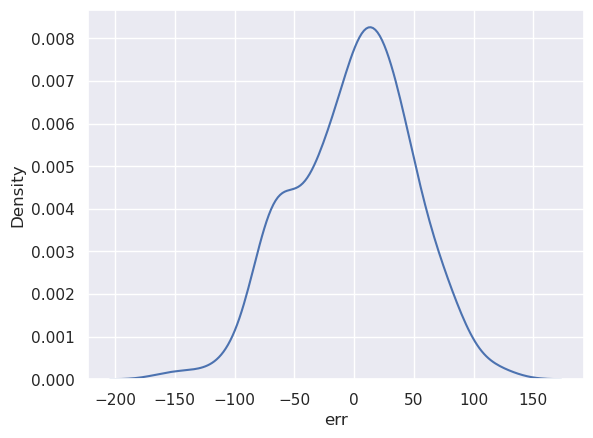

In [226]:
sns.kdeplot(data = clean_set, x = "err")

In [227]:
mhsfpp.cols

['perimeter',
 'ndvi_skew',
 'avg_height',
 'ndri',
 'q_1_precent_fruits',
 'gli',
 'height',
 'cv/surface_area',
 'clusters_area_med_arr',
 'center_perimeter',
 'center_height',
 'mst_mean_arr']

In [228]:
clean_set[clean_set["name"].str.contains("R2")][["name","pred","F","err"]].sort_values("err")

,name,pred,F,err
111,R2_T20,162.113231,191.0,-28.886769
97,R2_T6,162.063423,190.0,-27.936577
109,R2_T18,184.318543,196.0,-11.681457
93,R2_T2,207.751639,206.0,1.751639
128,R2_T37,175.769037,172.0,3.769037
117,R2_T26,172.205880,168.0,4.205880
120,R2_T29,167.615136,160.0,7.615136
130,R2_T39,190.097066,182.0,8.097066
103,R2_T12,106.202559,97.0,9.202559
105,R2_T14,31.454542,20.0,11.454542


In [229]:
# clean_set["abs_err"] = clean_set["err"].abs()
# clean_set.sort_values("abs_err")[mhsfpp.cols[1:] + ["name","pred","F","err"]][-20:]

In [230]:
# clean_set.drop(["abs_err", "err","pred"], axis = 1, inplace = True)

### QuantileRegressor

In [231]:
# mhsfpp_qr = model_hybrid_selector(QuantileRegressor(solver = "highs" ,alpha = 0))
# mhsfpp_qr.fitplusplus(X_tr_lr,y,num_stuck = 3)
# print(cross_validate_with_mean(LinearRegression(),X_tr_lr[mhsfpp_qr.cols],y))

# print(cross_validate_with_mean(LinearRegression(),X_tr_lr[mhsfpp_qr.cols],y,groups = rows))

### fit ploy linear

In [232]:
poly = PolynomialFeatures(interaction_only=False)
cols = mhs.cols

X_inteact = pd.DataFrame(poly.fit_transform(X_tr_lr[cols]),
                         columns = poly.get_feature_names(cols))
mhs_interact =   model_hybrid_selector()          
mhs_interact.fit(X_inteact, y, num_stuck = 3, cols = mhs.cols,use_alwyas = [])

{}
inf


100%|███████████████████████████████████████████| 37/37 [00:00<00:00, 48.95it/s]


added gli^2, new_score: 0.3052846747642246


100%|█████████████████████████████████████████████| 9/9 [00:00<00:00, 40.63it/s]


removed gli, new_score: 0.30328763383034485
score: 0.30328763383034485,cols: ['w_h_ratio', 'height', 'center_height', 'q_1_precent_fruits', 'cv/surface_area', 'center_perimeter', 'perimeter', 'gli^2']


100%|███████████████████████████████████████████| 37/37 [00:00<00:00, 45.41it/s]


added w_h_ratio center_perimeter, new_score: 0.30185386099298983


100%|█████████████████████████████████████████████| 9/9 [00:00<00:00, 34.83it/s]


removed w_h_ratio, new_score: 0.3004582203073878
score: 0.3004582203073878,cols: ['height', 'center_height', 'q_1_precent_fruits', 'cv/surface_area', 'center_perimeter', 'perimeter', 'gli^2', 'w_h_ratio center_perimeter']


100%|███████████████████████████████████████████| 37/37 [00:00<00:00, 42.00it/s]


no feature could be added, new_score: 0.3004582203074072


100%|█████████████████████████████████████████████| 8/8 [00:00<00:00, 37.77it/s]


removed perimeter, new_score: 0.30004986759515
score: 0.30004986759515,cols: ['height', 'center_height', 'q_1_precent_fruits', 'cv/surface_area', 'center_perimeter', 'gli^2', 'w_h_ratio center_perimeter']


100%|███████████████████████████████████████████| 38/38 [00:00<00:00, 51.92it/s]


added center_perimeter perimeter, new_score: 0.29900568393014737


100%|█████████████████████████████████████████████| 8/8 [00:00<00:00, 43.11it/s]


no feature could be removed, new_score: 0.30004986759515
score: 0.29900568393014737,cols: ['height', 'center_height', 'q_1_precent_fruits', 'cv/surface_area', 'center_perimeter', 'gli^2', 'w_h_ratio center_perimeter', 'center_perimeter perimeter']


100%|███████████████████████████████████████████| 37/37 [00:00<00:00, 47.00it/s]


added 1, new_score: 0.29900568393014665


100%|█████████████████████████████████████████████| 9/9 [00:00<00:00, 40.02it/s]


removed 1, new_score: 0.299005683930144
score: 0.299005683930144,cols: ['height', 'center_height', 'q_1_precent_fruits', 'cv/surface_area', 'center_perimeter', 'gli^2', 'w_h_ratio center_perimeter', 'center_perimeter perimeter']


100%|███████████████████████████████████████████| 37/37 [00:00<00:00, 43.54it/s]


no feature could be added, new_score: 0.29900568393014665


100%|█████████████████████████████████████████████| 8/8 [00:00<00:00, 35.55it/s]


no feature could be removed, new_score: 0.30004986759515
score: 0.299005683930144,cols: ['height', 'center_height', 'q_1_precent_fruits', 'cv/surface_area', 'center_perimeter', 'gli^2', 'w_h_ratio center_perimeter', 'center_perimeter perimeter']


100%|███████████████████████████████████████████| 37/37 [00:00<00:00, 44.36it/s]


no feature could be added, new_score: 0.29900568393014665


100%|█████████████████████████████████████████████| 8/8 [00:00<00:00, 54.07it/s]


no feature could be removed, new_score: 0.30004986759515
score: 0.299005683930144,cols: ['height', 'center_height', 'q_1_precent_fruits', 'cv/surface_area', 'center_perimeter', 'gli^2', 'w_h_ratio center_perimeter', 'center_perimeter perimeter']


100%|███████████████████████████████████████████| 37/37 [00:00<00:00, 45.25it/s]


no feature could be added, new_score: 0.29900568393014665


100%|█████████████████████████████████████████████| 8/8 [00:00<00:00, 44.56it/s]


no feature could be removed, new_score: 0.30004986759515
score: 0.299005683930144,cols: ['height', 'center_height', 'q_1_precent_fruits', 'cv/surface_area', 'center_perimeter', 'gli^2', 'w_h_ratio center_perimeter', 'center_perimeter perimeter']


0.299005683930144

### fit scalers

In [233]:
# for sclaer in scalers.keys():
#     print(sclaer)
#     sc = scalers[sclaer]
#     pipe = Pipeline(steps = [(sclaer, sc),
#                             ("lm",LinearRegression())])
#     print(model_hybrid_selector(pipe).fitplusplus(X_tr_lr,y,num_stuck = 3))
#     print("final results")

### XGB

In [234]:
drop_from_trees = ["cv^2", "clusters_area_med_arr", "avg_height","height", "avg_perimeter","perimeter",
                  "width", "avg_width","mst_sums_arr^2","cv*fruit_foliage_ratio","avg_volume"]
X_tr_trees = X_tr_lr.drop(drop_from_trees,axis = 1)

In [235]:
#             'min_child_weight': trial.suggest_float('min_child_weight',1e-1, 2),
#             'max_depth': trial.suggest_int('max_depth',1,9),
#             'gamma': trial.suggest_float("gamma",1e-3, 1),
#             'colsample_bytree': trial.suggest_float('colsample_bytree', 0.3, 1, step=0.1),
#             'colsample_bylevel': trial.suggest_float('colsample_bylevel', 0.3, 1, step=0.1),
#             "reg_alpha" : trial.suggest_float("reg_alpha" ,0.1, 5),
#             "reg_lambda" : trial.suggest_float("reg_lambda" ,0.1, 5),
#             'subsample': trial.suggest_float('subsample', 0.4, 0.9, step=0.1),

xgb_params = {'eta': 0.4317038955895696, 'min_child_weight': 0.7064823672299997, 'max_depth': 17, 
              'gamma': 0.5769908739974827, 'colsample_bytree': 0.6000000000000001, 
              'colsample_bylevel': 0.8, 'reg_alpha': 1.6664166073409137, 'reg_lambda': 3.6252049236590516, 
              'subsample': 0.6000000000000001, 'n_estimators': 960}

xgb_params =  {'eta': 0.08045293046930338,
  'min_child_weight': 1.2169041832751055,
  'max_depth': 9,
  'gamma': 0.8726360469177697,
  'colsample_bytree': 1.0,
  'colsample_bylevel': 0.9000000000000001,
  'reg_alpha': 2.9518939876884756,
  'reg_lambda': 4.759526161107639,
  'subsample': 0.4,
  'n_estimators': 40}
model_xgb = XGBRegressor(**xgb_params)
score = cross_validate(model_xgb, X_tr_lr , y=y,cv=8, n_jobs=-1, scoring="neg_mean_absolute_percentage_error")

In [236]:
print((np.mean(score['test_score']), np.std(score['test_score'])))
print(cross_validate_with_mean(model_xgb,X_tr_lr,y))
print(cross_validate_with_mean(model_xgb,X_tr_lr,y,groups = rows))
print(cross_validate_with_mean(model_xgb,X_tr_lr,y,groups = rows, use_log1p = True))

(-0.37601893691194066, 0.2221385221494696)
true: 1778.0,    pred: 1931.5517578125. (8.64 %) 
true: 2124.0,    pred: 1962.5137939453125. (7.60 %) 
true: 1832.0,    pred: 1938.68701171875. (5.82 %) 
true: 2075.0,    pred: 1740.3060302734375. (16.13 %) 
true: 2209.0,    pred: 2079.400634765625. (5.87 %) 
true: 1671.0,    pred: 1673.7421875. (0.16 %) 
true: 2403.0,    pred: 1945.775146484375. (19.03 %) 
true: 1947.0,    pred: 1546.2772216796875. (20.58 %) 
true: 1560.0,    pred: 1513.084716796875. (3.01 %) 
true: 2242.0,    pred: 1706.3690185546875. (23.89 %) 
true: 2018.0,    pred: 1550.0657958984375. (23.19 %) 
true: 2017.0,    pred: 1698.161865234375. (15.81 %) 
true: 1645.0,    pred: 1795.36474609375. (9.14 %) 
true: 2048.0,    pred: 1710.5015869140625. (16.48 %) 
true: 1670.0,    pred: 1644.706298828125. (1.51 %) 
true: 1840.0,    pred: 1839.908935546875. (0.00 %) 
0.38316982804208954 0.15855919613109729
(0.11054104091677927, 0.07969705025951941)
true: 2801.0,    pred: 2317.927734375.

### feature importance

In [237]:
from sklearn.inspection import permutation_importance
model_xgb = XGBRegressor(**xgb_params)
X_train_lr, X_test_lr, y_train_lr, y_test_lr = train_test_split(X_tr_trees,y,test_size = 0.2)
model_xgb.fit(X_train_lr,y_train_lr)

result = permutation_importance(model_xgb, X_test_lr, y_test_lr, n_repeats=16, n_jobs=8)
sorted_idx = result.importances_mean.argsort()

/home/fruitspec-lab/anaconda3/envs/FsCounter/lib/python3.8/site-packages/xgboost/compat.py:36: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index
/home/fruitspec-lab/anaconda3/envs/FsCounter/lib/python3.8/site-packages/xgboost/data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
/home/fruitspec-lab/anaconda3/envs/FsCounter/lib/python3.8/site-packages/xgboost/compat.py:36: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index
/home/fruitspec-lab/anaconda3/envs/FsCounter/lib/python3.8/site-packages/xgboost/data.py:250: FutureWarn

In [238]:
permutation_importance_res = pd.DataFrame({"names": X_train_lr.columns,"imp": result.importances_mean,
                                          "std": result.importances_std})
permutation_importance_res["l_ci"] = permutation_importance_res["imp"] - 2* permutation_importance_res["std"] 
permutation_importance_res= permutation_importance_res.sort_values("imp",ascending = False)

In [239]:
permutation_importance_res

,names,imp,std,l_ci
33,cv/surface_area,0.054174,0.024023,0.006128
29,center_perimeter,0.047476,0.022553,0.002371
0,mst_sums_arr,0.038802,0.022736,-0.006671
34,cv/total_foliage,0.030783,0.049763,-0.068742
15,ndvi,0.028569,0.016268,-0.003968
32,cv/center_width,0.027384,0.013088,0.001208
18,ndri,0.022238,0.014540,-0.006842
5,clusters_ch_area_med_arr,0.020969,0.015006,-0.009042
31,cv/center_height,0.019889,0.012528,-0.005167
27,foliage_fullness,0.015303,0.018226,-0.021148


In [240]:
imp_params = permutation_importance_res["names"][permutation_importance_res["imp"]> 0].values
model_xgb = XGBRegressor(**xgb_params)
model_xgb.fit(X_tr_trees[imp_params],y)
print((np.mean(score['test_score']), np.std(score['test_score'])))
print(cross_validate_with_mean(model_xgb,X_tr_trees[imp_params],y))
print(cross_validate_with_mean(model_xgb,X_tr_trees[imp_params],y,groups = rows))
print(cross_validate_with_mean(model_xgb,X_tr_trees[imp_params],y,groups = rows, use_log1p = True))

(-0.37601893691194066, 0.2221385221494696)
true: 1778.0,    pred: 1900.982666015625. (6.92 %) 
true: 2124.0,    pred: 1925.629638671875. (9.34 %) 
true: 1832.0,    pred: 1909.20263671875. (4.21 %) 
true: 2075.0,    pred: 1878.8602294921875. (9.45 %) 
true: 2209.0,    pred: 2013.680419921875. (8.84 %) 
true: 1671.0,    pred: 1551.1099853515625. (7.17 %) 
true: 2403.0,    pred: 1911.1533203125. (20.47 %) 
true: 1947.0,    pred: 1631.748779296875. (16.19 %) 
true: 1560.0,    pred: 1490.7191162109375. (4.44 %) 
true: 2242.0,    pred: 1761.8790283203125. (21.41 %) 
true: 2018.0,    pred: 1560.995849609375. (22.65 %) 
true: 2017.0,    pred: 1714.974609375. (14.97 %) 
true: 1645.0,    pred: 1823.039306640625. (10.82 %) 
true: 2048.0,    pred: 1700.9788818359375. (16.94 %) 
true: 1670.0,    pred: 1765.7437744140625. (5.73 %) 
true: 1840.0,    pred: 1769.095947265625. (3.85 %) 
0.3949450600122335 0.23589841362343078
(0.11464364126213775, 0.06211918492820588)
true: 2801.0,    pred: 2532.14575195

### RF

In [241]:
rf_params = {'n_estimators': 1773, 'max_depth': 134, 'min_samples_split': 4, 'min_samples_leaf': 2, 
             'max_features': 1.0, 'ccp_alpha': 0.02258939198870146, 'max_samples': 0.6000000000000001}
rf_params = {'n_estimators': 10,
  'min_samples_split': 3,
  'min_samples_leaf': 2,
  'max_features': 0.6000000000000001,
  'ccp_alpha': 0.01712760331733212,
  'max_samples': 0.9}
model_rf = RandomForestRegressor(**rf_params)
score = cross_validate(model_rf, X_tr_trees , y=y,cv=8, n_jobs=-1, scoring="neg_mean_absolute_percentage_error")

/home/fruitspec-lab/anaconda3/envs/FsCounter/lib/python3.8/site-packages/xgboost/compat.py:36: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index
/home/fruitspec-lab/anaconda3/envs/FsCounter/lib/python3.8/site-packages/xgboost/compat.py:36: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index
/home/fruitspec-lab/anaconda3/envs/FsCounter/lib/python3.8/site-packages/xgboost/compat.py:36: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index
/home/fruitspec-lab/anaconda3/envs/FsCounter/lib/python3.8/site-packages/xgboost/compat.py:36: FutureWarning: pandas.Int64In

In [242]:
print((np.mean(score['test_score']), np.std(score['test_score'])))
print(cross_validate_with_mean(model_rf,X_tr_trees,y))
print(cross_validate_with_mean(model_rf,X_tr_trees,y,groups = rows))
print(cross_validate_with_mean(model_rf,X_tr_trees[imp_params],y,groups = rows, use_log1p = True))

(-0.4752959201086978, 0.4019493802521069)
true: 1778.0,    pred: 2034.0640476190479. (14.40 %) 
true: 2124.0,    pred: 2184.3376190476192. (2.84 %) 
true: 1832.0,    pred: 2027.888650793651. (10.69 %) 
true: 2075.0,    pred: 2077.879761904762. (0.14 %) 
true: 2209.0,    pred: 2204.3172222222224. (0.21 %) 
true: 1671.0,    pred: 1738.195238095238. (4.02 %) 
true: 2403.0,    pred: 2216.6. (7.76 %) 
true: 1947.0,    pred: 1677.0759523809525. (13.86 %) 
true: 1560.0,    pred: 1681.4908730158734. (7.79 %) 
true: 2242.0,    pred: 2082.4054761904763. (7.12 %) 
true: 2018.0,    pred: 1781.335595238095. (11.73 %) 
true: 2017.0,    pred: 1820.3388095238092. (9.75 %) 
true: 1645.0,    pred: 1971.1068315018315. (19.82 %) 
true: 2048.0,    pred: 1962.702619047619. (4.16 %) 
true: 1670.0,    pred: 1842.2591666666667. (10.31 %) 
true: 1840.0,    pred: 2113.4749206349206. (14.86 %) 
0.45122713044832696 0.2675311189681556
(0.08717413015149181, 0.05385711714895547)
true: 2801.0,    pred: 2792.7578571428

In [243]:
X_tr_trees

,mst_sums_arr,mst_mean_arr,mst_skew_arr,clusters_area_mean_arr,clusters_ch_area_mean_arr,clusters_ch_area_med_arr,n_clust_arr_2,q_1_precent_fruits,q_2_precent_fruits,q_3_precent_fruits,...,surface_area,foliage_fullness,center_width,center_perimeter,center_height,cv/center_height,cv/center_width,cv/surface_area,cv/total_foliage,cv_foliage_fullness
0,12.597710,0.242264,0.704270,678.284822,0.008118,0.004457,7.0,0.169811,0.358491,0.320755,...,4.451539,0.910516,1.393694,3.454919,2.726058,20.175653,39.463462,12.355276,1.077426,50.078378
1,15.640507,0.260675,0.844170,166.618756,0.052700,0.010775,8.0,0.147541,0.213115,0.393443,...,4.260234,0.884302,1.360480,2.896509,2.390379,28.029022,49.247311,15.726834,2.768477,59.248237
2,14.081140,0.440036,1.522136,75.255089,0.108324,0.011853,0.0,0.000000,0.060606,0.272727,...,4.335025,0.813764,1.874331,2.358253,2.396084,20.450035,26.142660,11.303280,4.959297,39.874432
3,13.530716,0.255297,0.829357,321.288365,0.002618,0.001886,9.0,0.148148,0.203704,0.185185,...,5.124582,0.903948,1.901631,3.372654,2.783125,22.995734,33.655324,12.488823,5.035396,57.852690
4,14.651901,0.293038,0.940480,292.542622,0.005420,0.001377,6.0,0.117647,0.156863,0.352941,...,5.026591,0.867653,2.006193,3.768176,2.415497,23.183631,27.913559,11.140751,2.546576,48.588592
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
193,11.416763,0.475698,0.592708,290.687659,0.008217,0.008217,6.0,0.160000,0.120000,0.240000,...,3.430291,0.892486,1.603186,1.531700,2.182607,13.286861,18.088981,8.454093,1.983581,25.882097
194,18.986758,0.240339,1.525907,43.529576,0.063278,0.011337,12.0,0.075000,0.287500,0.362500,...,4.061094,0.874083,1.587713,1.707549,2.104993,40.380175,53.536126,20.930322,4.277876,74.297043
195,18.175832,0.193360,1.936324,678.284822,0.034358,0.013199,8.0,0.073684,0.147368,0.347368,...,3.706335,0.847851,1.891296,1.719192,1.906617,55.071369,55.517477,28.329873,6.708858,89.024337
196,12.092071,0.232540,1.883378,404.039993,0.018830,0.001203,4.0,0.037736,0.075472,0.358491,...,4.131677,0.884012,2.226586,3.561745,1.806580,35.426045,28.743558,15.490079,3.604031,56.576777


In [244]:
model_rf = RandomForestRegressor(**rf_params)
X_train_lr, X_test_lr, y_train_lr, y_test_lr = train_test_split(X_tr_trees,y,test_size = 0.2)
model_rf.fit(X_train_lr,y_train_lr)
result = permutation_importance(model_rf, X_test_lr, y_test_lr, n_repeats=16, n_jobs=8)
sorted_idx = result.importances_mean.argsort()
permutation_importance_res = pd.DataFrame({"names": X_train_lr.columns,"imp": result.importances_mean,
                                          "std": result.importances_std})
permutation_importance_res["l_ci"] = permutation_importance_res["imp"] - 2* permutation_importance_res["std"] 
permutation_importance_res= permutation_importance_res.sort_values("imp",ascending = False)
permutation_importance_res

,names,imp,std,l_ci
16,gli,0.081377,0.032714,0.015950
31,cv/center_height,0.029558,0.022913,-0.016268
6,n_clust_arr_2,0.027541,0.020084,-0.012628
27,foliage_fullness,0.023742,0.026870,-0.029998
30,center_height,0.020374,0.032880,-0.045387
4,clusters_ch_area_mean_arr,0.014775,0.008708,-0.002640
22,ndri_skew,0.012116,0.010394,-0.008671
2,mst_skew_arr,0.009113,0.015108,-0.021103
21,sipi_skew,0.008763,0.009251,-0.009740
12,w_h_ratio,0.006975,0.020010,-0.033046


### Lasso

In [ ]:
# import pickle

# # Save the model to a file
# with open('model.pkl', 'wb') as f:
#     pickle.dump(mhsfpp_statisticly, f)


In [251]:
from sklearn.linear_model import LassoCV
las = LassoCV(n_alphas=2500,cv = 16, n_jobs = -1,max_iter=5000)
sc = StandardScaler()
las.fit(pd.DataFrame(sc.fit_transform(X_tr_lr), columns = X_tr_lr.columns),y)

las_score = cross_validate(las, sc.fit_transform(X_tr_lr) ,
               y=y,cv=8, n_jobs=-1, scoring="neg_mean_absolute_percentage_error")

In [252]:
np.mean(las_score["test_score"])

-0.43252751051493094

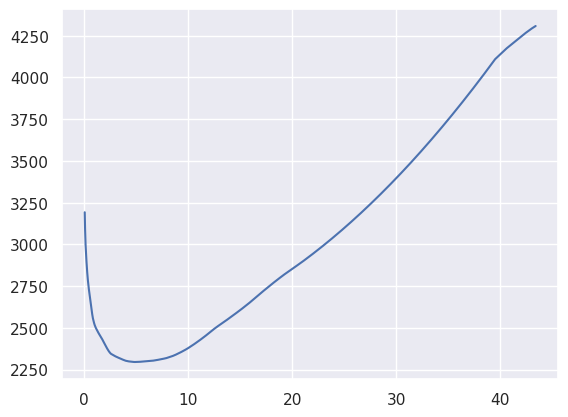

In [253]:
plt.plot(las.alphas_,np.mean(las.mse_path_,axis = 1))

In [254]:
np.mean(las_score["test_score"])

-0.43252751051493094

In [255]:
las_score2 = cross_validate(LinearRegression(), X_tr_lr.loc[:,np.abs(las.coef_) > 0] ,
               y=y,cv=8, n_jobs=-1, scoring="neg_mean_absolute_percentage_error")

In [256]:
print(np.mean(las_score2["test_score"]))

print(X_tr_lr.loc[:,np.abs(las.coef_) > 0].columns)

print(cross_validate_with_mean(LinearRegression(),X_tr_lr.loc[:,np.abs(las.coef_) > 0],y))

print(cross_validate_with_mean(LinearRegression(),X_tr_lr.loc[:,np.abs(las.coef_) > 0],y,groups = rows))

print(cross_validate_with_mean(LinearRegression(),X_tr_lr.loc[:,np.abs(las.coef_) > 0],y,groups = rows, use_log1p = True))


-0.34594131877031464
Index(['clusters_area_med_arr', 'q_1_precent_fruits', 'cv', 'gli', 'sipi',
       'ndri', 'avg_height', 'foliage_fullness', 'cv/surface_area'],
      dtype='object')
true: 1778.0,    pred: 2115.22739871342. (18.97 %) 
true: 2124.0,    pred: 2151.4218363369378. (1.29 %) 
true: 1832.0,    pred: 1994.079451556688. (8.85 %) 
true: 2075.0,    pred: 1947.7670631910307. (6.13 %) 
true: 2209.0,    pred: 2259.8013853873294. (2.30 %) 
true: 1671.0,    pred: 1700.4847947481862. (1.76 %) 
true: 2403.0,    pred: 2338.3822549082497. (2.69 %) 
true: 1947.0,    pred: 1682.8556487147375. (13.57 %) 
true: 1560.0,    pred: 1645.1562656305211. (5.46 %) 
true: 2242.0,    pred: 1867.647191587663. (16.70 %) 
true: 2018.0,    pred: 1783.375883242956. (11.63 %) 
true: 2017.0,    pred: 1849.452378339986. (8.31 %) 
true: 1645.0,    pred: 1987.4757872007694. (20.82 %) 
true: 2048.0,    pred: 1974.4527710992468. (3.59 %) 
true: 1670.0,    pred: 1810.4880532280065. (8.41 %) 
true: 1840.0,    pr

In [257]:
las_log = las.fit(pd.DataFrame(sc.fit_transform(X_tr_lr), columns = X_tr_lr.columns),np.log1p(y))
las_score3 = cross_validate(LinearRegression(), X_tr_lr.loc[:,np.abs(las_log.coef_) > 0] ,
               y=y,cv=8, n_jobs=-1, scoring="neg_mean_absolute_percentage_error")
print(np.mean(las_score3["test_score"]))

print(X_tr_lr.loc[:,np.abs(las.coef_) > 0].columns)

print(cross_validate_with_mean(LinearRegression(),X_tr_lr.loc[:,np.abs(las_log.coef_) > 0],y))

print(cross_validate_with_mean(LinearRegression(),X_tr_lr.loc[:,np.abs(las_log.coef_) > 0],y,groups = rows))

print(cross_validate_with_mean(LinearRegression(),X_tr_lr.loc[:,np.abs(las_log.coef_) > 0],y,groups = rows, use_log1p = True))


-0.3234579313879989
Index(['clusters_area_med_arr', 'q_1_precent_fruits', 'q_2_precent_fruits',
       'q_3_precent_fruits', 'w_h_ratio', 'fruit_foliage_ratio', 'ndvi', 'gli',
       'sipi', 'ndri', 'ndvi_skew', 'sipi_skew', 'total_foliage', 'height',
       'avg_height', 'foliage_fullness', 'center_height', 'cv/center_height',
       'cv/surface_area', 'cv/total_foliage'],
      dtype='object')
true: 1778.0,    pred: 2146.395510688614. (20.72 %) 
true: 2124.0,    pred: 2102.8738623297213. (0.99 %) 
true: 1832.0,    pred: 1989.483409275542. (8.60 %) 
true: 2075.0,    pred: 1990.3052999973852. (4.08 %) 
true: 2209.0,    pred: 2231.916337895247. (1.04 %) 
true: 1671.0,    pred: 1735.2600992624978. (3.85 %) 
true: 2403.0,    pred: 2257.451988154739. (6.06 %) 
true: 1947.0,    pred: 1651.447010908863. (15.18 %) 
true: 1560.0,    pred: 1671.668131298196. (7.16 %) 
true: 2242.0,    pred: 1890.980042637373. (15.66 %) 
true: 2018.0,    pred: 1826.6660926303632. (9.48 %) 
true: 2017.0,    pred:

In [258]:
# for sclaer in scalers.keys():
#     print(sclaer)
#     las = LassoCV(n_alphas=2500,cv = 16, n_jobs = -1,max_iter=5000)
#     sc = scalers[sclaer]
#     las.fit(pd.DataFrame(sc.fit_transform(X_tr_lr), columns = X_tr_lr.columns),y)
#     las_score = cross_validate(las, sc.fit_transform(X_tr_lr) ,
#                    y=y,cv=8, n_jobs=-1, scoring="neg_mean_absolute_percentage_error")
#     print(np.mean(las_score["test_score"]))
#     print(X_tr_lr.loc[:,np.abs(las.coef_) > 0].columns)
#     las_score2 = cross_validate(LinearRegression(), sc.fit_transform(X_tr_lr.loc[:,np.abs(las.coef_) > 0]) ,
#                    y=y,cv=8, n_jobs=-1, scoring="neg_mean_absolute_percentage_error")
#     print(np.mean(las_score2["test_score"]))

Standard
-0.43252751051493094
Index(['clusters_area_med_arr', 'q_1_precent_fruits', 'cv', 'gli', 'sipi',
       'ndri', 'avg_height', 'foliage_fullness', 'cv/surface_area'],
      dtype='object')
-0.34594131877031437
MinMax
-0.41832312952469963
Index(['clusters_area_mean_arr', 'clusters_area_med_arr', 'n_clust_arr_2',
       'q_1_precent_fruits', 'cv', 'ndri', 'avg_height', 'foliage_fullness'],
      dtype='object')
-0.3855473634046216
Power
-0.39363772533981695
Index(['cv', 'gli', 'ndri', 'foliage_fullness', 'cv^2', 'cv/surface_area'], dtype='object')
-0.3330573104192528
Quantile


/home/fruitspec-lab/anaconda3/envs/FsCounter/lib/python3.8/site-packages/sklearn/preprocessing/_data.py:2583: UserWarning: n_quantiles (1000) is greater than the total number of samples (198). n_quantiles is set to n_samples.
  warnings.warn(
/home/fruitspec-lab/anaconda3/envs/FsCounter/lib/python3.8/site-packages/sklearn/preprocessing/_data.py:2583: UserWarning: n_quantiles (1000) is greater than the total number of samples (198). n_quantiles is set to n_samples.
  warnings.warn(


KeyboardInterrupt: 

In [259]:
from sklearn.base import BaseEstimator, TransformerMixin

class LassoSelector(BaseEstimator, TransformerMixin):
    def __init__(self, estimator):
        self.estimator = estimator

    def fit(self, X, y=None):
        self.estimator.fit(X, y)
        self.coefs_ = self.estimator.coef_
        return self

    def transform(self, X):
        return X[:, self.coefs_ != 0]

# Define the column transformer and the model
lasso = LassoCV(n_alphas=2500,cv = 16, n_jobs = -1,max_iter=5000)

# Create the pipeline
pipe = Pipeline([("scaler", scalers["Power"]), 
                 ("lasso_selector", LassoSelector(lasso)),
                 ("final_estimator", LinearRegression())])

las_pipe_score = cross_validate(pipe, X_tr_lr ,
               y=y,cv=8, n_jobs=-1, scoring="neg_mean_absolute_percentage_error")
print(np.mean(las_pipe_score["test_score"]))

-0.34172335877576027


In [266]:
print(np.mean(las_pipe_score["test_score"]))

print(X_tr_lr.loc[:,np.abs(las.coef_) > 0].columns)

print(cross_validate_with_mean(pipe,X_tr_lr,y,groups = rows))

print(cross_validate_with_mean(pipe,X_tr_lr,y,groups = rows, use_log1p = True))

-0.34172335877576027
Index(['clusters_area_med_arr', 'n_clust_arr_2', 'q_1_precent_fruits', 'cv',
       'gli', 'ndri', 'foliage_fullness', 'cv^2', 'cv/surface_area'],
      dtype='object')
true: 2801.0,    pred: 2466.2087204347386. (11.95 %) (R9)
true: 2690.0,    pred: 2399.286376800032. (10.81 %) (R8)
true: 3141.0,    pred: 2487.6521149324253. (20.80 %) (R7)
true: 3405.0,    pred: 3231.0658083270246. (5.11 %) (R6)
true: 3275.0,    pred: 3888.038207502112. (18.72 %) (R5)
true: 3947.0,    pred: 3847.9040757650537. (2.51 %) (R3)
true: 2953.0,    pred: 3502.497426547114. (18.61 %) (R2)
true: 2314.0,    pred: 2640.1111140126477. (14.09 %) (R11)
true: 2625.0,    pred: 2747.621116288682. (4.67 %) (R10)
true: 3928.0,    pred: 3477.185773872083. (11.48 %) (R4)
0.3881966966124197 0.2319221069201815
(0.11874727133478831, 0.06028566881083582)


/home/fruitspec-lab/anaconda3/envs/FsCounter/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:634: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.00598372173837447, tolerance: 0.005458015738217035
  model = cd_fast.enet_coordinate_descent_gram(


true: 2801.0,    pred: 2045.2442753970079. (26.98 %) (R9)


/home/fruitspec-lab/anaconda3/envs/FsCounter/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:634: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.005814597441094804, tolerance: 0.005230605940782282
  model = cd_fast.enet_coordinate_descent_gram(


true: 2690.0,    pred: 2449.106876886678. (8.96 %) (R8)


/home/fruitspec-lab/anaconda3/envs/FsCounter/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:634: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.0058016635211473044, tolerance: 0.0053828344673415435
  model = cd_fast.enet_coordinate_descent_gram(
/home/fruitspec-lab/anaconda3/envs/FsCounter/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:634: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.005478543826679783, tolerance: 0.0053828344673415435
  model = cd_fast.enet_coordinate_descent_gram(
/home/fruitspec-lab/anaconda3/envs/FsCounter/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:634: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.005730646486895807, tolerance: 0.005444535687168788
  model = cd_fast.enet_coordina

true: 3141.0,    pred: 2443.7961574194674. (22.20 %) (R7)
true: 3405.0,    pred: 2929.3455907211096. (13.97 %) (R6)
true: 3275.0,    pred: 3808.495613768783. (16.29 %) (R5)


/home/fruitspec-lab/anaconda3/envs/FsCounter/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:634: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.004251039855066807, tolerance: 0.004174276638548686
  model = cd_fast.enet_coordinate_descent_gram(
/home/fruitspec-lab/anaconda3/envs/FsCounter/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:634: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.005666004719770967, tolerance: 0.0048829920747038074
  model = cd_fast.enet_coordinate_descent_gram(
/home/fruitspec-lab/anaconda3/envs/FsCounter/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:634: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.008713228094620717, tolerance: 0.005270988290726553
  model = cd_fast.enet_coordinate

true: 3947.0,    pred: 4205.226258558414. (6.54 %) (R3)
true: 2953.0,    pred: 3389.159532086265. (14.77 %) (R2)
true: 2314.0,    pred: 2839.30552613304. (22.70 %) (R11)


/home/fruitspec-lab/anaconda3/envs/FsCounter/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:634: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.0065442304442733246, tolerance: 0.005445207286210286
  model = cd_fast.enet_coordinate_descent_gram(
/home/fruitspec-lab/anaconda3/envs/FsCounter/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:634: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.006008176537768861, tolerance: 0.005497393924227001
  model = cd_fast.enet_coordinate_descent_gram(


true: 2625.0,    pred: 2549.1085438532614. (2.89 %) (R10)


/home/fruitspec-lab/anaconda3/envs/FsCounter/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:634: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.0070068280285369156, tolerance: 0.005314494902872299
  model = cd_fast.enet_coordinate_descent_gram(
/home/fruitspec-lab/anaconda3/envs/FsCounter/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:634: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.005400912803764868, tolerance: 0.0052895224525093
  model = cd_fast.enet_coordinate_descent_gram(


true: 3928.0,    pred: 3725.82249662705. (5.15 %) (R4)
0.42419840235051504 0.2989582445161706
(0.14044465287829716, 0.07746543880505773)


In [260]:
import pickle
pipe.fit(X_tr_lr,y)
# Save the model to a file
with open('lasso_pipe.pkl', 'wb') as f:
    pickle.dump(pipe, f)

In [ ]:
# Create the pipeline
for sclaer in scalers.keys():
    lasso = LassoCV(n_alphas=2500,cv = 16, n_jobs = -1,max_iter=5000)
    pipe = Pipeline([("scaler", scalers[sclaer]), 
                 ("lasso_selector", LassoSelector(lasso)),
                 ("final_estimator", LinearRegression())])
    las_pipe_score = cross_validate(pipe, X_tr_lr ,
                   y=y,cv=8, n_jobs=-1, scoring="neg_mean_absolute_percentage_error")
    print(sclaer)
    print(np.mean(las_pipe_score["test_score"]))

### optuna

In [245]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

In [246]:
# XGB with feature selection
# train test split
# train xgb
# permutation_importance
# select all with value above zero
# cross validate

def objective_xgb_w_p_import(trial,n_jobs = -1, scoring = "neg_mean_absolute_percentage_error",
                 n_splits=8, shuffle=True, random_state=42, param = None, stratify = None):
    if not isinstance(stratify, type(None)):
        kfolds = StratifiedKFold(n_splits, shuffle= shuffle, random_state=random_state)
    else:
        kfolds = KFold(n_splits=n_splits, shuffle=shuffle, random_state=random_state)
    if isinstance(param, type(None)):
        param = {
            'objective': trial.suggest_categorical('objective', ["reg:squarederror",
                                                                "reg:pseudohubererror","reg:squaredlogerror"]),
            'eta': trial.suggest_float("eta", 0.0001,0.5, log = True),
            'min_child_weight': trial.suggest_float('min_child_weight',1e-2, 5+1e-2, step=1e-2),
            'max_depth': trial.suggest_int('max_depth',1,7),
            'gamma': trial.suggest_float("gamma",1e-3, 2+1e-3, step=1e-3),
            'colsample_bytree': trial.suggest_float('colsample_bytree', 0.3, 1, step=0.1),
            'colsample_bylevel': trial.suggest_float('colsample_bylevel', 0.3, 1, step=0.1),
            "reg_alpha" : trial.suggest_float("reg_alpha" ,0.1, 20, log = True),
            "reg_lambda" : trial.suggest_float("reg_lambda" ,0.1, 20, log = True),
            'subsample': trial.suggest_float('subsample', 0.4, 0.9, step=0.1),
            'n_estimators': trial.suggest_int('n_estimators', 10, 2500, step = 10)

        }
    reg = XGBRegressor(**param)
    
    X_train_lr, X_test_lr, y_train_lr, y_test_lr = train_test_split(X_tr_trees.reset_index(),y,test_size = 0.2)
    reg.fit(X_train_lr,y_train_lr)

    result = permutation_importance(reg, X_test_lr.reset_index(), y_test_lr, n_repeats=8, n_jobs=n_jobs)
    sorted_idx = result.importances_mean.argsort()
    
    permutation_importance_res = pd.DataFrame({"names": X_train_lr.columns,"imp": result.importances_mean,
                                          "std": result.importances_std}) 
    imp_params = permutation_importance_res["names"][permutation_importance_res["imp"]> 0].values
    reg = XGBRegressor(**param)
    
    scores = cross_val_score(reg, X_tr_trees[imp_params].reset_index(),y, cv=kfolds,scoring=scoring)
    return scores.mean()

In [247]:
def objective_rf(trial,n_jobs = -1, scoring = "neg_mean_absolute_percentage_error",
                 n_splits=8, shuffle=True, random_state=42, param = None, stratify = None):
    if not isinstance(stratify, type(None)):
        kfolds = StratifiedKFold(n_splits, shuffle= shuffle, random_state=random_state)
    else:
        kfolds = KFold(n_splits=n_splits, shuffle=shuffle, random_state=random_state)
    if isinstance(param, type(None)):
        param = {
            'n_estimators': trial.suggest_int("n_estimators",10,5000, step = 10),
#             'max_depth': trial.suggest_int('max_depth', 1,150),
#             'criterion': trial.suggest_categorical('criterion', ["squared_error","absolute_error"]),
            'min_samples_split': trial.suggest_int("min_samples_split", 2,50), ###
            'min_samples_leaf': trial.suggest_int('min_samples_leaf', 2,50),
            'max_features': trial.suggest_float('max_features', 0.3, 1, step=0.1),
            "ccp_alpha" : trial.suggest_float("ccp_alpha" ,1e-16, 0.1, log = True),
            'max_samples': trial.suggest_float('max_samples', 0.4, 0.9, step=0.1),
        }
    reg = RandomForestRegressor(**param)
    scores = cross_val_score(reg, X_tr_trees.reset_index(),y, cv=kfolds,n_jobs = n_jobs,scoring=scoring)
    return scores.mean()


In [248]:
# TODO try RFE with XGV as a combiend pipeline for paramater search
def objective_xgb(trial,n_jobs = -1, scoring = "neg_mean_absolute_percentage_error",
                 n_splits=8, shuffle=True, random_state=42, param = None, stratify = None):
    if not isinstance(stratify, type(None)):
        kfolds = StratifiedKFold(n_splits, shuffle= shuffle, random_state=random_state)
    else:
        kfolds = KFold(n_splits=n_splits, shuffle=shuffle, random_state=random_state)
    if isinstance(param, type(None)):
        param = {
            'objective': trial.suggest_categorical('objective', ["reg:squarederror",
                                                                "reg:pseudohubererror","reg:squaredlogerror"]),
            'eta': trial.suggest_float("eta", 0.0001,0.5, log = True),
            'min_child_weight': trial.suggest_float('min_child_weight',1e-2, 5+1e-2, step=1e-2),
            'max_depth': trial.suggest_int('max_depth',1,7),
            'gamma': trial.suggest_float("gamma",1e-3, 2+1e-3, step=1e-3),
            'colsample_bytree': trial.suggest_float('colsample_bytree', 0.3, 1, step=0.1),
            'colsample_bylevel': trial.suggest_float('colsample_bylevel', 0.3, 1, step=0.1),
            "reg_alpha" : trial.suggest_float("reg_alpha" ,0.1, 20, log = True),
            "reg_lambda" : trial.suggest_float("reg_lambda" ,0.1, 20, log = True),
            'subsample': trial.suggest_float('subsample', 0.4, 0.9, step=0.1),
            'n_estimators': trial.suggest_int('n_estimators', 10, 2500, step = 10)

        }
    reg = XGBRegressor(**param)
    scores = cross_val_score(reg, X_tr_trees.reset_index(),y, cv=kfolds,scoring=scoring)
    return scores.mean()

In [249]:
def optimize_estimator(objective,direction='maximize',n_trails = 200,save_int = 0, save_dst="", read_from=""):
    if read_from != "":
        study = joblib.load(read_from)
    else:
        study = optuna.create_study(direction=direction)
    if save_int == 0:
        study.optimize(objective, n_trials=n_trails, n_jobs = -1)
        if save_dst!="":
            joblib.dump(study, save_dst)
    else:
        trails_per_save = np.ceil(n_trails/save_int)
        for i in range(save_int):
            study.optimize(objective, n_trials=trails_per_save)
            if save_dst!="":
                joblib.dump(study, save_dst)
    best_params = study.best_params
    best_score = study.best_value
    print(f"Best score: {best_score}\n")
    print(f"Optimized parameters: {best_params}\n")
    return best_params, best_score

In [250]:
optimize_estimator(objective_xgb,n_trails=10000,save_int = 100,save_dst = "study_ndvi_fix.pkl")

[I 2023-01-16 14:24:02,205] A new study created in memory with name: no-name-a3979009-e337-4b5f-87fe-9b8f8f02a94b
[I 2023-01-16 14:24:03,286] Trial 0 finished with value: -0.42209148220907955 and parameters: {'objective': 'reg:squarederror', 'eta': 0.17979006444391218, 'min_child_weight': 2.19, 'max_depth': 4, 'gamma': 1.532, 'colsample_bytree': 0.6000000000000001, 'colsample_bylevel': 0.7, 'reg_alpha': 3.9447608345938305, 'reg_lambda': 0.17894872355940164, 'subsample': 0.9, 'n_estimators': 260}. Best is trial 0 with value: -0.42209148220907955.
[I 2023-01-16 14:24:03,916] Trial 1 finished with value: -0.9415500928985864 and parameters: {'objective': 'reg:squarederror', 'eta': 0.0002649650963319547, 'min_child_weight': 0.12, 'max_depth': 5, 'gamma': 1.551, 'colsample_bytree': 0.8, 'colsample_bylevel': 0.8, 'reg_alpha': 0.586818168476221, 'reg_lambda': 6.090807859076679, 'subsample': 0.4, 'n_estimators': 190}. Best is trial 0 with value: -0.42209148220907955.
[I 2023-01-16 14:24:13,974]

[I 2023-01-16 14:25:40,759] Trial 18 finished with value: -0.8962357074144033 and parameters: {'objective': 'reg:squaredlogerror', 'eta': 0.122222554687513, 'min_child_weight': 2.6399999999999997, 'max_depth': 6, 'gamma': 1.337, 'colsample_bytree': 0.4, 'colsample_bylevel': 0.9000000000000001, 'reg_alpha': 19.665977150080547, 'reg_lambda': 3.3044360696840784, 'subsample': 0.9, 'n_estimators': 1260}. Best is trial 16 with value: -0.40482554130172144.
[I 2023-01-16 14:25:41,600] Trial 19 finished with value: -0.9952759283598929 and parameters: {'objective': 'reg:pseudohubererror', 'eta': 0.01438138001759535, 'min_child_weight': 3.6599999999999997, 'max_depth': 5, 'gamma': 1.045, 'colsample_bytree': 0.5, 'colsample_bylevel': 0.5, 'reg_alpha': 2.1354074691815, 'reg_lambda': 0.1116560602350538, 'subsample': 0.8, 'n_estimators': 590}. Best is trial 16 with value: -0.40482554130172144.
[I 2023-01-16 14:25:51,097] Trial 20 finished with value: -0.4153929668685147 and parameters: {'objective': 

[I 2023-01-16 14:27:55,236] Trial 36 finished with value: -0.8870991761885658 and parameters: {'objective': 'reg:squarederror', 'eta': 0.0034922100516201096, 'min_child_weight': 2.07, 'max_depth': 6, 'gamma': 0.41400000000000003, 'colsample_bytree': 1.0, 'colsample_bylevel': 0.7, 'reg_alpha': 1.4440055941846635, 'reg_lambda': 16.08718212225759, 'subsample': 0.9, 'n_estimators': 30}. Best is trial 22 with value: -0.354693860389294.
[I 2023-01-16 14:28:04,724] Trial 37 finished with value: -0.3566376926810426 and parameters: {'objective': 'reg:squarederror', 'eta': 0.0008952778432612016, 'min_child_weight': 2.9299999999999997, 'max_depth': 5, 'gamma': 0.891, 'colsample_bytree': 0.8, 'colsample_bylevel': 0.8, 'reg_alpha': 0.6627911608979804, 'reg_lambda': 7.2641404006675705, 'subsample': 0.8, 'n_estimators': 2360}. Best is trial 22 with value: -0.354693860389294.
[I 2023-01-16 14:28:11,332] Trial 38 finished with value: -0.7563117550628424 and parameters: {'objective': 'reg:squarederror',

[I 2023-01-16 14:29:40,905] Trial 54 finished with value: -0.3702009281780745 and parameters: {'objective': 'reg:squarederror', 'eta': 0.0010463315005514201, 'min_child_weight': 3.31, 'max_depth': 4, 'gamma': 0.789, 'colsample_bytree': 0.7, 'colsample_bylevel': 0.4, 'reg_alpha': 1.441630673120549, 'reg_lambda': 1.986458444949739, 'subsample': 0.6000000000000001, 'n_estimators': 1870}. Best is trial 47 with value: -0.35419914000081665.
[I 2023-01-16 14:29:43,419] Trial 55 finished with value: -0.3935654528494654 and parameters: {'objective': 'reg:squarederror', 'eta': 0.009327799041404935, 'min_child_weight': 3.54, 'max_depth': 5, 'gamma': 0.612, 'colsample_bytree': 0.8, 'colsample_bylevel': 0.3, 'reg_alpha': 0.3490863725132549, 'reg_lambda': 5.227433663149638, 'subsample': 0.6000000000000001, 'n_estimators': 610}. Best is trial 47 with value: -0.35419914000081665.
[I 2023-01-16 14:29:53,308] Trial 56 finished with value: -0.42431575184006654 and parameters: {'objective': 'reg:squareder

[I 2023-01-16 14:31:06,628] Trial 72 finished with value: -0.3563253161341326 and parameters: {'objective': 'reg:squarederror', 'eta': 0.001813757731932781, 'min_child_weight': 2.3, 'max_depth': 4, 'gamma': 1.361, 'colsample_bytree': 1.0, 'colsample_bylevel': 0.7, 'reg_alpha': 1.3313155423926808, 'reg_lambda': 14.303626568955995, 'subsample': 0.5, 'n_estimators': 1820}. Best is trial 60 with value: -0.35342899066915034.
[I 2023-01-16 14:31:13,706] Trial 73 finished with value: -0.37880327629235866 and parameters: {'objective': 'reg:squarederror', 'eta': 0.0032948481654978354, 'min_child_weight': 1.71, 'max_depth': 4, 'gamma': 1.484, 'colsample_bytree': 0.9000000000000001, 'colsample_bylevel': 0.7, 'reg_alpha': 1.363963927856381, 'reg_lambda': 13.135474357356081, 'subsample': 0.5, 'n_estimators': 1820}. Best is trial 60 with value: -0.35342899066915034.
[I 2023-01-16 14:31:17,745] Trial 74 finished with value: -0.4083308033933576 and parameters: {'objective': 'reg:squarederror', 'eta': 

[I 2023-01-16 14:32:53,842] Trial 91 finished with value: -0.3523117335118616 and parameters: {'objective': 'reg:squarederror', 'eta': 0.0015006759512835493, 'min_child_weight': 0.55, 'max_depth': 3, 'gamma': 0.8150000000000001, 'colsample_bytree': 1.0, 'colsample_bylevel': 0.9000000000000001, 'reg_alpha': 0.46280981669894017, 'reg_lambda': 16.28639087640164, 'subsample': 0.5, 'n_estimators': 1870}. Best is trial 89 with value: -0.3516909155133282.
[I 2023-01-16 14:32:58,123] Trial 92 finished with value: -0.3708447784850162 and parameters: {'objective': 'reg:squarederror', 'eta': 0.0020021886075994207, 'min_child_weight': 0.59, 'max_depth': 2, 'gamma': 0.848, 'colsample_bytree': 1.0, 'colsample_bylevel': 1.0, 'reg_alpha': 0.4921482072044187, 'reg_lambda': 17.82631726197521, 'subsample': 0.5, 'n_estimators': 1920}. Best is trial 89 with value: -0.3516909155133282.
[I 2023-01-16 14:33:03,344] Trial 93 finished with value: -0.39746961074873327 and parameters: {'objective': 'reg:squareder

[I 2023-01-16 14:34:20,577] Trial 109 finished with value: -0.4055591085550156 and parameters: {'objective': 'reg:squarederror', 'eta': 0.008051185204887755, 'min_child_weight': 1.4100000000000001, 'max_depth': 3, 'gamma': 0.9420000000000001, 'colsample_bytree': 1.0, 'colsample_bylevel': 0.8, 'reg_alpha': 0.8964605035327002, 'reg_lambda': 11.611981375210082, 'subsample': 0.7000000000000001, 'n_estimators': 1660}. Best is trial 89 with value: -0.3516909155133282.
[I 2023-01-16 14:34:29,316] Trial 110 finished with value: -0.35547929774247167 and parameters: {'objective': 'reg:squarederror', 'eta': 0.00119010869337013, 'min_child_weight': 2.4899999999999998, 'max_depth': 6, 'gamma': 1.488, 'colsample_bytree': 0.8, 'colsample_bylevel': 0.7, 'reg_alpha': 0.5832707210480199, 'reg_lambda': 8.796448121786947, 'subsample': 0.4, 'n_estimators': 2330}. Best is trial 89 with value: -0.3516909155133282.
[I 2023-01-16 14:34:37,998] Trial 111 finished with value: -0.35588527178530416 and parameters:

[I 2023-01-16 14:37:19,035] Trial 128 finished with value: -0.49518408161182886 and parameters: {'objective': 'reg:squarederror', 'eta': 0.00035779051178591256, 'min_child_weight': 1.35, 'max_depth': 7, 'gamma': 1.496, 'colsample_bytree': 0.8, 'colsample_bylevel': 0.7, 'reg_alpha': 0.1329203838340789, 'reg_lambda': 15.317762116684792, 'subsample': 0.5, 'n_estimators': 2360}. Best is trial 122 with value: -0.34979365075875923.
[I 2023-01-16 14:37:28,973] Trial 129 finished with value: -0.39434390040366357 and parameters: {'objective': 'reg:squarederror', 'eta': 0.0006418065475854191, 'min_child_weight': 0.93, 'max_depth': 7, 'gamma': 1.506, 'colsample_bytree': 0.8, 'colsample_bylevel': 0.5, 'reg_alpha': 0.3645031823365988, 'reg_lambda': 18.82385377468356, 'subsample': 0.5, 'n_estimators': 2300}. Best is trial 122 with value: -0.34979365075875923.
[I 2023-01-16 14:37:38,427] Trial 130 finished with value: -0.35804372782021326 and parameters: {'objective': 'reg:squarederror', 'eta': 0.000

[I 2023-01-16 14:40:18,201] Trial 146 finished with value: -0.3766100212703405 and parameters: {'objective': 'reg:squarederror', 'eta': 0.0027883969122526175, 'min_child_weight': 1.1500000000000001, 'max_depth': 7, 'gamma': 1.4, 'colsample_bytree': 0.8, 'colsample_bylevel': 0.6000000000000001, 'reg_alpha': 0.16533429498796598, 'reg_lambda': 13.859491928288033, 'subsample': 0.5, 'n_estimators': 2280}. Best is trial 122 with value: -0.34979365075875923.
[I 2023-01-16 14:40:26,846] Trial 147 finished with value: -0.35285708942007166 and parameters: {'objective': 'reg:squarederror', 'eta': 0.001087528912778875, 'min_child_weight': 1.77, 'max_depth': 7, 'gamma': 1.329, 'colsample_bytree': 0.8, 'colsample_bylevel': 0.6000000000000001, 'reg_alpha': 0.1414004566444937, 'reg_lambda': 18.45732850913406, 'subsample': 0.5, 'n_estimators': 2110}. Best is trial 122 with value: -0.34979365075875923.
[I 2023-01-16 14:40:35,721] Trial 148 finished with value: -0.3495802109655036 and parameters: {'objec

[I 2023-01-16 14:42:48,223] Trial 164 finished with value: -0.34926703438083456 and parameters: {'objective': 'reg:squarederror', 'eta': 0.0012029625965038404, 'min_child_weight': 1.79, 'max_depth': 7, 'gamma': 1.176, 'colsample_bytree': 0.6000000000000001, 'colsample_bylevel': 0.5, 'reg_alpha': 0.14110659839720469, 'reg_lambda': 10.960343155623358, 'subsample': 0.5, 'n_estimators': 2040}. Best is trial 157 with value: -0.34818987010145114.
[I 2023-01-16 14:42:55,895] Trial 165 finished with value: -0.3698112527777092 and parameters: {'objective': 'reg:squarederror', 'eta': 0.0008279216805670537, 'min_child_weight': 1.8, 'max_depth': 7, 'gamma': 1.1769999999999998, 'colsample_bytree': 0.6000000000000001, 'colsample_bylevel': 0.5, 'reg_alpha': 0.15005225880399378, 'reg_lambda': 11.028736739565167, 'subsample': 0.5, 'n_estimators': 2060}. Best is trial 157 with value: -0.34818987010145114.
[I 2023-01-16 14:43:04,409] Trial 166 finished with value: -0.349282245376692 and parameters: {'obj

[I 2023-01-16 14:45:09,781] Trial 182 finished with value: -0.3480362244451052 and parameters: {'objective': 'reg:squarederror', 'eta': 0.0012501410223383761, 'min_child_weight': 1.6700000000000002, 'max_depth': 7, 'gamma': 1.192, 'colsample_bytree': 0.6000000000000001, 'colsample_bylevel': 0.5, 'reg_alpha': 0.14583230446301315, 'reg_lambda': 13.847102933940128, 'subsample': 0.5, 'n_estimators': 2030}. Best is trial 171 with value: -0.34762661119251775.
[I 2023-01-16 14:45:22,353] Trial 183 finished with value: -0.3908932911889773 and parameters: {'objective': 'reg:squarederror', 'eta': 0.0012574606451329535, 'min_child_weight': 1.68, 'max_depth': 7, 'gamma': 1.206, 'colsample_bytree': 0.6000000000000001, 'colsample_bylevel': 0.5, 'reg_alpha': 0.15106300438687403, 'reg_lambda': 0.34129845728589364, 'subsample': 0.5, 'n_estimators': 2070}. Best is trial 171 with value: -0.34762661119251775.
[I 2023-01-16 14:45:34,414] Trial 184 finished with value: -0.3982057981822754 and parameters: {'

[I 2023-01-16 14:47:48,482] Trial 200 finished with value: -0.34866728158614463 and parameters: {'objective': 'reg:squarederror', 'eta': 0.0012831518912307365, 'min_child_weight': 1.9000000000000001, 'max_depth': 7, 'gamma': 1.218, 'colsample_bytree': 0.6000000000000001, 'colsample_bylevel': 0.5, 'reg_alpha': 0.10929724258551689, 'reg_lambda': 14.267938441519753, 'subsample': 0.5, 'n_estimators': 1930}. Best is trial 171 with value: -0.34762661119251775.
[I 2023-01-16 14:47:56,923] Trial 201 finished with value: -0.3480075593216436 and parameters: {'objective': 'reg:squarederror', 'eta': 0.0012832146508374774, 'min_child_weight': 1.85, 'max_depth': 7, 'gamma': 1.184, 'colsample_bytree': 0.6000000000000001, 'colsample_bylevel': 0.5, 'reg_alpha': 0.11629521085145605, 'reg_lambda': 14.140394409470227, 'subsample': 0.5, 'n_estimators': 1990}. Best is trial 171 with value: -0.34762661119251775.
[I 2023-01-16 14:48:05,921] Trial 202 finished with value: -0.3492324656703748 and parameters: {'

[I 2023-01-16 14:50:21,070] Trial 218 finished with value: -0.3566023220009266 and parameters: {'objective': 'reg:squarederror', 'eta': 0.0017220634553734362, 'min_child_weight': 1.68, 'max_depth': 7, 'gamma': 1.0579999999999998, 'colsample_bytree': 0.5, 'colsample_bylevel': 0.5, 'reg_alpha': 0.11646141202735144, 'reg_lambda': 10.113297558995946, 'subsample': 0.5, 'n_estimators': 1880}. Best is trial 171 with value: -0.34762661119251775.
[I 2023-01-16 14:50:29,753] Trial 219 finished with value: -0.35040660201984364 and parameters: {'objective': 'reg:squarederror', 'eta': 0.001467058373780157, 'min_child_weight': 1.58, 'max_depth': 7, 'gamma': 1.0299999999999998, 'colsample_bytree': 0.6000000000000001, 'colsample_bylevel': 0.4, 'reg_alpha': 0.10017412139780373, 'reg_lambda': 14.737452827190513, 'subsample': 0.5, 'n_estimators': 1940}. Best is trial 171 with value: -0.34762661119251775.
[I 2023-01-16 14:50:37,815] Trial 220 finished with value: -0.3544160259826834 and parameters: {'obje

[I 2023-01-16 14:52:49,569] Trial 236 finished with value: -0.36011592208960563 and parameters: {'objective': 'reg:squarederror', 'eta': 0.0009513551393379234, 'min_child_weight': 1.7, 'max_depth': 7, 'gamma': 1.1629999999999998, 'colsample_bytree': 0.6000000000000001, 'colsample_bylevel': 0.5, 'reg_alpha': 0.10129970245591047, 'reg_lambda': 15.060238433420746, 'subsample': 0.5, 'n_estimators': 2100}. Best is trial 171 with value: -0.34762661119251775.
[I 2023-01-16 14:52:58,540] Trial 237 finished with value: -0.35588581748457954 and parameters: {'objective': 'reg:squarederror', 'eta': 0.0016572904516813332, 'min_child_weight': 1.8, 'max_depth': 7, 'gamma': 1.0779999999999998, 'colsample_bytree': 0.6000000000000001, 'colsample_bylevel': 0.4, 'reg_alpha': 0.12155342091687135, 'reg_lambda': 10.367845755289904, 'subsample': 0.5, 'n_estimators': 1970}. Best is trial 171 with value: -0.34762661119251775.
[I 2023-01-16 14:53:07,751] Trial 238 finished with value: -0.34764876155247637 and pa

[I 2023-01-16 14:55:18,552] Trial 254 finished with value: -0.3480009360906288 and parameters: {'objective': 'reg:squarederror', 'eta': 0.0012113424042963683, 'min_child_weight': 1.42, 'max_depth': 7, 'gamma': 0.999, 'colsample_bytree': 0.6000000000000001, 'colsample_bylevel': 0.5, 'reg_alpha': 0.15960997074556832, 'reg_lambda': 13.267007318040857, 'subsample': 0.5, 'n_estimators': 2130}. Best is trial 243 with value: -0.34727538349029374.
[I 2023-01-16 14:55:28,783] Trial 255 finished with value: -0.3600563475256967 and parameters: {'objective': 'reg:squarederror', 'eta': 0.0018616569906210853, 'min_child_weight': 1.52, 'max_depth': 7, 'gamma': 1.012, 'colsample_bytree': 0.6000000000000001, 'colsample_bylevel': 0.5, 'reg_alpha': 0.1712353500281805, 'reg_lambda': 13.396483259646542, 'subsample': 0.5, 'n_estimators': 2150}. Best is trial 243 with value: -0.34727538349029374.
[I 2023-01-16 14:55:36,441] Trial 256 finished with value: -0.36556051213668916 and parameters: {'objective': 're

[I 2023-01-16 14:58:03,029] Trial 272 finished with value: -0.3492573323220213 and parameters: {'objective': 'reg:squarederror', 'eta': 0.0011373088206350812, 'min_child_weight': 1.43, 'max_depth': 7, 'gamma': 1.079, 'colsample_bytree': 0.6000000000000001, 'colsample_bylevel': 0.5, 'reg_alpha': 0.1349502767289674, 'reg_lambda': 11.04961777603283, 'subsample': 0.5, 'n_estimators': 2350}. Best is trial 243 with value: -0.34727538349029374.
[I 2023-01-16 14:58:13,476] Trial 273 finished with value: -0.3585875681401529 and parameters: {'objective': 'reg:squarederror', 'eta': 0.001962606714407291, 'min_child_weight': 1.72, 'max_depth': 7, 'gamma': 1.008, 'colsample_bytree': 0.6000000000000001, 'colsample_bylevel': 0.5, 'reg_alpha': 0.12238485709668086, 'reg_lambda': 14.907752486396676, 'subsample': 0.5, 'n_estimators': 2130}. Best is trial 243 with value: -0.34727538349029374.
[I 2023-01-16 14:58:27,522] Trial 274 finished with value: -0.38350070628972344 and parameters: {'objective': 'reg:

[I 2023-01-16 15:00:30,676] Trial 290 finished with value: -0.35658296787652266 and parameters: {'objective': 'reg:squarederror', 'eta': 0.0011500656270911457, 'min_child_weight': 3.94, 'max_depth': 7, 'gamma': 1.158, 'colsample_bytree': 0.6000000000000001, 'colsample_bylevel': 0.5, 'reg_alpha': 0.12977217235956656, 'reg_lambda': 10.97837302085693, 'subsample': 0.5, 'n_estimators': 2070}. Best is trial 243 with value: -0.34727538349029374.
[I 2023-01-16 15:00:35,909] Trial 291 finished with value: -0.7275931457279834 and parameters: {'objective': 'reg:squarederror', 'eta': 0.00014349970409268078, 'min_child_weight': 1.6400000000000001, 'max_depth': 7, 'gamma': 1.277, 'colsample_bytree': 0.7, 'colsample_bylevel': 0.5, 'reg_alpha': 0.11400737515875714, 'reg_lambda': 14.245870982361055, 'subsample': 0.5, 'n_estimators': 2130}. Best is trial 243 with value: -0.34727538349029374.
[I 2023-01-16 15:00:48,341] Trial 292 finished with value: -0.37496187767031364 and parameters: {'objective': 'r

[I 2023-01-16 15:02:56,267] Trial 308 finished with value: -0.34878133642276155 and parameters: {'objective': 'reg:squarederror', 'eta': 0.0011421757650808251, 'min_child_weight': 1.44, 'max_depth': 7, 'gamma': 1.146, 'colsample_bytree': 0.6000000000000001, 'colsample_bylevel': 0.5, 'reg_alpha': 0.11141185137796886, 'reg_lambda': 8.714601699452603, 'subsample': 0.5, 'n_estimators': 2140}. Best is trial 243 with value: -0.34727538349029374.
[I 2023-01-16 15:03:05,253] Trial 309 finished with value: -0.35619124031231525 and parameters: {'objective': 'reg:squarederror', 'eta': 0.0009142924030809399, 'min_child_weight': 1.74, 'max_depth': 7, 'gamma': 1.277, 'colsample_bytree': 0.6000000000000001, 'colsample_bylevel': 0.5, 'reg_alpha': 0.2022123947829211, 'reg_lambda': 15.706476257574868, 'subsample': 0.5, 'n_estimators': 2320}. Best is trial 243 with value: -0.34727538349029374.
[I 2023-01-16 15:03:08,807] Trial 310 finished with value: -0.38904759899637575 and parameters: {'objective': 'r

[I 2023-01-16 15:05:18,585] Trial 326 finished with value: -0.9952759283598929 and parameters: {'objective': 'reg:pseudohubererror', 'eta': 0.0014776401755579257, 'min_child_weight': 1.47, 'max_depth': 7, 'gamma': 1.0439999999999998, 'colsample_bytree': 0.6000000000000001, 'colsample_bylevel': 0.5, 'reg_alpha': 0.18547979515155033, 'reg_lambda': 14.169014686743148, 'subsample': 0.5, 'n_estimators': 2140}. Best is trial 243 with value: -0.34727538349029374.
[I 2023-01-16 15:05:21,591] Trial 327 finished with value: -0.36723045274201743 and parameters: {'objective': 'reg:squarederror', 'eta': 0.0022224866730972763, 'min_child_weight': 1.59, 'max_depth': 7, 'gamma': 1.0839999999999999, 'colsample_bytree': 0.4, 'colsample_bylevel': 0.5, 'reg_alpha': 0.1444651194667295, 'reg_lambda': 12.174104170770724, 'subsample': 0.5, 'n_estimators': 830}. Best is trial 243 with value: -0.34727538349029374.
[I 2023-01-16 15:05:29,632] Trial 328 finished with value: -0.349863053023453 and parameters: {'ob

[I 2023-01-16 15:07:47,060] Trial 344 finished with value: -0.9313101083435349 and parameters: {'objective': 'reg:squaredlogerror', 'eta': 0.0027469520203374804, 'min_child_weight': 1.51, 'max_depth': 7, 'gamma': 1.1569999999999998, 'colsample_bytree': 0.7, 'colsample_bylevel': 0.5, 'reg_alpha': 0.10048499481449803, 'reg_lambda': 18.81149462775806, 'subsample': 0.5, 'n_estimators': 1970}. Best is trial 243 with value: -0.34727538349029374.
[I 2023-01-16 15:07:55,167] Trial 345 finished with value: -0.34953841081319503 and parameters: {'objective': 'reg:squarederror', 'eta': 0.0015323200882055032, 'min_child_weight': 1.3800000000000001, 'max_depth': 7, 'gamma': 1.198, 'colsample_bytree': 0.5, 'colsample_bylevel': 0.5, 'reg_alpha': 0.12280518105399343, 'reg_lambda': 16.297508715744236, 'subsample': 0.5, 'n_estimators': 1920}. Best is trial 243 with value: -0.34727538349029374.
[I 2023-01-16 15:08:06,067] Trial 346 finished with value: -0.36358671844603 and parameters: {'objective': 'reg:

[I 2023-01-16 15:10:39,398] Trial 362 finished with value: -0.35766099046828204 and parameters: {'objective': 'reg:squarederror', 'eta': 0.0014222495333572247, 'min_child_weight': 1.3, 'max_depth': 7, 'gamma': 1.271, 'colsample_bytree': 0.7, 'colsample_bylevel': 0.5, 'reg_alpha': 0.1099823071643528, 'reg_lambda': 15.192250316536452, 'subsample': 0.7000000000000001, 'n_estimators': 2110}. Best is trial 243 with value: -0.34727538349029374.
[I 2023-01-16 15:10:49,505] Trial 363 finished with value: -0.347402166353659 and parameters: {'objective': 'reg:squarederror', 'eta': 0.0011677965548583082, 'min_child_weight': 1.26, 'max_depth': 7, 'gamma': 1.4549999999999998, 'colsample_bytree': 0.7, 'colsample_bylevel': 0.5, 'reg_alpha': 0.15864968972651436, 'reg_lambda': 15.293825753954257, 'subsample': 0.5, 'n_estimators': 2330}. Best is trial 243 with value: -0.34727538349029374.
[I 2023-01-16 15:11:00,516] Trial 364 finished with value: -0.35583033562200495 and parameters: {'objective': 'reg:s

[I 2023-01-16 15:13:16,824] Trial 381 finished with value: -0.35075679806090226 and parameters: {'objective': 'reg:squarederror', 'eta': 0.0011141389561624391, 'min_child_weight': 1.59, 'max_depth': 6, 'gamma': 1.121, 'colsample_bytree': 0.7, 'colsample_bylevel': 0.5, 'reg_alpha': 0.1683728323509349, 'reg_lambda': 18.1513717768137, 'subsample': 0.5, 'n_estimators': 2130}. Best is trial 243 with value: -0.34727538349029374.
[I 2023-01-16 15:13:25,386] Trial 382 finished with value: -0.3555811255394559 and parameters: {'objective': 'reg:squarederror', 'eta': 0.000946132289355714, 'min_child_weight': 1.12, 'max_depth': 7, 'gamma': 0.9390000000000001, 'colsample_bytree': 0.7, 'colsample_bylevel': 0.5, 'reg_alpha': 0.14518165390973856, 'reg_lambda': 13.518164146920268, 'subsample': 0.5, 'n_estimators': 2180}. Best is trial 243 with value: -0.34727538349029374.
[I 2023-01-16 15:13:34,917] Trial 383 finished with value: -0.34718299372119377 and parameters: {'objective': 'reg:squarederror', 'e

[I 2023-01-16 15:15:53,566] Trial 400 finished with value: -0.4070366140390075 and parameters: {'objective': 'reg:squarederror', 'eta': 0.0006149992128939717, 'min_child_weight': 1.24, 'max_depth': 7, 'gamma': 1.0919999999999999, 'colsample_bytree': 0.6000000000000001, 'colsample_bylevel': 0.4, 'reg_alpha': 15.085299494760848, 'reg_lambda': 14.860489228265589, 'subsample': 0.5, 'n_estimators': 2140}. Best is trial 383 with value: -0.34718299372119377.
[I 2023-01-16 15:16:02,122] Trial 401 finished with value: -0.36027070472575684 and parameters: {'objective': 'reg:squarederror', 'eta': 0.0008823163311261474, 'min_child_weight': 1.62, 'max_depth': 7, 'gamma': 1.149, 'colsample_bytree': 0.6000000000000001, 'colsample_bylevel': 0.5, 'reg_alpha': 0.18134963250443878, 'reg_lambda': 16.97542805286622, 'subsample': 0.5, 'n_estimators': 2280}. Best is trial 383 with value: -0.34718299372119377.
[I 2023-01-16 15:16:03,976] Trial 402 finished with value: -0.5177261540083916 and parameters: {'obj

[I 2023-01-16 15:18:30,676] Trial 418 finished with value: -0.4834969103112934 and parameters: {'objective': 'reg:squarederror', 'eta': 0.0004259898294767698, 'min_child_weight': 1.6, 'max_depth': 7, 'gamma': 1.184, 'colsample_bytree': 0.6000000000000001, 'colsample_bylevel': 0.5, 'reg_alpha': 0.24726348289699743, 'reg_lambda': 12.887682047455538, 'subsample': 0.5, 'n_estimators': 2050}. Best is trial 383 with value: -0.34718299372119377.
[I 2023-01-16 15:18:39,270] Trial 419 finished with value: -0.35180593979013763 and parameters: {'objective': 'reg:squarederror', 'eta': 0.0010719023242416958, 'min_child_weight': 1.3800000000000001, 'max_depth': 7, 'gamma': 1.024, 'colsample_bytree': 0.6000000000000001, 'colsample_bylevel': 0.5, 'reg_alpha': 0.12205061127568383, 'reg_lambda': 18.608538704199052, 'subsample': 0.5, 'n_estimators': 2210}. Best is trial 383 with value: -0.34718299372119377.
[I 2023-01-16 15:18:42,127] Trial 420 finished with value: -0.9952759283598929 and parameters: {'o

[I 2023-01-16 15:21:02,229] Trial 436 finished with value: -0.34683850528066895 and parameters: {'objective': 'reg:squarederror', 'eta': 0.0013259855701700585, 'min_child_weight': 1.53, 'max_depth': 7, 'gamma': 1.015, 'colsample_bytree': 0.6000000000000001, 'colsample_bylevel': 0.5, 'reg_alpha': 0.15384423475800446, 'reg_lambda': 19.831976581990574, 'subsample': 0.5, 'n_estimators': 2260}. Best is trial 436 with value: -0.34683850528066895.
[I 2023-01-16 15:21:13,433] Trial 437 finished with value: -0.3663957106672014 and parameters: {'objective': 'reg:squarederror', 'eta': 0.0025650693895533754, 'min_child_weight': 1.34, 'max_depth': 7, 'gamma': 0.936, 'colsample_bytree': 0.6000000000000001, 'colsample_bylevel': 0.5, 'reg_alpha': 0.15967654949384863, 'reg_lambda': 19.7137314838052, 'subsample': 0.5, 'n_estimators': 2250}. Best is trial 436 with value: -0.34683850528066895.
[I 2023-01-16 15:21:23,361] Trial 438 finished with value: -0.3497395940973862 and parameters: {'objective': 'reg

[I 2023-01-16 15:23:52,113] Trial 454 finished with value: -0.3459895946704062 and parameters: {'objective': 'reg:squarederror', 'eta': 0.0012482848809791344, 'min_child_weight': 0.9400000000000001, 'max_depth': 7, 'gamma': 1.113, 'colsample_bytree': 0.6000000000000001, 'colsample_bylevel': 0.5, 'reg_alpha': 0.1214010553954636, 'reg_lambda': 15.688407624418463, 'subsample': 0.5, 'n_estimators': 2170}. Best is trial 454 with value: -0.3459895946704062.
[I 2023-01-16 15:24:02,664] Trial 455 finished with value: -0.357143796093881 and parameters: {'objective': 'reg:squarederror', 'eta': 0.0018188238644734815, 'min_child_weight': 1.05, 'max_depth': 7, 'gamma': 0.926, 'colsample_bytree': 0.6000000000000001, 'colsample_bylevel': 0.5, 'reg_alpha': 0.12282870861425381, 'reg_lambda': 16.024445808012782, 'subsample': 0.5, 'n_estimators': 2230}. Best is trial 454 with value: -0.3459895946704062.
[I 2023-01-16 15:24:14,965] Trial 456 finished with value: -0.3575574369094471 and parameters: {'objec

[I 2023-01-16 15:26:40,013] Trial 472 finished with value: -0.3602340931966137 and parameters: {'objective': 'reg:squarederror', 'eta': 0.00086340228369884, 'min_child_weight': 1.6, 'max_depth': 7, 'gamma': 1.067, 'colsample_bytree': 0.6000000000000001, 'colsample_bylevel': 0.5, 'reg_alpha': 0.14071564464853784, 'reg_lambda': 15.990078232378398, 'subsample': 0.5, 'n_estimators': 2300}. Best is trial 454 with value: -0.3459895946704062.
[I 2023-01-16 15:26:50,918] Trial 473 finished with value: -0.3512549827418241 and parameters: {'objective': 'reg:squarederror', 'eta': 0.0013076049278056617, 'min_child_weight': 1.18, 'max_depth': 7, 'gamma': 1.2, 'colsample_bytree': 0.6000000000000001, 'colsample_bylevel': 0.5, 'reg_alpha': 0.12235868546152577, 'reg_lambda': 13.522240711460157, 'subsample': 0.5, 'n_estimators': 2420}. Best is trial 454 with value: -0.3459895946704062.
[I 2023-01-16 15:27:01,577] Trial 474 finished with value: -0.36002712238701157 and parameters: {'objective': 'reg:squa

[I 2023-01-16 15:29:16,777] Trial 490 finished with value: -0.3714424159277292 and parameters: {'objective': 'reg:squarederror', 'eta': 0.0012280665127060069, 'min_child_weight': 1.68, 'max_depth': 7, 'gamma': 0.911, 'colsample_bytree': 0.6000000000000001, 'colsample_bylevel': 0.5, 'reg_alpha': 0.12930175465948468, 'reg_lambda': 9.35383620616963, 'subsample': 0.5, 'n_estimators': 1340}. Best is trial 454 with value: -0.3459895946704062.
[I 2023-01-16 15:29:26,791] Trial 491 finished with value: -0.3535816295580425 and parameters: {'objective': 'reg:squarederror', 'eta': 0.0015293779619127393, 'min_child_weight': 1.23, 'max_depth': 7, 'gamma': 1.1039999999999999, 'colsample_bytree': 0.6000000000000001, 'colsample_bylevel': 0.5, 'reg_alpha': 0.20603285883898856, 'reg_lambda': 13.467726693000099, 'subsample': 0.5, 'n_estimators': 2190}. Best is trial 454 with value: -0.3459895946704062.
[I 2023-01-16 15:29:35,483] Trial 492 finished with value: -0.3493855236702288 and parameters: {'object

[I 2023-01-16 15:31:57,541] Trial 508 finished with value: -0.3694301121166161 and parameters: {'objective': 'reg:squarederror', 'eta': 0.0009060894382626675, 'min_child_weight': 1.58, 'max_depth': 2, 'gamma': 0.079, 'colsample_bytree': 0.6000000000000001, 'colsample_bylevel': 0.5, 'reg_alpha': 6.2316483895067245, 'reg_lambda': 16.979998850532027, 'subsample': 0.8, 'n_estimators': 2430}. Best is trial 454 with value: -0.3459895946704062.
[I 2023-01-16 15:32:07,389] Trial 509 finished with value: -0.3481589888326229 and parameters: {'objective': 'reg:squarederror', 'eta': 0.001218293714215558, 'min_child_weight': 1.84, 'max_depth': 7, 'gamma': 0.996, 'colsample_bytree': 0.6000000000000001, 'colsample_bylevel': 0.6000000000000001, 'reg_alpha': 0.17533622858636383, 'reg_lambda': 14.388541555381442, 'subsample': 0.5, 'n_estimators': 2230}. Best is trial 454 with value: -0.3459895946704062.
[I 2023-01-16 15:32:10,534] Trial 510 finished with value: -0.9952759283598929 and parameters: {'obje

[I 2023-01-16 15:34:37,598] Trial 526 finished with value: -0.36671494745238514 and parameters: {'objective': 'reg:squarederror', 'eta': 0.001813440941414389, 'min_child_weight': 1.59, 'max_depth': 7, 'gamma': 1.113, 'colsample_bytree': 0.6000000000000001, 'colsample_bylevel': 0.6000000000000001, 'reg_alpha': 0.18638476895064646, 'reg_lambda': 14.884194605961524, 'subsample': 0.6000000000000001, 'n_estimators': 2310}. Best is trial 454 with value: -0.3459895946704062.
[I 2023-01-16 15:34:48,214] Trial 527 finished with value: -0.3487237677357966 and parameters: {'objective': 'reg:squarederror', 'eta': 0.0014525831669856006, 'min_child_weight': 0.98, 'max_depth': 7, 'gamma': 1.053, 'colsample_bytree': 0.7, 'colsample_bylevel': 0.5, 'reg_alpha': 0.21676438731529862, 'reg_lambda': 16.841014216883604, 'subsample': 0.4, 'n_estimators': 2160}. Best is trial 454 with value: -0.3459895946704062.
[I 2023-01-16 15:34:57,976] Trial 528 finished with value: -0.3476218345586105 and parameters: {'ob

[I 2023-01-16 15:37:27,305] Trial 544 finished with value: -0.4162207533875346 and parameters: {'objective': 'reg:squarederror', 'eta': 0.46401976141294476, 'min_child_weight': 1.08, 'max_depth': 7, 'gamma': 1.131, 'colsample_bytree': 0.6000000000000001, 'colsample_bylevel': 0.5, 'reg_alpha': 0.14260023237748432, 'reg_lambda': 10.55898413396697, 'subsample': 0.5, 'n_estimators': 2280}. Best is trial 454 with value: -0.3459895946704062.
[I 2023-01-16 15:37:38,729] Trial 545 finished with value: -0.3543156247227463 and parameters: {'objective': 'reg:squarederror', 'eta': 0.001636426012487552, 'min_child_weight': 0.89, 'max_depth': 7, 'gamma': 1.2009999999999998, 'colsample_bytree': 0.7, 'colsample_bylevel': 0.5, 'reg_alpha': 0.1665456313036449, 'reg_lambda': 13.470805554718984, 'subsample': 0.5, 'n_estimators': 2100}. Best is trial 454 with value: -0.3459895946704062.
[I 2023-01-16 15:37:47,239] Trial 546 finished with value: -0.36501065176972963 and parameters: {'objective': 'reg:square

[I 2023-01-16 15:40:03,798] Trial 562 finished with value: -0.34811234088747556 and parameters: {'objective': 'reg:squarederror', 'eta': 0.0010598918349823121, 'min_child_weight': 1.6600000000000001, 'max_depth': 7, 'gamma': 1.0639999999999998, 'colsample_bytree': 0.7, 'colsample_bylevel': 0.5, 'reg_alpha': 0.17233228427596228, 'reg_lambda': 15.5964369032781, 'subsample': 0.5, 'n_estimators': 2310}. Best is trial 454 with value: -0.3459895946704062.
[I 2023-01-16 15:40:12,298] Trial 563 finished with value: -0.359615498749464 and parameters: {'objective': 'reg:squarederror', 'eta': 0.0009614797916955774, 'min_child_weight': 1.47, 'max_depth': 7, 'gamma': 1.2269999999999999, 'colsample_bytree': 0.6000000000000001, 'colsample_bylevel': 0.5, 'reg_alpha': 0.13083587150773934, 'reg_lambda': 18.008238675167718, 'subsample': 0.5, 'n_estimators': 2150}. Best is trial 454 with value: -0.3459895946704062.
[I 2023-01-16 15:40:24,257] Trial 564 finished with value: -0.3626941173487068 and paramete

[I 2023-01-16 15:43:04,392] Trial 580 finished with value: -0.357710808567317 and parameters: {'objective': 'reg:squarederror', 'eta': 0.001871941739328147, 'min_child_weight': 1.25, 'max_depth': 7, 'gamma': 1.0559999999999998, 'colsample_bytree': 0.6000000000000001, 'colsample_bylevel': 0.5, 'reg_alpha': 0.11759163889849177, 'reg_lambda': 15.719914983166863, 'subsample': 0.5, 'n_estimators': 2160}. Best is trial 454 with value: -0.3459895946704062.
[I 2023-01-16 15:43:13,662] Trial 581 finished with value: -0.3590228191204331 and parameters: {'objective': 'reg:squarederror', 'eta': 0.0009016069284116179, 'min_child_weight': 1.7, 'max_depth': 7, 'gamma': 1.1119999999999999, 'colsample_bytree': 0.7, 'colsample_bylevel': 0.5, 'reg_alpha': 0.16443796015542744, 'reg_lambda': 17.523063679854218, 'subsample': 0.5, 'n_estimators': 2240}. Best is trial 454 with value: -0.3459895946704062.
[I 2023-01-16 15:43:23,880] Trial 582 finished with value: -0.3492731702793652 and parameters: {'objective

[I 2023-01-16 15:45:59,990] Trial 598 finished with value: -0.46711724026416934 and parameters: {'objective': 'reg:squarederror', 'eta': 0.0012351832563540735, 'min_child_weight': 0.7100000000000001, 'max_depth': 7, 'gamma': 1.17, 'colsample_bytree': 0.6000000000000001, 'colsample_bylevel': 0.5, 'reg_alpha': 0.1995615388607108, 'reg_lambda': 12.746845360739684, 'subsample': 0.5, 'n_estimators': 760}. Best is trial 454 with value: -0.3459895946704062.
[I 2023-01-16 15:46:04,402] Trial 599 finished with value: -0.42731790058302355 and parameters: {'objective': 'reg:squarederror', 'eta': 0.0010105402765771684, 'min_child_weight': 1.71, 'max_depth': 7, 'gamma': 1.263, 'colsample_bytree': 0.7, 'colsample_bylevel': 0.5, 'reg_alpha': 16.267774451225634, 'reg_lambda': 1.7903446404972994, 'subsample': 0.5, 'n_estimators': 1030}. Best is trial 454 with value: -0.3459895946704062.
[I 2023-01-16 15:46:07,878] Trial 600 finished with value: -0.9952759283598929 and parameters: {'objective': 'reg:pse

[I 2023-01-16 15:49:45,258] Trial 616 finished with value: -0.35521973770983917 and parameters: {'objective': 'reg:squarederror', 'eta': 0.0016733031702037507, 'min_child_weight': 1.73, 'max_depth': 7, 'gamma': 1.099, 'colsample_bytree': 0.6000000000000001, 'colsample_bylevel': 0.5, 'reg_alpha': 0.16901365276903085, 'reg_lambda': 18.329789692178455, 'subsample': 0.5, 'n_estimators': 2280}. Best is trial 454 with value: -0.3459895946704062.
[I 2023-01-16 15:49:54,344] Trial 617 finished with value: -0.6179928754575036 and parameters: {'objective': 'reg:squarederror', 'eta': 0.00020936541283399904, 'min_child_weight': 0.88, 'max_depth': 7, 'gamma': 1.0519999999999998, 'colsample_bytree': 0.7, 'colsample_bylevel': 0.5, 'reg_alpha': 0.14612116288681437, 'reg_lambda': 13.565708920526559, 'subsample': 0.6000000000000001, 'n_estimators': 2340}. Best is trial 454 with value: -0.3459895946704062.
[I 2023-01-16 15:50:06,627] Trial 618 finished with value: -0.39373485098324107 and parameters: {'o

[I 2023-01-16 15:52:44,281] Trial 634 finished with value: -0.38375214764525756 and parameters: {'objective': 'reg:squarederror', 'eta': 0.0006665952527841711, 'min_child_weight': 1.68, 'max_depth': 7, 'gamma': 1.0419999999999998, 'colsample_bytree': 0.6000000000000001, 'colsample_bylevel': 0.5, 'reg_alpha': 0.11764466261487196, 'reg_lambda': 14.387210072798329, 'subsample': 0.5, 'n_estimators': 2320}. Best is trial 454 with value: -0.3459895946704062.
[I 2023-01-16 15:52:52,738] Trial 635 finished with value: -0.36651880677037585 and parameters: {'objective': 'reg:squarederror', 'eta': 0.000847899935851812, 'min_child_weight': 1.4000000000000001, 'max_depth': 7, 'gamma': 1.099, 'colsample_bytree': 0.6000000000000001, 'colsample_bylevel': 0.5, 'reg_alpha': 0.13084501422398448, 'reg_lambda': 19.99915158716962, 'subsample': 0.5, 'n_estimators': 2250}. Best is trial 454 with value: -0.3459895946704062.
[I 2023-01-16 15:53:02,739] Trial 636 finished with value: -0.34732634993157163 and par

[I 2023-01-16 15:55:35,958] Trial 653 finished with value: -0.3761941906243264 and parameters: {'objective': 'reg:squarederror', 'eta': 0.0007804337933558584, 'min_child_weight': 1.05, 'max_depth': 7, 'gamma': 1.101, 'colsample_bytree': 0.6000000000000001, 'colsample_bylevel': 0.5, 'reg_alpha': 0.14342159399933016, 'reg_lambda': 19.89405190328981, 'subsample': 0.5, 'n_estimators': 2220}. Best is trial 454 with value: -0.3459895946704062.
[I 2023-01-16 15:55:45,311] Trial 654 finished with value: -0.3569067346992961 and parameters: {'objective': 'reg:squarederror', 'eta': 0.0009917614528146953, 'min_child_weight': 1.68, 'max_depth': 7, 'gamma': 1.238, 'colsample_bytree': 0.6000000000000001, 'colsample_bylevel': 0.5, 'reg_alpha': 0.16046572113798857, 'reg_lambda': 17.37618194761822, 'subsample': 0.5, 'n_estimators': 2150}. Best is trial 454 with value: -0.3459895946704062.
[I 2023-01-16 15:55:57,030] Trial 655 finished with value: -0.3619765817829121 and parameters: {'objective': 'reg:sq

[I 2023-01-16 15:58:31,363] Trial 671 finished with value: -0.41028080157813807 and parameters: {'objective': 'reg:squarederror', 'eta': 0.0041547757364637375, 'min_child_weight': 0.76, 'max_depth': 7, 'gamma': 1.194, 'colsample_bytree': 0.7, 'colsample_bylevel': 0.4, 'reg_alpha': 0.16551063081464232, 'reg_lambda': 1.3946346332396249, 'subsample': 0.5, 'n_estimators': 2170}. Best is trial 454 with value: -0.3459895946704062.
[I 2023-01-16 15:58:38,220] Trial 672 finished with value: -0.36775102380569163 and parameters: {'objective': 'reg:squarederror', 'eta': 0.0011867233376726216, 'min_child_weight': 0.99, 'max_depth': 7, 'gamma': 0.978, 'colsample_bytree': 0.6000000000000001, 'colsample_bylevel': 0.5, 'reg_alpha': 0.14917527758148327, 'reg_lambda': 13.588262161312409, 'subsample': 0.5, 'n_estimators': 1490}. Best is trial 454 with value: -0.3459895946704062.
[I 2023-01-16 15:58:43,641] Trial 673 finished with value: -0.6896072852368915 and parameters: {'objective': 'reg:squarederror'

[I 2023-01-16 16:01:01,451] Trial 689 finished with value: -0.35027255832608756 and parameters: {'objective': 'reg:squarederror', 'eta': 0.0013545118727302792, 'min_child_weight': 1.25, 'max_depth': 7, 'gamma': 1.168, 'colsample_bytree': 0.6000000000000001, 'colsample_bylevel': 0.5, 'reg_alpha': 0.12494993501169473, 'reg_lambda': 12.8546916318875, 'subsample': 0.5, 'n_estimators': 2160}. Best is trial 454 with value: -0.3459895946704062.
[I 2023-01-16 16:01:11,680] Trial 690 finished with value: -0.3474381839004365 and parameters: {'objective': 'reg:squarederror', 'eta': 0.0012210396575637488, 'min_child_weight': 1.45, 'max_depth': 7, 'gamma': 1.287, 'colsample_bytree': 0.6000000000000001, 'colsample_bylevel': 0.5, 'reg_alpha': 0.16225748275145638, 'reg_lambda': 19.836119753975243, 'subsample': 0.5, 'n_estimators': 2380}. Best is trial 454 with value: -0.3459895946704062.
[I 2023-01-16 16:01:22,540] Trial 691 finished with value: -0.34718302938844403 and parameters: {'objective': 'reg:

[I 2023-01-16 16:04:08,377] Trial 707 finished with value: -0.5342757358346206 and parameters: {'objective': 'reg:squarederror', 'eta': 0.00029315862338114815, 'min_child_weight': 1.79, 'max_depth': 7, 'gamma': 1.3039999999999998, 'colsample_bytree': 0.7, 'colsample_bylevel': 0.4, 'reg_alpha': 6.149470610188145, 'reg_lambda': 17.654673774653503, 'subsample': 0.6000000000000001, 'n_estimators': 2420}. Best is trial 454 with value: -0.3459895946704062.
[I 2023-01-16 16:04:19,561] Trial 708 finished with value: -0.349708081466419 and parameters: {'objective': 'reg:squarederror', 'eta': 0.0012740645619285004, 'min_child_weight': 1.71, 'max_depth': 7, 'gamma': 1.3659999999999999, 'colsample_bytree': 0.7, 'colsample_bylevel': 0.5, 'reg_alpha': 3.8079668923417174, 'reg_lambda': 17.523262474116592, 'subsample': 0.6000000000000001, 'n_estimators': 2390}. Best is trial 454 with value: -0.3459895946704062.
[I 2023-01-16 16:04:31,512] Trial 709 finished with value: -0.36111796677193725 and paramet

[I 2023-01-16 16:07:10,367] Trial 725 finished with value: -0.34829679097849786 and parameters: {'objective': 'reg:squarederror', 'eta': 0.0010271839906644948, 'min_child_weight': 1.81, 'max_depth': 6, 'gamma': 1.333, 'colsample_bytree': 0.7, 'colsample_bylevel': 0.4, 'reg_alpha': 7.490568745664741, 'reg_lambda': 19.782593658325172, 'subsample': 0.6000000000000001, 'n_estimators': 2460}. Best is trial 454 with value: -0.3459895946704062.
[I 2023-01-16 16:07:21,416] Trial 726 finished with value: -0.35866811636437396 and parameters: {'objective': 'reg:squarederror', 'eta': 0.0008148171515763184, 'min_child_weight': 1.8900000000000001, 'max_depth': 7, 'gamma': 1.436, 'colsample_bytree': 0.7, 'colsample_bylevel': 0.5, 'reg_alpha': 8.506122320026813, 'reg_lambda': 19.991637186020828, 'subsample': 0.6000000000000001, 'n_estimators': 2460}. Best is trial 454 with value: -0.3459895946704062.
[I 2023-01-16 16:07:31,562] Trial 727 finished with value: -0.3466517020102212 and parameters: {'objec

[I 2023-01-16 16:09:51,761] Trial 743 finished with value: -0.40429194102440513 and parameters: {'objective': 'reg:squarederror', 'eta': 0.0005272095616571824, 'min_child_weight': 2.07, 'max_depth': 5, 'gamma': 1.3739999999999999, 'colsample_bytree': 0.7, 'colsample_bylevel': 0.5, 'reg_alpha': 9.393609196764842, 'reg_lambda': 18.483682638206542, 'subsample': 0.6000000000000001, 'n_estimators': 2500}. Best is trial 737 with value: -0.3459863678284232.
[I 2023-01-16 16:10:00,102] Trial 744 finished with value: -0.34891623654542225 and parameters: {'objective': 'reg:squarederror', 'eta': 0.001051412237074222, 'min_child_weight': 2.21, 'max_depth': 4, 'gamma': 1.307, 'colsample_bytree': 0.7, 'colsample_bylevel': 0.4, 'reg_alpha': 8.60370242805508, 'reg_lambda': 16.716518164103917, 'subsample': 0.6000000000000001, 'n_estimators': 2450}. Best is trial 737 with value: -0.3459863678284232.
[I 2023-01-16 16:10:08,464] Trial 745 finished with value: -0.356355516180622 and parameters: {'objective

[I 2023-01-16 16:12:13,841] Trial 761 finished with value: -0.3634057216955552 and parameters: {'objective': 'reg:squarederror', 'eta': 0.0007772916494775157, 'min_child_weight': 2.48, 'max_depth': 6, 'gamma': 1.534, 'colsample_bytree': 0.7, 'colsample_bylevel': 0.5, 'reg_alpha': 7.833526005976422, 'reg_lambda': 18.045210035770697, 'subsample': 0.6000000000000001, 'n_estimators': 2370}. Best is trial 750 with value: -0.3455537661653383.
[I 2023-01-16 16:12:21,356] Trial 762 finished with value: -0.3855953375004558 and parameters: {'objective': 'reg:squarederror', 'eta': 0.000593468941436771, 'min_child_weight': 2.34, 'max_depth': 4, 'gamma': 1.42, 'colsample_bytree': 0.7, 'colsample_bylevel': 0.7, 'reg_alpha': 10.610057158696982, 'reg_lambda': 16.269824427372402, 'subsample': 0.6000000000000001, 'n_estimators': 2500}. Best is trial 750 with value: -0.3455537661653383.
[I 2023-01-16 16:12:30,032] Trial 763 finished with value: -0.34747995072574944 and parameters: {'objective': 'reg:squa

[I 2023-01-16 16:14:48,362] Trial 779 finished with value: -0.3835851958281867 and parameters: {'objective': 'reg:squarederror', 'eta': 0.0009778514933888218, 'min_child_weight': 2.44, 'max_depth': 5, 'gamma': 1.468, 'colsample_bytree': 0.7, 'colsample_bylevel': 0.4, 'reg_alpha': 8.503448528982643, 'reg_lambda': 0.36539978430768255, 'subsample': 0.6000000000000001, 'n_estimators': 2420}. Best is trial 750 with value: -0.3455537661653383.
[I 2023-01-16 16:14:57,672] Trial 780 finished with value: -0.3486433239309542 and parameters: {'objective': 'reg:squarederror', 'eta': 0.0012673915618893982, 'min_child_weight': 2.27, 'max_depth': 5, 'gamma': 1.432, 'colsample_bytree': 0.7, 'colsample_bylevel': 0.4, 'reg_alpha': 6.753939493304789, 'reg_lambda': 17.968036033999933, 'subsample': 0.6000000000000001, 'n_estimators': 2370}. Best is trial 750 with value: -0.3455537661653383.
[I 2023-01-16 16:15:06,445] Trial 781 finished with value: -0.34966831782402885 and parameters: {'objective': 'reg:sq

KeyboardInterrupt: 

In [ ]:
optimize_estimator(objective_rf,n_trails=10000,save_int = 5,save_dst = "study_ndvi_rf.pkl")

In [ ]:
optimize_estimator(objective_xgb_w_p_import,n_trails=5000,save_int = 5,save_dst = "study_ndvi_w_p.pkl")

In [ ]:
# optimize_estimator(objective_rf,n_trails=10000,save_int = 100,save_dst = "study_ndvi_rf.pkl", read_from="study_ndvi_rf.pkl")